In [3]:
# # Build R environment (use the renv_library.tar.gz file you can download from the URL in download_link_to_renv_library.tar.gz.txt)
# # --------------------------------------------------------------
# #  restore_target_renv.R
# #  Purpose: Recreate the exact R + package environment captured
# #           on the source machine using the renv lockfile.
# # --------------------------------------------------------------

# # ---- 1. Verify that you are using the same R version ----------------
# #    renv will warn you if the major/minor version differs.
# current_R_version <- as.character(getRversion())
# cat("Running R version:", current_R_version, "\n")
# if (current_R_version != "4.3.0") {
#   stop("⚠️ Warning: This R version does not match the source machine (R 4.3.0).\n")
# } else {
#   cat("✅ R version matches the source machine (R 4.3.0).\n")
# }

# # ---- 2. Install renv (needed only once per R installation) --------
# if (!requireNamespace("renv", quietly = TRUE)) {
#   install.packages("renv", repos = "https://cloud.r-project.org")
# }

# # ---- 3. Activate the renv project ----------------------------------
# #    This sets .libPaths() to point at the private library that will
# #    be populated by renv::restore().
# renv::activate()

# # ---- 4. OPTIONAL: If you received a pre‑built library archive -------
# #    Extract it so renv can reuse the binaries instead of downloading.
# #    Uncomment and adjust the path if you shipped `renv_library.tar.gz`.

# archive_path <- "renv_library.tar.gz"
# if (file.exists(archive_path)) {
#   utils::untar(archive_path, exdir = ".")
#   cat("\n🔧 Extracted pre‑built library archive.\n")
# }

# # # ---- 5. Restore the exact package snapshot -------------------------
# # #    renv reads renv.lock, resolves the exact versions, and installs
# # #    them (from CRAN/Bioconductor/GitHub caches or from the extracted
# # #    library if you provided one).
# # renv::restore(prompt = FALSE)   # prompt = FALSE skips the interactive yes/no

# # cat("\n✅ Environment restored! Your project now uses the same\n",
# #     "R version and package versions as the source machine.\n")

ToDos:
- [x] Assign meditation techniques to categories (e.g., focused attention, open monitoring, loving-kindness, body scan, etc.)
- [x] Assign Scales to outcomes
- [x] Implement additional outcomes and interventions from theresa
- [x] fix update.meta bug
- [] Define outliers and influential cases
- [] Define studies causing inconsistency
- [x] Check if addition of 6th intervention affects the med.vec.list variable

# Preprocess Data


In [4]:
raw.df <- read.csv("2025_12_27_Data Extraction.csv")

In [5]:
options(repr.matrix.max.rows=5, repr.matrix.max.cols=5)  # limit output display so notebook does not get overloaded

In [6]:
# install.packages("sjmisc")
# install.packages("tidyverse")
# install.packages("abind")
# install.packages("qdapRegex")
library("qdapRegex")  # for removing and replacing substrings within specific boundaries
library(conflicted)  # solve tidyverse package conflicts with conflict_prefer()
library(tidyverse)
conflict_prefer("filter", "dplyr")
conflict_prefer("lag", "dplyr")
library("sjmisc")
library("abind")
# for data manipulation with dplyr see: https://www.youtube.com/watch?v=Gvhkp-Yw65U
# for splitting 2 values in 1 cell see: https://www.youtube.com/watch?v=DiY8EqZDwoI at 3:17 (e.g. if 2 scales for 1 outcome)
# for joining 2 data frames see:        https://www.youtube.com/watch?v=DiY8EqZDwoI at 11:57


[conflicted] Removing existing preference.
[conflicted] Will prefer dplyr::filter over any other package.
[conflicted] Removing existing preference.
[conflicted] Will prefer dplyr::lag over any other package.


## Drop unimportant columns by name

### Remove rows

In [7]:
my.df <- raw.df  # %>%
#  select(-Reviewer.Name:-Further.Information.inserted.in.Extraction.Form.)  # "-" indicates deleting these columns

In [8]:
my.df[my.df$Covidence.. == 5658,"Study.ID"] <- "Pogrebtsova 2022"  # create study label for "Pogrebtsova 2022"
my.df <- my.df |> arrange(Study.ID, Reviewer.Name)
my.df

Covidence..,Study.ID,Title,⋯,Overall.risk.of.bias,Overall.risk.of.bias.supporting.text
<int>,<chr>,<chr>,⋯,<chr>,<chr>
295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,Low risk of bias,
295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,Low risk of bias,
295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,Some concerns,
⋮,⋮,⋮,⋱,⋮,⋮
1329,deGrace 1976,Effects of meditation on personality and values,⋯,Some concerns,
1329,deGrace 1976,Effects of meditation on personality and values,⋯,High risk of bias,


In [9]:
# delete all data from only one reviewer if consensus is present and keep Robins data if consensus is not present
for (study in unique(my.df$Covidence..)){
  studies.per.lab.df <- my.df |> filter(Covidence.. == study)
  if ("Consensus" %in% studies.per.lab.df$Reviewer.Name){
    my.df <- my.df |> filter(!(Covidence.. == study & Reviewer.Name != "Consensus"))
  } else if (all(!c("Consensus", "Robin") %in% studies.per.lab.df$Reviewer.Name)) {
    # Remove all but the first reviewer's data if no consensus or Robin Jacob data is present
    first_reviewer <- studies.per.lab.df$Reviewer.Name[1]
    my.df <- my.df |> filter(!(Covidence.. == study & Reviewer.Name != first_reviewer))
  } else {
    my.df <- my.df |> filter(!(Covidence.. == study & Reviewer.Name != "Robin Jacob"))
  }
}
my.df

Covidence..,Study.ID,Title,⋯,Overall.risk.of.bias,Overall.risk.of.bias.supporting.text
<int>,<chr>,<chr>,⋯,<chr>,<chr>
295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,Low risk of bias,
80,Archary 2021,Affective and cognitive restoration: comparing the restorative role of indoor plants and guided meditation,⋯,Some concerns,
2782,Aspy 2017,Mindfulness and Loving-Kindness Meditation,⋯,Some concerns,
⋮,⋮,⋮,⋱,⋮,⋮
1291,Zeidan 2010,Effects of brief and sham mindfulness meditation on mood and cardiovascular variables,⋯,High risk of bias,
1329,deGrace 1976,Effects of meditation on personality and values,⋯,Some concerns,


In [10]:
# check if study labels are unique
unique(table(my.df$Study.ID))

[1] 1 2

In [11]:
# find out duplicate labes
table(my.df$Study.ID)[table(my.df$Study.ID) == 2]


  Flett 2019 Pilcher 2025 
           2            2 

In [12]:
my.df |> filter(Study.ID %in% c("Flett 2019", "Pilcher 2025"))

Covidence..,Study.ID,Title,⋯,Overall.risk.of.bias,Overall.risk.of.bias.supporting.text
<int>,<chr>,<chr>,⋯,<chr>,<chr>
3369,Flett 2019,The peril of self-reported adherence in digital interventions: A brief example,⋯,Some concerns,
3120,Flett 2019,Mobile mindfulness meditation: A randomised controlled trial of the effect of two popular apps on mental health,⋯,High risk of bias,
10674,Pilcher 2025,"Brief slow-paced breathing: potential moderators and effects on executive functioning, stress, mood, and arousal in college students",⋯,Some concerns,
10673,Pilcher 2025,"Brief slow-paced breathing improves working memory, mood, and stress in college students",⋯,Some concerns,


In [13]:
# adjust labels
my.df[my.df$Covidence.. == 3369, "Study.ID"] <- "Flett 2019b"
my.df[my.df$Covidence.. == 3120, "Study.ID"] <- "Flett 2019a"
my.df[my.df$Covidence.. == 10674, "Study.ID"] <- "Pilcher 2025b"
my.df[my.df$Covidence.. == 10673, "Study.ID"] <- "Pilcher 2025a"
my.df |> filter(Covidence.. %in% c(3369, 3120, 10674, 10673))

Covidence..,Study.ID,Title,⋯,Overall.risk.of.bias,Overall.risk.of.bias.supporting.text
<int>,<chr>,<chr>,⋯,<chr>,<chr>
3369,Flett 2019b,The peril of self-reported adherence in digital interventions: A brief example,⋯,Some concerns,
3120,Flett 2019a,Mobile mindfulness meditation: A randomised controlled trial of the effect of two popular apps on mental health,⋯,High risk of bias,
10674,Pilcher 2025b,"Brief slow-paced breathing: potential moderators and effects on executive functioning, stress, mood, and arousal in college students",⋯,Some concerns,
10673,Pilcher 2025a,"Brief slow-paced breathing improves working memory, mood, and stress in college students",⋯,Some concerns,


In [14]:
# Check again if study labels are unique and what is the new number of unique study labels
unique(table(my.df$Study.ID))
my.df$Study.ID %>% n_distinct()

[1] 1

[1] 88

### Remove single column names and repeating names with ascending numbers (table headlines)

In [15]:
cols.pop.char <- c()

for (time.point in 0:4){
  cols.pop.char <- append(cols.pop.char,
                          sprintf("Population.Characteristics..Time.Point.%d..",
                                  time.point
                                  )
                          )
}

cols.outc.t <- c()

for (outc in 1:7){
  for (t in 0:3){
    cols.outc.t <- append(cols.outc.t,
                          sprintf("Outcome.%d..Time.Point.%d..",
                                  outc, t
                                  )
                          )
  }
}

cols.quant.results <- c()

i <- 0
for (int.1 in 1:3){
  i <- i + 1
  if (i == 1){
    for (int.2 in 2:4){
      for (t in 1:3){
        cols.quant.results <- append(cols.quant.results,
                              sprintf("Results.for.Int%d.X.Int%d.of.Time.Point.%d.",
                                      int.1, int.2, t
                                      )
                              )
      }
    }
  } else if (i == 2){
    for (int.2 in 3:4){
      for (t in 1:3){
        cols.quant.results <- append(cols.quant.results,
                              sprintf("Results.for.Int%d.X.Int%d.of.Time.Point.%d.",
                                      int.1, int.2, t
                                      )
                              )
      }
    }
  } else if (i == 3){
    int.2 <- 4
    for (t in 1:3){
      cols.quant.results <- append(cols.quant.results,
                            sprintf("Results.for.Int%d.X.Int%d.of.Time.Point.%d.",
                                    int.1, int.2, t
                                    )
                            )
    }
  } else {
    print("i not = 1, 2, or 3")
  }
}

remove.cols <- c(cols.pop.char[],
                 "Dates.of.Measuring.Time.Points.",
                 "Between.Measuring.Time.Points..Duration.",
                 "Intervention.and.Comparisons.",
                 "Definition.of.Outcomes.",
                 "Measures.of.Outcomes.",
                 cols.outc.t[],
                 cols.quant.results[],
                 "Results.of.Key.Themes."
                 )

my.df <- my.df[, ! names(my.df) %in% remove.cols]


In [16]:
my.df %>% head()

,Covidence..,Study.ID,Title,⋯,Overall.risk.of.bias,Overall.risk.of.bias.supporting.text
,<int>,<chr>,<chr>,⋯,<chr>,<chr>
1,295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,Low risk of bias,
2,80,Archary 2021,Affective and cognitive restoration: comparing the restorative role of indoor plants and guided meditation,⋯,Some concerns,
3,2782,Aspy 2017,Mindfulness and Loving-Kindness Meditation,⋯,Some concerns,
⋮,⋮,⋮,⋮,⋱,⋮,⋮
5,3760,Barry 2019,A randomized controlled trial of the effects of mindfulness practice on doctoral candidate psychological status,⋯,Some concerns,
6,2201,Bonamo 2015,The influence of a brief mindfulness exercise on encoding of novel words in female college students,⋯,Some concerns,


### Remove specific values

In [17]:
# # remove commas of scale names that are in between parentheses
# ## get colnames of cells in scale name table
# scale.colnames <- my.df |>
#   select(Outcome.1.Scale.s.or.other.Measure.s.Name:Outcome.7.Scale.s.or.other.Measure.s.Name) |>
#   colnames()

# ## remove
# for (col in scale.colnames){
#   for (row in 1:nrow(my.df)){
#     # get the substring between first ( and first ) if present, if not NA
#     chars.between.par <- ex_between(my.df[row, col], "(", ")")[[1]][1]
#     if (grepl(",", chars.between.par)){
#       # remove commas between parentheses
#       chars.between.par.nc <- gsub(',', '', chars.between.par)
#       my.df[row, col] <- rm_between(my.df[row, col], "(", ")", replacement = chars.between.par.nc)
#     }
#   }
# }

In [18]:
# remove more unwanted specific commas
my.df[44, "Outcome.2.Scale.s.or.other.Measure.s.Name"] <-
  "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale depression"
my.df[44, "Outcome.3.Scale.s.or.other.Measure.s.Name"] <-
  "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale anxiety"
my.df[44, "Outcome.4.Scale.s.or.other.Measure.s.Name"] <-
  "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale stress"
my.df[4, "Outcome.3.Scale.s.or.other.Measure.s.Name"] <-
"Depression Anxiety and Stress Scale (DASS), Perceived Stress Scale (PSS)"

In [19]:
# Adjust my.df for systematic fixes
my.df <- my.df %>%
  mutate(
    # Remove "Other:" outcomes
    across(
      starts_with("Name.of.Outcome."),
      ~ case_when(
        grepl("Other:", .x) ~ NA_character_,
        TRUE ~ .x
      )
    ),
    # Adjust duration of intervention sessions
    Duration.of.single.intervention.sessions.in.minutes.Intervention.1 = case_when(
      Duration.of.single.intervention.sessions.in.minutes.Intervention.1 == "600 (five two hour sessions)" ~ "120",
      TRUE ~ Duration.of.single.intervention.sessions.in.minutes.Intervention.1
    ),
    # Remove commas from scale names
    across(
      ends_with("Scale.s.or.other.Measure.s.Name"),
      ~ case_when(
        .x == "DASS - Depression, Anxiety, and Stress Scale" ~ "DASS - Depression Anxiety and Stress Scale",
        .x == "10- item Perceive Stress scale (PSS, Klein et al. 2016)" ~ "The Perceived Stress Scale (PSS)",
        TRUE ~ .x
      )
    )
  )

## Create arrays, data frame lists, and data frames from Covidence tables

### Set basic parameters 

In [20]:
nm.placeholder <- -999  # placeholder for values marked as nm (not mentioned)

study.no <- length(my.df[,"Study.ID"])
study.no

[1] 88

### Load Utility Functions for Preprocessing

In [21]:
source("utils/preprocessing.R")

### Array

#### Population Characteristics

In [22]:
dims <- c(4, 5, 4, study.no)

dimname.list <- list(c("No.Participants", "Mean.Age", "No.Females", "No.Males"),
                     c("Intervention.1", "Intervention.2", "Intervention.3", "Intervention.4", "Over.All"),
                     c("T0", "T1", "T2", "T3"),
                     my.df[,"Study.ID"]
                     )

start <- "Number.of.Participants.Intervention.1.T0"
end <- "Number.of.Males.Over.All.T3"

population.characteristics.array <- clean.and.shape.data.to.array(
  my.df, start, end, dims, dimname.list, nm.placeholder, study.no
)

# add 5th and 6th interventions to array that were not expected to be present but were in some studies
## create empty array with two more levels at the second dimension (interventions)
temp.array <- array(NA, dim=c(4, 7, 4, study.no))

## insert the previous array
temp.array[,1:5,,] <- population.characteristics.array
population.characteristics.array <- temp.array

## set interventions in correct positions (5th intervention at position 5, Over.All at position 7)
population.characteristics.array[,7,,] <- temp.array[,5,,]  # Move Over.All to position 7
population.characteristics.array[,5,,] <- NA  # Clear position 5 for Intervention.5
population.characteristics.array[,6,,] <- NA  # Clear position 6 for Intervention.6

## add dimnames to new array
dimname.list <- list(
  c("No.Participants", "Mean.Age", "No.Females", "No.Males"),
  c("Intervention.1", "Intervention.2", "Intervention.3", "Intervention.4", "Intervention.5", "Intervention.6", "Over.All"),
  c("T0", "T1", "T2", "T3"),
  my.df[,"Study.ID"]
)
dimnames(population.characteristics.array) <- dimname.list

my.df <- my.df %>%
  select(-Number.of.Participants.Intervention.1.T0:-Number.of.Males.Over.All.T3)

print.array.not.na(population.characteristics.array)


Warning message:
"Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(start)

  # Now:
  data %>% select(all_of(start))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>."
Warning message:
"Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(end)

  # Now:
  data %>% select(all_of(end))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>."



# Alhawatmeh 2022 
[1] "T0"
                Intervention.1 Intervention.2 Intervention.3 Intervention.4
No.Participants             56             NA             NA             56
Mean.Age                  -999             NA             NA           -999
No.Females                -999             NA             NA           -999
No.Males                  -999             NA             NA           -999
                Intervention.5 Intervention.6 Over.All
No.Participants             NA             NA      112
Mean.Age                    NA             NA     -999
No.Females                  NA             NA     -999
No.Males                    NA             NA     -999

[1] "T1"
                Intervention.1 Intervention.2 Intervention.3 Intervention.4
No.Participants          54.00             NA             NA          54.00
Mean.Age                 19.67             NA             NA          19.85
No.Females               36.00             NA             NA          28.00
No

In [23]:
# Show names of dimensions for population.characteristics.array to understand indexing below
dimnames(population.characteristics.array)

[[1]]
[1] "No.Participants" "Mean.Age"        "No.Females"      "No.Males"       

[[2]]
[1] "Intervention.1" "Intervention.2" "Intervention.3" "Intervention.4"
[5] "Intervention.5" "Intervention.6" "Over.All"      

[[3]]
[1] "T0" "T1" "T2" "T3"

[[4]]
 [1] "Alhawatmeh 2022"          "Archary 2021"            
 [3] "Aspy 2017"                "Barbera 2025"            
 [5] "Barry 2019"               "Bonamo 2015"             
 [7] "Bultas 2021"              "Chen 2013"               
 [9] "Chow 2017"                "Clinton 2018"            
[11] "Dambrun 2023"             "Dawson 2014"             
[13] "Devillers-Réolon 2022"    "Dillbeck 1977"           
[15] "Dorais 2021"              "Fish 2019"               
[17] "Flett 2019b"              "Flett 2019a"             
[19] "Forsyth 2017"             "Gallagher 2022"          
[21] "Grogan 2025"              "Gupta 2020"              
[23] "Gutierrez 2024"           "Heath 2022"              
[25] "Heinrich 2023"            "Hirshberg 2018"          
[27] "Holden 2022"              "Holden 2023"             
[29] "Holland 2017"             "Huberty 2019"            
[31] "Ilies 2019"               "Janowiak 1994"           
[33] "Johnson-Waddell 2018"     "Karing 2024"             
[35] "Kim 2021"                 "Kinney 2022"             
[37] "Kirby 2021"               "Klempel 2019"            
[39] "Klibert 2022"             "Komariah 2022"           
[41] "Lancaster 2016"           "Lee 2018"                
[43] "Liu 2022"                 "Mantzios 2021"           
[45] "Messer 2016"              "Miller 2021"             
[47] "Moreno-Gómez 2023"        "Nath 2023"               
[49] "Nidich 2009"              "Nolan 2020"              
[51] "Oman 2007"                "OrtizCastro 2025"        
[53] "Ovadia-Blechman 2022"     "Paholpak 2012"           
[55] "Philips 2019"             "Pilcher 2025b"           
[57] "Pilcher 2025a"            "Plummer 2018"            
[59] "Pogrebtsova 2022"         "Ramsburg 2014"           
[61] "Ratanasiripong 2015"      "Rausch 2006"             
[63] "Sakakibara 1994"          "Schulte-Frankenfeld 2021"
[65] "Shenesey 2014"            "Shinde 2021"             
[67] "Siembor 2018"             "Silvestre-López 2021"    
[69] "Slater 2015"              "Sloan 2016"              
[71] "Smith 2021"               "Spruin 2021"             
[73] "Stefanelli 2025"          "Strait 2020"             
[75] "Sunita 2022"              "Tanner 2009"             
[77] "Tloczynski 1994"          "Toole 2016"              
[79] "Tsai 2017"                "Vasiliauskas 2013"       
[81] "Waechter 2021"            "Wang 2021"               
[83] "Wang 2023"                "Warnecke 2011"           
[85] "Weytens 2014"             "Xu 2025"                 
[87] "Zeidan 2010"              "deGrace 1976"

In [24]:
# add number of participants at pre-test of 5th intervention for "Klibert 2022"
population.characteristics.array[1,5,1,"Klibert 2022"] <- 30
print.array.not.na(population.characteristics.array[,,,"Klibert 2022"])

# add number of participants at pre-test of 5th and 6th intervention for "Nath 2023"
population.characteristics.array[1,5:6,1,"Nath 2023"] <- c(13, 13)
print.array.not.na(population.characteristics.array[,,,"Nath 2023"])

[1] "T0"
                Intervention.1 Intervention.2 Intervention.3 Intervention.4
No.Participants             30             28             27             30
Mean.Age                    NA             NA             NA             NA
No.Females                  NA             NA             NA             NA
No.Males                    NA             NA             NA             NA
                Intervention.5 Intervention.6 Over.All
No.Participants             30             NA   145.00
Mean.Age                    NA             NA    19.35
No.Females                  NA             NA   107.00
No.Males                    NA             NA    38.00

[1] "T0"
                Intervention.1 Intervention.2 Intervention.3 Intervention.4
No.Participants             13             13             13             13
Mean.Age                  -999           -999           -999           -999
No.Females                -999           -999           -999           -999
No.Males              

#### Results Descriptive

In [25]:
dims <- c(4, 3, 4, 7, 2, study.no)

dimname.list <- list(c("Intervention.1", "Intervention.2", "Intervention.3", "Control"),
                     c("Mean", "SD", "n"),
                     c("T0", "T1", "T2", "T3"),
                     c("Outcome.1", "Outcome.2", "Outcome.3", "Outcome.4", "Outcome.5", "Outcome.6", "Outcome.7"),
                     c("Scale.1", "Scale.2"),
                     my.df[,"Study.ID"]
                     )

start <- "Intervention.1.Mean.O1T0"
end <- "Control.or.Intervention.4.n.in.case.of.period.O7T3"

results.descriptive.array <- clean.and.shape.data.to.array(
    my.df, start, end, dims, dimname.list, nm.placeholder, study.no
)

# add 5th and 6th intervention to array that was not expected to be present but was in one study
## create empty array with with two more levels at the first dimension (interventions)
temp.array <- array(NA, dim=c(6, 3, 4, 7, 2, study.no))

## insert the previous array
temp.array[1:4,,,,,] <- results.descriptive.array
results.descriptive.array <- temp.array

## add dimnames to new array
dimname.list <- list(
  c("Intervention.1", "Intervention.2", "Intervention.3", "Control", "Intervention.5", "Intervention.6"),
  c("Mean", "SD", "n"),
  c("T0", "T1", "T2", "T3"),
  c("Outcome.1", "Outcome.2", "Outcome.3", "Outcome.4", "Outcome.5", "Outcome.6", "Outcome.7"),
  c("Scale.1", "Scale.2"),
  my.df[,"Study.ID"]
)
dimnames(results.descriptive.array) <- dimname.list

print.array.not.na(results.descriptive.array)

my.df <- my.df %>%
  select(-Intervention.1.Mean.O1T0:-Control.or.Intervention.4.n.in.case.of.period.O7T3)


Warning message in convert.value(value, nm.placeholder, exclude.greater.than = exclude.greater.than):
"NAs introduced by coercion"



######  Alhawatmeh 2022  ######
###  Scale.1  ###
# Outcome.1 
[1] "T0"
                Mean    SD  n
Intervention.1 57.06 17.09 NA
Intervention.2 60.28 13.26 NA
Intervention.3    NA    NA NA
Control           NA    NA NA
Intervention.5    NA    NA NA
Intervention.6    NA    NA NA

[1] "T1"
                Mean   SD  n
Intervention.1 59.28 14.9 NA
Intervention.2 58.02 17.3 NA
Intervention.3    NA   NA NA
Control           NA   NA NA
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA


# Outcome.2 
[1] "T0"
                Mean  SD  n
Intervention.1 23.48 3.8 NA
Intervention.2 23.26 3.9 NA
Intervention.3    NA  NA NA
Control           NA  NA NA
Intervention.5    NA  NA NA
Intervention.6    NA  NA NA

[1] "T1"
                Mean   SD  n
Intervention.1 20.07 4.78 NA
Intervention.2 17.06 5.29 NA
Intervention.3    NA   NA NA
Control           NA   NA NA
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA


# Outcome.3 

# Outcome.4 

# Outcome.5 

# Outcome.6 

# Outcome.7 


In [26]:
# Show names of dimensions for results.descriptive.array to understand indexing below
dimnames(results.descriptive.array)

[[1]]
[1] "Intervention.1" "Intervention.2" "Intervention.3" "Control"       
[5] "Intervention.5" "Intervention.6"

[[2]]
[1] "Mean" "SD"   "n"   

[[3]]
[1] "T0" "T1" "T2" "T3"

[[4]]
[1] "Outcome.1" "Outcome.2" "Outcome.3" "Outcome.4" "Outcome.5" "Outcome.6"
[7] "Outcome.7"

[[5]]
[1] "Scale.1" "Scale.2"

[[6]]
 [1] "Alhawatmeh 2022"          "Archary 2021"            
 [3] "Aspy 2017"                "Barbera 2025"            
 [5] "Barry 2019"               "Bonamo 2015"             
 [7] "Bultas 2021"              "Chen 2013"               
 [9] "Chow 2017"                "Clinton 2018"            
[11] "Dambrun 2023"             "Dawson 2014"             
[13] "Devillers-Réolon 2022"    "Dillbeck 1977"           
[15] "Dorais 2021"              "Fish 2019"               
[17] "Flett 2019b"              "Flett 2019a"             
[19] "Forsyth 2017"             "Gallagher 2022"          
[21] "Grogan 2025"              "Gupta 2020"              
[23] "Gutierrez 2024"           "Heath 2022"              
[25] "Heinrich 2023"            "Hirshberg 2018"          
[27] "Holden 2022"              "Holden 2023"             
[29] "Holland 2017"             "Huberty 2019"            
[31] "Ilies 2019"               "Janowiak 1994"           
[33] "Johnson-Waddell 2018"     "Karing 2024"             
[35] "Kim 2021"                 "Kinney 2022"             
[37] "Kirby 2021"               "Klempel 2019"            
[39] "Klibert 2022"             "Komariah 2022"           
[41] "Lancaster 2016"           "Lee 2018"                
[43] "Liu 2022"                 "Mantzios 2021"           
[45] "Messer 2016"              "Miller 2021"             
[47] "Moreno-Gómez 2023"        "Nath 2023"               
[49] "Nidich 2009"              "Nolan 2020"              
[51] "Oman 2007"                "OrtizCastro 2025"        
[53] "Ovadia-Blechman 2022"     "Paholpak 2012"           
[55] "Philips 2019"             "Pilcher 2025b"           
[57] "Pilcher 2025a"            "Plummer 2018"            
[59] "Pogrebtsova 2022"         "Ramsburg 2014"           
[61] "Ratanasiripong 2015"      "Rausch 2006"             
[63] "Sakakibara 1994"          "Schulte-Frankenfeld 2021"
[65] "Shenesey 2014"            "Shinde 2021"             
[67] "Siembor 2018"             "Silvestre-López 2021"    
[69] "Slater 2015"              "Sloan 2016"              
[71] "Smith 2021"               "Spruin 2021"             
[73] "Stefanelli 2025"          "Strait 2020"             
[75] "Sunita 2022"              "Tanner 2009"             
[77] "Tloczynski 1994"          "Toole 2016"              
[79] "Tsai 2017"                "Vasiliauskas 2013"       
[81] "Waechter 2021"            "Wang 2021"               
[83] "Wang 2023"                "Warnecke 2011"           
[85] "Weytens 2014"             "Xu 2025"                 
[87] "Zeidan 2010"              "deGrace 1976"

In [27]:
# add descriptive results of 5th intervention for "Klibert 2022"
results.descriptive.array[5,1:2,1,1,1,"Klibert 2022"] <- c(510.967, 230.34)  # mean and sd at pre-test
results.descriptive.array[5,1:2,2,1,1,"Klibert 2022"] <- c(633.167, 214.915)  # mean and sd at post-test
print.array.not.na(results.descriptive.array[,,,,,"Klibert 2022"])


###  Scale.1  ###
# Outcome.1 
[1] "T0"
                  Mean      SD  n
Intervention.1 429.967 176.389 NA
Intervention.2 418.454 241.324 NA
Intervention.3 426.741 186.626 NA
Control        462.067 233.345 NA
Intervention.5 510.967 230.340 NA
Intervention.6      NA      NA NA

[1] "T1"
                  Mean      SD  n
Intervention.1 381.600 211.422 NA
Intervention.2 471.500 214.020 NA
Intervention.3 495.852 230.439 NA
Control        584.300 242.174 NA
Intervention.5 633.167 214.915 NA
Intervention.6      NA      NA NA


# Outcome.2 

# Outcome.3 

# Outcome.4 

# Outcome.5 

# Outcome.6 

# Outcome.7 

###  Scale.2  ###
# Outcome.1 

# Outcome.2 

# Outcome.3 

# Outcome.4 

# Outcome.5 

# Outcome.6 

# Outcome.7 



#### Results Quantitative


In [28]:
dims <- c(7, 3, 3, 6, 2, study.no) # 5th intervention was not added here as it was not usefull

dimname.list <- list(c("Outcome.1", "Outcome.2", "Outcome.3", "Outcome.4", "Outcome.5", "Outcome.6", "Outcome.7"),
                     c("P.Value", "Effect.Size", "Effect.Size.CI"),
                     c("T1", "T2", "T3"),
                     c("Int1.X.Int2", "Int1.X.Int3", "Int1.X.Int4", "Int2.X.Int3", "Int2.X.Int4", "Int3.X.Int4"),
                     c("Scale.1", "Scale.2"),
                     my.df[,"Study.ID"]
                     )

start <- "Outcome.1.P.Value.1x2T1"
end <- "Outcome.7.Confidence.Interval.of.Effect.Size.3x4T3"

results.quantitative.array <- clean.and.shape.data.to.array(
  my.df, start, end, dims, dimname.list, nm.placeholder, study.no,
  exclude.greater.than = TRUE  # <-- sets p.values > 0.05 to NA
)

print.array.not.na(results.quantitative.array)

my.df <- my.df %>%
  select(-Outcome.1.P.Value.1x2T1:-Outcome.7.Confidence.Interval.of.Effect.Size.3x4T3)



######  Alhawatmeh 2022  ######
###  Scale.1  ###
# Int1.X.Int2 

# Int1.X.Int3 

# Int1.X.Int4 
[1] "T1"
          P.Value Effect.Size Effect.Size.CI
Outcome.1   0.680       0.002           -999
Outcome.2   0.002       0.080           -999
Outcome.3      NA          NA             NA
Outcome.4      NA          NA             NA
Outcome.5      NA          NA             NA
Outcome.6      NA          NA             NA
Outcome.7      NA          NA             NA


# Int2.X.Int3 

# Int2.X.Int4 

# Int3.X.Int4 

###  Scale.2  ###
# Int1.X.Int2 

# Int1.X.Int3 

# Int1.X.Int4 

# Int2.X.Int3 

# Int2.X.Int4 

# Int3.X.Int4 

######  Archary 2021  ######
###  Scale.1  ###
# Int1.X.Int2 

# Int1.X.Int3 

# Int1.X.Int4 

# Int2.X.Int3 

# Int2.X.Int4 

# Int3.X.Int4 

###  Scale.2  ###
# Int1.X.Int2 

# Int1.X.Int3 

# Int1.X.Int4 

# Int2.X.Int3 

# Int2.X.Int4 

# Int3.X.Int4 

######  Aspy 2017  ######
###  Scale.1  ###
# Int1.X.Int2 

# Int1.X.Int3 

# Int1.X.Int4 

# Int2.X.Int3 

# In

### Data frame lists
#### Intervention Comparison


In [29]:
# correct input mistakes
study.names <- my.df[,"Study.ID"]

if ("0.99 mean" == my.df[which(study.names =="Sloan 2016"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"]){
  my.df[which(study.names =="Sloan 2016"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"] <- "0.99 mean s"
}
  # comment: Frequency: "Among the group, 20 participants attended all eight sessions and one attended seven sessions" --> 20   ×   (8   ×   1   +   1   ×   7   ×   1) / 21 / 8 = 0.99

if ("3.79 during intervention, 2.04 during follow-up mean" == my.df[which(study.names =="Huberty 2019"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"]){
  my.df[which(study.names =="Huberty 2019"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"] <- "3.79 mean s"
}
  # comment: - frequency: "Participants in the intervention group engaged in an average of 37.9 (SD 30.5) minutes of meditation per week over the course of the 8-week study." "Approximately one-third (14/41, 34%) of intervention participants continued to meditate during the follow-up period (12 weeks from baseline) and spent an average of 20.4 (SD 23.9) minutes meditating." 37.9/10, 20.04/10--> 3.79 and 2.04 times per week
  # --> mistake in calculation only 37.9 min per week during intervention is interesting for meta-regression

if ("4.19 mean" == my.df[which(study.names =="Nolan 2020"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"]){
  my.df[which(study.names =="Nolan 2020"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"] <- "4.19 mean s"
}
  # comment: Frequency (compare tab. 10 & 12): 10   ×   10   +   9   +   2   ×   8   +   3   ×   7   +   6   ×   6   +   2   ×   5   +   5   ×   4   +   3   ×   2   +   2   ×   2 = 222 sessions completed from tab. 10 222   +   10   ×   2   +   2   +   3   ×   1 ( tab. 12) = 247 Mean practiced sessions = 247 / 33 paricipants Mean practiced sessions / total duration (12.5) * 7 week days = 4.19 sessions per week 

if ("12.5 mean" == my.df[which(study.names =="Nolan 2020"), "Total.Duration.of.Intervention.in.Days.Intervention.1"]){
  my.df[which(study.names =="Nolan 2020"), "Total.Duration.of.Intervention.in.Days.Intervention.1"] <- NA
}
  # comment: "10-15-day" --> 12.5 days duration
  # --> higher range than 30% of the higher value (15) --> NA

if ("2.5 mean" == my.df[which(study.names =="Toole 2016"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"]){
  my.df[which(study.names =="Toole 2016"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"] <- "2.5 mean s"
}
  # comment: "The mean number of days participants in the intervention group listened to the podcasts (excluding Visit 1) was 1.5" --> Frequncy = 1 + 1.5 = 2.5

if ("11.19 mean" == my.df[which(study.names =="Schulte-Frankenfeld 2021"), "Duration.of.single.intervention.sessions.in.minutes.Intervention.1"]){
  my.df[which(study.names =="Schulte-Frankenfeld 2021"), "Duration.of.single.intervention.sessions.in.minutes.Intervention.1"] <- "11.19 mean s"
}
  # comment: mean duration of single session: total minutes of all programs (638) / total number of all sessions (57) = 11.19 see: https://iaap-journals.onlinelibrary.wiley.com/action/downloadSupplement?doi=10.1111%2Faphw.12328&file=aphw12328-sup-0001-App-Based+Mindfulness+-+Supplements.docx

if ("2.82 mean" == my.df[which(study.names =="Schulte-Frankenfeld 2021"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"]){
  my.df[which(study.names =="Schulte-Frankenfeld 2021"), "Frequency.of.intervention.sessions.in.times.per.week.Intervention.1"] <- "2.82 mean s"
}
  # comment: Mean Frequency: mean of "sessions" column at https://osf.io/wujsg/ (22.53) / 8 weeks = 2.82

In [30]:
dims <- c(4, 7)

study.names <- my.df[,"Study.ID"]

dimname.list <- list(c("Intervention.1", "Intervention.2", "Intervention.3", "Control"),
                     c("Name", "Short.Description", "Delivery.Mode", "Meditation.App", "Sessions.Duration.in.minutes",
                       "Frequency.in.times.per.week", "Total.Duration.in.Days")
                     )
start <- "Name.Intervention.1"
end <- "Total.Duration.of.Intervention.in.Days.Control.or.Intervention.4"

intervention.comparisons.df.list <- clean.data.to.df.list.swap(
 my.df, start, end, dims, study.names, dimname.list
)

intervention.comparisons.df.list.w.o.mean.r <- clean.data.to.df.list.swap(
 my.df, start, end, dims, study.names, dimname.list, flag.x.s.r = 1
)

# add 5th and 6th intervention to df list that was not expected to be present but was in one study
## create NA df on dimension 2, 7 (2 rows for interventions 5 and 6)
int.5.6.df <- data.frame(matrix(
  NA, nrow = 2, ncol = 7,
  dimnames = list(
    c("Intervention.5", "Intervention.6"),
    dimname.list[[2]]
  )
))

## append this df as 5th and 6th intervention
for (df.i in 1:study.no){
  intervention.comparisons.df.list[[df.i]] <-
    rbind(intervention.comparisons.df.list[[df.i]], int.5.6.df)
  
  intervention.comparisons.df.list.w.o.mean.r[[df.i]] <-
    rbind(intervention.comparisons.df.list.w.o.mean.r[[df.i]], int.5.6.df)
}

my.df <- my.df %>%
  select(-Name.Intervention.1:-Total.Duration.of.Intervention.in.Days.Control.or.Intervention.4)

intervention.comparisons.df.list


,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Synchronous guiding in presence (e.g. seminar),⋯,5,35
Intervention.2,sitting with eyes closed,sitting with eyes closed,Self-conducted meditation,⋯,5,35
Intervention.3,NA,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,NA,NA
Intervention.6,NA,NA,NA,⋯,NA,NA
,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,1,1


In [31]:
intervention.comparisons.df.list[["Nath 2023"]] %>% names

[1] "Name"                         "Short.Description"           
[3] "Delivery.Mode"                "Meditation.App"              
[5] "Sessions.Duration.in.minutes" "Frequency.in.times.per.week" 
[7] "Total.Duration.in.Days"

In [32]:
# add 5th intervention's descriptions of Klibert 2022
intervention.comparisons.df.list[["Klibert 2022"]]["Intervention.5", c(1:4)] <- c(
  "Savoring the Moment",
  "savoring the moment:\nself-review of emotions that contribute to a good day and carefully reading of text passages including themes of joy and optimism",
  "Synchronous guiding in presence (e.g. seminar)",
  ""
)

intervention.comparisons.df.list[["Klibert 2022"]]["Intervention.5", c(5:7)] <- c(
  15,
  1,
  1
)

intervention.comparisons.df.list[["Klibert 2022"]]

intervention.comparisons.df.list.w.o.mean.r[["Klibert 2022"]]["Intervention.5", c(1:4)] <- c(
  "Savoring the Moment",
  "savoring the moment:\nself-review of emotions that contribute to a good day and carefully reading of text passages including themes of joy and optimism",
  "Synchronous guiding in presence (e.g. seminar)",
  ""
)

intervention.comparisons.df.list.w.o.mean.r[["Klibert 2022"]]["Intervention.5", c(5:7)] <- c(
  15,
  1,
  1
)
intervention.comparisons.df.list.w.o.mean.r[["Klibert 2022"]]

# add 5th and 6th intervention's descriptions of Nath 2023
## 5th intervention
### 'Name', 'Short.Description', 'Delivery.Mode', 'Meditation.App'
intervention.comparisons.df.list[["Nath 2023"]]["Intervention.5", c(1:4)] <- c(
  "CA essential oil and mindfulness",
  "The students in the aromatherapy and mindfulness meditation groups applied 1 drop of oil to their masks and put on their masks for 30 min. while practicing the mindfulness meditation based on the audio recording.",
  "at home with recording",
  "none"
)

### 'Sessions.Duration.in.minutes', 'Frequency.in.times.per.week', 'Total.Duration.in.Days'
intervention.comparisons.df.list[["Nath 2023"]]["Intervention.5", c(5:7)] <- c(
  30,
  7,
  15
)

intervention.comparisons.df.list.w.o.mean.r[["Nath 2023"]]["Intervention.5", c(1:4)] <- c(
  "CA essential oil and mindfulness",
  "The students in the aromatherapy and mindfulness meditation groups applied 1 drop of oil to their masks and put on their masks for 30 min. while practicing the mindfulness meditation based on the audio recording.",
  "at home with recording",
  "none"
)

intervention.comparisons.df.list.w.o.mean.r[["Nath 2023"]]["Intervention.5", c(5:7)] <- c(
  30,
  7,
  15
)

## 6th intervention
### 'Name', 'Short.Description', 'Delivery.Mode', 'Meditation.App'
intervention.comparisons.df.list[["Nath 2023"]]["Intervention.6", c(1:4)] <- c(
  "mindfulness",
  "The students in the meditation group practiced mindfulness meditation by listening to pre-recorded audio for 30 min.",
    "at home with recording",
    "none"
)

### 'Sessions.Duration.in.minutes', 'Frequency.in.times.per.week', 'Total.Duration.in.Days'
intervention.comparisons.df.list[["Nath 2023"]]["Intervention.6", c(5:7)] <- c(
  30,
  7,
  15
)

intervention.comparisons.df.list[["Nath 2023"]]

intervention.comparisons.df.list.w.o.mean.r[["Nath 2023"]]["Intervention.6", c(1:4)] <- c(
  "mindfulness",
  "The students in the meditation group practiced mindfulness meditation by listening to pre-recorded audio for 30 min.",
    "at home with recording",
    "none"
)

intervention.comparisons.df.list.w.o.mean.r[["Nath 2023"]]["Intervention.6", c(5:7)] <- c(
  30,
  7,
  15
)
intervention.comparisons.df.list.w.o.mean.r[["Nath 2023"]]

,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,True Control,self-reflection: self-reflection of the previous hassle induction task which took place before the pre-intervention test,Self-conducted meditation,⋯,1,1
Intervention.2,Guided Imagery Control,guided imagery: imagination of a trip to a grocery store.,Synchronous guiding in presence (e.g. seminar),⋯,1,1
Intervention.3,Savoring Through Reminiscence,savoring through reminiscence: memory-building exercise (re-imagining a past memory of joy),Synchronous guiding in presence (e.g. seminar),⋯,1,1
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,Savoring the Moment,savoring the moment: self-review of emotions that contribute to a good day and carefully reading of text passages including themes of joy and optimism,Synchronous guiding in presence (e.g. seminar),⋯,1,1
Intervention.6,NA,NA,NA,⋯,NA,NA


,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,True Control,self-reflection: self-reflection of the previous hassle induction task which took place before the pre-intervention test,Self-conducted meditation,⋯,1,1
Intervention.2,Guided Imagery Control,guided imagery: imagination of a trip to a grocery store.,Synchronous guiding in presence (e.g. seminar),⋯,1,1
Intervention.3,Savoring Through Reminiscence,savoring through reminiscence: memory-building exercise (re-imagining a past memory of joy),Synchronous guiding in presence (e.g. seminar),⋯,1,1
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,Savoring the Moment,savoring the moment: self-review of emotions that contribute to a good day and carefully reading of text passages including themes of joy and optimism,Synchronous guiding in presence (e.g. seminar),⋯,1,1
Intervention.6,NA,NA,NA,⋯,NA,NA


,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Waiting list control,NA,NA,⋯,NA,NA
Intervention.2,CO essential oil,The students in the aromatherapy groups students applied 1 drop of oil to their masks and put their mask on for 30 min.,at home,⋯,7,15
Intervention.3,CA essential oil,The students in the aromatherapy groups students applied 1 drop of oil to their masks and put their mask on for 30 min.,at home,⋯,7,15
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,CA essential oil and mindfulness,The students in the aromatherapy and mindfulness meditation groups applied 1 drop of oil to their masks and put on their masks for 30 min. while practicing the mindfulness meditation based on the audio recording.,at home with recording,⋯,7,15
Intervention.6,mindfulness,The students in the meditation group practiced mindfulness meditation by listening to pre-recorded audio for 30 min.,at home with recording,⋯,7,15


,Name,Short.Description,Delivery.Mode,⋯,Frequency.in.times.per.week,Total.Duration.in.Days
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Waiting list control,NA,NA,⋯,NA,NA
Intervention.2,CO essential oil,The students in the aromatherapy groups students applied 1 drop of oil to their masks and put their mask on for 30 min.,at home,⋯,7,15
Intervention.3,CA essential oil,The students in the aromatherapy groups students applied 1 drop of oil to their masks and put their mask on for 30 min.,at home,⋯,7,15
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,CA essential oil and mindfulness,The students in the aromatherapy and mindfulness meditation groups applied 1 drop of oil to their masks and put on their masks for 30 min. while practicing the mindfulness meditation based on the audio recording.,at home with recording,⋯,7,15
Intervention.6,mindfulness,The students in the meditation group practiced mindfulness meditation by listening to pre-recorded audio for 30 min.,at home with recording,⋯,7,15



#### Measure of Outcomes


In [33]:
dims <- c(7, 3)

study.names <- my.df[,"Study.ID"]

dimname.list <- list(c("Outcome.1", "Outcome.2", "Outcome.3", "Outcome.4", "Outcome.5", "Outcome.6", "Outcome.7"),
                     c("Measures.Name", "Start.and.End.Point", "High.or.low.means.resilient")
                     )
start <- "Outcome.1.Scale.s.or.other.Measure.s.Name"
end <- "Outcome.7.High.or.low.means.resilient"

outcome.measures.df.list <- clean.data.to.df.list(
 my.df, start, end, dims, study.names, dimname.list, check.multiple.commas = TRUE
)

my.df <- my.df %>%
  select(-Outcome.1.Scale.s.or.other.Measure.s.Name:-Outcome.7.High.or.low.means.resilient)

outcome.measures.df.list


multiple commas in value, find solution:
 Positive and Negative Affect Schedule (PANAS; Watson, Clark, and Tellegen 1988) 

multiple commas in value, find solution:
 Depression, Anxiety
and Stress Scale (DASS) 26, Perceived Stress Scale
(PSS)27,28 

multiple commas in value, find solution:
 State-Trait Anxiety Inventory (Spielberger, Gorsuch, & Lushene, 1970) 

multiple commas in value, find solution:
  DASS - Depression, Anxiety, and Stress Scale 

multiple commas in value, find solution:
  DASS - Depression, Anxiety, and Stress Scale 

multiple commas in value, find solution:
  DASS - Depression, Anxiety, and Stress Scale 

multiple commas in value, find solution:
 The Perceived Stress Scale (PSS; Cohen, Kamark, & Mermelstein, 1983) 

multiple commas in value, find solution:
 Five Facet Mindfulness Questionnaire (FFMQ; Baer, Smith, Hopkins, Krietemeyer, & Toney, 2006) 

multiple commas in value, find solution:
 Depression, Anxiety, and Stress Scale – 21 (DASS-21), subscale depression

,Measures.Name,Start.and.End.Point,High.or.low.means.resilient
,<chr>,<chr>,<chr>
Outcome.1,Mindful Attention Awareness Scale (MAAS),15 - 90,^
Outcome.2,Perceived Stress Scale (PSS),0 - 40,v
Outcome.3,NA,NA,NA
⋮,⋮,⋮,⋮
Outcome.6,NA,NA,NA
Outcome.7,NA,NA,NA
,Measures.Name,Start.and.End.Point,High.or.low.means.resilient
,<chr>,<lgl>,<lgl>
Outcome.1,"Positive and Negative Affect Schedule (PANAS; Watson, Clark, and Tellegen 1988)",NA,NA


In [34]:
# correct vaulues
outcome.measures.df.list[["Warnecke 2011"]]["Outcome.1","Start.and.End.Point"] <- "0 - 40, 0 - 42"

In [35]:
outcome.measures.df.list[["Warnecke 2011"]]

,Measures.Name,Start.and.End.Point,High.or.low.means.resilient
,<chr>,<chr>,<chr>
Outcome.1,"Perceived Stress Scale (PSS), Depression Anxiety and Stress Scale (DASS) - Stress Subcale","0 - 40, 0 - 42","v, v"
Outcome.2,Depression Anxiety and Stress Scale (DASS) - Depression Subcale,0 - 42,v
Outcome.3,Depression Anxiety and Stress Scale (DASS) - Anxiety Subcale,0 - 42,v
⋮,⋮,⋮,⋮
Outcome.6,NA,NA,NA
Outcome.7,NA,NA,NA


In [36]:
outcome.measures.df.list[["Flett 2019a"]]["Outcome.4","Measures.Name"] <- "Cognitive Affective Mindfulness Scale–Revised (Feldman et al. 2007)"
outcome.measures.df.list[["Flett 2019a"]]["Outcome.5","Measures.Name"] <- "Brief Resilience Scale (Smith et al. 2008)"


#### Qualitative Results of Data Analyses


In [37]:
dims <- c(7, 3)

study.names <- my.df[,"Study.ID"]

dimname.list <- list(c("Key.Theme.1", "Key.Theme.2", "Key.Theme.3", "Key.Theme.4", "Key.Theme.5", "Key.Theme.6", "Key.Theme.7"),
                     c("Name.of.Key.Theme", "Description.of.Key.Theme", "Results")
                     )
start <- "Key.Theme.1.Name.of.Key.Theme"
end <- "Key.Theme.7.Results"

results.qualitative.df.list <- clean.data.to.df.list(
 my.df, start, end, dims, study.names, dimname.list
)

my.df <- my.df %>%
  select(-Key.Theme.1.Name.of.Key.Theme:-Key.Theme.7.Results)

results.qualitative.df.list


,Name.of.Key.Theme,Description.of.Key.Theme,Results
,<lgl>,<lgl>,<lgl>
Key.Theme.1,NA,NA,NA
Key.Theme.2,NA,NA,NA
Key.Theme.3,NA,NA,NA
⋮,⋮,⋮,⋮
Key.Theme.6,NA,NA,NA
Key.Theme.7,NA,NA,NA
,Name.of.Key.Theme,Description.of.Key.Theme,Results
,<lgl>,<lgl>,<lgl>
Key.Theme.1,NA,NA,NA


### Data frames
#### Dates of Measuring Time Points


In [38]:
dates.measuring.time.points.df <- my.df[
  , which(colnames(my.df)=="Time.Point.0.Date"):which(colnames(my.df)=="Time.Point.3.Date")
]

for (row in 1:nrow(dates.measuring.time.points.df)){
  for (col in 1:ncol(dates.measuring.time.points.df)){
    dates.measuring.time.points.df[row, col] <- convert.value(dates.measuring.time.points.df[row, col])
  }
}

rownames(dates.measuring.time.points.df) <- study.names

my.df <- my.df %>%
  select(-Time.Point.0.Date:-Time.Point.3.Date)


dates.measuring.time.points.df


,Time.Point.0.Date,Time.Point.1.Date,Time.Point.2.Date,Time.Point.3.Date
,<chr>,<chr>,<chr>,<chr>
Alhawatmeh 2022,NA,NA,NA,NA
Archary 2021,NA,NA,NA,NA
Aspy 2017,NA,NA,NA,NA
⋮,⋮,⋮,⋮,⋮
Zeidan 2010,NA,NA,NA,NA
deGrace 1976,NA,NA,NA,NA



#### Between-Measuring Time Points Duration


In [39]:
# correct input mistakes
if ("7 mean" == my.df[which(study.names == "Toole 2016"), "Time.Point.0...1.Duration.in.Days"]){
  my.df[which(study.names == "Toole 2016"), "Time.Point.0...1.Duration.in.Days"] <- "7 mean s"
}
  # quote: "Participants attended two lab visits approximately 1 week apart"

In [40]:
between.T.duration.df <- my.df[
  , which(colnames(my.df)=="Time.Point.0...1.Duration.in.Days"):which(colnames(my.df)=="Time.Point.0...3.Duration.in.Days")
]

for (row in 1:nrow(between.T.duration.df)){
  for (col in 1:ncol(between.T.duration.df)){
    between.T.duration.df[row, col] <- convert.value(between.T.duration.df[row, col], study.name = study.names[row])
  }
}

rownames(between.T.duration.df) <- study.names

my.df <- my.df %>%
  select(-Time.Point.0...1.Duration.in.Days:-Time.Point.0...3.Duration.in.Days)

between.T.duration.df


,Time.Point.0...1.Duration.in.Days,Time.Point.0...2.Duration.in.Days,Time.Point.0...3.Duration.in.Days
,<chr>,<dbl>,<dbl>
Alhawatmeh 2022,NA,NA,NA
Archary 2021,0,0,NA
Aspy 2017,0,NA,NA
⋮,⋮,⋮,⋮
Zeidan 2010,NA,NA,NA
deGrace 1976,NA,NA,NA



#### Definition of Outcomes


In [41]:
outcome.definitions.df <- my.df[
  , which(colnames(my.df)=="Outcome.1.Definition"):which(colnames(my.df)=="Outcome.7.Definition")
]

for (row in 1:nrow(outcome.definitions.df)){
  for (col in 1:ncol(outcome.definitions.df)){
    outcome.definitions.df[row, col] <- convert.value(outcome.definitions.df[row, col])
  }
}

rownames(outcome.definitions.df) <- study.names

my.df <- my.df %>%
  select(-Outcome.1.Definition:-Outcome.7.Definition)

outcome.definitions.df


,Outcome.1.Definition,Outcome.2.Definition,Outcome.3.Definition,⋯,Outcome.6.Definition,Outcome.7.Definition
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,-999,-999,NA,⋯,NA,NA
Archary 2021,NA,NA,NA,⋯,NA,NA
Aspy 2017,NA,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,NA,NA,NA,⋯,NA,NA
deGrace 1976,-999,-999,NA,⋯,NA,NA



#### Outcome Names


In [42]:
outcome.names.df <- my.df[, which(colnames(my.df)=="Name.of.Outcome.1"):which(colnames(my.df)=="Name.of.Outcome.7")]

for (row in 1:nrow(outcome.names.df)){
  for (col in 1:ncol(outcome.names.df)){
    outcome.names.df[row, col] <- convert.value(outcome.names.df[row, col])
  }
}

my.df <- my.df %>%
  select(-Name.of.Outcome.1:-Name.of.Outcome.7)

rownames(outcome.names.df) <- study.names

outcome.names.df[
  "Siembor 2018",
  which(outcome.names.df["Siembor 2018",] == "Coping flexibility")
] <- "Active coping"  # correct input mistake

outcome.names.df


,Name.of.Outcome.1,Name.of.Outcome.2,Name.of.Outcome.3,⋯,Name.of.Outcome.6,Name.of.Outcome.7
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,Mindfulness (trait),Stress,NA,⋯,NA,NA
Archary 2021,Positive affect,Stress,NA,⋯,NA,NA
Aspy 2017,Positive affect,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Depression (state),Anxiety (state),NA,⋯,NA,NA
deGrace 1976,Self-acceptance,Well-being or quality of life,NA,⋯,NA,NA


In [43]:
# unify trait and state as one outcome
outcome.names.df[outcome.names.df == "Mindfulness (trait)" | outcome.names.df == "Mindfulness (state)"] <- "Mindfulness"
outcome.names.df[outcome.names.df == "Anxiety (trait)" | outcome.names.df == "Anxiety (state)"] <- "Anxiety"
outcome.names.df[outcome.names.df == "Depression (trait)" | outcome.names.df == "Depression (state)"] <- "Depression"
outcome.names.df

,Name.of.Outcome.1,Name.of.Outcome.2,Name.of.Outcome.3,⋯,Name.of.Outcome.6,Name.of.Outcome.7
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,Mindfulness,Stress,NA,⋯,NA,NA
Archary 2021,Positive affect,Stress,NA,⋯,NA,NA
Aspy 2017,Positive affect,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Depression,Anxiety,NA,⋯,NA,NA
deGrace 1976,Self-acceptance,Well-being or quality of life,NA,⋯,NA,NA


In [44]:
outcome.names.df[outcome.names.df == "Optimism or positive attributional style"] <- "Optimism"
outcome.names.df[outcome.names.df == "Well-being or quality of life"] <- "Well-being"
outcome.names.df[outcome.names.df == "Religiosity or spirituality or religious coping"] <- "Religious coping"


#### Meditation Techniques


In [45]:
meditation.techniques.df <- my.df[
  , which(colnames(my.df)=="Practiced.Techniques.in.Intervention.1"):which(colnames(my.df)=="Practiced.Techniques.in.Control.or.Intervention.4")
]

for (row in 1:nrow(meditation.techniques.df)){
  for (col in 1:ncol(meditation.techniques.df)){
    meditation.techniques.df[row, col] <- convert.value(meditation.techniques.df[row, col])
  }
}

rownames(meditation.techniques.df) <- study.names

my.df <- my.df %>%
  select(-Practiced.Techniques.in.Intervention.1:-Practiced.Techniques.in.Control.or.Intervention.4)

# add 5th and 6th interventions
int.5.6.df <- data.frame(matrix(
  NA, nrow = study.no, ncol = 2,
  dimnames = list(
    study.names,
    c("Practiced.Techniques.in.Intervention.5", "Practiced.Techniques.in.Intervention.6")
  )
))

meditation.techniques.df <- cbind(meditation.techniques.df, int.5.6.df)

meditation.techniques.df


,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<lgl>,<lgl>
Alhawatmeh 2022,"Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Still Sitting or Lying,NA,⋯,NA,NA
Archary 2021,Other: looking at a plant,Breathing Exercise (no further Info),Still Sitting or Lying,⋯,NA,NA
Aspy 2017,"Breathing Exercise (no further Info); Other: ""focus aware- ness on their breath, sensations on their skin, other physical sensations and then as many different sensations as possible. Participants were instructed to maintain awareness during regular silent periods""",Breathing Exercise (no further Info); Loving-Kindness Meditation,Progressive Muscle Relaxation (PMR),⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Other: Sham meditation: Deep breathing without mindfulness aspect,Vipassana,"Other: Control: Sitting in a room with others (conversations were allowed, doing homework or sleep was not)",⋯,NA,NA
deGrace 1976,Zen Meditation,None,None,⋯,NA,NA


In [46]:
# add meditation tech of Klibert 2022
meditation.techniques.df["Klibert 2022", "Practiced.Techniques.in.Intervention.5"] <- "Other: self-review of emotions, reading of text of joy and optimism"
meditation.techniques.df["Klibert 2022",]

# add meditation tech of Nath 2023
meditation.techniques.df["Nath 2023", "Practiced.Techniques.in.Intervention.5"] <- "Other: Aromatherapy + mindfulness meditation"
meditation.techniques.df["Nath 2023", "Practiced.Techniques.in.Intervention.6"] <- "mindfulness meditation"
meditation.techniques.df["Nath 2023",]

,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<lgl>
Klibert 2022,Other: self-reflection of stressful induction task which tool place before the pre-intervention test,Imagination,Other: re-imagining a past memory of joy,⋯,"Other: self-review of emotions, reading of text of joy and optimism",NA


,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Nath 2023,Other: Wait list control,Other: Aromatherapy,Other: Aromatherapy,⋯,Other: Aromatherapy + mindfulness meditation,mindfulness meditation


#### RoB Data

In [47]:
raw.rob.df <- my.df
rownames(raw.rob.df) <- raw.rob.df[,"Study.ID"]
rob.df <- raw.rob.df[,
  c(
    2,which(names(raw.rob.df) == "Domain1..Risk.of.bias.arising.from.the.randomization.process"):
    which(names(raw.rob.df) == "Overall.risk.of.bias.supporting.text")
  )
]
rob.df <- rob.df[,-c(3:5, 7, 9, 11, 13, 15)]  # cut out Domain S for crossover designs and the additional comments
rob.df <- rob.df[order(rob.df$Study.ID), ]  # sort alphabetically 
rob.df[,1] <- 1:nrow(rob.df)

my.df <- my.df %>%
  select(-Domain1..Risk.of.bias.arising.from.the.randomization.process:-Overall.risk.of.bias.supporting.text)

rob.df

,Study.ID,Domain1..Risk.of.bias.arising.from.the.randomization.process,Domain.2..Risk.of.bias.due.to.deviations.from.the.intended.interventions..effect.of.assignment.to.intervention.,⋯,Domain.5..Risk.of.bias.in.selection.of.the.reported.result,Overall.risk.of.bias
,<int>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,1,Low risk,Low risk,⋯,Low risk,Low risk of bias
Archary 2021,2,Some concerns,Some concerns,⋯,Some concerns,Some concerns
Aspy 2017,3,Low risk,Low risk,⋯,Some concerns,Some concerns
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Xu 2025,87,Low risk,Some concerns,⋯,Low risk,Some concerns
Zeidan 2010,88,High risk,Some concerns,⋯,Some concerns,High risk of bias


In [48]:
studies.high.rob <- rownames(rob.df[rob.df$Overall.risk.of.bias == "High risk of bias",])
studies.high.rob

[1] "Barbera 2025"         "Dillbeck 1977"        "Flett 2019a"         
[4] "Janowiak 1994"        "Johnson-Waddell 2018" "Nath 2023"           
[7] "Philips 2019"         "Zeidan 2010"


#### Left 1 D Data


In [49]:
my.df[my.df == 'None' | my.df == '' | is.na(my.df)] <- "NA"

one.D.info.df <- my.df

rownames(one.D.info.df) <- study.names

one.D.info.df


,Covidence..,Study.ID,Title,⋯,Possible.Conflicts.of.Interest.for.Study.Authors.present.,Possible.Conflicts.of.Interest.for.Study.Authors
,<int>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,295,Alhawatmeh 2022,"The Benefits of Mindfulness Meditation on Trait Mindfulness, Perceived Stress, Cortisol, and C-Reactive Protein in Nursing Students: A Randomized Controlled Trial",⋯,No,NA
Archary 2021,80,Archary 2021,Affective and cognitive restoration: comparing the restorative role of indoor plants and guided meditation,⋯,NA,NA
Aspy 2017,2782,Aspy 2017,Mindfulness and Loving-Kindness Meditation,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,1291,Zeidan 2010,Effects of brief and sham mindfulness meditation on mood and cardiovascular variables,⋯,NA,NA
deGrace 1976,1329,deGrace 1976,Effects of meditation on personality and values,⋯,Not mentioned,NA


#### Correct input mistakes in Doraris 2021 (post-test was inserted as 1st follow-up)

In [50]:
results.descriptive.array[,,"T1",,"Scale.1","Dorais 2021"] <- results.descriptive.array[,,"T2",,"Scale.1","Dorais 2021"]
results.descriptive.array[,,c("T2", "T3"),,"Scale.1","Dorais 2021"] <- NA
print.array.not.na(results.descriptive.array[,,,,"Scale.1","Dorais 2021"])


# Outcome.1 
[1] "T0"
                Mean   SD  n
Intervention.1 20.07 4.74 61
Intervention.2    NA   NA NA
Intervention.3    NA   NA NA
Control        20.03 5.76 89
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA

[1] "T1"
                Mean   SD  n
Intervention.1 17.52 5.01 61
Intervention.2    NA   NA NA
Intervention.3    NA   NA NA
Control        19.49 5.66 89
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA


# Outcome.2 
[1] "T0"
                Mean   SD  n
Intervention.1 31.07 5.19 61
Intervention.2    NA   NA NA
Intervention.3    NA   NA NA
Control        31.30 5.04 89
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA

[1] "T1"
                Mean   SD  n
Intervention.1 32.84 4.98 61
Intervention.2    NA   NA NA
Intervention.3    NA   NA NA
Control        31.61 5.32 89
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA


# Outcome.3 

# Outcome.4 

# Outcome.5 

# Outcome.6 

# Outcome.7 


In [51]:
one.D.info.df["Dorais 2021", "Numer.of.Measuring.Time.Points"] <- 2
one.D.info.df["Dorais 2021", "Numer.of.Measuring.Time.Points"]

[1] "2"

In [52]:
# correcting input mistakes
between.T.duration.df["Dorais 2021", 1] <- between.T.duration.df["Dorais 2021", 2]
between.T.duration.df["Dorais 2021", 2] <- NA
between.T.duration.df["Dorais 2021", ]

,Time.Point.0...1.Duration.in.Days,Time.Point.0...2.Duration.in.Days,Time.Point.0...3.Duration.in.Days
,<chr>,<dbl>,<dbl>
Dorais 2021,27,NA,NA


### Follow-up periods

#### Calculate follow-up periods

In [53]:
# correct input mistake
one.D.info.df["Sloan 2016","Numer.of.Measuring.Time.Points"] <- 2

In [54]:
# get studies with more than 2 measuring time points
studies.t3..4 <- c()
i <- 1
for (t.no in one.D.info.df[,"Numer.of.Measuring.Time.Points"]){
  if (
    is.na(t.no) |
    t.no %in% c("NA", nm.placeholder, as.character(nm.placeholder))
  ){
    t.no <- 0
  }
  if (as.double(t.no) > 2){
    studies.t3..4 <- append(studies.t3..4, study.names[i])
  }
  i <- i + 1
}
studies.t3..4

[1] "Archary 2021"  "Dambrun 2023"  "Flett 2019b"   "Grogan 2025"  
 [5] "Huberty 2019"  "Karing 2024"   "Oman 2007"     "Plummer 2018" 
 [9] "Warnecke 2011" "Xu 2025"

In [55]:
# data relevant for calculation of follow up period:
# "dates.measuring.time.points.df", <-- no important information
# "between.T.duration.df",
# one.D.info.df[,"Dates.of.Measuring.Time.Points.mentioned."],
# one.D.info.df[,"Between.Measuring.Time.Points..Duration.mentioned."]

follow.up.period.df <- data.frame(
  period.t1.t2 <- c(rep(NA, study.no)),
  period.t1.t3 <- c(rep(NA, study.no))
)
colnames(follow.up.period.df) <- c("period.t1.t2", "period.t1.t3")
rownames(follow.up.period.df) <- study.names

for (study.name in study.names){
  # period.t1.t2
  if (
    !(
      is.na(between.T.duration.df[study.name, 'Time.Point.0...1.Duration.in.Days']) |
      is.na(between.T.duration.df[study.name, 'Time.Point.0...1.Duration.in.Days']) %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
    ) &
    !(
      is.na(between.T.duration.df[study.name, 'Time.Point.0...2.Duration.in.Days']) |
      is.na(between.T.duration.df[study.name, 'Time.Point.0...2.Duration.in.Days']) %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
    )
  ){
    follow.up.period.df[study.name, "period.t1.t2"] <-
    as.double(between.T.duration.df[study.name, 'Time.Point.0...2.Duration.in.Days']) -
    as.double(between.T.duration.df[study.name, 'Time.Point.0...1.Duration.in.Days'])
  }
  
  # period.t1.t3
  if (
    !(
      is.na(between.T.duration.df[study.name, 'Time.Point.0...2.Duration.in.Days']) |
      is.na(between.T.duration.df[study.name, 'Time.Point.0...2.Duration.in.Days']) %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
    ) &
    !(
      is.na(between.T.duration.df[study.name, 'Time.Point.0...3.Duration.in.Days']) |
      is.na(between.T.duration.df[study.name, 'Time.Point.0...3.Duration.in.Days']) %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
    )
  ){
    follow.up.period.df[study.name, "period.t1.t3"] <-
    as.double(between.T.duration.df[study.name, 'Time.Point.0...3.Duration.in.Days']) -
    as.double(between.T.duration.df[study.name, 'Time.Point.0...1.Duration.in.Days'])
  }
}

# correct zeros to 1
follow.up.period.df[follow.up.period.df == 0] <- 1

follow.up.period.df
# keep in mind that t1 is post-test and t2 is first follow-up

,period.t1.t2,period.t1.t3
,<dbl>,<dbl>
Alhawatmeh 2022,NA,NA
Archary 2021,1,NA
Aspy 2017,NA,NA
⋮,⋮,⋮
Zeidan 2010,NA,NA
deGrace 1976,NA,NA


#### Append follow-up periods to intervention.comparison.df.list

In [56]:
# it is easier to have this information in this df list for later meta-regression

In [57]:
# for intervention.comparisons.df.list
for (study in 1:study.no){
  intervention.comparisons.df.list[[study]][
    !(
      is.na(intervention.comparisons.df.list[[study]][,"Name"]) |
      intervention.comparisons.df.list[[study]][,"Name"] %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    ),
    "period.t1.t2"
  ] <- follow.up.period.df[study,"period.t1.t2"]
  
  intervention.comparisons.df.list[[study]][
    !(
      is.na(intervention.comparisons.df.list[[study]][,"Name"]) |
      intervention.comparisons.df.list[[study]][,"Name"] %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    ),
    "period.t1.t3"
  ] <- follow.up.period.df[study,"period.t1.t3"]
}
intervention.comparisons.df.list

,Name,Short.Description,Delivery.Mode,⋯,period.t1.t2,period.t1.t3
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Synchronous guiding in presence (e.g. seminar),⋯,NA,NA
Intervention.2,sitting with eyes closed,sitting with eyes closed,Self-conducted meditation,⋯,NA,NA
Intervention.3,NA,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,NA,NA
Intervention.6,NA,NA,NA,⋯,NA,NA
,Name,Short.Description,Delivery.Mode,⋯,period.t1.t2,period.t1.t3
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,1,NA


In [58]:
# for intervention.comparisons.df.list.w.o.mean.r
for (study in 1:study.no){
  intervention.comparisons.df.list.w.o.mean.r[[study]][
    !(
      is.na(intervention.comparisons.df.list.w.o.mean.r[[study]][,"Name"]) |
      intervention.comparisons.df.list.w.o.mean.r[[study]][,"Name"] %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    ),
    "period.t1.t2"
  ] <- follow.up.period.df[study,"period.t1.t2"]
  
  intervention.comparisons.df.list.w.o.mean.r[[study]][
    !(
      is.na(intervention.comparisons.df.list.w.o.mean.r[[study]][,"Name"]) |
      intervention.comparisons.df.list.w.o.mean.r[[study]][,"Name"] %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    ),
    "period.t1.t3"
  ] <- follow.up.period.df[study,"period.t1.t3"]
}
intervention.comparisons.df.list.w.o.mean.r

,Name,Short.Description,Delivery.Mode,⋯,period.t1.t2,period.t1.t3
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Synchronous guiding in presence (e.g. seminar),⋯,NA,NA
Intervention.2,sitting with eyes closed,sitting with eyes closed,Self-conducted meditation,⋯,NA,NA
Intervention.3,NA,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,NA,NA
Intervention.6,NA,NA,NA,⋯,NA,NA
,Name,Short.Description,Delivery.Mode,⋯,period.t1.t2,period.t1.t3
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,1,NA


## Set unique names or variables for scale, delivery modes, and meditation type 

### Meditation types and control groups

In [59]:
# get all unique meditation types
meditation.types <- c()

for (intervention in 1:ncol(meditation.techniques.df)) {
  for (study in 1:nrow(meditation.techniques.df)){
    if (
      !(
        meditation.techniques.df[study, intervention] == "NA" |
        is.na(meditation.techniques.df[study, intervention]) |
        meditation.techniques.df[study, intervention] == nm.placeholder |
        meditation.techniques.df[study, intervention] == "None" |
        meditation.techniques.df[study, intervention] == "No Intervention" |
        meditation.techniques.df[study, intervention] == "Wait-List Control"
      )
    ){
      meditation.types <- append(meditation.types, meditation.techniques.df[study, intervention])
    }
  }
}

unique.meditation.types <- unique(meditation.types)
for (meditation.type in unique.meditation.types){
  print(meditation.type)
}


[1] "Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations"
[1] "Other: looking at a plant"
[1] "Breathing Exercise (no further Info); Other: \"focus aware-\nness on their breath, sensations on their skin, other physical sensations and then\nas many different sensations as possible. Participants were instructed to maintain\nawareness during regular silent periods\""
[1] "Other: Examen Meditation"
[1] "Breathing Exercise (no further Info)"
[1] "Body Scan"
[1] "Only \"Mindfulness Meditation\" named"
[1] "Body Scan; Breathing Exercise (no further Info)"
[1] "Imagination"
[1] "Breathing Exercise (no further Info); Other: development of positive emotions, development of acceptance"
[1] "Still Sitting or Lying"
[1] "Mantra Meditation"
[1] "Loving-Kindness Meditation"
[1] "Other: focused awareness using breath awareness techniques, further courses without further

In [60]:
# categorize control groups
cont.passive <- c("Wait-List Control", "No Intervention")

cont.active.rest <- c(
  "Still Sitting or Lying",
  "Other: looking at a plant",
  "Other: mind-wandering induction",
  "Other: somatic inactivity and environmental planning"
)

cont.active.cognitive <- c(
  "Other: listening to poems",
  "Other: Nature sounds",
  "Other: Evernote (not further described)",
  "Other: note-taking",
  "Other: Listening to interview with Jon Kabat-Zinn",
  "Other: video of background music, crashing waves, and drone\nfootage of tropical beaches",
  "Other: Listening to recordings of nursing news",
  "Other: Listening to nursing news audio",
  "Other: Poetry Analysis",
  "Other: Listen to a neutral news",
  "Other: Other activities (i.e., reading, chatting, napping) in another room",
  "Other: Browse the internet or sleep",
  "Other: Distraction task: Attending to 45 statements that were externally oriented and unrelated to the self (e.g.  “Think about the parking lot at a\ncinema” or “Think about and picture the Sydney Harbor Bridge\")",
  "Other: Sham meditation: Deep breathing without mindfulness aspect",
  "Other: Control: Sitting in a room with others (conversations were allowed, doing homework or sleep was not)",
  "Other: Link-link game: Finding two same symbols in a random-ordered square matrix",
  "Other: active control (listening to music)",
  "Other: active control audio recordings",
  "Other: active control"
)

cont.act.med.incl.move <- c(
  "Body Scan; Breathing Exercise (no further Info); Other: mindful eating",
  "Other: Loving-kindness coloring",
  "Other: Yoga",
  "Other: Hatha yoga",
  "Other: Mindfulness meditation (includes movement)",
  "Still Sitting or Lying; Other: writing down mind-wandering thoughts every 2 minutes of still sitting",
  "Still Sitting or Lying; Other: Typing thoughts after each 2 min interval"
)

cont.active.pmr <- c(
  "Progressive Muscle Relaxation (PMR)"
)

cont.active.at <- c(
  "Autogenic Training (AT)"
)

cont.active.mbsr <- c(
  "Other: Mindfulness Based Stress Reduction (MBSR)"
)

cont.active.bio.feedback <- c(
  "Other: EEG-alpha neurofeedback",
  "Other: Biofeedback"
)

cont.active.b.fb.sham <- c(
  "Other: sham neurofeedback"
)

cont.active.stress.man <- c(
  "Other: Stress management",
  "Other: self-reflection of stressful induction task which tool place before the pre-intervention test",
  "Other: re-imagining a past memory of joy",
  "Other: Standard treatment for student stress and anxiety (one-to-one session with a student advisor)",
  "Other: Study skills training",
  "Other: Stress mindset condition: Participants \"focused on reappraising stress as potentially enhancing performance and developing a stress-is-enhancing mindset.\"",
  "Other: Positive emotion regulation",
  "Other: self-review of emotions, reading of text of joy and optimism",
  "Other: memory-building exercise (re-imagining a past memory of joy)"
)

cont.active.dog <- c(
  "Other: Dog therapy"
)

cont.active.walk <- c(
  "Other: Walking"
)

cont.active.comb <- c(
  "Breathing Exercise (no further Info); Other: Recent memory recall, distant memory recall",
  "Other: Aromatherapy + mindfulness meditation",
  "Imagination; Progressive Muscle Relaxation (PMR)"
)

cont.active.aroma <- c(
  "Other: Aromatherapy "
)

control.all <- c(
  cont.passive,
  cont.active.rest,
  cont.active.cognitive,
  cont.act.med.incl.move,
  cont.active.pmr,
  cont.active.at,
  cont.active.mbsr,
  cont.active.bio.feedback,
  cont.active.b.fb.sham,
  cont.active.stress.man,
  cont.active.dog,
  cont.active.walk,
  cont.active.comb
)

control.all.active <- c(
  cont.active.rest,
  cont.active.cognitive,
  cont.act.med.incl.move,
  cont.active.pmr,
  cont.active.at,
  cont.active.mbsr,
  cont.active.bio.feedback,
  cont.active.b.fb.sham,
  cont.active.stress.man,
  cont.active.dog,
  cont.active.walk,
  cont.active.comb
)

control.all.list <- list(
  cont.passive = cont.passive,
  cont.active.rest = cont.active.rest,
  cont.active.cognitive = cont.active.cognitive,
  cont.act.med.incl.move = cont.act.med.incl.move,
  cont.active.pmr = cont.active.pmr,
  cont.active.at = cont.active.at,
  cont.active.mbsr = cont.active.mbsr,
  cont.active.bio.feedback = cont.active.bio.feedback,
  cont.active.b.fb.sham = cont.active.b.fb.sham,
  cont.active.stress.man = cont.active.stress.man,
  cont.active.dog = cont.active.dog,
  cont.active.walk = cont.active.walk,
  cont.active.comb = cont.active.comb
)


In [61]:
# categorize meditation types
meditation.type.attentional <- c(
  "Breathing Exercise (no further Info)",
  "Transcendental Meditation (TM)",
  "Body Scan; Breathing Exercise (no further Info)",
  "Breathing Exercise (no further Info); Only \"Mindfulness Meditation\" named",
  "Only \"Mindfulness Meditation\" named",
  "Mantra Meditation",
  "Body Scan",
  "Breathing Exercise (no further Info); Other: mindfulness toward sensations and experiences of the body, mindfulness toward the contents of the mind, skill of mental noting to label their mental contents, cultivating awareness and understanding of emotions as mental contents and the nonjudgmental stance toward emotions with a goal of optimizing the response to one’s emotions",
  "Other: silent meditations with bells, personalized meditations with or without guided\nintro and bells",
  "Breathing Exercise (no further Info); Other: \"awareness to any sensations in their body or in their immediate environment\", focus on \"thoughts and feelings\",  \"non-judgmental observation\"",
  "Shavasana",
  "Zen Meditation",
  "Mantra Meditation; Only \"Focused Attention Meditation\" named; Other: Readings reflecting meditative perspective",
  "Breathing Exercise (no further Info); Open Monitoring Meditation",
  "Body Scan; Other: \"become aware of their sensations, including sights, sounds and somatic sensations\", relaxing body areas, observe their physical sensations thoughts and emotions without reaction or judgment,",
  'Body Scan; Only "Mindfulness Meditation" named',
  "Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",
  'Breathing Exercise (no further Info); Other: "focus aware-\nness on their breath, sensations on their skin, other physical sensations and then\nas many different sensations as possible. Participants were instructed to maintain\nawareness during regular silent periods',
  "Imagination",
  'Breathing Exercise (no further Info); Other: \"focus aware-\nness on their breath, sensations on their skin, other physical sensations and then\nas many different sensations as possible. Participants were instructed to maintain\nawareness during regular silent periods\"',
  "Breathing Exercise (no further Info); Other: relaxation suggestion",
  "Body Scan; Breathing Exercise (no further Info); Other: open monitoring",
  "Breathing Exercise (slow)",
  "Breathing Exercise (no further Info); Other: mindful awareness, focused attention at the present moment",
  "Other: Didgeridoo sound meditation",
  "Autogenic Training (AT); Breathing Exercise (slow)",
  "Other: Attention focus element, Open-ended mindfulness activity",
  "Body Scan; Other: metaphorical observe thoughts as soap bubbles",
  "Body Scan; Other: metaphorical observe thoughts as objects",
  "Body Scan; Other: non-metaphorical attention to thoughts",
  "Other: Focused on mindfulness and values",
  "Other: Om meditation",
  "Pranayama",
  "Other: Opening-up meditation",
  "Other: Mindfulness: Training for relaxation, Training to stabilize the attention, Training for clarity, Teachings from MBSR (Tonglen teachings, Metta teachings)",
  "Only \"Focused Attention Meditation\" named",
  "Vipassana",
  "Other: focused awareness using breath awareness techniques, further courses without further information",
  "Other: attention monitoring, focused breathing",
  "mindfulness meditation"
)

meditation.type.constructive <- c(
  "Loving-Kindness Meditation",
  "Other: Gratitude practice (recalling and generating feelings of thankfulness)"
)

meditation.type.deconstructive <- c(
  "Other: devotional readings to ponder, meditations taken from a widely used devotional book designed for Christian readers titled"
  # no forgivingness compared to other intervention in Vasiliauskas 2013
)

meditation.type.attentional.and.constructive <- c(
  "Body Scan; Breathing Exercise (no further Info); Loving-Kindness Meditation",
  "Breathing Exercise (no further Info); Loving-Kindness Meditation",
  "Breathing Exercise (no further Info); Other: development of positive emotions, development of acceptance",
  "Body Scan; Breathing Exercise (no further Info); Other:  visualization exercise targeting test anxiety (including imagination of emotions)",
  "Other: Meditation recordings regarding stress, anxiety, self-compassion, and gratitude",
  'Breathing Exercise (no further Info); Other: Mindfulness meditation regarding body awareness, focused breathing, stress relief, self-\ncompassion, and gratitude',
  "Body Scan; Breathing Exercise (no further Info); Other: Observation of thoughts without judgment, Emotional identification, Internalization and concentration on positive\nand friendly attitudes to help oneself and others",
  "Other: Mindfulness, cognitive reappraisal, and savoring exercises",
  "Breathing Exercise (no further Info); Imagination; Mantra Meditation; Loving-Kindness Meditation"
)

meditation.type.attentional.and.deconstructive <- c(
  "Prayer; Other: devotional readings to ponder, meditations taken from a widely used devotional book designed for Christian readers titled, forgiveness meditations",
    # due to "forgiveness" --> strengthens cognitive and affective patterns (constructive), "reading to ponder" --> deconstructive
  "Breathing Exercise (no further Info); Other: mindfulness toward sensations and experiences of the body, mindfulness toward the contents of the mind, skill of mental noting to label their mental contents, cultivating awareness and understanding of emotions as mental contents and the nonjudgmental stance toward emotions with a goal of optimizing the response to oneâ€™s emotions"
)

meditation.type.attentional.constructive.and.deconstructive <- c(
  "Other: mindfulness-based exercises through audio video or text files, grounding visualization, gratitude, imagining the life you want, finding meaning",
  "Breathing Exercise (no further Info); Other: focusing on meta-awareness, \"Mindfulness-based exercises [...] about happiness in life as the result of a benevolent attitude towards life and a positive relationship to oneself and others\", \"Methods of introspection, reflection and self-care\"",
  'Other: VR-based focus, self-love, and purpose (meditation categories of the software webpage of \"Guided Meditation VR\")',
  "Other: Non-VR-based meditation (same as in other intervention just without VR)"
)

meditation.type.all <- c(
  meditation.type.attentional,
  meditation.type.constructive,
  meditation.type.attentional.and.constructive,
  meditation.type.attentional.and.deconstructive,
  meditation.type.attentional.constructive.and.deconstructive,
  meditation.type.deconstructive
)

meditation.type.all.list <- list(
  meditation.type.attentional = meditation.type.attentional,
  meditation.type.constructive = meditation.type.constructive,
  meditation.type.attentional.and.constructive = meditation.type.attentional.and.constructive,
  meditation.type.attentional.and.deconstructive = meditation.type.attentional.and.deconstructive,
  meditation.type.attentional.constructive.and.deconstructive = meditation.type.attentional.constructive.and.deconstructive,
  meditation.type.deconstructive = meditation.type.deconstructive
)

In [62]:
# print all techniques that are not classified yet
med.techs.conts.categorized <- c(
  meditation.type.attentional,
  meditation.type.constructive,
  meditation.type.attentional.and.constructive,
  meditation.type.attentional.and.deconstructive,
  meditation.type.attentional.constructive.and.deconstructive,
  meditation.type.deconstructive,
  cont.passive,
  cont.active.rest,
  cont.active.cognitive,
  cont.active.pmr,
  cont.active.bio.feedback,
  cont.active.b.fb.sham,
  cont.act.med.incl.move,
  cont.active.at,
  cont.active.mbsr,
  cont.active.stress.man,
  cont.active.dog,
  cont.active.comb,
  cont.active.walk
)

# check if meditation techniques are not categorized
med.techs.present <- as.vector(t(meditation.techniques.df))
for (tech in med.techs.present){
  if (
    !tech %in% c(med.techs.conts.categorized, "None", "Other: None") &
    !is.na.or.nm(tech)
  ){
    print(tech)
  }
}
print("done")

[1] "Other: Examen Meditation"
[1] "Other: Centering Meditation "
[1] "Other: Wait list control"
[1] "Other: Aromatherapy "
[1] "Other: Aromatherapy "
[1] "Other: Finding Peace in a Frantic World (FPFW)"
[1] "done"


#### Insert Meditation Techniques in df

In [63]:
meditation.techniques.df

,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,"Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Still Sitting or Lying,NA,⋯,NA,NA
Archary 2021,Other: looking at a plant,Breathing Exercise (no further Info),Still Sitting or Lying,⋯,NA,NA
Aspy 2017,"Breathing Exercise (no further Info); Other: ""focus aware- ness on their breath, sensations on their skin, other physical sensations and then as many different sensations as possible. Participants were instructed to maintain awareness during regular silent periods""",Breathing Exercise (no further Info); Loving-Kindness Meditation,Progressive Muscle Relaxation (PMR),⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Other: Sham meditation: Deep breathing without mindfulness aspect,Vipassana,"Other: Control: Sitting in a room with others (conversations were allowed, doing homework or sleep was not)",⋯,NA,NA
deGrace 1976,Zen Meditation,None,None,⋯,NA,NA


In [64]:
# Clustering (all techniques) for intervention.comparisons.df.list
for (study in 1:study.no){
  for (intervention in 1:ncol(meditation.techniques.df)){
    value <- meditation.techniques.df[study, intervention]
    if (!(
      is.na(value) |
      value %in% c(
        "NA", nm.placeholder, as.character(nm.placeholder),
        "Wait-List Control", "None", "No Intervention"
      )
    )){
      if (value %in% meditation.type.attentional){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "attentional family"
      } else if (value %in% meditation.type.constructive){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "constructive family"
      } else if (value %in% meditation.type.deconstructive){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "deconstructive family"
      } else if (value %in% cont.passive){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "passive control"
      } else if (value %in% cont.active.rest){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "physical rest"
      } else if (value %in% cont.active.cognitive){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "congnitive control"
      } else if (value %in% cont.act.med.incl.move){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "meditation including movement"
      } else if (value %in% cont.active.pmr){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "Progressive Muscle Relaxation"
      } else if (value %in% cont.active.at){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "Autogenic Training"
      } else if (value %in% cont.active.mbsr){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "MBSR"
      } else if (value %in% cont.active.bio.feedback){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "biofeedback"
      } else if (value %in% cont.active.b.fb.sham){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "sham neurofeedback"
      } else if (value %in% cont.active.stress.man){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "stress management"
      } else if (value %in% cont.active.dog){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "dog therapy"
      } else if (value %in% cont.active.walk){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "walking"
      } else if (value %in% cont.active.comb){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "meditation in combination with other treatments"
      } else if (value == "Other: None"){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "None"
      } else if (
        value %in% c(
          meditation.type.attentional.and.constructive,
          meditation.type.attentional.and.deconstructive,
          meditation.type.attentional.constructive.and.deconstructive
        )
      ){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "hybrid form"
      } else {
        cat(
          "unknown meditation technique:", "\n",
          value, "\n\n"
        )
      }
    }
  }
}

unknown meditation technique: 
 Other: Examen Meditation 

unknown meditation technique: 
 Other: Centering Meditation  

unknown meditation technique: 
 Other: Wait list control 

unknown meditation technique: 
 Other: Aromatherapy  

unknown meditation technique: 
 Other: Aromatherapy  

unknown meditation technique: 
 Other: Finding Peace in a Frantic World (FPFW) 



In [65]:
control.groups <- c(
  "passive control",
  "physical rest",
  "congnitive control",
  "meditation including movement",
  "Progressive Muscle Relaxation",
  "Autogenic Training",
  "MBSR",
  "biofeedback",
  "sham neurofeedback",
  "stress management",
  "dog therapy",
  "walking",
  "meditation in combination with other treatments"
)

In [66]:
# Clustering (all techniques) for intervention.comparisons.df.list.w.o.mean.r
for (study in 1:study.no){
  for (intervention in 1:ncol(meditation.techniques.df)){
    value <- meditation.techniques.df[study, intervention]
    if (!(
      is.na(value) |
      value %in% c(
        "NA", nm.placeholder, as.character(nm.placeholder),
        "Wait-List Control", "None", "No Intervention"
      )
    )){
      if (value %in% meditation.type.attentional){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "attentional Family"
      } else if (value %in% meditation.type.constructive){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "constructive Family"
      } else if (value %in% meditation.type.deconstructive){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "deconstructive Family"
      } else if (value %in% cont.passive){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "passive control"
      } else if (value %in% cont.active.rest){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "physical rest"
      } else if (value %in% cont.active.cognitive){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "congnitive control"
      } else if (value %in% cont.act.med.incl.move){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "meditation including movement"
      } else if (value %in% cont.active.pmr){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "Progressive Muscle Relaxation"
      } else if (value %in% cont.active.at){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "Autogenic Training"
      } else if (value %in% cont.active.mbsr){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "MBSR"
      } else if (value %in% cont.active.bio.feedback){
        intervention.comparisons.df.list[[study]][intervention, "Meditation.Type"] <- "biofeedback"
      } else if (value %in% cont.active.b.fb.sham){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "sham neurofeedback"
      } else if (value %in% cont.active.stress.man){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "stress management"
      } else if (value %in% cont.active.dog){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "dog therapy"
      } else if (value %in% cont.active.walk){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "walking"
      } else if (value %in% cont.active.comb){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "meditation in combination with other treatments"
      } else if (value == "Other: None"){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "None"
      } else if (
        value %in% c(
          meditation.type.attentional.and.constructive,
          meditation.type.attentional.and.deconstructive,
          meditation.type.attentional.constructive.and.deconstructive
        )
      ){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Meditation.Type"] <- "hybrid form"
      } else {
        cat(
          "unknown meditation technique:", "\n",
          value, "\n\n"
        )
      }
    }
  }
}

unknown meditation technique: 
 Other: Examen Meditation 

unknown meditation technique: 
 Other: Centering Meditation  

unknown meditation technique: 
 Other: Wait list control 

unknown meditation technique: 
 Other: Aromatherapy  

unknown meditation technique: 
 Other: Aromatherapy  

unknown meditation technique: 
 Other: Finding Peace in a Frantic World (FPFW) 



#### Get studies per interventions/controls

In [67]:
for (cont.i in 1:length(control.all.list)){
  # print control
  cat("\n#############", names(control.all.list)[cont.i], "#########################################################\n")

  # empty vectors for control/intervention description and study names 
  int.descs <- c()
  studies <- c()

  # iterate over studies that have the group of interest present
  for (study in study.names){
    if (T %in%(control.all.list[[cont.i]] %in% meditation.techniques.df[study,])){

      # collect study names
      studies <- paste(studies, study, sep = ", ")

      # collect intervention/control description
      group.of.interest <- as.vector(unlist(meditation.techniques.df[study,]) %in% control.all.list[[cont.i]])
      int.desc <- intervention.comparisons.df.list[[study]]$Short.Description[group.of.interest]
      int.descs <- append(int.descs, int.desc)
    }
  }
  
  int.descs <- unique(int.descs[!is.na.or.nm(int.descs)])
  int.descs <- paste(int.descs, collapse = "\n")
  
  cat(studies,"\n\n")
  cat(int.descs,"\n")
}


############# cont.passive #########################################################
, Barry 2019, Bonamo 2015, Bultas 2021, Chen 2013, Devillers-Réolon 2022, Dorais 2021, Fish 2019, Grogan 2025, Gupta 2020, Gutierrez 2024, Holland 2017, Huberty 2019, Janowiak 1994, Johnson-Waddell 2018, Kinney 2022, Komariah 2022, Lee 2018, Messer 2016, Moreno-Gómez 2023, Nidich 2009, Nolan 2020, Oman 2007, OrtizCastro 2025, Ovadia-Blechman 2022, Plummer 2018, Ratanasiripong 2015, Schulte-Frankenfeld 2021, Siembor 2018, Sloan 2016, Smith 2021, Sunita 2022, Tanner 2009, Tloczynski 1994, Toole 2016, Vasiliauskas 2013, Waechter 2021, Wang 2021, Warnecke 2011, Weytens 2014, Xu 2025, deGrace 1976 

- no intervention
- requested to not meditate else where

"an
empty CD case and information sheet was included
for the control group"
"Participants allocated to the control were given no
intervention activities for the same period and while
not discouraged from their usual form of self-care,
they were requested

### Scales

ToDo: Add the following scales:
- Short Warwick-Edinburgh Mental Well-being Scale (SWEMWBS) 
- Sussex-Oxford Compassion for the Self Scale (SOCS-S)

In [68]:
# find out all unique scale cell entries
# measures <- c()
# 
# for (outcome.measures.df in outcome.measures.df.list) {
#   for (outcome.measure in outcome.measures.df[,"Measures.Name"]){
#     if (!(is.na(outcome.measure) | outcome.measure == "NA" | outcome.measure == nm.placeholder)){
#       # if (multiple.commas.present(outcome.measure)){
#       #   cat("multiple commas in: ", outcome.measure, "\n")
#       # }
#       measures <- append(measures, outcome.measure)
#     }
#   }
# }
# 
# unique.measures <- unique(measures)
# 
# i <- 1
# for (j in unique.measures){
#   print(i)
#   print(j)
#   cat("\n")
#   i <- i + 1
# }



#### Resilience


In [69]:
remove.commas.b.p <- function(value){
  # get the substring between first ( and first ) if present, if not NA
  chars.between.par <- ex_between(value, "(", ")")[[1]]
  chars.between.par.nc <- c(rep(NA, length(chars.between.par)))
  for (par.case in 1:length(chars.between.par)){
    if (grepl(",", chars.between.par[par.case])){
      # remove commas between parentheses
      chars.between.par.nc[par.case] <- gsub(',', '', chars.between.par[par.case])
    }
  }
  value <- rm_between(value, "(", ")", replacement = chars.between.par.nc)
  value
}

In [70]:
scale.CD.RISC.10.synonyms <- c(
  "Connor-Davidson Resilience Scale (CD-RISC-10) (Connor & Davidson, 2003)"
)

scale.BResS.synonyms <- c(
  "6-item Brief\nResilience Scale (Smith et al. 2008)", "Brief Resilience Scale (Smith et al. 2008",
  "Brief Resilience Scale (Smith et al. 2008)"
)


#### Mental health-related
##### Including Subscales


In [71]:
scale.DASS.synonyms <- c(
  "Depression, Anxiety\nand Stress Scale (DASS) 26",
  "Depression Anxiety and Stress Scale (DASS) - Depression Subcale",
  "Depression Anxiety and Stress Scale (DASS) - Anxiety Subcale",
  "Depression Anxiety and Stress Scale [32] - depression subcale",
  "Depression Anxiety and Stress Scale [32] - anxiety subcale",
  "Depression Anxiety and Stress Scale [32] - stress subcale",
  "Depression, Anxiety, and Stress Scale – 21 (DASS-21)",
  "Depression Anxiety and Stress Scale (DASS)",
  "Depression, Anxiety, and Stress Scale – 21 (DASS-21), subscale depression",
  "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21), subscale depression",
  "Depression, Anxiety, and Stress Scale – 21 (DASS-21), subscale anxiety",
  "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21), subscale anxiety",
  "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21),subscale stress",
  "Depression Anxiety Stress Scales [DASS]; Lovibond and Lovibond 1995",
  "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)", "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)", "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)", "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)", "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)",
  "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)", "Depression Anxiety Stress Scales (DASS-42)", "Depression Anxiety Stress Scales (DASS-42)", "Depression Anxiety Stress Scales (DASS-42)", "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale depression", "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale anxiety", "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale stress",
  " DASS - Depression, Anxiety, and Stress Scale"
)

scale.POMS.synonyms <- c(
  "Profile of Mood States total mood disturbance main scale 23",
  "Profile of Mood States anxiety subscale",
  "Profile of Mood States depression subscale",
  "Profile of Mood States (POMS)",
  "Profile of Mood States-Short Form (POMS; McNair et al. 1971; Curran et al. 1995)"
)

scale.DIPAS.ND.synonyms <- c(
  "Self-administered questionnaire to measure anxiety depression anger and sense of wellbeing developed and validated by he Defence Institute of Physiology and Allied Sciences New Delhi [13 see notes for source]"
)

scale.HADS.synonyms <- c(
  "Hospital Anxiety and\nDepression Scale–Anxiety Subscale (HADS-A; Zigmond and\nSnaith 1983)", "Hospital Anxiety and Depression Scale–Anxiety Subscale (HADS-A; Zigmond and Snaith 1983)"
)

scale.SCL.90.synonyms <- c(
  "Self Checklists-90 (SCL-90)"
)


##### 2 Scales per Cell


In [72]:
scales.DASS.PSS.synonyms <- c(
  "Depression, Anxiety\nand Stress Scale (DASS) 26, Perceived Stress Scale\n(PSS)27,28",
  "Depression, Anxiety, and Stress Scale – 21 (DASS-21),\nPerceived Stress Scale (PSS)",
  "Depression, Anxiety, and Stress Scale – 21 (DASS-21),subscale stress\nPerceived Stress Scale (PSS)",
  "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21),subscale stress\nPerceived Stress Scale (PSS)",
  "Depression Anxiety and Stress Scale (DASS), Perceived Stress Scale (PSS)"
)

scales.PSS.DASS.synonyms <- c(
  "Perceived Stress Scale (PSS), Depression Anxiety and Stress Scale (DASS) - Stress Subcale"
)

scales.SOM.PSS.synonyms <- c(
  "Stress-O-Meter (SOM), Perceived Stress Scale (PSS)"
)

scales.IPANAT.PANAS.synonyms <- c(
  "Implicit positive and negative affect task. IPANAT [29], Positive and negative affect schedule. The PANAS [30] "
)

scales.SCS.VAS.synonyms <- c(
  "Self-Compassion Scale (SCS; Neff 2003b), visual analog scales (VAS)"
)



##### Anxiety


In [73]:
scale.SAS.synonyms <- c(
  "Self-Rating Anxiety Scale (SAS) (Zung, 1971)"
)

scale.STAI.synonyms <- c(
  "State Anxiety Scale from the State–Trait Anxiety Inventory (Spielberger, Gorsuch, Lushene, Vagg, & Jacobs, 1983)",
  "State Anxiety Scale from the Stateâ€“Trait Anxiety Inventory (Spielberger, Gorsuch, Lushene, Vagg, & Jacobs, 1983)",
  "State-Trait Anxiety Inventory (STAI)",
  "State-Trait Anxiety Inventory (S-TAI) - state (SAI)",
  "state-trait anxiety inventory (STAI) -  state anxiety",
  "State-Trait Anxiety Inventory (STAI) - state subscale",
  "State-Trait Anxiety Inventory (STAI) - trait subscale",
  "State-Trait Anxiety Inventory (Spielberger, Gorsuch, & Lushene, 1970)", "State-Trait Anxiety Inventory for Adults (STAI; Spielberger 1983)", "State-Trait Anxiety Inventory for Adults (STAI; Spielberger 1983)", "State-Trait Anxiety Inventory (STAI form Y; Spielberger 1975)", "State-Trait Anxiety Scale (Marteau & Bekker, 1992)", "State-Trait Anxiety Scale (Marteau & Bekker, 1992)", "State-Trait Anxiety Inventory (STAI; Spielberger et al. 1983)", "State-Trait Anxiety Inventory (STAI; Spielberger et al. 1983)", "State-Trait Anxiety Inventory", "State Anxiety Scale from the State–Trait Anxiety Inventory (Spielberger Gorsuch Lushene Vagg & Jacobs 1983)", "State-Trait Anxiety Inventory (STAI-S; Spielberger et al. 1970)", "State/Trait Anxiety Inventory (STAI)",
  "State Anxiety Scale of the STAI (Spielberger 1983)", "State-trait anxiety inventory short form (STAI-Y-6; Marteau and Bekker 1992)",
  "State Anxiety Inventory (Marteau & Bekker 1992)", "State anxiety inventory scale (Marteau & Bekker 1992)"
)

scale.STICSA.synonyms <- c(
  " State-Trait Inventory of Cognitive and Somatic Anxiety (STICSA)"
)

scale.GAD.7.synonyms <- c(
  "Generalized Anxiety Disorder (GAD-7) subscale",
  "Generalized Anxiety Disorder 7-item scale (GAD-7; Spitzer et al. 2006)",
  "Generalized Anxiety Disorder Scale-7 (GAD-7)",
  "Genarilzed Anxiety Disorder scale (GAD7; Spitzer et al. 2006)"
)

scale.CAS.synonyms <- c(
  "College Adjustment Scales"
)


##### Depression


In [74]:
scale.BDI.synonyms <- c(
  "Beck Depression Inventory (BDI [72])",
  "Beck Depression Inventory (BDI)",
  "Beck Depression Inventory-II; BDI-II (Beck et al. 1996)",
  'BDI; Depressive symptomatology; "Beck Depression Inventory (BDI)')

scale.PHQ.9.synonyms <- c(
  "Patient Health Questionnaire-9 (PHQ-9; Kroenke & Spitzer, 2002)",
  "Patient Health Questionnaire-9 (PHQ-9)",
  " Patient Health Questionnaire-9 (PHQ-9)",
  "Patient Health Questionnaire- 8 scale (Kroenke et al. 2009)"
)

scale.QIDS.SR.synonyms <- c(
  "Quick Inventory of Depressive Symptomatology Self-Report (QIDS-SR)"
)

scale.SDS.synonyms <- c(
  "Self-Rating Depression Scale (SDS) (Zung et al., 1965)"
)

scale.CES.D.synonyms <- c(
  "20-item Center for Epidemiological Studies\nDepression Scale (CES-D; Radloff 1977)",
  "Center for Epidemiological Studies Depression Scale (CES-D; Radloff 1977)",
  "Center for Epidemiologic Studies Depression scale (CES-D)"
)



##### Stress


In [75]:
scale.PSS.synonyms <- c(
  "Perceived Stress Scale (PSS; Cohen, Kamarck, & Mermelstein, 1983)",
  "The Perceived Stress Scale (PSS)",
  "Perceived Stress Scale (PSS).16",
  "Perceived Stress Scale (PSS-10; Cohen, Kamarck, & Mermelstein, 1983)",
  "Perceived Stress Scale (PSS)",
  "Perceived Stress Scale (PSS) (Cohen et al., 1983)",
  "Perceived Stress Scale (PSS) [58,59]",
  "The Perceived Stress Scale (PSS; Cohen, Kamark, & Mermelstein, 1983)",
  "Perceived Stress Scale (PSS; Cohen et al., 1994)",
  "Perceived Stress Scale (PSS-10) (Cohen, 2017)",
  "erceived Stress Scale (PSS [74])",
  "Perceived Stress Scale (PSS; Cohen and Williamson 1988)", "Perceived Stress Scale (PSS; Cohen and Williamson 1988)", "Perceived Stress Scale (PSS; Cohen, Kamarck & Mermelstein 1983)", "Perceived Stress Scale (PSS; S. Cohen et al. 1983)", "Perceived Stress Scale (PSS; Cohen et al. 1983) ",
  "Perceived Stress Scale",
  "10- item Perceive Stress scale (PSS Klein et al. 2016)",
  "Perceived Stress Scale (PSS) (Cohen et al. 1983)",
  "Perceived Stress Scale (14 Items)"
)

scale.BRS.synonyms <- c(
  " Behavioral Relaxation Scale"
)

scale.DSSQ.S.synonyms <- c(
  "Dundee Stress State Questionnaire (DSSQ-S; Matthews 2016)"
)

scale.1.i.stress.synonyms <- c(
  '1-item question “How stressed do you feel right now (at this present moment)?”'
)

scale.SIG.synonyms <- c(
  'Stress in General Scale (SIG; Stanton et al. 2001)'
)


##### Well-Being


In [76]:
scale.CPIwb.synonyms <- c(
  "California Psychological Inventroy (CPI), subscale sense of well-being"
)

scale.LSS.synonyms <- c(
  "Questionnaire for the Assessment of Happiness ( ger.: Lebensglückskala, LSS) (Ciccarello & Reinhard, 2014)",
  "Questionnaire for the Assessment of Happiness ( ger.: LebensglÃ¼ckskala, LSS) (Ciccarello & Reinhard, 2014)"
)

scale.RAND.synonyms <- c(
  "RAND 36-Item Health Survey, concept emotional wellbeing"
)

scale.SWLS.synonyms <- c(
  "Satisfaction with Life Scale (SWLS [71])",
  "Satisfaction with Life Scale (SWLS)",
  "satisfaction with life scale (SWLS; Diener et al., 1985)",
  "Satisfaction with Life Scale"
)

scale.WHO.QOL.BREF.synonyms <- c(
  "World Health Organization Quality of Life-Brief (WHO-QOL-BREF)"
)

scale.SA.HDS.synonyms <- c(
  "Subjective Authentic-Durable Happiness Scale (SA-HDS; Dambrun et al., 2012)"
)

scale.WEMWBS.synonyms <- c(
  "Warwick-Edinburgh Mental Wellbeing Scale (WEMWBS; Tennant et al.\n2007)"
)

scale.FS.synonyms <- c(
  "Flourishing Scale (Diener et al. 2010)"
)


#### Resilience Factors
##### Active Coping


In [77]:
scale.COPE.synonyms <- c(
  "Coping Style (Brief COPE) (Brief COPE; Carver, 1997)"
)



##### Cognitive Control


In [78]:
scale.Stroop.synonyms <- c(
  "Stroop Task"
)



##### Coping, positive


In [79]:
scale.not.common.positive.coping.synonyms <- c(
  "scales adapted from a\nwell-known set of brief measures developed by the Fetzer Institute (1999, pp. 86–87) - positve coping subscale",
  "scales adapted from a\nwell-known set of brief measures developed by the Fetzer Institute (1999, pp. 86â€“87) - positve coping subscale"
)



##### Empathy


In [80]:
scale.BEA.synonyms <- c(
  "Batson Empathy Adjectives (BEA; Batson, 1986; Coke, Batson, & McDavis, 1978)"
)

scale.JSE.synonyms <- c(
  "Jefferson Scale of Empathy (JSE; Hojat 2016a; Hojat et al. 2018; Thomas Jefferson University 2021a) "
)


##### Mindfulness


In [81]:
scale.CAMS.R.synonyms <- c(
  "Cognitive and Affective Mindfulness Scale-Revised (CAMS-R)",
  "Cognitive and Affective Mindfulness Scale-Revised (CAMS-R) - acceptace subscale",
  "Cognitive and Affective Mindfulness Scale–Revised (CAMS-R; Feldman, Hayes, Kumar, Greeson, & Laurenceau, 2007)",
  "Cognitive and Affective Mindfulness Scaleâ€“Revised (CAMS-R; Feldman, Hayes, Kumar, Greeson, & Laurenceau, 2007)",
  "Cognitive and Affective Mindfulness Scale – Revised (CAMS-R)",
  "Cognitive and Affective Mindfulness Scale â€“ Revised (CAMS-R)",
  "Cognitive and Affective Mindfulness\nScale-Revised (CAMS-R; Feldman et al., 2007)",
  "12-item\nCognitive Affective Mindfulness Scale–Revised (Feldman\net al. 2007)",
  "Cognitive Affective Mindfulness Scale–Revised (Feldman et al. 2007)",
  " Five-Facet Mindfulness"
)

scale.FFMQ.synonyms <- c(
  "Five Factor Mindfulness Questionnaire (FFMQ) [60].",  # mistake in paper --> Factor = Facet
  "Five Facet Mindfulness Questionnaire (FFMQ; Baer, Smith, Hopkins, Krietemeyer, & Toney, 2006)",
  "Five Facet Mindfulness Questionnaire [FFMQ]; Baer et al. 2006",
  "Five Facet Mindfulness Questionnaire (FFMQ)", "Mindfulness Questionnaire (FFMQ; Baer et al. 2006 2008)",
  "Five Facets Mindfulness Questionnaire (FFMQ; Baer et al. 2006)",
  " Five-Facet Mindfulness \nQuestionnaire (Michalak et al. 2016)"
)

scale.FMI.14.synonyms <- c(
  "Freiburg Mindfulness Inventory (FMI-14) (Buchheld & Walach, 2002)",
  "Freiburg Mindfulness Inventory (FMI)"
)

scale.KIMS.synonyms <- c(
  "Kentucky Inventory of Mindfulness Skills (KIMS; Baer et al., 2004)",
  "Kentucky Inventory of Mindfulness Skills (KIMS; Baer et al. 2004)"
)

scale.MAAS.synonyms <- c(
  "Mindfulness Attention Awareness Scale (MAAS) (Brown and Ryan (2003)",
  "Mindfulness Attention Awareness Scale (MAAS) (Brown & Ryan, 2003)",
  "mindful attention awareness scale (MAAS; Brown and Ryan, 2003)",
  "Mindful Attention Awareness Scale (MAAS)",
  "Mindfulness Attention Awareness Scale (MAAS; Brown & Ryan 2003)", "Mindfulness Attention Awareness Scale (MAAS)",
  "Mindfulness Attention Awareness Scale (Brown & Ryan 2003)"
)

scale.TMS.synonyms <- c(
  "The Toronto Mindfulness Scale (TMS)",
  "Toronto Mindfulness Scale (TMS; Lau et al. 2006)",
  "Toronto Mindfulness Scale", "Toronto Mindfulness Scale (TMS; Lau et al. 2006) "
)

scale.SMS.synonyms <- c(
  "State Mindfulness Scale (SMS)",
  "State Mindfulness Scale (Tanay & Bernstein 2013)", "State mindfulness scale (Tanay & Bernstein 2013)"
)



##### Positve Affect


In [82]:
scale.PANAS.synonyms <- c(
  "Positive Affect Negative Affect Schedule (PANAS; Watson et al. 1988)",
  "Positive and Negative Affect Scale – Positive Affect (PANAS-PA)",
  "Positive Affect Negative Affect Scale (PANAS)", "Positive and Negative Affect Scale (PANAS; Watson et al. 1988)",
  "Positive and Negative Affect Scale (PANAS)",
  "Positive and Negative Affect Schedule (PANAS; Watson Clark and Tellegen 1988)", "Positive and Negative Affect Schedule (PANAS)", "Positive and Negative Affect Schedule (PANAS)", "Positive and Negative Affect Schedule (PANAS)",
  "Positive and Negative Affect Schedule (PANAS; Watson, Clark, and Tellegen 1988)"
)

scale.SPANE.synonyms <- c(
  "12-item Scale of Positive and Negative Experiences (SPANE; Diener et al. 2010)",
  "Positive and Negative Experience (SPANE)"
)

scale.m.DES.synonyms <- c(
  "Modified Differential Emotions Scale (Fredrickson et al. 2003)"
)



##### Positve Emotion


In [83]:
scale.SHS.synonyms <- c(
  "Subjective Happiness Scale (SHS)",
  "Subjective Happiness Scale (SHS; Lyubomirsky & Lepper 1999)"
)



##### Psychological Capital


In [84]:
scale.PCQ.synonyms <- c(
  "Psychological Capital\nQuestionnaire (PCQ) 19"
)



##### Self-acceptance


In [85]:
scale.CPIsa.synonyms <- c(
  "California Psychological Inventory French version (CPI) (Gough 1957) - Subscale Self-acceptance (Sa)",
  "California Psychological Inventory French version (CPI)"
)



##### Self-compassion


In [86]:
scale.SCS.synonyms <- c(
  "Self-Compassion Scale (SCS; Neff, 2003a)"
)

scale.SCS.SF.synonyms <- c(
  "Self-Compassion Survey Short-Form (SCS-SF)",
  "Self-Compassion Scale-Short Form (SCS-SF)"
)

scale.SSCS.synonyms <- c(
  "State self-compassion scale (Breines & Chen, 2013)"
)


##### Self-efficacy

In [87]:
scale.m.GSES.synonyms <- c(
  "modified version of the General Self-Efficacy Scale (GSES; Schwarzer & Jerusalem 1995)"
)



##### Self-esteem


In [88]:
scale.RSES.synonyms <- c(
  "Rosenberg Self-Esteem Scale (RSES; Rosenberg, 1965)"
)



#### Set unique scale names


In [89]:
# loop for renaming could be a better approach
# scales with comment # NEW # were added after search update

i <- 1
uncategorized.scales <- c()
for (study in 1:study.no) {
  for (outcome in 1:7){
    outcome.measure <- outcome.measures.df.list[[study]][outcome,"Measures.Name"]
    if (
      !(is.na(outcome.measure) |
        outcome.measure == "NA" |
        outcome.measure == nm.placeholder |
        outcome.measure == as.character(nm.placeholder)
      )

    
    ){
# Resilience
      if (outcome.measure %in% scale.CD.RISC.10.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CD-RISC-10"
      } else if (outcome.measure %in% scale.BResS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "BResS"  ############################## NEW #############
# Mental health-related
  ## Including Subscales
      } else if (outcome.measure %in% scale.DASS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "DASS"
      } else if (outcome.measure %in% scale.POMS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "POMS"
      } else if (outcome.measure %in% scale.DIPAS.ND.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "DIPAS-ND"  ############################## NEW #############
      } else if (outcome.measure %in% scale.HADS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "HADS"  ############################## NEW #############
      } else if (outcome.measure %in% scale.SCL.90.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SCL-90"  ############################## NEW #############
  ## 2 Scales per cell
      } else if (outcome.measure %in% scales.DASS.PSS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "DASS, PSS"
      } else if (outcome.measure %in% scales.PSS.DASS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "PSS, DASS"
      } else if (outcome.measure %in% scales.SOM.PSS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SOM, PSS"  ############################## NEW #############
      } else if (outcome.measure %in% scales.IPANAT.PANAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "IPANAT, PANAS"  ############################## NEW #############
      } else if (outcome.measure %in% scales.SCS.VAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SCS, VAS"  ############################## NEW #############
  ## Anxiety
      } else if (outcome.measure %in% scale.SAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SAS"
      } else if (outcome.measure %in% scale.STAI.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "STAI"
      } else if (outcome.measure %in% scale.STICSA.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "STICSA" ############################## NEW #############
      } else if (outcome.measure %in% scale.SPANE.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SPANE" ############################## NEW #############
      } else if (outcome.measure %in% scale.GAD.7.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "GAD-7" ############################## NEW #############
      } else if (outcome.measure %in% scale.CAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CAS" ############################## NEW #############
  ## Depression
      } else if (outcome.measure %in% scale.BDI.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "BDI"
      } else if (outcome.measure %in% scale.PHQ.9.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "PHQ-9"
      } else if (outcome.measure %in% scale.QIDS.SR.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "QIDS-SR"
      } else if (outcome.measure %in% scale.SDS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SDS"
      } else if (outcome.measure %in% scale.CES.D.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CES-D" ############################## NEW #############
  ## Stress
      } else if (outcome.measure %in% scale.PSS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "PSS"
      } else if (outcome.measure %in% scale.BRS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "BRS"
      } else if (outcome.measure %in% scale.DSSQ.S.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "DSSQ-S"  ############################## NEW #############
      } else if (outcome.measure %in% scale.1.i.stress.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "1-item Stress"  ############################## NEW #############
      } else if (outcome.measure %in% scale.SIG.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SIG"  ############################## NEW #############
  ## Quality of Life
      } else if (outcome.measure %in% scale.CPIwb.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CPI"
      } else if (outcome.measure %in% scale.LSS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "LSS"
      } else if (outcome.measure %in% scale.RAND.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "RAND 36-Item Health Survey"
      } else if (outcome.measure %in% scale.SWLS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SWLS"
      } else if (outcome.measure %in% scale.WHO.QOL.BREF.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "WHO-QOL-BREF"
      } else if (outcome.measure %in% scale.SA.HDS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SA-HDS"  ############################## NEW #############
      } else if (outcome.measure %in% scale.WEMWBS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "WEMWBS"  ############################## NEW #############
      } else if (outcome.measure %in% scale.FS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "FS"  ############################## NEW #############
# Resilience factors
  ## Cognitive Control
      } else if (outcome.measure %in% scale.Stroop.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "Stroop Task"  ############################## NEW #############
  ## Coping, active (active coping)
      } else if (outcome.measure %in% scale.COPE.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "Brief COPE"
  ## Coping, religious (religious coping)
      } else if (outcome.measure %in% scale.not.common.positive.coping.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "Positve coping subscale (adapted from scales of the Fetzer Institute)"
  ## Empathy
      } else if (outcome.measure %in% scale.BEA.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "BEA"
      } else if (outcome.measure %in% scale.JSE.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "JSE"  ############################## NEW #############
  ## Mindfulness
      } else if (outcome.measure %in% scale.CAMS.R.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CAMS-R"
      } else if (outcome.measure %in% scale.FFMQ.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "FFMQ"
      } else if (outcome.measure %in% scale.FMI.14.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "FMI"
      } else if (outcome.measure %in% scale.KIMS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "KIMS"
      } else if (outcome.measure %in% scale.MAAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "MAAS"
      } else if (outcome.measure %in% scale.TMS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "TMS"
      } else if (outcome.measure %in% scale.SMS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SMS"
  ## Positive Affect
      } else if (outcome.measure %in% scale.PANAS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "PANAS"  ############################## NEW #############
      } else if (outcome.measure %in% scale.m.DES.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "m.DES"  ############################## NEW #############
  ## Positive Emotion
      } else if (outcome.measure %in% scale.SHS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SHS"
  ## Psychological Capital
      } else if (outcome.measure %in% scale.PCQ.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "PCQ"
  ## Self-acceptance
      } else if (outcome.measure %in% scale.CPIsa.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "CPI"
  ## Self-compassion
      } else if (outcome.measure %in% scale.SCS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SCS"
      } else if (outcome.measure %in% scale.SCS.SF.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SCS-SF"
      } else if (outcome.measure %in% scale.SSCS.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "SSCS"
  ## Self-esteem
      } else if (outcome.measure %in% scale.RSES.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "RSES"
  ## Self-efficay
      } else if (outcome.measure %in% scale.m.GSES.synonyms){
        outcome.measures.df.list[[study]][outcome,"Measures.Name"] <- "m.GSES"  ############################## NEW #############
        
      } else {
        uncategorized.scales[i] <- outcome.measure
        i <- i + 1
#         cat(
#           "unknown case:", outcome.measure, "\n",
#           "study: ", study.names[study], "\n\n"
#           )
      }
    }
  }
}
uncategorized.scales


[1] "Gratitude Questionnaire (GQ-6)"                              
[2] "Scale of Body Connection (Price & Thompson, 2007)"           
[3] "Non-attachment Scale (Sahdra et al. 2015)"                   
[4] "BAI; Anxiety \"Beck Anxiety Inventory (BAI)"                 
[5] "Visual Analogue Scales (VAS)"                                
[6] "Visual Analogue Scales (VAS)"                                
[7] "Short Form 36 Health Survey version 2 (SF-36v2)"             
[8] "Sussex-Oxford Compassion for the Self Scale (SOCS-S)"        
[9] "Short Warwick-Edinburgh Mental Well-being Scale \n(SWEMWBS) "

#### Get foot note for explaining scale abbreviations

In [90]:
# scales after search update are not listed here (see scales marked as ### New ### in the last cell)
# furthermore uncategorized.scales were not abbreviated as they only occure one time
scale.abbreviations <- sort(c(
  "CD-RISC-10", "BResS", "DASS", "DIPAS-ND", "HADS", "SCL-90", "POMS", "SAS", "STAI", "BDI", "PHQ-9", "QIDS-SR", "SDS", "PSS", "BRS", "CPI", "LSS", "RAND 36-Item Health Survey", "SWLS", "WHO-QOL-BREF", "Brief COPE",
   "BEA","CAMS-R", "FFMQ", "FMI-14", "KIMS", "MAAS", "TMS", "SHS", "PCQ", "CPI", "SCS", "SCS-SF", "RSES"
))
scale.abbreviations

[1] "BDI"                        "BEA"                       
 [3] "BResS"                      "Brief COPE"                
 [5] "BRS"                        "CAMS-R"                    
 [7] "CD-RISC-10"                 "CPI"                       
 [9] "CPI"                        "DASS"                      
[11] "DIPAS-ND"                   "FFMQ"                      
[13] "FMI-14"                     "HADS"                      
[15] "KIMS"                       "LSS"                       
[17] "MAAS"                       "PCQ"                       
[19] "PHQ-9"                      "POMS"                      
[21] "PSS"                        "QIDS-SR"                   
[23] "RAND 36-Item Health Survey" "RSES"                      
[25] "SAS"                        "SCL-90"                    
[27] "SCS"                        "SCS-SF"                    
[29] "SDS"                        "SHS"                       
[31] "STAI"                       "SWLS"                      
[33] "TMS"                        "WHO-QOL-BREF"

In [91]:
scale.synonyms <- list(
  scale.CD.RISC.10.synonyms,
  scale.BResS.synonyms,
  scale.DASS.synonyms, scale.POMS.synonyms,
  scale.DIPAS.ND.synonyms,
  scale.HADS.synonyms,
  scale.SCL.90.synonyms,
  scale.SAS.synonyms, scale.STAI.synonyms,
  scale.BDI.synonyms, scale.PHQ.9.synonyms, scale.QIDS.SR.synonyms, scale.SDS.synonyms,
  scale.PSS.synonyms, scale.BRS.synonyms,
  scale.CPIwb.synonyms, scale.LSS.synonyms, scale.RAND.synonyms, scale.SWLS.synonyms, scale.WHO.QOL.BREF.synonyms,
  scale.COPE.synonyms,
  scale.BEA.synonyms,
  scale.CAMS.R.synonyms, scale.FFMQ.synonyms, scale.FMI.14.synonyms, scale.KIMS.synonyms, scale.MAAS.synonyms, scale.TMS.synonyms,
  scale.SHS.synonyms,
  scale.PCQ.synonyms,
  scale.CPIsa.synonyms,
  scale.SCS.synonyms,
  scale.SCS.SF.synonyms,
  scale.RSES.synonyms
)
scale.synonyms

[[1]]
[1] "Connor-Davidson Resilience Scale (CD-RISC-10) (Connor & Davidson, 2003)"

[[2]]
[1] "6-item Brief\nResilience Scale (Smith et al. 2008)"
[2] "Brief Resilience Scale (Smith et al. 2008"         
[3] "Brief Resilience Scale (Smith et al. 2008)"        

[[3]]
 [1] "Depression, Anxiety\nand Stress Scale (DASS) 26"                                         
 [2] "Depression Anxiety and Stress Scale (DASS) - Depression Subcale"                         
 [3] "Depression Anxiety and Stress Scale (DASS) - Anxiety Subcale"                            
 [4] "Depression Anxiety and Stress Scale [32] - depression subcale"                           
 [5] "Depression Anxiety and Stress Scale [32] - anxiety subcale"                              
 [6] "Depression Anxiety and Stress Scale [32] - stress subcale"                               
 [7] "Depression, Anxiety, and Stress Scale – 21 (DASS-21)"                                    
 [8] "Depression Anxiety and Stress Scale (DASS)"                                              
 [9] "Depression, Anxiety, and Stress Scale – 21 (DASS-21), subscale depression"               
[10] "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21), subscale depression"             
[11] "Depression, Anxiety, and Stress Scale – 21 (DASS-21), subscale anxiety"                  
[12] "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21), subscale anxiety"                
[13] "Depression, Anxiety, and Stress Scale â€“ 21 (DASS-21),subscale stress"                  
[14] "Depression Anxiety Stress Scales [DASS]; Lovibond and Lovibond 1995"                     
[15] "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)"                           
[16] "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)"                           
[17] "Depression Anxiety Scale 21 (DASS21; Henry and Crawford 2005)"                           
[18] "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)"
[19] "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)"
[20] "Depression Anxiety and Stress Scale‐21 (DASS‐21; Antony Bieling Cox Enns & Swinson 1998)"
[21] "Depression Anxiety Stress Scales (DASS-42)"                                              
[22] "Depression Anxiety Stress Scales (DASS-42)"                                              
[23] "Depression Anxiety Stress Scales (DASS-42)"                                              
[24] "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale depression"                  
[25] "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale anxiety"                     
[26] "Depression Anxiety and Stress Scale – 21 (DASS-21) subscale stress"                      
[27] " DASS - Depression, Anxiety, and Stress Scale"                                           

[[4]]
[1] "Profile of Mood States total mood disturbance main scale 23"                     
[2] "Profile of Mood States anxiety subscale"                                         
[3] "Profile of Mood States depression subscale"                                      
[4] "Profile of Mood States (POMS)"                                                   
[5] "Profile of Mood States-Short Form (POMS; McNair et al. 1971; Curran et al. 1995)"

[[5]]
[1] "Self-administered questionnaire to measure anxiety depression anger and sense of wellbeing developed and validated by he Defence Institute of Physiology and Allied Sciences New Delhi [13 see notes for source]"

[[6]]
[1] "Hospital Anxiety and\nDepression Scale–Anxiety Subscale (HADS-A; Zigmond and\nSnaith 1983)"
[2] "Hospital Anxiety and Depression Scale–Anxiety Subscale (HADS-A; Zigmond and Snaith 1983)"  

[[7]]
[1] "Self Checklists-90 (SCL-90)"

[[8]]
[1] "Self-Rating Anxiety Scale (SAS) (Zung, 1971)"

[[9]]
 [1] "State Anxiety Scale from the State–Trait Anxiety Inventory (Spielberger, Gorsuch, Lushene, Vagg, & Jacobs, 1983)"  
 [2] "State Anxiety Scale from the Stateâ€“Tra

In [92]:
# generate data frame with scale abbreviations and scale names
scale.abbreviations.df <- data.frame(
  scale.abbreviation = scale.abbreviations,
  scale.names = c("NA")
)

for (row in 1:nrow(scale.abbreviations.df)){
  scale.ab <- scale.abbreviations.df[row, "scale.abbreviation"]
  for (scale.syn in scale.synonyms){
    if(TRUE %in% grepl(scale.ab, scale.syn)){
      scale.n.space <- gsub("\\(..*", "", scale.syn[[1]])  # gsub function to cut out "("
      scale.n <- substr(scale.n.space, 1, nchar(scale.n.space) - 1)
      scale.abbreviations.df[row, "scale.names"] <- scale.n
    }
  }
}

scale.abbreviations.df

scale.abbreviation,scale.names
<chr>,<chr>
BDI,Beck Depression Inventory
BEA,Batson Empathy Adjectives
BResS,NA
⋮,⋮
TMS,The Toronto Mindfulness Scale
WHO-QOL-BREF,World Health Organization Quality of Life-Brief


In [93]:
# # generate string to paste in legend
# legend.string <- ""
# for (row in 1:nrow(scale.abbreviations.df)){
#   legend.string <- paste(legend.string, scale.abbreviations.df[row, 1], " = ", scale.abbreviations.df[row, 2], ", ", sep = "")
# }
# legend.string

### Delivery Mode

In [94]:
# get all unique delivery mode entries
delivery.modes <- c()
for (study in 1:study.no){
  for (intervention in 1:nrow(intervention.comparisons.df.list[[1]])){
    delivery.mode <- intervention.comparisons.df.list[[study]][intervention,"Delivery.Mode"]
    
    if (
      !is.na(delivery.mode) &
      !(delivery.mode %in% c("NA", nm.placeholder, "nm.placeholder"))
    )
    delivery.modes <- append(
      delivery.modes,
      intervention.comparisons.df.list[[study]][intervention,"Delivery.Mode"]
    )
  }
}

unique.delivery.modes <- unique(delivery.modes)
unique.delivery.modes


[1] "Synchronous guiding in presence (e.g. seminar)"                                                      
 [2] "Self-conducted meditation"                                                                           
 [3] "Asynchronous guiding by a recorded voice (e.g. App)"                                                 
 [4] "digtial recording of audio file"                                                                     
 [5] "music "                                                                                              
 [6] "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD"            
 [7] "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"          
 [8] "Asynchronous guiding by a recorded voice (e.g. App), Self-conducted meditation"                      
 [9] "Self-conducted (no meditation)"                                                                      
[10] "None mentioned"                                                                                      
[11] "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"           
[12] "audio reordings"                                                                                     
[13] "audio recordings"                                                                                    
[14] "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)"
[15] "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)"                                  
[16] "in person with trainer"                                                                              
[17] "App + briefing face to face"                                                                         
[18] "in person with trainer + app"                                                                        
[19] "Synchronous online guiding on the internet (e.g. webinar), Self-conducted meditation"                
[20] "Asynchronous guiding by a recorded voice (e.g. App), audio clips"                                    
[21] "at home"                                                                                             
[22] "at home with recording"                                                                              
[23] "nm but probably Synchronous guiding in presence (e.g. seminar)"                                      
[24] "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"                           
[25] "nm but Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation"              
[26] "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation"                     
[27] "Asynchronous guiding by a recorded voice (e.g. App), audio recording"                                
[28] "Asynchronous guiding by a recorded voice (e.g. App"                                                  
[29] "Synchronous online guiding on the internet (e.g. webinar)"                                           
[30] "readings"                                                                                            
[31] "Asynchronous guiding by a recorded voice (e.g. App), audio CD"                                       
[32] "The courses were delivered online via Zoom"

In [95]:
# # cluster delivery modes (synch. vs asynch. vs. analog vs. digital vs. self)
# 
# delivery.digital.aynch <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App), audio recording",
#   "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio CD",
#   "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio clips"
# )
# 
# delivery.analogue.synch <- c(
#   "Synchronous guiding in presence (e.g. seminar)",
#   "nm but probably Synchronous guiding in presence (e.g. seminar)"
# )
# 
# delivery.analogue.asynch <- c(
#   "readings"
#   
# )
# 
# delivery.digital.synch..self <- c(
#   "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)"
# )
# 
# delivery.digital.asynch..self <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation",
#   "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"
# )
# 
# delivery.analogue.synch..self <- c(
#   "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm probably Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"
# )
# 
# delivery.all <- c(
#   delivery.digital.aynch,
#   delivery.analogue.synch,
#   delivery.analogue.asynch,
#   delivery.digital.synch..self,
#   delivery.digital.asynch..self,
#   delivery.analogue.synch..self
# )
# # --> to fine clustering?


In [96]:
# # Clustering (synchronous vs. asynchronous guiding vs. self-conducted)

# delivery.asynch <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App), audio recording",
#   "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio CD",
#   "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio clips",
#   "readings"
# )

# delivery.synch <- c(
#   "Synchronous guiding in presence (e.g. seminar)",
#   "nm but probably Synchronous guiding in presence (e.g. seminar)"
# )

# delivery.synch..self <- c(
#   "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)",
#   "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm probably Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"
# )

# delivery.asynch..self <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation",
#   "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"
# )

# delivery.all <- c(
#   delivery.asynch,
#   delivery.synch,
#   delivery.synch..self,
#   delivery.asynch..self
# )

# delivery.all.names <- c(
#   "delivery.asynch",
#   "delivery.synch",
#   "delivery.synch..self",
#   "delivery.asynch..self"
# )

In [97]:
# # clustering (synchronous vs. asynchronous & digital vs. analog)

# delivery.asynch <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App), audio recording",
#   "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio CD",
#   "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio clips",
#   "readings",
#   "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation",
#   "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"
# )

# delivery.synch <- c(
#   "Synchronous guiding in presence (e.g. seminar)",
#   "nm but probably Synchronous guiding in presence (e.g. seminar)",
#   "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)",
#   "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm probably Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"
# )

# delivery.analog <- c(
#   "readings",
#   "Synchronous guiding in presence (e.g. seminar)",
#   "nm but probably Synchronous guiding in presence (e.g. seminar)",
#   "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
#   "nm probably Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"
# )

# delivery.analog..digital <- c(
#   "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)"
# )

# delivery.digital <- c(
#   "Asynchronous guiding by a recorded voice (e.g. App), audio recording",
#   "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio CD",
#   "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App)",
#   "Asynchronous guiding by a recorded voice (e.g. App",
#   "Asynchronous guiding by a recorded voice (e.g. App), audio clips",
#   "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation",
#   "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"
# )

# delivery.all <- c(
#   delivery.asynch,
#   delivery.synch,
#   delivery.analog,
#   delivery.analog..digital,
#   delivery.digital
# )

# delivery.all.names <- c(
#   "delivery.asynch",
#   "delivery.synch",
#   "delivery.analog",
#   "delivery.analog..digital",
#   "delivery.digital"
# )

In [98]:
# clustering (synchronous vs. asynchronous)

delivery.asynch <- c(
  "Asynchronous guiding by a recorded voice (e.g. App), audio recording",
  "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD",
  "Asynchronous guiding by a recorded voice (e.g. App), audio CD",
  "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)",
  "Asynchronous guiding by a recorded voice (e.g. App)",
  "Asynchronous guiding by a recorded voice (e.g. App",
  "Asynchronous guiding by a recorded voice (e.g. App), audio clips",
  "readings",
  "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation",
  "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer",
  "Self-conducted meditation",
  "Asynchronous guiding by a recorded voice (e.g. App), Self-conducted meditation",
  "nm but Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation"
)

delivery.synch <- c(
  "Synchronous guiding in presence (e.g. seminar)",
  "nm but probably Synchronous guiding in presence (e.g. seminar)",
  "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)",
  "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
  "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation",
  "Synchronous online guiding on the internet (e.g. webinar), Self-conducted meditation",
  "Self-conducted (no meditation)",
  "Synchronous online guiding on the internet (e.g. webinar)"
)

delivery.all <- c(
  delivery.asynch,
  delivery.synch
)

delivery.all.names <- c(
  "delivery.asynch",
  "delivery.synch"
)

In [99]:
unique.delivery.modes

[1] "Synchronous guiding in presence (e.g. seminar)"                                                      
 [2] "Self-conducted meditation"                                                                           
 [3] "Asynchronous guiding by a recorded voice (e.g. App)"                                                 
 [4] "digtial recording of audio file"                                                                     
 [5] "music "                                                                                              
 [6] "Asynchronous guiding by a recorded voice (e.g. App), recorded mindfulness practice on CD"            
 [7] "Asynchronous guiding by a recorded voice, video,  written instructions on centering prayer"          
 [8] "Asynchronous guiding by a recorded voice (e.g. App), Self-conducted meditation"                      
 [9] "Self-conducted (no meditation)"                                                                      
[10] "None mentioned"                                                                                      
[11] "nm but probalby Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"           
[12] "audio reordings"                                                                                     
[13] "audio recordings"                                                                                    
[14] "Self-conducted meditation, nm but probably Synchronous online guiding on the internet (e.g. webinar)"
[15] "Youtube Video, Asynchronous guiding by a recorded voice (e.g. App)"                                  
[16] "in person with trainer"                                                                              
[17] "App + briefing face to face"                                                                         
[18] "in person with trainer + app"                                                                        
[19] "Synchronous online guiding on the internet (e.g. webinar), Self-conducted meditation"                
[20] "Asynchronous guiding by a recorded voice (e.g. App), audio clips"                                    
[21] "at home"                                                                                             
[22] "at home with recording"                                                                              
[23] "nm but probably Synchronous guiding in presence (e.g. seminar)"                                      
[24] "Synchronous guiding in presence (e.g. seminar), Self-conducted meditation"                           
[25] "nm but Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation"              
[26] "Asynchronous guiding by a recorded voice (e.g. App),  Self-conducted meditation"                     
[27] "Asynchronous guiding by a recorded voice (e.g. App), audio recording"                                
[28] "Asynchronous guiding by a recorded voice (e.g. App"                                                  
[29] "Synchronous online guiding on the internet (e.g. webinar)"                                           
[30] "readings"                                                                                            
[31] "Asynchronous guiding by a recorded voice (e.g. App), audio CD"                                       
[32] "The courses were delivered online via Zoom"

In [100]:
# check if all entries are mentioned
length(unique.delivery.modes); length(delivery.all)
unique.delivery.modes[!unique.delivery.modes %in% delivery.all]
delivery.all[!delivery.all %in% unique.delivery.modes]

[1] 32

[1] 21

[1] "digtial recording of audio file"           
 [2] "music "                                    
 [3] "None mentioned"                            
 [4] "audio reordings"                           
 [5] "audio recordings"                          
 [6] "in person with trainer"                    
 [7] "App + briefing face to face"               
 [8] "in person with trainer + app"              
 [9] "at home"                                   
[10] "at home with recording"                    
[11] "The courses were delivered online via Zoom"

character(0)

#### Insert unique names in intervention.comparisons.df.list

In [101]:
# # Clustering (synchronous vs. asynchronous guiding vs. self-conducted)
# for (study in 1:study.no){
#   for (intervention in 1:nrow(intervention.comparisons.df.list[[1]])){
#     value <- intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"]
#     if (!(
#       is.na(value) |
#       value %in% c("NA", nm.placeholder, as.character(nm.placeholder))
#     )){
#       if (value %in% delivery.asynch){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Asynchronous guiding only"
#       } else if (value %in% delivery.synch){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Synchronous guiding only"
#       } else if (value %in% delivery.synch..self){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Synchronous guiding and self-conducted"
#       } else if (value %in% delivery.asynch..self){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Asynchronous guiding and self-conducted"
#       } else {
#         cat(
#           "unknown delivery mode:", "\n",
#           value, "\n\n"
#         )
#       }
#     }
#   }
# }

In [102]:
# # Clustering (synchronous vs. asynchronous guiding & digital vs. analog)
# for (study in 1:study.no){
#   for (intervention in 1:nrow(intervention.comparisons.df.list[[1]])){
#     value <- intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"]
#     if (!(
#       is.na(value) |
#       value %in% c("NA", nm.placeholder, as.character(nm.placeholder))
#     )){
      
#       if (value %in% delivery.asynch){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Asynchronous guiding"
#       } else if (value %in% delivery.synch){
#         intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Synchronous guiding"
#       } else {
#         cat(
#           "unknown delivery mode:", "\n",
#           value, "\n\n"
#         )
#       }
      
#       value.new <- intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"]
      
#       if (value %in% delivery.analog){
#         if (value.new %in% c("Asynchronous guiding", "Synchronous guiding")){
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- paste(value.new, "Analog guiding", sep = ", ")
#         } else {
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Analog guiding"
#         }
        
#       } else if (value %in% delivery.analog..digital){
#         if (value.new %in% c("Asynchronous guiding", "Synchronous guiding")){
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- paste(value.new, "Analog and digital guiding", sep = ", ")
#         } else {
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Analog and digital guiding"
#         }
        
#       } else if (value %in% delivery.digital){
#         if (value.new %in% c("Asynchronous guiding", "Synchronous guiding")){
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- paste(value.new, "Digital guiding", sep = ", ")
#         } else {
#           intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "Digital guiding"
#         }
        
#       } else {
#         cat(
#           "unknown meditation type:", "\n",
#           value, "\n\n"
#         )
#       }
#     }
#   }
# }

In [103]:
# Clustering (synchronous vs. asynchronous guiding) for intervention.comparisons.df.list
for (study in 1:study.no){
  for (intervention in 1:nrow(intervention.comparisons.df.list[[1]])){
    value <- intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"]
    if (!(
      is.na(value) |
      value %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    )){
      if (value %in% delivery.asynch){
        intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "asynchronous guiding"
      } else if (value %in% delivery.synch){
        intervention.comparisons.df.list[[study]][intervention, "Delivery.Mode"] <- "synchronous guiding"
      } else {
        cat(
          "unknown delivery mode:", "\n",
          value, "\n\n"
        )
      }
    }
  }
}

unknown delivery mode: 
 digtial recording of audio file 

unknown delivery mode: 
 music  

unknown delivery mode: 
 None mentioned 

unknown delivery mode: 
 audio reordings 

unknown delivery mode: 
 audio recordings 

unknown delivery mode: 
 in person with trainer 

unknown delivery mode: 
 App + briefing face to face 

unknown delivery mode: 
 in person with trainer + app 

unknown delivery mode: 
 in person with trainer 

unknown delivery mode: 
 at home 

unknown delivery mode: 
 at home 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 The courses were delivered online via Zoom 



In [104]:
# Clustering (synchronous vs. asynchronous guiding) for intervention.comparisons.df.list.w.o.mean.r
for (study in 1:study.no){
  for (intervention in 1:nrow(intervention.comparisons.df.list.w.o.mean.r[[1]])){
    value <- intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Delivery.Mode"]
    if (!(
      is.na(value) |
      value %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    )){
      if (value %in% delivery.asynch){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Delivery.Mode"] <- "asynchronous guiding"
      } else if (value %in% delivery.synch){
        intervention.comparisons.df.list.w.o.mean.r[[study]][intervention, "Delivery.Mode"] <- "synchronous guiding"
      } else {
        cat(
          "unknown delivery mode:", "\n",
          value, "\n\n"
        )
      }
    }
  }
}

unknown delivery mode: 
 digtial recording of audio file 

unknown delivery mode: 
 music  

unknown delivery mode: 
 None mentioned 

unknown delivery mode: 
 audio reordings 

unknown delivery mode: 
 audio recordings 

unknown delivery mode: 
 in person with trainer 

unknown delivery mode: 
 App + briefing face to face 

unknown delivery mode: 
 in person with trainer + app 

unknown delivery mode: 
 in person with trainer 

unknown delivery mode: 
 at home 

unknown delivery mode: 
 at home 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 at home with recording 

unknown delivery mode: 
 The courses were delivered online via Zoom 



In [105]:
# correct imput mistakes
intervention.comparisons.df.list[['deGrace 1976']][1, "Delivery.Mode"] <- "synchronous guiding"
intervention.comparisons.df.list.w.o.mean.r[['deGrace 1976']][1, "Delivery.Mode"] <- "synchronous guiding"

## Fill empty n, mean age, and sex values

### n

In [106]:
# set correct n from Population Characteristics to descriptive results
methods.excluding.subjects <- c(
  "Per-protocol analysis",
  "Listwise or case deletion",
  "Pairwise deletion",
  "NA",
  NA,
  nm.placeholder,
  as.character(nm.placeholder),
  "Not mentioned",
  "not mentioned",
  "Other: "
)

methods.keeping.n.of.t0 <- c(
  "Intention-to-treat (ITT)",
  "Baseline observation carried forward (BOCF)",
  "Best Obeservation Carried Forward",
  "Expectation-Maximization",
  "Last observation carried forward (LOCF)",
  "Maximum likelihood",
  "Mean substitution",
  "Multiple imputation",
  "Regression imputation",
  "Sensitivity analysis"  # in this case values of ITT are inserted if present
)


for (study in 1:study.no){
  for (scale in 1:2){
    for (outcome in 1:7){
      for (t in 1:4){
        for (intervention in 1:6){
          int.name <- intervention.comparisons.df.list[[study]][intervention, "Name"]
          no.incl.outcomes <- one.D.info.df[study, "Number.of.included.Outcomes"]
          if (grepl(",", outcome.measures.df.list[[study]][outcome, "Measures.Name"])){
            # the value of "Measures.Name" is devided in 2 scale names by a comma
            no.used.scales.per.outcome <- 2
          } else {
            no.used.scales.per.outcome <- 1
          }
          if (
            !(is.na(int.name) | int.name %in% c("NA", nm.placeholder, as.character(nm.placeholder))) &
            (outcome <= no.incl.outcomes) &
            (scale <= no.used.scales.per.outcome)
          ){
            value <- results.descriptive.array[intervention, "n", t, outcome, scale, study]
            imputation <- one.D.info.df[study,"Imputation.of.missing.Data"]
            ITT.PP.analysis <- one.D.info.df[study,"ITT.or.Per.Protocol.Analysis.present."]
            if (is.character(value)){
              cat("value is character but should be double instead:", value)
            } else if (is.na(value) | value == nm.placeholder){

              if (
                imputation %in% methods.excluding.subjects &
                ITT.PP.analysis %in% methods.excluding.subjects
              ){
                n <- population.characteristics.array["No.Participants", intervention, t, study]
                if ((is.na(n)) & t == 4){
                  n <- population.characteristics.array["No.Participants", intervention, t - 1, study]
                  if (is.na(n)){
                    n <- population.characteristics.array["No.Participants", intervention, t - 2, study]
                    if (is.na(n)){
                      n <- population.characteristics.array["No.Participants", intervention, t - 3, study]
                      if (is.na(n)){
                        cat(
                          "ERROR#1: no n of present intervention of study:", study.names[study], "\n",
                          "intervention:", intervention, "\n",
                          "n:", n, "\n\n"
                        )
                      }
                    }
                  }
                } else if ((is.na(n)) & t == 3){
                  n <- population.characteristics.array["No.Participants", intervention, t - 1, study]
                  if (is.na(n)){
                    n <- population.characteristics.array["No.Participants", intervention, t - 2, study]
                    if (is.na(n)){
                      cat(
                        "ERROR#2: no n of present intervention of study:", study.names[study], "\n",
                        "intervention:", intervention, "\n",
                        "n:", n, "\n\n"
                      )
                    }
                  }
                } else if ((is.na(n)) & t == 2){
                  n <- population.characteristics.array["No.Participants", intervention, t - 1, study]
                  if (is.na(n)){
                    cat(
                      "ERROR#3: no n of present intervention of study:", study.names[study], "\n",
                      "intervention:", intervention, "\n",
                      "n:", n, "\n\n"
                    )
                  }
                }

              } else if (
                imputation %in% methods.keeping.n.of.t0 |
                ITT.PP.analysis %in% methods.keeping.n.of.t0
              ){
                n <- population.characteristics.array["No.Participants", intervention, 1, study]
                # for ITT: "once randomized, always analyzed" --> n = n of T0
                if (is.na(n)){
                  cat("ERROR#5: no n of present intervention of study:", study.names[study], "\n")
                }

              } else {
                cat(
                  "Unknown case #1, find solution\n",
                  "Study: ", study.names[study], "\n",
                  "Imputation of missing Data:", one.D.info.df[study,"Imputation.of.missing.Data"], "\n",
                  "ITT or Per-Protocol-Analysis:", one.D.info.df[study,"ITT.or.Per.Protocol.Analysis.present."], "\n",
                  "n:", n, "\n\n"
                   )
              }
              results.descriptive.array[intervention, "n", t, outcome, scale, study] <- n  # 
            }
          }
        }
      }
    }
  }
}


ERROR#3: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#2: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#1: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#3: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#2: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#1: no n of present intervention of study: Alhawatmeh 2022 
 intervention: 2 
 n: NA 

ERROR#3: no n of present intervention of study: Dambrun 2023 
 intervention: 1 
 n: NA 

ERROR#3: no n of present intervention of study: Dambrun 2023 
 intervention: 2 
 n: NA 

ERROR#3: no n of present intervention of study: Dambrun 2023 
 intervention: 3 
 n: NA 

ERROR#2: no n of present intervention of study: Dambrun 2023 
 intervention: 1 
 n: NA 

ERROR#2: no n of present intervention of study: Dambrun 2023 
 intervention: 2 
 n: NA 

ERR

### Age

In [107]:
# get overall mean age of T1 (post-test)
age.overall.t1 <- NA
for (study in 1:study.no){
  
  # get over all mean age T1
  if (
    !is.na(population.characteristics.array["Mean.Age", "Over.All", "T1", study]) &
    population.characteristics.array["Mean.Age", "Over.All", "T1", study] != nm.placeholder
  ){
    age.overall.t1 <- population.characteristics.array["Mean.Age", "Over.All", "T1", study]
  
  # if over all mean age T1 is NA, over all mean age T0 is over all mean age T1
  } else if (
    !is.na(population.characteristics.array["Mean.Age", "Over.All", "T0", study]) &
    population.characteristics.array["Mean.Age", "Over.All", "T0", study] != nm.placeholder
  ){
    age.overall.t1 <- population.characteristics.array["Mean.Age", "Over.All", "T0", study]
   
  # if over all mean age at T1 and T0 is NA, calculate over all mean age from mean of groups
  } else if (
    (
      is.na(population.characteristics.array["Mean.Age", "Over.All", "T1", study]) |
      population.characteristics.array["Mean.Age", "Over.All", "T1", study] == nm.placeholder
    ) &
    (
      is.na(population.characteristics.array["Mean.Age", "Over.All", "T0", study]) |
      population.characteristics.array["Mean.Age", "Over.All", "T0", study] == nm.placeholder
    )
  ){
    
    no.participants.vec <- c()
    mean.age.vec <- c()
    t.range <- c(1,0)
    for (intervention in 1:6){
      for (t in t.range){
        
        try(
          if (!(
                is.na(population.characteristics.array["Mean.Age", intervention, t, study]) |
                (population.characteristics.array["Mean.Age", intervention, t, study] %in% nm.placeholder) |
                is.na(population.characteristics.array["No.Participants", intervention, t, study]) |
                (population.characteristics.array["No.Participants", intervention, t, study] %in% nm.placeholder)
          )){

            no.participants.vec <- append(
              no.participants.vec,
              population.characteristics.array["No.Participants", intervention, t, study]
            )

            mean.age.vec <- append(
              mean.age.vec,
              population.characteristics.array["Mean.Age", intervention, t, study]
            )
            break  # do not add values of T0 if values of T1 are present
          },
          silent=TRUE
        )
      }
    }
    
    mean.age.x.n.vec <- c()
    
    if (length(no.participants.vec) != length(mean.age.vec)){
      cat(
        "\n\nERROR#1: length of no.participants.vec and mean.age.vec are not equal in:",
        "\n", study.names[study], "| Intervention", intervention, "| T", t, "\n\n"
      )
    }
    
    if (length(no.participants.vec) > 0){
      mean.age.x.n.vec <- mean.age.vec * no.participants.vec
      age.overall.t1 <- sum(mean.age.x.n.vec) / sum(no.participants.vec)
    }
  } else {
      print("ERROR#2: unknown case")
  }
  population.characteristics.array["Mean.Age", "Over.All", "T1", study] <- age.overall.t1
}

### Sex

In [108]:
# add rows of sex percentages to population.characteristics.array
population.characteristics.array <- abind(
  population.characteristics.array,
  array(NA, replace(dim(population.characteristics.array), 1, 3)),
  along = 1
)

dimnames(population.characteristics.array) <- list(
  c("No.Participants", "Mean.Age", "No.Females", "No.Males", "Females.Percent", "Males.Percent", "Diverse.Percent"),
  c("Intervention.1", "Intervention.2", "Intervention.3", "Intervention.4", "Intervention.5", "Intervention.6", "Over.All"),
  c("T0", "T1", "T2", "T3"),
  my.df[,"Study.ID"]
)

In [109]:
for (study in 1:study.no){
  if (
    !TRUE %in%
    c(
      population.characteristics.array[
        c("No.Females", "No.Males", "No.Participants"),
        "Over.All", "T1", study
      ] %in%
      c(NA, nm.placeholder)
    )
  ){
    population.characteristics.array[c("Females.Percent", "Males.Percent"), "Over.All", "T1", study] <- round(
      population.characteristics.array[c("No.Females", "No.Males"), "Over.All", "T1", study] /
      rep(population.characteristics.array["No.Participants", "Over.All", "T1", study], 2) * 100,
      digits = 2
    )
    
    population.characteristics.array["Diverse.Percent", "Over.All", "T1", study] <- round(
      100 -
      sum(population.characteristics.array[c("No.Females", "No.Males"), "Over.All", "T1", study]) /
      population.characteristics.array["No.Participants", "Over.All", "T1", study] * 100,
      digits = 2
    )
    
  } else if (
    !TRUE %in%
    c(
      population.characteristics.array[
        c("No.Females", "No.Males", "No.Participants"),
        "Over.All", "T0", study
      ] %in%
      c(NA, nm.placeholder)
    )
  ){
    population.characteristics.array[c("Females.Percent", "Males.Percent"), "Over.All", "T1", study] <- round(
      population.characteristics.array[c("No.Females", "No.Males"), "Over.All", "T0", study] /
      rep(population.characteristics.array["No.Participants", "Over.All", "T0", study], 2) * 100,
      digits = 2
    )
    
    population.characteristics.array["Diverse.Percent", "Over.All", "T1", study] <- round(
      100 -
      sum(population.characteristics.array[c("No.Females", "No.Males"), "Over.All", "T0", study]) /
      population.characteristics.array["No.Participants", "Over.All", "T0", study] * 100,
      digits = 2
    )
    
    population.characteristics.array["Diverse.Percent", "Over.All", "T1", study][population.characteristics.array["Diverse.Percent", "Over.All", "T1", study] < 0] <- 0
    
  } else (
    cat("\nnot enough sex data in study:", study.names[study])
  )
}


not enough sex data in study: Chow 2017
not enough sex data in study: Devillers-Réolon 2022
not enough sex data in study: Flett 2019a
not enough sex data in study: Grogan 2025
not enough sex data in study: Gutierrez 2024
not enough sex data in study: Holland 2017
not enough sex data in study: Huberty 2019
not enough sex data in study: Janowiak 1994
not enough sex data in study: Kim 2021
not enough sex data in study: Komariah 2022
not enough sex data in study: Lancaster 2016
not enough sex data in study: Paholpak 2012
not enough sex data in study: Ratanasiripong 2015
not enough sex data in study: Shinde 2021
not enough sex data in study: Slater 2015
not enough sex data in study: Strait 2020
not enough sex data in study: Sunita 2022
not enough sex data in study: Tloczynski 1994
not enough sex data in study: Tsai 2017
not enough sex data in study: Vasiliauskas 2013
not enough sex data in study: Waechter 2021
not enough sex data in study: Wang 2023
not enough sex data in study: Xu 2025

In [110]:
# investigate relevant female percentage
female.perc.used <- c(rep(NA, study.no))
male.perc.used <- c(rep(NA, study.no))
diverse.perc.used <- c(rep(NA, study.no))

names(female.perc.used) <- study.names
names(male.perc.used) <- study.names
names(diverse.perc.used) <- study.names

# add relevent female percentage per study to vector female.perc.used in regard to what imputation or ITT/PPA is used
for (study in 1:study.no){
  imputation <- one.D.info.df[study,"Imputation.of.missing.Data"]
  ITT.PP.analysis <- one.D.info.df[study,"ITT.or.Per.Protocol.Analysis.present."]
  
  female.perc.1 <- population.characteristics.array["Females.Percent", "Over.All", 1, study]
  female.perc.2 <- population.characteristics.array["Females.Percent", "Over.All", 2, study]
  
  male.perc.1 <- population.characteristics.array["Males.Percent", "Over.All", 1, study]
  male.perc.2 <- population.characteristics.array["Males.Percent", "Over.All", 2, study]
  
  diverse.perc.1 <- population.characteristics.array["Diverse.Percent", "Over.All", 1, study]
  diverse.perc.2 <- population.characteristics.array["Diverse.Percent", "Over.All", 2, study]
  
  if (
    imputation %in% methods.excluding.subjects &
    ITT.PP.analysis %in% methods.excluding.subjects
  ){
    if (is.na(female.perc.2) | female.perc.2 == nm.placeholder){
      female.perc.used[study] <- female.perc.1  # if value of pre-test equals the one of post-test, no value was inserted for post-test
      male.perc.used[study] <- male.perc.1
      diverse.perc.used[study] <- diverse.perc.1
    } else if (!(is.na(female.perc.2) | female.perc.2 == nm.placeholder)){
      female.perc.used[study] <- female.perc.2
      male.perc.used[study] <- male.perc.2
      diverse.perc.used[study] <- diverse.perc.2
    } else {
      print("ERROR#1 Unknown case")
    }
  } else if (
    imputation %in% methods.keeping.n.of.t0 |
    ITT.PP.analysis %in% methods.keeping.n.of.t0
  ){
    if (is.na(female.perc.1) | female.perc.1 == nm.placeholder){
      female.perc.used[study] <- female.perc.2  # of no value is present for pre-test, post-test value should be taken for approximation
      male.perc.used[study] <- male.perc.2
      diverse.perc.used[study] <- diverse.perc.2
    } else if (!(is.na(female.perc.1) | female.perc.1 == nm.placeholder)){
      female.perc.used[study] <- female.perc.1
      male.perc.used[study] <- male.perc.1
      diverse.perc.used[study] <- diverse.perc.1
    } else {
      print("ERROR#2 Uknown case")
    }
    # for ITT: "once randomized, always analyzed" --> n = n of T0
  } else {
    cat(
      "ERROR#3 Unknown case, find solution\n",
      "Study: ", study.names[study], "\n",
      "Imputation of missing Data:", one.D.info.df[study,"Imputation.of.missing.Data"], "\n",
      "ITT or Per-Protocol-Analysis:", one.D.info.df[study,"ITT.or.Per.Protocol.Analysis.present."], "\n",
      "female.perc.1 and 2:", female.perc.1, female.perc.2, "\n\n"
       )
  }
}
diverse.perc.used[which(diverse.perc.used < 0)] <- 0
data.frame(female.perc.used, male.perc.used, diverse.perc.used)

for (study in study.names){
  intervention.comparisons.df.list[[study]]$female.percent <- female.perc.used[study]
  intervention.comparisons.df.list[[study]]$male.percent <- male.perc.used[study]
  intervention.comparisons.df.list[[study]]$diverse.percent <- diverse.perc.used[study]
  
  intervention.comparisons.df.list.w.o.mean.r[[study]]$female.percent <- female.perc.used[study]
  intervention.comparisons.df.list.w.o.mean.r[[study]]$male.percent <- male.perc.used[study]
  intervention.comparisons.df.list.w.o.mean.r[[study]]$diverse.percent <- diverse.perc.used[study]
}
intervention.comparisons.df.list; intervention.comparisons.df.list.w.o.mean.r

,female.perc.used,male.perc.used,diverse.perc.used
,<dbl>,<dbl>,<dbl>
Alhawatmeh 2022,59.26,40.74,0
Archary 2021,65.00,35.00,0
Aspy 2017,74.78,25.22,0
⋮,⋮,⋮,⋮
Zeidan 2010,58.54,41.46,0
deGrace 1976,47.83,52.17,0


,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",synchronous guiding,⋯,40.74,0
Intervention.2,sitting with eyes closed,sitting with eyes closed,asynchronous guiding,⋯,40.74,0
Intervention.3,NA,NA,NA,⋯,40.74,0
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,40.74,0
Intervention.6,NA,NA,NA,⋯,40.74,0
,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,35,0


,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",synchronous guiding,⋯,40.74,0
Intervention.2,sitting with eyes closed,sitting with eyes closed,asynchronous guiding,⋯,40.74,0
Intervention.3,NA,NA,NA,⋯,40.74,0
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,40.74,0
Intervention.6,NA,NA,NA,⋯,40.74,0
,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,35,0


## Put total data into a list

In [111]:
m.data.list <- list(
  one.D.info.df,
  population.characteristics.array,
  intervention.comparisons.df.list,
  intervention.comparisons.df.list.w.o.mean.r,
  outcome.measures.df.list,
  results.descriptive.array,
  results.quantitative.array,
  results.qualitative.df.list,
  dates.measuring.time.points.df,
  between.T.duration.df,
  outcome.definitions.df,
  outcome.names.df,
  rob.df,
  meditation.techniques.df
)

names(m.data.list) <- c(
  "one.D.info.df",
  "population.characteristics.array",
  "intervention.comparisons.df.list",
  "intervention.comparisons.df.list.w.o.mean.r",
  "outcome.measures.df.list",
  "results.descriptive.array",
  "results.quantitative.array",
  "results.qualitative.df.list",
  "dates.measuring.time.points.df",
  "between.T.duration.df",
  "outcome.definitions.df",
  "outcome.names.df",
  "rob.df",
  "meditation.techniques.df"
)


## Get all present outcomes names

In [112]:
#
present.outcomes <- c()

for (row in 1:nrow(outcome.names.df)){
  for (col in 1:ncol(outcome.names.df)){
    if (!(
      is.na(outcome.names.df[row, col]) |
      outcome.names.df[row, col] == "NA"
    )){
      present.outcomes <- append(present.outcomes, outcome.names.df[row, col])
    }
  }
}

# present.outcomes <- present.outcomes[-c(which(present.outcomes == "Other: "))]  # delete "Other: " already done above
outcomes.no.df <- data.frame(table(present.outcomes))

present.outcomes <- unique(present.outcomes)
outcomes.no.df


present.outcomes,Freq
<fct>,<int>
Acceptance,1
Active coping,1
Anxiety,50
⋮,⋮
Stress,45
Well-being,14


In [113]:
outcomes.no.10.plus <- as.vector(outcomes.no.df[
  outcomes.no.df$Freq >= 10, "present.outcomes"
])
outcomes.no.10.plus



[1] "Anxiety"         "Depression"      "Mindfulness"     "Positive affect"
[5] "Stress"          "Well-being"

## Check if direction of scale is the same for each outcome

In [114]:
scales.per.outcome.df.list <- rep(
  list(data.frame(
      Scale = c(NA),
      High.or.low.means.resilient = c(NA)
  )),
  length(present.outcomes)
)
names(scales.per.outcome.df.list) <- present.outcomes

for (study in 1:study.no){
  for (outcome in 1:7){
    outcome.name <- outcome.names.df[study, outcome]
    scale.name <- outcome.measures.df.list[[study]][outcome, "Measures.Name"]
    h.l.resilient <- outcome.measures.df.list[[study]][outcome, "High.or.low.means.resilient"]
    if (!(
      (TRUE %in% is.na(c(outcome.name, scale.name))) |
      (TRUE %in% (
        c(outcome.name, scale.name) %in%
        c("NA", nm.placeholder, as.character(nm.placeholder), "Other: ")
      ))
    )){
      nrow.df <- nrow(scales.per.outcome.df.list[[outcome.name]])
      if (nrow.df == 1 & is.na(scales.per.outcome.df.list[[outcome.name]][1,1])){
        nrow.df <- 0
      }
      scales.per.outcome.df.list[[outcome.name]][nrow.df + 1,"Scale"] <- scale.name
      scales.per.outcome.df.list[[outcome.name]][nrow.df + 1,"High.or.low.means.resilient"] <-
        h.l.resilient
    }
  }
}
scales.per.outcome.df.list

,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,MAAS,^
2,TMS,^
3,MAAS,^
⋮,⋮,⋮
31,KIMS,^
32,FFMQ,^
,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,PSS,v


In [115]:
# keep only unique rows
for (n in 1:length(scales.per.outcome.df.list)){
  scales.per.outcome.df.list[[n]] <- scales.per.outcome.df.list[[n]] %>%
    distinct(Scale, High.or.low.means.resilient, .keep_all=TRUE)
}
scales.per.outcome.df.list

Scale,High.or.low.means.resilient
<chr>,<chr>
MAAS,^
TMS,^
FFMQ,NA
⋮,⋮
FMI,^
KIMS,^
Scale,High.or.low.means.resilient
<chr>,<chr>
PSS,v


In [116]:
# find unique scale directions
## create empty df.list
scale.direction.per.outcome.df.list <- rep(
  list(data.frame(
      Scale = c(NA),
      High.or.low.means.resilient = c(NA)
  )),
  length(present.outcomes)
)
names(scale.direction.per.outcome.df.list) <- present.outcomes


## fill empty df.list
for (outcome in 1:length(present.outcomes)){
  for (scale in 1:nrow(scales.per.outcome.df.list[[outcome]])){
    
    scale.name <- scales.per.outcome.df.list[[outcome]][scale, "Scale"]
    filtered.scale.names <- scale.direction.per.outcome.df.list[[outcome]][, "Scale"]
    h.l.resilient.new <- scales.per.outcome.df.list[[outcome]][scale, "High.or.low.means.resilient"]
    h.l.resilient.old <- scale.direction.per.outcome.df.list[[outcome]][
        scale.direction.per.outcome.df.list[[outcome]]$Scale == scale.name,
        "High.or.low.means.resilient"
    ]
    
    nrow.df <- nrow(scale.direction.per.outcome.df.list[[outcome]])
    if (nrow.df == 1 & is.na(scale.direction.per.outcome.df.list[[outcome]][1,1])){
      nrow.df <- 0
    }
    
    if (!scale.name %in% filtered.scale.names){
      scale.direction.per.outcome.df.list[[outcome]][nrow.df + 1,"Scale"] <- scale.name
      scale.direction.per.outcome.df.list[[outcome]][nrow.df + 1,"High.or.low.means.resilient"] <- h.l.resilient.new
      
    } else if (!h.l.resilient.new %in% h.l.resilient.old){
      if (
        is.na(h.l.resilient.old) |
        (h.l.resilient.old %in% c("NA", nm.placeholder, as.character(nm.placeholder)))
      ){
        scale.direction.per.outcome.df.list[[outcome]][
          scale.direction.per.outcome.df.list[[outcome]]$Scale == scale.name,
          "High.or.low.means.resilient"
        ] <- h.l.resilient.new  
        
      } else if (is.na(h.l.resilient.new) | h.l.resilient.new %in% c("NA", nm.placeholder, as.character(nm.placeholder))){
        next
      } else {
        cat(
          "\n\n", "h.l.resilient is different in outcome", present.outcomes[outcome], "and scale name", scale.name,
          h.l.resilient.new, h.l.resilient.old, "\n\n"
        )
        scale.direction.per.outcome.df.list[[outcome]][
          scale.direction.per.outcome.df.list[[outcome]]$Scale == scale.name,
          "High.or.low.means.resilient"
        ] <- NA
      }
    }
  }
}
scale.direction.per.outcome.df.list



 h.l.resilient is different in outcome Mindfulness and scale name MAAS v ^ 



 h.l.resilient is different in outcome Stress and scale name DASS ^ v 



 h.l.resilient is different in outcome Stress and scale name PSS ^ v 



 h.l.resilient is different in outcome Stress and scale name DASS, PSS v, v ^ 



 h.l.resilient is different in outcome Anxiety and scale name GAD-7 v ^ 



 h.l.resilient is different in outcome Anxiety and scale name DASS ^ v 



 h.l.resilient is different in outcome Depression and scale name DASS ^ v 



 h.l.resilient is different in outcome Depression and scale name PHQ-9 ^ v 



,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,MAAS,NA
2,TMS,^
3,FFMQ,^
⋮,⋮,⋮
6,KIMS,^
7,FMI,^
,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,PSS,NA


In [117]:
# correct direction mistake in SWLS
scale.direction.per.outcome.df.list[["Well-being"]][1, "High.or.low.means.resilient"] <- "^"
scale.direction.per.outcome.df.list
  # https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7967519/

,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,MAAS,NA
2,TMS,^
3,FFMQ,^
⋮,⋮,⋮
6,KIMS,^
7,FMI,^
,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,PSS,NA


In [118]:
# find unclear scale directions
scale.direction.unclear.df.list <- scale.direction.per.outcome.df.list
for (outcome in 1:length(present.outcomes)){
  scale.direction.unclear.df.list[[outcome]] <- scale.direction.unclear.df.list[[outcome]] %>%
    filter(
      is.na(High.or.low.means.resilient) |
      High.or.low.means.resilient %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    )
}
scale.direction.unclear.df.list

Scale,High.or.low.means.resilient
<chr>,<chr>
MAAS,NA
Scale,High.or.low.means.resilient
<chr>,<chr>
PSS,NA
DSSQ-S,NA
"DASS, PSS",NA
⋮,⋮
POMS,-999
Visual Analogue Scales (VAS),NA


In [119]:
scale.direction.per.outcome.df.list

,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,MAAS,NA
2,TMS,^
3,FFMQ,^
⋮,⋮,⋮
6,KIMS,^
7,FMI,^
,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,PSS,NA


In [120]:
# add missing scale direction (inclomplet for search update)
for (outcome in 1:length(scale.direction.per.outcome.df.list)){
  for (scale in 1:nrow(scale.direction.per.outcome.df.list[[outcome]])){
    scale.name <- scale.direction.per.outcome.df.list[[outcome]][scale,"Scale"]
    if (scale.name == "POMS"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"  # http://dx.doi.org/10.3389/fpsyg.2021.631668
    } else if (scale.name == "BRS"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://doi.org/10.1016/0005-7916(83)90027-7
        # "Scores on the BRS could range from 50 to zero, with lower scores indicating greater relaxation"
    } else if (scale.name == "SAS"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://doi.org/10.1186/s12888-019-2427-6
        # '“I feel my heartbeating fast.”) in nature. Responses are given on a 4-point scale which range from 1 (none, or a little of thetime) to 4 (most, or all of the time)''
    } else if (scale.name == "STAI"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://www.mdpi.com/1660-4601/19/12/7053
        # "A result was considered positive when a score equal to or higher than 30 points was obtained in each subscale"
    } else if (scale.name == "SDS"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5591521/
        # An SDS Index score of 50 (raw score = 40) suggests clinically significant symptoms with the following three levels of severity ratings: Index scores 25–49 (raw scores 20–40) Normal; 50–59 (raw scores 41–47) Mild to Moderate; 60–69 (raw scores 48–55) Moderate to Severe; and 70 and over (raw scores 56 and over) Severe [23]. ""
    } else if (scale.name == "BDI"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://www.cambridge.org/core/services/aop-cambridge-core/content/view/832EDF02CBC32FF1297CE7A4F67CF7B1/S2045796019000088a.pdf/div-class-title-translating-the-bdi-and-bdi-ii-into-the-hamd-and-vice-versa-with-equipercentile-linking-div.pdf
    } else if (scale.name == "QIDS-SR"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "v"
        # https://doi.org/10.3389/fpsyt.2020.598609
        # "The C-QIDS-SR total score ranges from 0 to 27, with higher scores indicating more severe depressive symptomatology."
    } else if (scale.name == "PCQ"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
        # https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7967519/
        # ''“I always look on the bright side of things” (Optimism scale); and “I usually manage difficulties one way or another” (Resilience scale). In this study, the response pattern followed a 6-point Likert scale ranging from 6 (totally agree) to 1 (totally disagree).''
    } else if (scale.name == "MAAS"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
        # https://www.actaspsiquiatria.es/repositorio//14/75/ENG/14-75-ENG-19-26-466350.pdf
        # "The five items of the MAAS-5 have six Likert-type response options (6 = almost never to 1 = almost always)" "Examples of the items are “I perform my activities quickly, without being very attentive to what I am doing”, “I do work automatically, without noticing what I am doing” "
    } else if (scale.name == "WHO-QOL-BREF"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
        # https://www.who.int/publications/i/item/WHOQOL-BREF
    } else if (scale.name == "RAND 36-Item Health Survey"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
        # https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8045101/
    } else if (scale.name == "CPI"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
    } else if (scale.name == "CAMS-R"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
    } else if (scale.name == "CPI"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
    } else if (scale.name == "BEA"){
      scale.direction.per.outcome.df.list[[outcome]][scale,"High.or.low.means.resilient"] <- "^"
    }
  }
}
scale.direction.per.outcome.df.list

,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,MAAS,^
2,TMS,^
3,FFMQ,^
⋮,⋮,⋮
6,KIMS,^
7,FMI,^
,Scale,High.or.low.means.resilient
,<chr>,<chr>
1,PSS,NA


In [121]:
# find left unclear scale dircetions
outcome.direction.df <- data.frame(
  Outcome = present.outcomes,
  High.or.low.means.resilient = rep(NA, length(present.outcomes))
)

for (outcome in 1:length(present.outcomes)){
  scale.direction <- scale.direction.per.outcome.df.list[[outcome]][1, "High.or.low.means.resilient"]
  
  other.scale.direction.found <- FALSE
  for (scale in 1:nrow(scale.direction.per.outcome.df.list[[outcome]])){
    if (
      is.na.or.nm(scale.direction.per.outcome.df.list[[outcome]][scale, "High.or.low.means.resilient"]) |
      is.na.or.nm(scale.direction)
    ){
      next
    }

    if (!grepl(scale.direction, scale.direction.per.outcome.df.list[[outcome]][scale, "High.or.low.means.resilient"])){
      other.scale.direction.found <- TRUE
        # does not consider if first and second scale direction (separated by comma) differ from each other
        # does not work if first scale direction is a comma separated value
    }
  }
       
  if (!other.scale.direction.found){
    outcome.direction.df[outcome, "High.or.low.means.resilient"] <- scale.direction
  } else {
    cat("unclear scale direction for outcome:", present.outcomes[outcome], "\n\n")
  }
}
outcome.direction.df

Outcome,High.or.low.means.resilient
<chr>,<chr>
Mindfulness,^
Stress,NA
Positive affect,^
⋮,⋮
Self-esteem,^
Self-acceptance,^


In [122]:
# correct input mistakes
outcome.direction.df <- outcome.direction.df |>
  mutate(
    High.or.low.means.resilient = replace(
      High.or.low.means.resilient,
      Outcome %in% c("Depression", "Stress"),
      "v"
    )
  )
outcome.direction.df

Outcome,High.or.low.means.resilient
<chr>,<chr>
Mindfulness,^
Stress,v
Positive affect,^
⋮,⋮
Self-esteem,^
Self-acceptance,^


In [123]:
# correct left scale directions
outcome.direction.df <- outcome.direction.df |>
  mutate(
    High.or.low.means.resilient = replace(
      High.or.low.means.resilient,
      Outcome %in% c("Cognitive control", "Self-compassion", "Positive emotion", "Positive affect"),
      "^"
    ),
    High.or.low.means.resilient = replace(
      High.or.low.means.resilient,
      Outcome %in% c("Anxiety"),
      "v"
    ),
  )
outcome.direction.df

Outcome,High.or.low.means.resilient
<chr>,<chr>
Mindfulness,^
Stress,v
Positive affect,^
⋮,⋮
Self-esteem,^
Self-acceptance,^


## Check which data is present for outcomes with 2 scales per study

In [124]:
# Outcomes in which occure 2 scales per outcome per study at once (manually detected)
outcome.measures.mult.df <- data.frame(
  Outcome = c("Stress", "Positive affect", "Self-compassion"),
  Scales = c("DASS, PSS, SOM", "IPANAT, PANAS", "SCS, VAS")
)
outcome.measures.mult.df

Outcome,Scales
<chr>,<chr>
Stress,"DASS, PSS, SOM"
Positive affect,"IPANAT, PANAS"
Self-compassion,"SCS, VAS"


### Stress | SOM

In [125]:
search.df.list(outcome.measures.df.list, "SOM")

search term found in:
df: Dawson 2014 
row: Outcome.1 
col: Measures.Name 
value: SOM, PSS 



In [126]:
print.array.not.na(results.descriptive.array[,,"T1","Outcome.1",,"Dawson 2014"])
# no sufficient data for SOM sacle --> not relevant for analyses

[1] "Scale.1"
               Mean SD  n
Intervention.1   NA NA 34
Intervention.2   NA NA 36
Intervention.3   NA NA 27
Control          NA NA NA
Intervention.5   NA NA NA
Intervention.6   NA NA NA

[1] "Scale.2"
               Mean SD  n
Intervention.1   NA NA 34
Intervention.2   NA NA 36
Intervention.3   NA NA 27
Control          NA NA NA
Intervention.5   NA NA NA
Intervention.6   NA NA NA



### Positive affect | IPANAT vs. PANAS

In [127]:
search.df.list(outcome.measures.df.list, "IPANAT")

search term found in:
df: Hirshberg 2018 
row: Outcome.1 
col: Measures.Name 
value: IPANAT, PANAS 



In [128]:
print.array.not.na(results.descriptive.array[,,"T1","Outcome.1",,"Hirshberg 2018"])

[1] "Scale.1"
               Mean   SD  n
Intervention.1 2.23 0.52 34
Intervention.2 2.23 0.51 42
Intervention.3 2.15 0.51 41
Control        2.08 0.47 39
Intervention.5   NA   NA NA
Intervention.6   NA   NA NA

[1] "Scale.2"
               Mean   SD  n
Intervention.1 2.69 0.92 34
Intervention.2 2.75 0.77 42
Intervention.3 2.80 0.88 41
Control        2.61 0.82 39
Intervention.5   NA   NA NA
Intervention.6   NA   NA NA



In [129]:
search.df.list(outcome.measures.df.list, "IPANAT")
outcome.measures.df.list[["Hirshberg 2018"]][
  which(outcome.names.df["Hirshberg 2018",] == "Positive affect")
]
meditation.techniques.df["Hirshberg 2018",]
meditation.techniques.df["Hirshberg 2018",] %in% control.all.active
meditation.techniques.df["Hirshberg 2018",] %in% meditation.type.all
# only inverentions clustered as meditation in Hirshberg 2018 --> not relevant for data collection in meta.analyze() and in turn for all analyses
# (could be used for a network-meta analysis within meditation types which is not investigated)

search term found in:
df: Hirshberg 2018 
row: Outcome.1 
col: Measures.Name 
value: IPANAT, PANAS 



,Measures.Name
,<chr>
Outcome.1,"IPANAT, PANAS"
Outcome.2,NA
Outcome.3,NA
⋮,⋮
Outcome.6,NA
Outcome.7,NA


,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Hirshberg 2018,Breathing Exercise (no further Info),Loving-Kindness Meditation,Other: Gratitude practice (recalling and generating feelings of thankfulness),⋯,NA,NA


[1] FALSE FALSE FALSE FALSE FALSE FALSE

[1]  TRUE  TRUE  TRUE  TRUE FALSE FALSE

In [130]:
search.df.list(outcome.measures.df.list, "PANAS")

search term found in:
df: Archary 2021 
row: Outcome.1 
col: Measures.Name 
value: PANAS 

search term found in:
df: Aspy 2017 
row: Outcome.1 
col: Measures.Name 
value: PANAS 

search term found in:
df: Hirshberg 2018 
row: Outcome.1 
col: Measures.Name 
value: IPANAT, PANAS 

search term found in:
df: Klempel 2019 
row: Outcome.2 
col: Measures.Name 
value: PANAS 

search term found in:
df: Klibert 2022 
row: Outcome.1 
col: Measures.Name 
value: PANAS 

search term found in:
df: Lancaster 2016 
row: Outcome.2 
col: Measures.Name 
value: PANAS 

search term found in:
df: Ramsburg 2014 
row: Outcome.1 
col: Measures.Name 
value: PANAS 

search term found in:
df: Slater 2015 
row: Outcome.2 
col: Measures.Name 
value: PANAS 

search term found in:
df: Tsai 2017 
row: Outcome.1 
col: Measures.Name 
value: PANAS 

search term found in:
df: Wang 2023 
row: Outcome.2 
col: Measures.Name 
value: PANAS 



### Self-compassion | SCS vs. VAS

In [131]:
search.df.list(outcome.measures.df.list, "SCS, VAS")
search.df.list(outcome.measures.df.list, "VAS, SCS")
print.array.not.na(results.descriptive.array[,,"T1","Outcome.1",,"Forsyth 2017"])
meditation.techniques.df["Forsyth 2017",]
meditation.techniques.df["Forsyth 2017",] %in% control.all.active
meditation.techniques.df["Forsyth 2017",] %in% meditation.type.all
# only inverentions clustered as meditation in Hirshberg 2018 --> not relevant for data collection in meta.analyze() and in turn for all analyses
# (could be used for a network-meta analysis within meditation types which is not investigated)

search term found in:
df: Forsyth 2017 
row: Outcome.1 
col: Measures.Name 
value: SCS, VAS 

[1] "serach string not found"
[1] "Scale.1"
               Mean   SD  n
Intervention.1 3.15 0.66 89
Intervention.2 3.06 0.60 88
Intervention.3   NA   NA NA
Control          NA   NA NA
Intervention.5   NA   NA NA
Intervention.6   NA   NA NA

[1] "Scale.2"
                Mean   SD  n
Intervention.1 12.06 6.04 89
Intervention.2 11.44 5.63 88
Intervention.3    NA   NA NA
Control           NA   NA NA
Intervention.5    NA   NA NA
Intervention.6    NA   NA NA



,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Forsyth 2017,Loving-Kindness Meditation,Breathing Exercise (no further Info),None,⋯,NA,NA


[1] FALSE FALSE FALSE FALSE FALSE FALSE

[1]  TRUE  TRUE FALSE FALSE FALSE FALSE

--> no sufficient data for SOM and multiple scales for positive affect and self-compassion not relevant

# Meta-Analysis Functions

In [132]:
# set plot size
# options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 400)

# universal functions
# forest etc.
# print.meta.results(
#   "Stress", preferred.scale = "DASS",
#   regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
#   return.data = "results.meta" # ,
#   # filter.forest..funnel.vec = - outlier.list[["Stress"]]
# )

# regression etc.
# print.meta.results(
#   "Stress", preferred.scale = "DASS",
#   basic = F, moderator.vec = c("programs.duration"), print.regplot = F, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
#   regression.label = T, return.data = "results.metafor"  # ,
#   # filter.regression.linear.list = if(length(outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]]) == 0){FALSE}else{list(-outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]])}
# )

# network meta-analysis
# net.meta.analyze(
#   c("Stress"), preferred.scale = "DASS", net.df = F, net.res = F, comparisons.skip.list = F,
#   plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = T,
#   reference.group = "passive control", random = T, return.data = F
# )

In [133]:
# install.packages("meta")
# if (!require("remotes")) {
#   install.packages("remotes")
# }
# remotes::install_github("MathiasHarrer/dmetar")
# install.packages(c("netmeta", "metafor", "esc", "gridExtra", "fpc", "mclust"))

library(esc)
library(metafor)
library(meta)
library(netmeta)
library(gridExtra)
library(grid)
library(dmetar)
library(fpc)
library(mclust)
# install.packages("reshape2")
library(reshape2)

### Set paramters

#### Units

In [134]:
# set units
regression.labels.df <- data.frame(
  sessions.duration = "Session duration [minutes]",
  sessions.frequency = "Session frequency [1/week]",
  programs.duration = "Program duration [days]",
  follow.up.period = "Follow-up period [days]",
  delivery.mode = "0 = asynchronous; 1 = asynchronous guiding",
  meditation.type = "meditation type",
  female.percent = "Female percentage [%]"
)
regression.labels.df

sessions.duration,sessions.frequency,programs.duration,⋯,meditation.type,female.percent
<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Session duration [minutes],Session frequency [1/week],Program duration [days],⋯,meditation type,Female percentage [%]


#### Outliers and Influential cases

In [135]:
# set outliers
# for regression and subgroup analyses cases with k < 10 were not taken into account
outlier.list <- list(
  `Resilience Scale` = c(),
  `Anxiety` = c(12),
  `Depression` = c(10),
  Stress = c(17),
  `Well-being or quality of life` = c(),
  Acceptance = c(),
  `Active coping` = c(),
  `Cognitive control` = c(),
  Empathy = c(),
  Hope = c(),
  `Mindfulness` = c(10, 11),
  `Optimism or positive attributional style` = c(),
  `Positive emotion` = c(),
  `Religiosity or spirituality or religious coping` = c(),
  `Self-acceptance` = c(),
  `Self-compassion` = c(),
  `Self-efficacy` = c(),
  `Self-esteem` = c(),

# Program's Duration
  programs.duration.lin = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(11),
    `Depression` = c(),  # k < 10
    Stress = c(1, 8, 16),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  programs.duration.sq = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(1, 11),
    `Depression` = c(),  # k < 10
    Stress = c(1, 8, 16),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
# Sessions' Duration
  sessions.duration.lin = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(1, 10),
    `Depression` = c(),  # k < 10
    Stress = c(6, 12),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  sessions.duration.sq = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(1, 10),
    `Depression` = c(),  # k < 10
    Stress = c(6, 12),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
# Sessions' Frequency
  sessions.frequency.lin = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(2, 10),
    `Depression` = c(),  # k < 10
    Stress = c(10, 11, 12),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  sessions.frequency.sq = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(1, 2, 10),
    `Depression` = c(),  # k < 10
    Stress = c(10, 11, 12),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(),  # k < 10
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
# Follow-up Period
  follow.up.period.lin = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(),
    `Depression` = c(),
    Stress = c(16, 20),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(10, 11, 14),
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  follow.up.period.sq = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(),
    `Depression` = c(),
    Stress = c(16, 19, 20),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(10, 11, 12, 14),
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  meditation.type = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(12),
    `Depression` = c(2),
    Stress = c(16, 17),  # "DASS" was used as preferred scale
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(10, 11),
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  delivery.mode = list(
    `Resilience Scale` = c(),
    `Anxiety` = c(12),
    `Depression` = c(1, 2, 10),
    Stress = c(1, 16, 17),
    `Well-being or quality of life` = c(),
    Acceptance = c(),
    `Active coping` = c(),
    `Cognitive control` = c(),
    Empathy = c(),
    Hope = c(),
    `Mindfulness` = c(10, 11),
    `Optimism or positive attributional style` = c(),
    `Positive emotion` = c(),
    `Religiosity or spirituality or religious coping` = c(),
    `Self-acceptance` = c(),
    `Self-compassion` = c(),
    `Self-efficacy` = c(),
    `Self-esteem` = c()
  ),
  
  overall = c(1, 4, 5, 7, 65, 67, 68, 69),  # single entries in multivariate 3-level meta-analysis
  
  net.overall = c(
    "Spruin 2021",  # causing inconsistancy in comparisons with dog therapy
    "Ratanasiripong 2015", # causing heterogeneity in comparisons with biofeedback
    'Bultas 2021', 'Devillers-Réolon 2022', 'Huberty 2019', 'Messer 2016', 'Bonamo 2015',  # causing heterogeneity or have high influence in meditation (exclusive) vs. passive control
    "Silvestre-López 2021", "Ramsburg 2014",  # causing heterogeneity or have high influence  in meditation (exclusive) vs. passive control
    'Klibert 2022', 'Spruin 2021'  # causing heterogeneity in meditation (exclusive) vs. stress management
  )
)

#### Outlier analysis of categorical moderators

In [136]:
# # outlier analysis for categorical moderators "meditation.type" and "delivery.mode" was not implemented into the dashboard but did here instead
# outcome <- "Stress"
# preferred.scale <- "DASS"
# # moderator.vec <- c("meditation.type")
# moderator.vec <- c("delivery.mode")

# # influence plots
# plot.influnece(
#   print.meta.results(
#     outcome, preferred.scale = preferred.scale,
#     basic = F, moderator.vec = moderator.vec, print.regplot = F, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
#     regression.label = T, return.data = "regression.results.linear"  # ,
#     # filter.regression.linear.list = if(length(outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]]) == 0){FALSE}else{list(-outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]])}
#   )
# )

# # baujat plot
# print.meta.results(
#   outcome, preferred.scale = preferred.scale,
#   basic = F, moderator.vec = moderator.vec, print.regplot = F, print.baujat.regression = T, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
#   regression.label = T, return.data = F  # ,
#   # filter.regression.linear.list = if(length(outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]]) == 0){FALSE}else{list(-outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]])}
# )

# # forest plot
# print.meta.results(
#   outcome, preferred.scale = preferred.scale,
#   regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = T, print.forest.sub.single = moderator.vec[1], print.meta.results = F,
#   return.data = F # ,
#   # filter.forest..funnel.vec = - outlier.list[["Stress"]]
# )



In [137]:
# # Get influence plot for overall results
# res.overall <- get.overall.res.metafor()
# options(repr.plot.width = 20, repr.plot.height = 7, repr.plot.res = 150)
# plot.influnece(res.overall)

In [138]:
# # use trim and fill metheod to insert potential missing studies due to publication bias
# options(repr.plot.width = 15, repr.plot.height = 7, repr.plot.res = 150)
# study.labels <- res.overall$data$id
# study.labels[-outlier.list$overall] <- ""
# funnel(  # with paramter slab adjusted
#   res.overall, legend = T,  yaxis="seinv", label = T, slab = study.labels,
#   level=c(90, 95, 99), shade=c("white", "gray55", "gray75"),
#   refline=0, lty = 0, refline2 = res.overall$b[1,1], lty2 = 3
#     # results.meta$TE.random = overall effect size of the random effects model
# )

In [139]:
# analyses for outliers/influential cases is done in the section of sensitivity analyses (sub-section Cutting out Studies due to results of netheat and netsplit)

#### Get study labes of outlaying/influential moderators

In [140]:
# outl.stud.labs.df <- data.frame(matrix(nrow = 0, ncol = 4))
# colnames(outl.stud.labs.df) <- c("Outcome", "Moderator", "Degree", "Outliers or influential cases")
                                
# for (outcome in c("Anxiety", "Depression", "Mindfulness", "Stress")){
#   for (moderator in c("sessions.duration", "sessions.frequency", "programs.duration", "follow.up.period", "delivery.mode", "meditation.type")){
#     for (degree in c(".lin", ".sq")){
#       if (
#         (moderator %in% c("delivery.mode", "meditation.type") & degree == ".sq") |
#         (outcome == "Anxiety" & moderator == "follow.up.period") |
#         (outcome %in% c("Depression", "Mindfulness") & !moderator %in% c("delivery.mode", "meditation.type"))
#       ){
#         next
#       }
      
#       if (moderator %in% c("sessions.duration", "sessions.frequency", "programs.duration", "follow.up.period")){
#         outl.stud.labs <- unique(print.meta.results(
#           outcome, preferred.scale = get.1st.preferred.scale(outcome),
#           basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = ifelse(degree == ".lin", T, F), regression.degree.2 = ifelse(degree == ".sq", T, F),
#           regression.label = T, return.data = ifelse(degree == ".lin", "regression.results.linear", "regression.results.poly")
#         )$data$study.id[outlier.list[[paste(moderator, degree, sep = "")]][[outcome]]])
#       } else {
#         outl.stud.labs <- unique(print.meta.results(
#           outcome, preferred.scale = get.1st.preferred.scale(outcome),
#           basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = ifelse(degree == ".lin", T, F), regression.degree.2 = ifelse(degree == ".sq", T, F),
#           regression.label = T, return.data = ifelse(degree == ".lin", "regression.results.linear", "regression.results.poly")
#         )$data$study.id[outlier.list[[moderator]][[outcome]]])
#       }
      
#       if (length(outl.stud.labs) == 0){
#         outl.stud.labs <- "None"
#       }
      
#       outl.stud.labs.df.temp <- data.frame(
#         Outcome = str_to_lower(outcome),
#         Moderator = moderator,
#         Degree = ifelse(degree == ".lin", "linear", "quadratic"),
#         `Outliers or influential cases` = paste(outl.stud.labs, collapse = ", ")
#       )
#       colnames(outl.stud.labs.df.temp) <- colnames(outl.stud.labs.df)
      
#       outl.stud.labs.df <- rbind(outl.stud.labs.df, outl.stud.labs.df.temp)
      
#     }
#   }
# }
# outl.stud.labs.df

#### Network meta-analysis

In [141]:
comparions.all <- control.all.list
comparions.all <- append(list(`exclusive meditation` = meditation.type.all), comparions.all)
names(comparions.all)
names(comparions.all) <- c(
  "meditation (exclusive)", "passive control", "rest", "cognitive control", "meditation with movement", "PMR", "Autogentic Training",
  "MBSR", "biofeedback", "sham bio feedback", "stress management", "dog therapy", "walking", "combinations"
)
names(comparions.all)

[1] "exclusive meditation"     "cont.passive"            
 [3] "cont.active.rest"         "cont.active.cognitive"   
 [5] "cont.act.med.incl.move"   "cont.active.pmr"         
 [7] "cont.active.at"           "cont.active.mbsr"        
 [9] "cont.active.bio.feedback" "cont.active.b.fb.sham"   
[11] "cont.active.stress.man"   "cont.active.dog"         
[13] "cont.active.walk"         "cont.active.comb"

[1] "meditation (exclusive)"   "passive control"         
 [3] "rest"                     "cognitive control"       
 [5] "meditation with movement" "PMR"                     
 [7] "Autogentic Training"      "MBSR"                    
 [9] "biofeedback"              "sham bio feedback"       
[11] "stress management"        "dog therapy"             
[13] "walking"                  "combinations"

#### Load Utility Functions for meta-analyses and network meta-analyses

In [142]:
source("utils/meta-analysis/sub_functions_1.R")
source("utils/meta-analysis/main_function_1_forest_funnel_return_regression.R")
source("utils/meta-analysis/sub_functions_2.R")
source("utils/meta-analysis/main_function_2_regression.R")
source("utils/meta-analysis/main_functions_3_overall_and_network_meta-analysis.R")

## Scales used in oucomes of Summary of Findings table

In [143]:
# # find out scales used for the five most important outcomes
# all.measures.used <- c()
# for (outcome in present.outcomes.primary){
#   studlabs <- print.meta.results(
#     outcome, preferred.scale = ifelse(outcome == "Stress", "DASS", F),
#     regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
#     split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
#     return.data = "results.meta"
#   )$studlab
  
#   # get list of vectors specifying which oucome number is of interest per study 
#   outcome.no.list <- list()
#   i <- 1
#   for (studlab in studlabs){
#     j <- 1
#     outcome.no.vec <- c()
#     for (outcome.num in 1:7){
#       if (!is.na(outcome.names.df[studlab, outcome.num])){
#         if(outcome.names.df[studlab, outcome.num] == outcome){
# #           print(outcome.num)
# #           print(outcome.no.vec)
#           outcome.no.vec[j] <- outcome.num
# #           print(outcome.no.vec)
#           j <- j + 1
#         }
#       }
#     }
#     outcome.no.list[i] <- outcome.no.vec
#     i <- i + 1
#   }
#   names(outcome.no.list) <- studlabs
  
#   # get vector of unique measures per outcome
#   outcome.unique.measures.vec <- c()
#   i <- 1
#   for (studlab in studlabs){
#     outcome.unique.measures.vec[i] <- outcome.measures.df.list[[studlab]][
#       outcome.no.list[[studlab]],
#       "Measures.Name"
#     ]
#     i <- i + 1
#   }
#   outcome.unique.measures.vec <- unique(outcome.unique.measures.vec)
#   all.measures.used <- append(all.measures.used, outcome.unique.measures.vec)
#   print(outcome.unique.measures.vec)
#   cat("\n\n")
# }
# sort(all.measures.used)

# Inter-rater reliability

In [144]:
irr.ft <- read.csv("Inter-Rater-Reliability_Paper_Full_Text_2023_12_10.csv")
irr.ta <- read.csv("Inter-Rater-Reliability_Paper_Title_Abstract_2023_12_10.csv")
irr.ta[, c("Reviewer.A", "Reviewer.B", "Proportionate.Agreement", "Cohen.s.Kappa")]
irr.ft[, c("Reviewer.A", "Reviewer.B", "Proportionate.Agreement", "Cohen.s.Kappa")]

Reviewer.A,Reviewer.B,Proportionate.Agreement,Cohen.s.Kappa
<chr>,<chr>,<dbl>,<dbl>
Robin Jacob,Theresa Dicks,0.92863,0.68647
Jennifer Reichel,Theresa Dicks,0.89311,0.47569
Jennifer Reichel,Robin Jacob,0.90144,0.56246
Pascal Kemmerer,Robin Jacob,0.90863,0.62079


Reviewer.A,Reviewer.B,Proportionate.Agreement,Cohen.s.Kappa
<chr>,<chr>,<dbl>,<dbl>
Robin Jacob,Theresa Dicks,0.90803,0.62650
Pascal Kemmerer,Robin Jacob,0.94231,0.65256


# Study Characteristics

In [145]:
# install.packages(c("stringr", "maps", "mapproj"))  # for splitting strings & map plot
library(stringr)
library(maps)
library(ggplot2)
library(mapproj)
library(colorspace)  # creating color palette

## Create sorted vector of present outcomes

In [146]:
# define primary outcomes vector (with separation of state and trait)
# present.outcomes.primary <- c("Resilience Scale", "Anxiety (state)", "Anxiety (trait)", "Depression (trait)", "Stress", "Well-being or quality of life")

# without separation of trait and state
present.outcomes.primary <- c("Resilience Scale", "Anxiety", "Depression", "Stress", "Well-being")

# filter out primary outcomes
present.outcomes.secondary <- present.outcomes[
  -c(which(
    present.outcomes %in% present.outcomes.primary
  ))
]

# sort and append both together
present.outcomes.sorted <- append(present.outcomes.primary, sort(present.outcomes.secondary))
present.outcomes.sorted

[1] "Resilience Scale"  "Anxiety"           "Depression"       
 [4] "Stress"            "Well-being"        "Acceptance"       
 [7] "Active coping"     "Cognitive control" "Empathy"          
[10] "Hope"              "Mindfulness"       "Optimism"         
[13] "Positive affect"   "Positive emotion"  "Religious coping" 
[16] "Self-acceptance"   "Self-compassion"   "Self-efficacy"    
[19] "Self-esteem"

## Participants

In [147]:
no.participants.df <- data.frame(results.descriptive.array[,"n","T1","Outcome.1","Scale.1",])
no.participants.df["Sum",] <- colSums(no.participants.df, na.rm = TRUE)
no.participants.df["Sum", no.participants.df["Sum",] < 0] <- NA  # negative values indicate nm.placholder
no.participants.df["Sum", "Gupta.2020"] <- 94
colnames(no.participants.df) <- study.names  # reset column names as there were points instead of spaces before
no.participants.df

,Alhawatmeh 2022,Archary 2021,Aspy 2017,⋯,Zeidan 2010,deGrace 1976
,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>
Intervention.1,54,20,41,⋯,27,9
Intervention.2,NA,20,42,⋯,29,NA
Intervention.3,NA,20,32,⋯,26,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.6,NA,NA,NA,⋯,NA,NA
Sum,54,60,115,⋯,82,23


In [148]:
percent.symb.female <- rep(" %", study.no)
percent.symb.female[
  is.na(female.perc.used) |
  female.perc.used == nm.placeholder
] <- ""

percent.symb.male <- rep(" %", study.no)
percent.symb.male[
  is.na(male.perc.used) |
  male.perc.used == nm.placeholder
] <- ""

percent.symb.diverse <- rep(" %", study.no)
percent.symb.diverse[
  is.na(diverse.perc.used) |
  diverse.perc.used == nm.placeholder
] <- ""


participants.info <- paste(
  "N = ", no.participants.df["Sum",], "\n",
  "Mean age [years] = ", round(population.characteristics.array["Mean.Age", "Over.All", "T1",], digits = 2), "\n",
  "Female percentage = ", round(female.perc.used, digits = 2), percent.symb.female, "\n",
  "Male percentage = ", round(male.perc.used, digits = 2), percent.symb.male, "\n",
  "Diverse gender percentage = ", round(diverse.perc.used, digits = 2), percent.symb.diverse,
  sep = ""
)
cat(participants.info)

N = 54
Mean age [years] = NA
Female percentage = 59.26 %
Male percentage = 40.74 %
Diverse gender percentage = 0 % N = 60
Mean age [years] = 21.8
Female percentage = 65 %
Male percentage = 35 %
Diverse gender percentage = 0 % N = 115
Mean age [years] = 20.5
Female percentage = 74.78 %
Male percentage = 25.22 %
Diverse gender percentage = 0 % N = NA
Mean age [years] = 20.5
Female percentage = 58.57 %
Male percentage = 27.14 %
Diverse gender percentage = 14.29 % N = 82
Mean age [years] = 38.14
Female percentage = 70.83 %
Male percentage = 29.17 %
Diverse gender percentage = 0 % N = 135
Mean age [years] = 19.46
Female percentage = 100 %
Male percentage = 0 %
Diverse gender percentage = 0 % N = 34
Mean age [years] = 19.46
Female percentage = 85.71 %
Male percentage = 14.29 %
Diverse gender percentage = 0 % N = 60
Mean age [years] = 19.5
Female percentage = 86.67 %
Male percentage = 13.33 %
Diverse gender percentage = 0 % N = 61
Mean age [years] = 21.5
Female percentage = NA
Male percentage

## Intervention Description

In [149]:
count.int <- function(study, nm.placeholder){
  int.count <- 0
  for (int in 1:6){
    if(!(
      is.na(intervention.comparisons.df.list[[study]][int, "Name"]) |
      intervention.comparisons.df.list[[study]][int, "Name"] %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
    )){
      int.count <- int.count + 1
    }
  }
  return(int.count)
}

In [150]:
check.na.int.comp <- function(int, study, nm.placeholder){
  if (
      is.na(intervention.comparisons.df.list[[study]][int, "Name"]) |
      intervention.comparisons.df.list[[study]][int, "Name"] %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
  ){
    return(TRUE)
  } else {
    return(FALSE)
  }
}

In [151]:
meditation.techniques.df

,Practiced.Techniques.in.Intervention.1,Practiced.Techniques.in.Intervention.2,Practiced.Techniques.in.Intervention.3,⋯,Practiced.Techniques.in.Intervention.5,Practiced.Techniques.in.Intervention.6
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,"Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",Still Sitting or Lying,NA,⋯,NA,NA
Archary 2021,Other: looking at a plant,Breathing Exercise (no further Info),Still Sitting or Lying,⋯,NA,NA
Aspy 2017,"Breathing Exercise (no further Info); Other: ""focus aware- ness on their breath, sensations on their skin, other physical sensations and then as many different sensations as possible. Participants were instructed to maintain awareness during regular silent periods""",Breathing Exercise (no further Info); Loving-Kindness Meditation,Progressive Muscle Relaxation (PMR),⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Other: Sham meditation: Deep breathing without mindfulness aspect,Vipassana,"Other: Control: Sitting in a room with others (conversations were allowed, doing homework or sleep was not)",⋯,NA,NA
deGrace 1976,Zen Meditation,None,None,⋯,NA,NA


In [152]:
intervention.comparisons.df.list

,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",synchronous guiding,⋯,40.74,0
Intervention.2,sitting with eyes closed,sitting with eyes closed,asynchronous guiding,⋯,40.74,0
Intervention.3,NA,NA,NA,⋯,40.74,0
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,40.74,0
Intervention.6,NA,NA,NA,⋯,40.74,0
,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,indoor plant,Indoor plants: - Waiting in a room with plants,NA,⋯,35,0


In [153]:
int.info <- c()

for (study in 1:study.no){

  int.vec.list <- list(c(), c(), c(), c(), c())
  
  names(int.vec.list) <- c("int1", "int2", "int3", "int4 or passiv control", "int5")
  
  int.no <- 1
  for (int in 1:length(int.vec.list)){
    
    int.name <- intervention.comparisons.df.list[[study]][int, "Name"]

    if (!check.na.int.comp(int, study, nm.placeholder)){
      pas.cont <- if (meditation.techniques.df[study, int] %in% c("No Intervention", "Wait-List Control")){
        T
      } else {
        F
      }
      int.vec.list[[int]] <- append(
        int.vec.list[[int]],
        paste(
          if(count.int(study, nm.placeholder) > 1){
            if (int == 4 & pas.cont){
              paste("Passive Control:\n", sep = "")
            } else {
              paste("Intervention ", int.no, ":\n", sep = "")
            }
          } else{""},
          
          if (pas.cont){
            meditation.techniques.df[study, int]
          } else {
            intervention.comparisons.df.list[[study]][int, "Short.Description"]
          },
          sep = ""
        )
      )
      int.no <- int.no + 1
    } else{
      int.vec.list[[int]] <- append(int.vec.list[[int]], c(""))
    }
  }
  
  
  if (T %in% (meditation.techniques.df[study,] %in% c("No Intervention", "Wait-List Control"))){
    order.int.4.5 <- c(5, 4)
  } else {
    order.int.4.5 <- c(4, 5)
  }
  
  int.info.per.study <- paste(
    int.vec.list[[1]], if(!check.na.int.comp(1, study, nm.placeholder)){"\n\n"}else{""},
    int.vec.list[[2]], if(!check.na.int.comp(2, study, nm.placeholder)){"\n\n"}else{""},
    int.vec.list[[3]], if(!check.na.int.comp(3, study, nm.placeholder)){"\n\n"}else{""},
    int.vec.list[[order.int.4.5[1]]], if(!check.na.int.comp(order.int.4.5[1], study, nm.placeholder)){"\n\n"}else{""},
    int.vec.list[[order.int.4.5[2]]],
    sep = ""
  )
  
  int.info <- append(int.info, int.info.per.study)
}

length(int.info)
cat(int.info)

[1] 88

Intervention 1:
mindfulness meditation
- quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations

Intervention 2:
sitting with eyes closed

 Intervention 1:
Indoor plants:
- Waiting in a room with plants

Intervention 2:
Guided meditation:
- Deep breathing meditation over the sounds of ocean waves

Intervention 3:
Rest-break

 Intervention 1:
Mindfulness Meditation:
- Breathing meditation
- Focused attention

Intervention 2:
Loving-Kindness Meditation

Intervention 3:
Progressive Muscle Relaxation

 Intervention 1:
"
Those in the experimental condition listened to a standardized guided meditation 
of the Examen entitled the Young Adult Examen produced by PrayAsYouGo.org "

Intervention 2:
 listen to music 
of their choice

 Intervention 1:
- spoken guided mindfulness practice of breath awarenes

"The survey questionnaire and a sealed
trial pack (including mindfulne

## Intervention Characteristics

In [154]:
intervention.comparisons.df.list[[1]]

,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",synchronous guiding,⋯,40.74,0
Intervention.2,sitting with eyes closed,sitting with eyes closed,asynchronous guiding,⋯,40.74,0
Intervention.3,NA,NA,NA,⋯,40.74,0
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,40.74,0
Intervention.6,NA,NA,NA,⋯,40.74,0


In [155]:
int.char.info <- c(rep(c(1), study.no))

for (study in 1:study.no){
  ints <- which(!(is.na.or.nm(meditation.techniques.df[study,]) | meditation.techniques.df[study,] == "None"))
  int.char.info.per.int <- c(rep(c(""), length(ints)))
  int.no <- 1
  for (int in ints){
    pas.cont <- if (meditation.techniques.df[study, int] %in% c("No Intervention", "Wait-List Control")){
      T
    } else {
      F
    }
    # cat(int.char.info.per.int[int.no], "---------------->>>>>-----------------\n")
    int.char.info.per.int[int.no] <- paste(
      if (int == 4 & pas.cont){
        "Passive Control:\n"
      } else {
        paste("Intervention ", int.no, ":\n", sep = "")
      },
      if(!check.na.int.comp(int, study, nm.placeholder)){
        int.dur <- intervention.comparisons.df.list[[study]][int, "Total.Duration.in.Days"]
        ses.dur <- intervention.comparisons.df.list[[study]][int, "Sessions.Duration.in.minutes"]
        freq <- intervention.comparisons.df.list[[study]][int, "Frequency.in.times.per.week"]
        del.mod <- intervention.comparisons.df.list[[study]][int, "Delivery.Mode"]
        med.tech <- gsub("Other: ", "", meditation.techniques.df[study, int])
        med.typ <- intervention.comparisons.df.list[[study]][int, "Meditation.Type"]
        
        paste(
          "Intervention's duration [days]: ", if(!int.dur %in% c(nm.placeholder, as.character(nm.placeholder))){int.dur}else{"NA"}, "\n",
          "Single Session's duration [minutes]: ", if(!ses.dur %in% c(nm.placeholder, as.character(nm.placeholder))){ses.dur}else{"NA"}, "\n",
          "Frequency [sessions per week]: ", if(!freq %in% c(nm.placeholder, as.character(nm.placeholder))){freq}else{"NA"}, "\n",
          "Delivery mode: ", if(!del.mod %in% c(nm.placeholder, as.character(nm.placeholder))){del.mod}else{"NA"}, "\n",
          "Meditation Technique: ", med.tech, "\n",
          "Meditation category: ", if(is.null(med.typ) || !med.typ %in% c(nm.placeholder, as.character(nm.placeholder))){med.typ}else{"NA"},
          sep = ""
        )
      } else {""},
      collapse = ""
    )
    int.no <- int.no + 1
    #cat(int.char.info.per.int[int.no], "------------------++++++---------------\n")
  }
  #cat(length(int.char.info.per.int), "-------------------------\n")
  if (length(int.char.info.per.int) == 2){
    int.char.info[study] <- paste(
      int.char.info.per.int[1], "\n\n",
      int.char.info.per.int[2], "\n\n",
      sep = ""
    )
  } else if (length(int.char.info.per.int) == 3){
    int.char.info[study] <- paste(
      int.char.info.per.int[1], "\n\n",
      int.char.info.per.int[2], "\n\n",
      int.char.info.per.int[3], "\n\n",
      sep = ""
    )
  } else if (length(int.char.info.per.int) == 4){
    int.char.info[study] <- paste(
      int.char.info.per.int[1], "\n\n",
      int.char.info.per.int[2], "\n\n",
      int.char.info.per.int[3], "\n\n",
      int.char.info.per.int[4], "\n\n",
      sep = ""
    )
  } else if (length(int.char.info.per.int) == 5){
    int.char.info[study] <- paste(
      int.char.info.per.int[1], "\n\n",
      int.char.info.per.int[2], "\n\n",
      int.char.info.per.int[3], "\n\n",
      int.char.info.per.int[4], "\n\n",
      int.char.info.per.int[5], "\n\n",
      sep = ""
    )
  }

}

cat(int.char.info)

Intervention 1:
 Intervention's duration [days]: 35
Single Session's duration [minutes]: 30
Frequency [sessions per week]: 5
Delivery mode: synchronous guiding
Meditation Technique: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations
Meditation category: attentional family

Intervention 2:
 Intervention's duration [days]: 35
Single Session's duration [minutes]: 30
Frequency [sessions per week]: 5
Delivery mode: asynchronous guiding
Meditation Technique: Still Sitting or Lying
Meditation category: physical rest

 Intervention 1:
 Intervention's duration [days]: 1
Single Session's duration [minutes]: 6
Frequency [sessions per week]: 1
Delivery mode: NA
Meditation Technique: looking at a plant
Meditation category: physical rest

Intervention 2:
 Intervention's duration [days]: 1
Single Session's duration [minutes]: 6
Frequency [sessions per week]: 1
Delivery mode:

## Meditation Techniques

In [156]:
check.na.med.tech <- function(int, study, nm.placeholder){
  if (
      is.na(meditation.techniques.df[study, int]) |
      meditation.techniques.df[study, int] %in%
      c("NA", nm.placeholder, as.character(nm.placeholder), "None")
  ){
    return(TRUE)
  } else {
    return(FALSE)
  }
}

In [157]:
med.tech.info <- c()

for (study in 1:study.no){

  med.vec.list <- list(c(), c(), c(), c(), c(), c())
  
  names(med.vec.list) <- c("int1", "int2", "int3", "int4", "int5", "int6")
  
  int.no <- 1
  for (int in 1:6){

    if (!check.na.med.tech(int, study, nm.placeholder)){
      med.vec.list[[int]] <- append(
        med.vec.list[[int]],
        paste(
          if(count.int(study, nm.placeholder) > 1){
            paste("Intervention ", int.no, ":", "\n", sep = "")
          } else {""},
          meditation.techniques.df[study, int],
          sep = ""
        )
      )
      int.no <- int.no + 1
    } else{
      med.vec.list[[int]] <- append(med.vec.list[[int]], c(""))
    }
  }
  
  med.tech.info.per.study <- paste(
    med.vec.list[[1]], if(!check.na.med.tech(1, study, nm.placeholder)){"\n\n"}else{""},
    med.vec.list[[2]], if(!check.na.med.tech(2, study, nm.placeholder)){"\n\n"}else{""},
    med.vec.list[[3]], if(!check.na.med.tech(3, study, nm.placeholder)){"\n\n"}else{""},
    med.vec.list[[4]], if(!check.na.med.tech(4, study, nm.placeholder)){"\n\n"}else{""},
    med.vec.list[[5]], if(!check.na.med.tech(5, study, nm.placeholder)){"\n\n"}else{""},
    med.vec.list[[6]], if(!check.na.med.tech(6, study, nm.placeholder)){"\n\n"}else{""},
    sep = ""
  )
  
  med.tech.info <- append(med.tech.info, med.tech.info.per.study)
}

length(med.tech.info)
cat(med.tech.info)

[1] 88

Intervention 1:
Other: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations

Intervention 2:
Still Sitting or Lying

 Intervention 1:
Other: looking at a plant

Intervention 2:
Breathing Exercise (no further Info)

Intervention 3:
Still Sitting or Lying

 Intervention 1:
Breathing Exercise (no further Info); Other: "focus aware-
ness on their breath, sensations on their skin, other physical sensations and then
as many different sensations as possible. Participants were instructed to maintain
awareness during regular silent periods"

Intervention 2:
Breathing Exercise (no further Info); Loving-Kindness Meditation

Intervention 3:
Progressive Muscle Relaxation (PMR)

 Intervention 1:
Other: Examen Meditation

Intervention 2:
Other: active control (listening to music)

 Intervention 1:
Breathing Exercise (no further Info)

Intervention 2:
Wait-List Control

 Interv

## Outcomes and Effectiveness

In [158]:
intervention.comparisons.df.list[[1]]

,Name,Short.Description,Delivery.Mode,⋯,male.percent,diverse.percent
,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>
Intervention.1,Mindfulness Meditation,"mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations",synchronous guiding,⋯,40.74,0
Intervention.2,sitting with eyes closed,sitting with eyes closed,asynchronous guiding,⋯,40.74,0
Intervention.3,NA,NA,NA,⋯,40.74,0
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.5,NA,NA,NA,⋯,40.74,0
Intervention.6,NA,NA,NA,⋯,40.74,0


In [159]:
check.na.otucome <- function(outcome, study, nm.placeholder){
  if (
      is.na(outcome.names.df[study, outcome]) |
      outcome.names.df[study, outcome] %in%
      c("NA", nm.placeholder, as.character(nm.placeholder), "Other: ")
  ){
    return(TRUE)
  } else {
    return(FALSE)
  }
}

In [160]:
check.na.res.quant <- function(outcome, int, scale, study, nm.placeholder){
  if (
      is.na(results.quantitative.array[outcome, 'P.Value', "T1", int, scale, study]) |
      (results.quantitative.array[outcome, 'P.Value', "T1", int, scale, study] == nm.placeholder)
  ){
    return(TRUE)
  } else {
    return(FALSE)
  }
}

In [161]:
check.na.scales <- function(outcome, study, nm.placeholder){
  if (
      is.na(outcome.measures.df.list[[study]][outcome, "Measures.Name"]) |
      outcome.measures.df.list[[study]][outcome, "Measures.Name"] %in%
      c("NA", nm.placeholder, as.character(nm.placeholder))
  ){
    return(TRUE)
  } else {
    return(FALSE)
  }
}

In [162]:
outcome.names.df

,Name.of.Outcome.1,Name.of.Outcome.2,Name.of.Outcome.3,⋯,Name.of.Outcome.6,Name.of.Outcome.7
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
Alhawatmeh 2022,Mindfulness,Stress,NA,⋯,NA,NA
Archary 2021,Positive affect,Stress,NA,⋯,NA,NA
Aspy 2017,Positive affect,NA,NA,⋯,NA,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Zeidan 2010,Depression,Anxiety,NA,⋯,NA,NA
deGrace 1976,Self-acceptance,Well-being,NA,⋯,NA,NA


In [163]:
outcome.measures.df.list

,Measures.Name,Start.and.End.Point,High.or.low.means.resilient
,<chr>,<chr>,<chr>
Outcome.1,MAAS,15 - 90,^
Outcome.2,PSS,0 - 40,v
Outcome.3,NA,NA,NA
⋮,⋮,⋮,⋮
Outcome.6,NA,NA,NA
Outcome.7,NA,NA,NA
,Measures.Name,Start.and.End.Point,High.or.low.means.resilient
,<chr>,<lgl>,<lgl>
Outcome.1,PANAS,NA,NA


In [164]:
outc.eff.info <- c(rep(c(""), study.no))

for (study in 1:study.no){
  
  outc.no <- 1
  for (outcome in 1:7){
    
    # get p-values of between subject statitics of T1 (post-test) per outcome and intervention
    p.val.list.per.outc <- list(1, 1, 1)
    names(p.val.list.per.outc) <- c('Int1.X.Int4', 'Int2.X.Int4', 'Int3.X.Int4')
    
    p.val.dimnames <- c('Int1.X.Int4', 'Int2.X.Int4', 'Int3.X.Int4')
    for (int in p.val.dimnames){
      placeholder <- "space"
      scale1.val <- placeholder
      scale2.val <- placeholder
      for (scale in 1:2){
        if (!check.na.res.quant(outcome, int, scale, study, nm.placeholder)){
          if (scale == 1){
            scale1.val <- results.quantitative.array[outcome, 'P.Value', "T1", int, scale, study]
            
            p.val.list.per.outc[[int]] <- scale1.val
            
          } else if (scale == 2){
            scale2.val <- results.quantitative.array[outcome, 'P.Value', "T1", int, scale, study]
            
            if (scale1.val == placeholder & scale2.val != placeholder){
              scale1.val <- scale2.val
            }            
            
            if (scale1.val != scale2.val){
              cat(
                "\n\np-values of scale 1 and scale 2 are not equal --> differnt evidence of effectiveness?\n",
                "scale 1: ", scale1.val, "\n",
                "scale 2: ", scale2.val, "\n\n",
                sep = ""
              )
            }
          }
        } else {
          if (scale == 1){
            p.val.list.per.outc[[int]] <- 0.11  # just a value >= 0.05 (see code below)
          }
        }
      }
    }
    
    if (!check.na.otucome(outcome, study, nm.placeholder)){
      outc.eff.info[study] <- paste(
        outc.eff.info[study],
        outcome.names.df[study, outcome], " (",
        outcome.measures.df.list[[study]][outcome, "Measures.Name"], ")",
        if(!check.na.int.comp(1, study, nm.placeholder)){
          paste(
            if(count.int(study, nm.placeholder) > 1){"\nIntervention 1: "}else{": "},
            if(p.val.list.per.outc[[1]] <= 0.05){"Y"}else{"N"},
            "\n"
          )
        } else {""},
        if(!check.na.int.comp(2, study, nm.placeholder)){
          paste(
            if(count.int(study, nm.placeholder) > 1){
              if(check.na.int.comp(1, study, nm.placeholder)){"\nIntervention 1: "}else{"\nIntervention 2: "}
            } else{": "},
            if(p.val.list.per.outc[[2]] <= 0.05){"Y"}else{"N"},
            "\n"
          )
        } else {""},
        if(!check.na.int.comp(3, study, nm.placeholder)){
          paste(
            if(count.int(study, nm.placeholder) > 1){
              if(check.na.int.comp(1, study, nm.placeholder) & check.na.int.comp(2, study, nm.placeholder)){"\nIntervention 1: "}else if(check.na.int.comp(1, study, nm.placeholder)){"\nIntervention 2: "}else{"\nIntervention 3: "}
            } else{": "},
            if(p.val.list.per.outc[[3]] <= 0.05){"Y"}else{"N"},
            "\n"
          )
        } else {""}, "\n",
        sep = ""
      )
      outc.no <- outc.no + 1
    } else{
      outc.eff.info[study] <- paste(outc.eff.info[study], c(""))
    }
  }
}

length(outc.eff.info)
cat(outc.eff.info)



p-values of scale 1 and scale 2 are not equal --> differnt evidence of effectiveness?
scale 1: 0.1
scale 2: 0.244



[1] 88

Mindfulness (MAAS)
Intervention 1:  N 

Intervention 2:  N 

Stress (PSS)
Intervention 1:  Y 

Intervention 2:  N 

      Positive affect (PANAS)
Intervention 1:  N 

Intervention 2:  N 

Intervention 3:  N 

Stress (DSSQ-S)
Intervention 1:  N 

Intervention 2:  N 

Intervention 3:  N 

      Positive affect (PANAS)
Intervention 1:  N 

Intervention 2:  N 

Intervention 3:  N 

        Anxiety (GAD-7)
Intervention 1:  N 

Stress (DASS, PSS)
Intervention 1:  N 

     Depression (DASS)
Intervention 1:  Y 

Anxiety (DASS)
Intervention 1:  N 

Stress (DASS, PSS)
Intervention 1:  N 

Self-efficacy (PCQ)
Intervention 1:  Y 

Resilience Scale (PCQ)
Intervention 1:  Y 

Hope (PCQ)
Intervention 1:  Y 

Optimism (PCQ)
Intervention 1:  N 

 Mindfulness (TMS)
Intervention 1:  N 

Intervention 2:  N 

Anxiety (STAI)
Intervention 1:  N 

Intervention 2:  N 

      Stress (PSS)
Intervention 1:  N 

Resilience Scale (CD-RISC-10)
Intervention 1:  N 

Mindfulness (MAAS)
Intervention 1:  N 

     Anxiety

## Authors Key Conclusion

In [165]:
key.conlcusions <- one.D.info.df[,'Key.Conclusions.of.Study.Authors']
key.conlcusions

[1] "Evidence of Effectiveness:\n\n- Stress: Y\n- Mindfulness (trait): N\n\n- mindfulness meditation effective in decreasing stress\n- need for consideration of mindfulness \nmeditation  in  nursing  colleges  \n\n\"Using  one-way  MANOVA  and  post-hoc  comparisons,  the  results  showed  that \nmindfulness meditation was significantly effective in decreasing serum cortisol levels and \nperceived stress.\"\n\"These findings underscore the need for serious consideration of mindfulness \nmeditation  in  nursing  colleges  to  improve  stress  and  raise  immunity  in  this  vulnerable \npopulation.\""                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
 [2] "NA"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
 [3] "\"no significant changes in negative or positive affect at post-test\ndue to the interventions. \""                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
 [4] "NA"                    

## Insert Values in Table

In [166]:
study.char.col.names <- c(
  "Participants", "Intervention Description(s)", "Intervention Characteristics", "Control",
  "Included Outcomes (Scale)",
  "Authors' Key Conlclusion"
)

study.char.df <- data.frame(matrix(
  ncol = length(study.char.col.names),
  nrow = study.no
))

dimnames(study.char.df) <- list(
  study.names,
  study.char.col.names
)

study.char.df$Participants <- participants.info
study.char.df$`Intervention Description(s)` <- int.info  # only included interventions

In [167]:
study.char.col.names <- c(
  "Participants", "Intervention Description(s)", "Intervention Characteristics",
  "Included Outcomes (Scale)",
  "Authors' Key Conlclusion"
)

study.char.df <- data.frame(matrix(
  ncol = length(study.char.col.names),
  nrow = study.no
))

dimnames(study.char.df) <- list(
  study.names,
  study.char.col.names
)

study.char.df$Participants <- participants.info

study.char.df$`Intervention Description(s)` <- int.info  # only included interventions

study.char.df$`Included Outcomes (Scale)` <- outc.eff.info  # evidence of effectiveness was not exctracted by p values but by Authors' Key Conlclusion

study.char.df$`Intervention Characteristics` <- int.char.info

study.char.df$`Authors' Key Conlclusion` <- key.conlcusions

study.char.df[sort(rownames(study.char.df)),]

,Participants,Intervention Description(s),Intervention Characteristics,Included Outcomes (Scale),Authors' Key Conlclusion
,<chr>,<chr>,<chr>,<chr>,<chr>
Alhawatmeh 2022,N = 54 Mean age [years] = NA Female percentage = 59.26 % Male percentage = 40.74 % Diverse gender percentage = 0 %,"Intervention 1: mindfulness meditation - quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations Intervention 2: sitting with eyes closed","Intervention 1: Intervention's duration [days]: 35 Single Session's duration [minutes]: 30 Frequency [sessions per week]: 5 Delivery mode: synchronous guiding Meditation Technique: quietly observing and reflecting on internal and external stimuli such as breathing, thought, feeling, physical sensation, and sound, without reactions, judgments, or evaluations Meditation category: attentional family Intervention 2: Intervention's duration [days]: 35 Single Session's duration [minutes]: 30 Frequency [sessions per week]: 5 Delivery mode: asynchronous guiding Meditation Technique: Still Sitting or Lying Meditation category: physical rest",Mindfulness (MAAS) Intervention 1: N Intervention 2: N Stress (PSS) Intervention 1: Y Intervention 2: N,"Evidence of Effectiveness: - Stress: Y - Mindfulness (trait): N - mindfulness meditation effective in decreasing stress - need for consideration of mindfulness meditation in nursing colleges ""Using one-way MANOVA and post-hoc comparisons, the results showed that mindfulness meditation was significantly effective in decreasing serum cortisol levels and perceived stress."" ""These findings underscore the need for serious consideration of mindfulness meditation in nursing colleges to improve stress and raise immunity in this vulnerable population."""
Archary 2021,N = 60 Mean age [years] = 21.8 Female percentage = 65 % Male percentage = 35 % Diverse gender percentage = 0 %,Intervention 1: Indoor plants: - Waiting in a room with plants Intervention 2: Guided meditation: - Deep breathing meditation over the sounds of ocean waves Intervention 3: Rest-break,Intervention 1: Intervention's duration [days]: 1 Single Session's duration [minutes]: 6 Frequency [sessions per week]: 1 Delivery mode: NA Meditation Technique: looking at a plant Meditation category: physical rest Intervention 2: Intervention's duration [days]: 1 Single Session's duration [minutes]: 6 Frequency [sessions per week]: 1 Delivery mode: asynchronous guiding Meditation Technique: Breathing Exercise (no further Info) Meditation category: attentional family Intervention 3: Intervention's duration [days]: 1 Single Session's duration [minutes]: 6 Frequency [sessions per week]: 1 Delivery mode: NA Meditation Technique: Still Sitting or Lying Meditation category: physical rest,Positive affect (PANAS) Intervention 1: N Intervention 2: N Intervention 3: N Stress (DSSQ-S) Intervention 1: N Intervention 2: N Intervention 3: N,NA
Aspy 2017,N = 115 Mean age [years] = 20.5 Female percentage = 74.78 % Male percentage = 25.22 % Diverse gender percentage = 0 %,Intervention 1: Mindfulness Meditation: - Breathing meditation - Focused attention Intervention 2: Loving-Kindness Meditation Intervention 3: Progressive Muscle Relaxation,"Intervention 1: Intervention's duration [days]: 1 Single Session's duration [minutes]: 14.33 Frequency [sessions per week]: 1 Delivery mode: asynchronous guiding Meditation Technique: Breathing Exercise (no further Info); ""focus aware- ness on their breath, sensations on their skin, other physical sensations and then as many different sensations as possible. Participants were instructed to maintain awareness during regular silent periods"" Meditation category: attentional family Intervention 2: Intervention's duration [days]: 1 Single Session's duration [minutes]: 14.33 Frequency [sessions per week]: 1 Delivery mode: asynchronous guiding Meditation Technique: Breathing Exercise (no furthe

In [168]:
# write.csv(study.char.df, "study.char.df.csv")

In [169]:
# get list of intervention names
stud.n.vec <- c()
i <- 1
for (study in study.names){
  t.stud.df <- intervention.comparisons.df.list[[study]]
  t.int.names <- paste(t.stud.df$Name, collapse = ", ")
  t.int.names <- gsub("NA", "", t.int.names)
  t.stud.apps <- intervention.comparisons.df.list[[study]] |>
    select(Meditation.App) |>
    filter(Meditation.App != "NA")
  t.int.names <- paste(t.int.names, "| Apps:", t.stud.apps)
  stud.n.vec[i] <- t.int.names
  t.stud.apps
  i <- i + 1
}
stud.n.vec

[1] "Mindfulness Meditation, sitting with eyes closed, , , ,  | Apps: logical(0)"                                                                                                                         
 [2] "indoor plant, guided meditation, Rest-break, , ,  | Apps: logical(0)"                                                                                                                                
 [3] "Mindfulness Meditation, Loving-Kindness Meditation, Progressive Muscle Relaxation, , ,  | Apps: logical(0)"                                                                                          
 [4] "guided meditation of \nthe Examen, , , control (e.g., listen to music \nof their choice), ,  | Apps: c(\"no\", \"no\")"                                                                              
 [5] "intervention group, , , usual care control, ,  | Apps: logical(0)"                                                                                                                                   
 [6] "20-min body scan meditation, 45-min body scan meditation, , no-treatment control, ,  | Apps: logical(0)"                                                                                             
 [7] "YouTube Pre-Exam Mindfulness Meditation, , , no intervention, ,  | Apps: logical(0)"                                                                                                                 
 [8] "mindfulness meditation training, , , control group, ,  | Apps: logical(0)"                                                                                                                           
 [9] "mindful breathing meditation, EEG-alpha neurofeedback, Sham neurofeedback, , ,  | Apps: logical(0)"                                                                                                  
[10] "mindful breathing, Mind-wandering induction, , , ,  | Apps: logical(0)"                                                                                                                              
[11] "Body Scan, Breathing Exercise, listening to poems, , ,  | Apps: logical(0)"                                                                                                                          
[12] "Imagination, Relaxation + breathing, Nature sounds, , ,  | Apps: logical(0)"                                                                                                                         
[13] "Mindfulness meditation, , , no intervention, ,  | Apps: logical(0)"                                                                                                                                  
[14] "Relaxation group, Transcendental Meditation, , , ,  | Apps: logical(0)"                                                                                                                              
[15] "centering meditation, , , waitlist , ,  | Apps: logical(0)"                                                                                                                                          
[16] "Headspace App, , , business as usual, ,  | Apps: Headspace (free version)"                                                                                                                           
[17] "Headspace, 10 Minute Mind, Evernote, , ,  | Apps: c(\"Headspace\", \"Evernote\")"                                                                                                                    
[18] "Headspace App, Smiling Mind App, Evernote App, , ,  | Apps: c(\"Headspace\", \"Smiling Mind\", \"Evernote\")"                                                                                        
[19] "Loving-kindness meditation, Breathing meditation, , , ,  | Apps: logical(0)"                                                                                                                         
[20] "Breathing Meditation, Listening to interview with Jon Kabat-Zinn, , , ,  | Apps: logical(0)"                           

In [170]:
data.frame(studyname = names(intervention.comparisons.df.list), intnames = stud.n.vec) |> arrange(studyname)

studyname,intnames
<chr>,<chr>
Alhawatmeh 2022,"Mindfulness Meditation, sitting with eyes closed, , , , | Apps: logical(0)"
Archary 2021,"indoor plant, guided meditation, Rest-break, , , | Apps: logical(0)"
Aspy 2017,"Mindfulness Meditation, Loving-Kindness Meditation, Progressive Muscle Relaxation, , , | Apps: logical(0)"
⋮,⋮
Zeidan 2010,"Sham meditation, Vipassana meditation, Control, , , | Apps: logical(0)"
deGrace 1976,"Zen Meditaiton, , , wait-list, , | Apps: logical(0)"


## Summary/descriptive statistics

### Participants

In [171]:
# Function | Get participant descriptives by studies
get.part.desc.by.stud <- function(study.names.vec){
  # n
  n.mean.total <- mean(unlist(no.participants.df["Sum", study.names.vec]), na.rm = T)
  no.participants.df.n.total.imputed <- no.participants.df
  no.participants.df.n.total.imputed["Sum", which(is.na.or.nm(no.participants.df["Sum",]))] <- n.mean.total
  n.total <- sum(no.participants.df.n.total.imputed["Sum", study.names.vec], na.rm = T)
  no.participants.df["Sum", study.names.vec][no.participants.df["Sum", study.names.vec] == 0] <- NA  # studies with 0 paarcticipants should have NA instead
  n.range <- paste(
    as.character(min(no.participants.df["Sum", study.names.vec], na.rm = T)),
    as.character(max(no.participants.df["Sum", study.names.vec], na.rm = T)),
    sep = ", "
  )
  n.sd.total <- sd(no.participants.df["Sum", study.names.vec], na.rm = T)

  # age
  age.range <- paste(
    as.character(round(min(population.characteristics.array["Mean.Age", "Over.All", "T1", study.names.vec], na.rm = T), digits = 2)),
    as.character(round(max(population.characteristics.array["Mean.Age", "Over.All", "T1", study.names.vec], na.rm = T), digits = 2)),
    sep = ", "
  )
  age.mean.total <- round(sum(no.participants.df.n.total.imputed["Sum", study.names.vec] * population.characteristics.array["Mean.Age", "Over.All", "T1", study.names.vec], na.rm = T) / n.total, digits = 2)
  age.sd.total <- sd(population.characteristics.array["Mean.Age", "Over.All", "T1", study.names.vec], na.rm = T)

  # gender
  ## male
  male.range <- paste(
    as.character(min(round(population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    as.character(max(round(population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    sep = ", "
  )
  
  # get df with reported genders
  no.participants.reported.gernder.vec <- no.participants.df[
    "Sum",
    which(
      !is.na(population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec]) |
      population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec] %in% c("NA", nm.placeholder, as.character(nm.placeholder))
    )
  ]
  c.names.gender <- colnames(no.participants.reported.gernder.vec)  # get its column names
  no.participants.reported.gernder.vec <- no.participants.reported.gernder.vec[which(c.names.gender %in% study.names.vec)]  # filter by study.names.vec
  
  n.gender.present.total <- sum(
    no.participants.reported.gernder.vec,
    na.rm = T
  )  # total n of studies that has reported gender
  
  male.vec <- population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec][!is.na.or.nm(population.characteristics.array["Males.Percent", "Over.All", "T1", study.names.vec])]
  male.mean.total <- round(mean(male.vec), digits = 2)
  male.sd.total <- round(sd(male.vec), digits = 2)

  ## female
  female.range <- paste(
    as.character(min(round(population.characteristics.array["Females.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    as.character(max(round(population.characteristics.array["Females.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    sep = ", "
  )
  female.vec <- population.characteristics.array["Females.Percent", "Over.All", "T1", study.names.vec][!is.na.or.nm(population.characteristics.array["Females.Percent", "Over.All", "T1", study.names.vec])]
  female.mean.total <- round(mean(female.vec), digits = 2)
  female.sd.total <- round(sd(female.vec), digits = 2)

  ## diverse
  diverse.range <- paste(
    as.character(min(round(population.characteristics.array["Diverse.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    as.character(max(round(population.characteristics.array["Diverse.Percent", "Over.All", "T1", study.names.vec], digits = 2), na.rm = T)),
    sep = ", "
  )
  diverse.vec <- population.characteristics.array["Diverse.Percent", "Over.All", "T1", study.names.vec][!is.na.or.nm(population.characteristics.array["Diverse.Percent", "Over.All", "T1", study.names.vec])]
  diverse.mean.total <- round(mean(diverse.vec), digits = 2)
  diverse.sd.total <- round(sd(diverse.vec), digits = 2)

  # put data in data frame
  desc.stat.participants <- data.frame(
    Mean = round(c(n.mean.total, age.mean.total, male.mean.total, female.mean.total, diverse.mean.total), digits = 2),
    SD = round(c(n.sd.total, age.sd.total, male.sd.total, female.sd.total, diverse.sd.total), digits = 2),
    Range = c(n.range, age.range, male.range, female.range, diverse.range),
    row.names = c("Number of participants", "Mean age", "Male percentage", "Female percentage", "Diverse gender percentage")
  )
  desc.stat.participants
}


In [172]:
# participant characteristics of all studies
get.part.desc.by.stud(study.names)

,Mean,SD,Range
,<dbl>,<dbl>,<chr>
Number of participants,99.19,66.83,"10, 363"
Mean age,22.16,3.68,"18.2, 38.14"
Male percentage,28.33,15.33,"0, 78.79"
Female percentage,70.78,15.59,"21.21, 100"
Diverse gender percentage,0.94,3.56,"0, 22.73"


In [173]:
n.mean.total <- mean(unlist(no.participants.df["Sum", ]), na.rm = T)
no.participants.df.n.total.imputed <- no.participants.df
no.participants.df.n.total.imputed["Sum", which(is.na.or.nm(no.participants.df["Sum",]))] <- n.mean.total %>% round(digits = 0)
n.total <- sum(no.participants.df.n.total.imputed["Sum", ], na.rm = T)
n.total

[1] 8728

In [174]:
no.participants.df.n.total.imputed

,Alhawatmeh 2022,Archary 2021,Aspy 2017,⋯,Zeidan 2010,deGrace 1976
,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>
Intervention.1,54,20,41,⋯,27,9
Intervention.2,NA,20,42,⋯,29,NA
Intervention.3,NA,20,32,⋯,26,NA
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Intervention.6,NA,NA,NA,⋯,NA,NA
Sum,54,60,115,⋯,82,23


In [175]:
# write.csv(study.char.df, "desc.stat.participants.csv")

#### Country distribution

In [176]:
# cut yout "Other: "
one.D.info.df[, "Country.in.which.the.study.conducted"] <- gsub("Other: ", "",one.D.info.df[, "Country.in.which.the.study.conducted"])
one.D.info.df[, "Country.in.which.the.study.conducted"]

[1] "Jordan"      ""            "Australia"   "USA"         "Australia"  
 [6] "USA"         "USA"         "China"       "Canada"      "USA"        
[11] "France"      "USA"         "France"      "USA"         "USA"        
[16] "USA"         "New Zealand" "New Zealand" "USA"         "USA"        
[21] "NA"          "India"       "NA"          "USA"         "USA"        
[26] "USA"         "USA"         "NA"          "USA"         "USA"        
[31] "UK"          "USA"         "USA"         "NA"          "Singapore"  
[36] "USA"         "USA"         "USA"         "USA"         "Indonesia"  
[41] "USA"         "Canada"      "China"       "UK"          "USA"        
[46] "Canada"      "Spain"       "NA"          "USA"         "USA"        
[51] "USA"         "Mexcio"      "Israel"      "Thailand"    "USA"        
[56] "NA"          "NA"          "USA"         "Canada"      "USA"        
[61] "Thailand"    "USA"         "Japan"       "Germany"     "USA"        
[66] "USA"         "USA"         "Spain"       "USA"         "USA"        
[71] "USA"         "UK"          "USA"         "USA"         "India"      
[76] "USA"         "USA"         "USA"         "Australia"   "USA"        
[81] "Grenada"     "China"       "Canada"      "Australia"   "Belgium"    
[86] "NA"          "USA"         "Canada"

In [177]:
# Count countries
country.df <- data.frame(region = one.D.info.df[, "Country.in.which.the.study.conducted"])
country.df <- data.frame(table(country.df))
country.df$region <- as.character(country.df$region)
country.df

region,Freq
<chr>,<int>
,1
Australia,4
Belgium,1
⋮,⋮
UK,3
USA,44


In [178]:
# set plot size
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 230)

Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead."
Warning message in geom_map(data = WorldData, map = WorldData, aes(x = long, y = lat, :
"Ignoring unknown aesthetics: x and y"


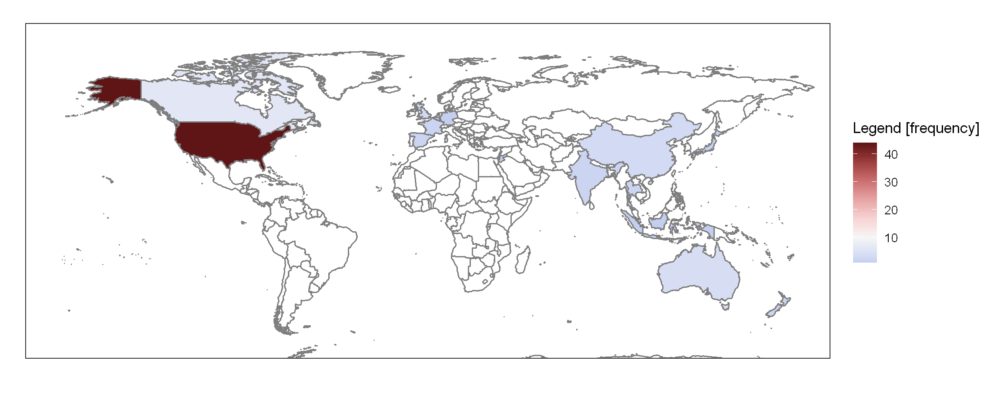

In [179]:
WorldData <- map_data('world')

ggplot() +
  geom_map(
    data = WorldData, map = WorldData,
    aes(x = long, y = lat, group = group, map_id = region),
    fill = "white", colour = "#7f7f7f", size=0.5
  ) + 
  geom_map(
    data = country.df, map=WorldData,
    aes(fill=Freq, map_id=region),
    colour="#7f7f7f", size=0.5
  ) +
  coord_map("rectangular", lat0=0, xlim=c(-180,180), ylim=c(-60, 90)) +
  # scale_fill_continuous(type = "viridis") +  # alternative scale color
  scale_fill_continuous_diverging(
    palette = "Blue-Red 3",  # rev = TRUE,
    mid = 10
  ) +  # scale color
  scale_y_continuous(breaks=c()) +
  scale_x_continuous(breaks=c()) +
  labs(fill="Legend [frequency]", x="", y="") +
  theme_bw()

### Intervention

#### Distribution

##### Meditation types

In [180]:
meditation.techniques.all.vec <- unlist(meditation.techniques.df,use.names = FALSE)  # get all elements of df
meditation.techniques.all.vec <- meditation.techniques.all.vec[which(!(
  is.na(meditation.techniques.all.vec) | meditation.techniques.all.vec %in% c("NA", "None", 'No Intervention', "Wait-List Control")
))]  # cut out NAs
meditation.techniques.all.vec <- sort(unlist(str_split(meditation.techniques.all.vec, "; "), use.names=FALSE))  # split by "; " and sort
meditation.techniques.freq.df <- data.frame(table(meditation.techniques.all.vec))  # create df of frequencies
colnames(meditation.techniques.freq.df) <- c("Meditation Techniques", "Frequency")

# recluster meditation types
other.count <- 0
open.monitoring.count <- 0
loving.kindness.count <- 0

for (med.tech in meditation.techniques.freq.df[, "Meditation Techniques"]){
  # others
  if (grepl(
    "Other: devotional readings to ponder, meditations taken from a widely used devotional book designed for Christian readers titled",
    med.tech
    ) | grepl(
    "Other: devotional readings to ponder, meditations taken from a widely used devotional book designed for Christian readers titled, forgiveness meditations",
    med.tech
    ) | grepl(
    "Other: mindfulness-based exercises through audio video or text files, grounding visualization, gratitude, imagining the life you want, finding meaning",
    med.tech
    ) | grepl(
    "Other: mindfulness toward sensations and experiences of the body, mindfulness toward the contents of the mind, skill of mental noting to label their mental contents, cultivating awareness and understanding of emotions as mental contents and the nonjudgmental stance toward emotions with a goal of optimizing the response to one’s emotions",
    med.tech
    ) | grepl(
    "Other: Readings reflecting meditative perspective",
    med.tech
  )){
    other.count <- other.count + 1
  
  # open monitoring
  } else if (grepl(
    "Other: \"awareness to any sensations in their body or in their immediate environment\", focus on \"thoughts and feelings\",  \"non-judgmental observation\"",
    med.tech
    ) | grepl(
    "Other: silent meditations with bells, personalized meditations with or without guided\nintro and bells",
    med.tech
  )){
    open.monitoring.count <- open.monitoring.count + 1
  
  # loving kindness
  } else if (grepl(
    "Other: focusing on meta-awareness, \"Mindfulness-based exercises [[]...[]] about happiness in life as the result of a benevolent attitude towards life and a positive relationship to oneself and others\", \"Methods of introspection, reflection and self-care\"",
    med.tech
  )){
    loving.kindness.count <- loving.kindness.count + 1
  }
}

# cut out others (others are not clustered properly)
meditation.techniques.freq.df <- meditation.techniques.freq.df[
  which(!grepl("Other", meditation.techniques.freq.df[,"Meditation Techniques"])),
]

# correct data types
meditation.techniques.freq.df[,"Meditation Techniques"] <- as.character(meditation.techniques.freq.df[,"Meditation Techniques"])
meditation.techniques.freq.df[,"Frequency"] <- as.double(meditation.techniques.freq.df[,"Frequency"])

# assign reclustered meditation types
meditation.techniques.freq.df[nrow(meditation.techniques.freq.df) + 1,] <- c("various techniques", other.count)  # add others' other.count

meditation.techniques.freq.df[which(meditation.techniques.freq.df[, "Meditation Techniques"] == "Open Monitoring Meditation"), "Frequency"] <-
as.double(meditation.techniques.freq.df[which(meditation.techniques.freq.df[, "Meditation Techniques"] == "Open Monitoring Meditation"), "Frequency"]) + open.monitoring.count

meditation.techniques.freq.df[which(meditation.techniques.freq.df[, "Meditation Techniques"] == "Loving-Kindness Meditation"), "Frequency"] <-
as.double(meditation.techniques.freq.df[which(meditation.techniques.freq.df[, "Meditation Techniques"] == "Loving-Kindness Meditation"), "Frequency"]) + loving.kindness.count

# sort by frequency
meditation.techniques.freq.df <- meditation.techniques.freq.df[order(-as.double(meditation.techniques.freq.df$Frequency)),]

rownames(meditation.techniques.freq.df) <- 1:nrow(meditation.techniques.freq.df)  # adjust indices
meditation.techniques.freq.df

,Meditation Techniques,Frequency
,<chr>,<chr>
1,Breathing Exercise (no further Info),49
2,Body Scan,24
3,Loving-Kindness Meditation,11
⋮,⋮,⋮
19,Vipassana,1
20,Zen Meditation,1


In [181]:
# set plot size
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 150)

In [182]:
# correct data type of $Frequency again (wasn't working above)
meditation.techniques.freq.df[,"Frequency"] <- as.double(meditation.techniques.freq.df[,"Frequency"])
meditation.techniques.freq.df

,Meditation Techniques,Frequency
,<chr>,<dbl>
1,Breathing Exercise (no further Info),49
2,Body Scan,24
3,Loving-Kindness Meditation,11
⋮,⋮,⋮
19,Vipassana,1
20,Zen Meditation,1


In [183]:
meditation.techniques.freq.df[1,"Meditation Techniques"] <- str_to_lower("Breathing Exercise")

In [184]:
# correct spelling
i <- 1
for (med.tech in meditation.techniques.freq.df[, "Meditation Techniques"]){
  meditation.techniques.freq.df[i,"Meditation Techniques"] <- str_to_lower(meditation.techniques.freq.df[i,"Meditation Techniques"])  # convert strings to lower case
  meditation.techniques.freq.df[i,"Meditation Techniques"] <- gsub("\"", "'", meditation.techniques.freq.df[i,"Meditation Techniques"])  # replace " with '
  i <- i + 1
}

meditation.techniques.freq.df <- replace_val_in_df(
  df = meditation.techniques.freq.df, col = 1,
  search = "transcendental meditation", replace = "transcendental meditation"
)

meditation.techniques.freq.df <- replace_val_in_df(
  df = meditation.techniques.freq.df, col = 1,
  search = "only 'mindfulness meditation' named", replace = "'mindfulness meditation'"
)

meditation.techniques.freq.df <- replace_val_in_df(
  df = meditation.techniques.freq.df, col = 1,
  search = "only 'focused attention meditation' named", replace = "'focused attention meditation'"
)

meditation.techniques.freq.df <- replace_val_in_df(
  df = meditation.techniques.freq.df, col = 1,
  search = "breathing exercise", replace = "breathing exercise"
)

meditation.techniques.freq.df

,Meditation Techniques,Frequency
,<chr>,<dbl>
1,breathing exercise,49
2,body scan,24
3,loving-kindness meditation,11
⋮,⋮,⋮
19,vipassana,1
20,zen meditation,1


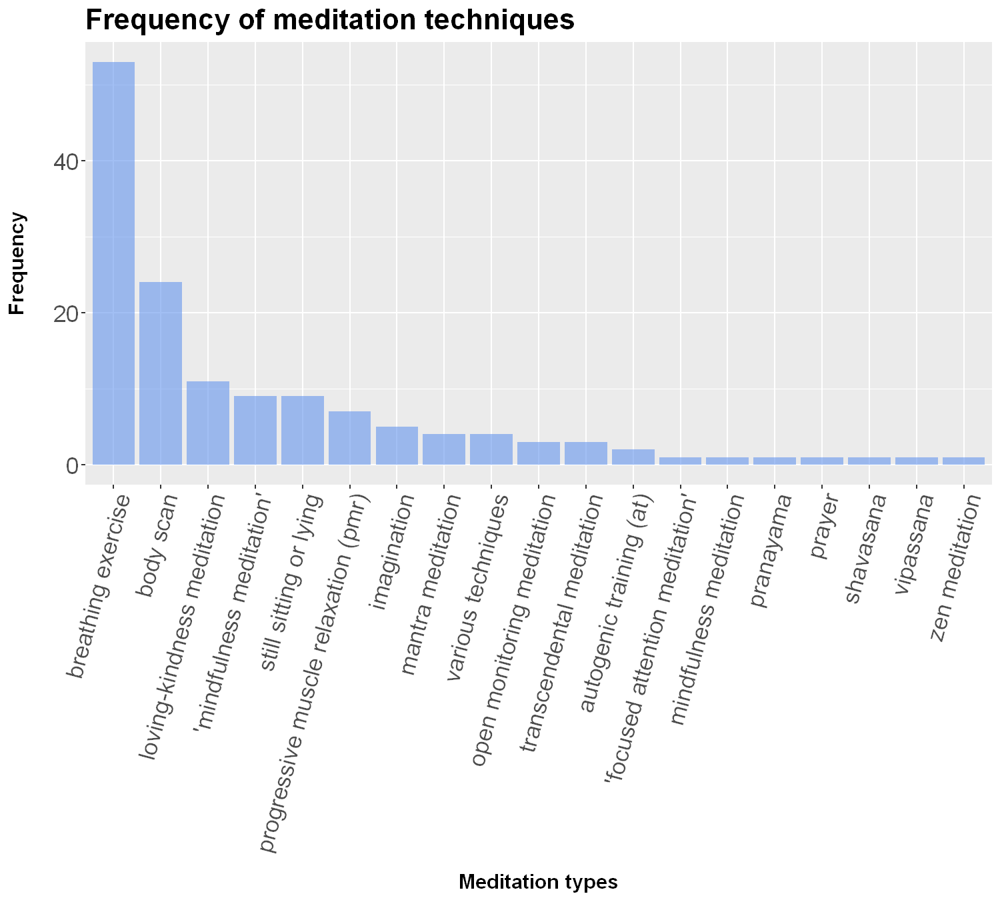

In [185]:
ggplot(meditation.techniques.freq.df, aes(x = reorder(`Meditation Techniques`, -Frequency), y = Frequency)) +
  geom_bar(stat="identity", fill = "cornflowerblue", alpha = 0.6) +
  theme(
    title = element_text(size = 17, face = "bold"),
    axis.title = element_text(size = 15, face = "bold"),
    axis.text.x = element_text(angle=75, vjust=1, hjust=1, size = 17),
    axis.text.y = element_text(size = 17)
  ) +
  labs(
    title = "Frequency of meditation techniques",
    x = "\nMeditation types",
    y = "Frequency\n"
  )
# others are not clustered properly --> statistic is biased

##### Meditation families

In [186]:
# do same for meditation families
meditation.type.attentional.freq <- 0
meditation.type.constructive.freq <- 0
meditation.type.deconstructive.freq <- 0

for (col in 1:ncol(meditation.techniques.df)){
  for (row in 1:nrow(meditation.techniques.df)){
    med.tech <- meditation.techniques.df[row, col]
    
    if (med.tech %in% meditation.type.all.list[[1]]){
      meditation.type.attentional.freq <- meditation.type.attentional.freq + 1
    } else if (med.tech %in% meditation.type.all.list[[2]]){
      meditation.type.constructive.freq <- meditation.type.constructive.freq + 1
    } else if (med.tech %in% meditation.type.all.list[[3]]){
      meditation.type.attentional.freq <- meditation.type.attentional.freq + 1
      meditation.type.constructive.freq <- meditation.type.constructive.freq + 1
    } else if (med.tech %in% meditation.type.all.list[[4]]){
      meditation.type.attentional.freq <- meditation.type.attentional.freq + 1
      meditation.type.deconstructive.freq <- meditation.type.deconstructive.freq + 1
    } else if (med.tech %in% meditation.type.all.list[[5]]){
      meditation.type.attentional.freq <- meditation.type.attentional.freq + 1
      meditation.type.constructive.freq <- meditation.type.constructive.freq + 1
      meditation.type.deconstructive.freq <- meditation.type.deconstructive.freq + 1
    } else if (med.tech %in% meditation.type.all.list[[6]]){
      meditation.type.deconstructive.freq <- meditation.type.deconstructive.freq + 1
    }
  }
}

meditation.families.count.df <- data.frame(
  `Meditation Families` = c(
    "attentional familiy", "constructive family", "deconstructive familiy"
  ),
  Frequency = c(
    meditation.type.attentional.freq, meditation.type.constructive.freq, meditation.type.deconstructive.freq
  )
)
meditation.families.count.df <- meditation.families.count.df[order(meditation.families.count.df$Frequency),]
meditation.families.count.df

,Meditation.Families,Frequency
,<chr>,<dbl>
3,deconstructive familiy,6
2,constructive family,21
1,attentional familiy,98


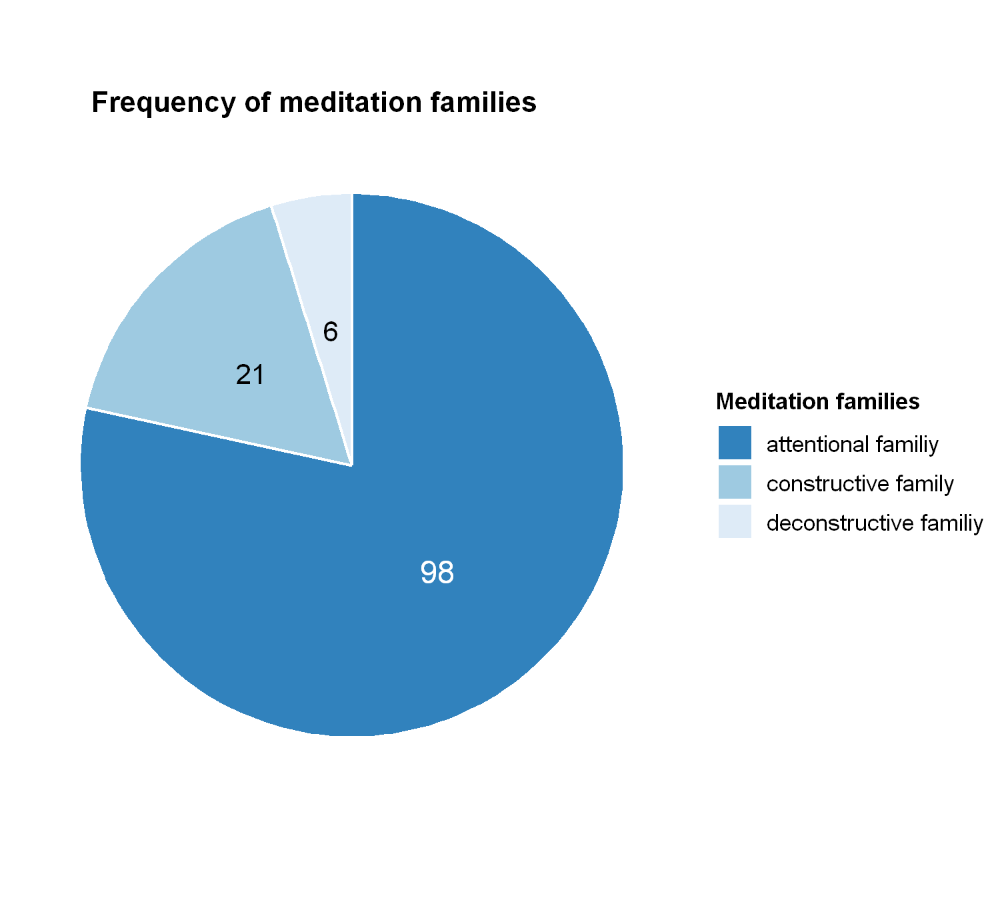

In [187]:
ggplot(meditation.families.count.df, aes(x = "", y = Frequency, fill=reorder(Meditation.Families, Frequency))) +
  geom_bar(stat="identity", color = "white", width=1, size = 0.9) +
  coord_polar("y", start=0) +
  geom_text(
    aes(label = Frequency),
    position = position_stack(vjust=0.5),
    col = c(rep("black", 2), "white"),
    size = c(rep(7, 2), 8)
  ) +  #text within pie pieces
  guides(fill = guide_legend(reverse = TRUE, override.aes = list(size = 10))) +  # reverse legend order
  labs(
    title = "          Frequency of meditation families",
    x = NULL, y = NULL, fill = "Meditation families"
  ) +  # labels
  theme_classic() +
  theme(
    title = element_text(size = 17, face = "bold"),
    axis.line = element_blank(),
    axis.text = element_blank(),
    axis.ticks = element_blank(),
    legend.text = element_text(size = 17),
    legend.title = element_text(size = 17)
  ) +  # adjust texts
  scale_fill_brewer(palette="Blues")  # set color palette

##### Intervention Characteristics

In [188]:
# Function | Get intervention characteristics by study
get.int.char.by.stud <- function(study.names.vec){
  # calculate mean sd and range of sessions' duration and frequency and programs duration
  sessions.durations.vec <- c()
  sessions.durations.report.count <- c()

  sessions.frequencies.vec <- c()
  sessions.frequencies.report.count <- c()

  programs.durations.vec <- c()
  programs.durations.report.count <- c()

  for (study in 1:study.no){
    
    # skip if study number is not presnet in study.names
    if (!study %in% which(study.names %in% study.names.vec)){
      next
    }
    
    df <- intervention.comparisons.df.list[[study]]

    sessions.durations.report.count <- append(
      sessions.durations.report.count,
      ifelse(
        F %in% is.na.or.nm(df[, "Sessions.Duration.in.minutes"]),
        1, 0
      )
    )

    sessions.frequencies.report.count <- append(
      sessions.frequencies.report.count,
      ifelse(
        F %in% is.na.or.nm(df[, "Frequency.in.times.per.week"]),
        1, 0
      )
    )

    programs.durations.report.count <- append(
      programs.durations.report.count,
      ifelse(
        F %in% is.na.or.nm(df[, "Total.Duration.in.Days"]),
        1, 0
      )
    )

    for (row in 1:nrow(df)){
      sessions.duration <- ifelse(is.na.or.nm(df[row, "Sessions.Duration.in.minutes"]), NA, df[row, "Sessions.Duration.in.minutes"])
      sessions.durations.vec <- append(sessions.durations.vec, sessions.duration)

      sessions.frequency <- ifelse(is.na.or.nm(df[row, "Frequency.in.times.per.week"]), NA, df[row, "Frequency.in.times.per.week"])
      sessions.frequencies.vec <- append(sessions.frequencies.vec, sessions.frequency)

      programs.duration <- ifelse(is.na.or.nm(df[row, "Total.Duration.in.Days"]), NA, df[row, "Total.Duration.in.Days"])
      programs.durations.vec <- append(programs.durations.vec, programs.duration)
    }
  }

  sessions.duration.mean.total <- round(mean(sessions.durations.vec, na.rm = T), digits = 2)
  sessions.duration.sd.total <- round(sd(sessions.durations.vec, na.rm = T), digits = 2)
  sessions.duration.range.total <- paste(as.character(c(min(sessions.durations.vec, na.rm = T), max(sessions.durations.vec, na.rm = T))), collapse = ", ")

  sessions.frequency.mean.total <- round(mean(sessions.frequencies.vec, na.rm = T), digits = 2)
  sessions.frequency.sd.total <- round(sd(sessions.frequencies.vec, na.rm = T), digits = 2)
  sessions.frequency.range.total <- paste(as.character(c(min(sessions.frequencies.vec, na.rm = T), max(sessions.frequencies.vec, na.rm = T))), collapse = ", ")

  programs.duration.mean.total <- round(mean(programs.durations.vec, na.rm = T), digits = 2)
  programs.duration.sd.total <- round(sd(programs.durations.vec, na.rm = T), digits = 2)
  programs.duration.range.total <- paste(as.character(c(min(programs.durations.vec, na.rm = T), max(programs.durations.vec, na.rm = T))), collapse = ", ")

  intervention.characteristics.descriptive.df <- data.frame(
    Mean = c(sessions.duration.mean.total, sessions.frequency.mean.total, programs.duration.mean.total),
    SD = c(sessions.duration.sd.total, sessions.frequency.sd.total, programs.duration.sd.total),
    Range = c(sessions.duration.range.total, sessions.frequency.range.total, programs.duration.range.total),
    `Percentage of reporting studies` = round(
      c(sum(sessions.durations.report.count), sum(sessions.frequencies.report.count), sum(programs.durations.report.count)) / length(study.names.vec) * 100,
      digits = 2
    ),
    row.names = list("Sessions' Duration [minutes]", "Sessions' Frequency [1/week]", "Interventions' Duration [days]")
  )
  intervention.characteristics.descriptive.df
}

In [189]:
# calculate mean sd and range of sessions' duration and frequency and programs duration
sessions.durations.vec <- c()
sessions.durations.report.count <- c()

sessions.frequencies.vec <- c()
sessions.frequencies.report.count <- c()

programs.durations.vec <- c()
programs.durations.report.count <- c()

for (study in 1:study.no){
  df <- intervention.comparisons.df.list[[study]]
  
  sessions.durations.report.count <- append(
    sessions.durations.report.count,
    ifelse(
      F %in% is.na.or.nm(df[, "Sessions.Duration.in.minutes"]),
      1, 0
    )
  )
  
  sessions.frequencies.report.count <- append(
    sessions.frequencies.report.count,
    ifelse(
      F %in% is.na.or.nm(df[, "Frequency.in.times.per.week"]),
      1, 0
    )
  )
  
  programs.durations.report.count <- append(
    programs.durations.report.count,
    ifelse(
      F %in% is.na.or.nm(df[, "Total.Duration.in.Days"]),
      1, 0
    )
  )
  
  for (row in 1:nrow(df)){
    sessions.duration <- ifelse(is.na.or.nm(df[row, "Sessions.Duration.in.minutes"]), NA, df[row, "Sessions.Duration.in.minutes"])
    sessions.durations.vec <- append(sessions.durations.vec, sessions.duration)
    
    sessions.frequency <- ifelse(is.na.or.nm(df[row, "Frequency.in.times.per.week"]), NA, df[row, "Frequency.in.times.per.week"])
    sessions.frequencies.vec <- append(sessions.frequencies.vec, sessions.frequency)
    
    programs.duration <- ifelse(is.na.or.nm(df[row, "Total.Duration.in.Days"]), NA, df[row, "Total.Duration.in.Days"])
    programs.durations.vec <- append(programs.durations.vec, programs.duration)
  }
}

sessions.duration.mean.total <- round(mean(sessions.durations.vec, na.rm = T), digits = 2)
sessions.duration.sd.total <- round(sd(sessions.durations.vec, na.rm = T), digits = 2)
sessions.duration.range.total <- paste(as.character(c(min(sessions.durations.vec, na.rm = T), max(sessions.durations.vec, na.rm = T))), collapse = ", ")

sessions.frequency.mean.total <- round(mean(sessions.frequencies.vec, na.rm = T), digits = 2)
sessions.frequency.sd.total <- round(sd(sessions.frequencies.vec, na.rm = T), digits = 2)
sessions.frequency.range.total <- paste(as.character(c(min(sessions.frequencies.vec, na.rm = T), max(sessions.frequencies.vec, na.rm = T))), collapse = ", ")

programs.duration.mean.total <- round(mean(programs.durations.vec, na.rm = T), digits = 2)
programs.duration.sd.total <- round(sd(programs.durations.vec, na.rm = T), digits = 2)
programs.duration.range.total <- paste(as.character(c(min(programs.durations.vec, na.rm = T), max(programs.durations.vec, na.rm = T))), collapse = ", ")

intervention.characteristics.descriptive.df <- data.frame(
  Mean = c(sessions.duration.mean.total, sessions.frequency.mean.total, programs.duration.mean.total),
  SD = c(sessions.duration.sd.total, sessions.frequency.sd.total, programs.duration.sd.total),
  Range = c(sessions.duration.range.total, sessions.frequency.range.total, programs.duration.range.total),
  `Percentage of reporting studies` = round(
    c(sum(sessions.durations.report.count), sum(sessions.frequencies.report.count), sum(programs.durations.report.count)) / study.no * 100,
    digits = 2
  ),
  row.names = list("Sessions' Duration [minutes]", "Sessions' Frequency [1/week]", "Interventions' Duration [days]")
)
intervention.characteristics.descriptive.df

Warning message in mean.default(sessions.durations.vec, na.rm = T):
"argument is not numeric or logical: returning NA"
Warning message in var(if (is.vector(x) || is.factor(x)) x else as.double(x), na.rm = na.rm):
"NAs introduced by coercion"
Warning message in mean.default(sessions.frequencies.vec, na.rm = T):
"argument is not numeric or logical: returning NA"
Warning message in var(if (is.vector(x) || is.factor(x)) x else as.double(x), na.rm = na.rm):
"NAs introduced by coercion"


,Mean,SD,Range,Percentage.of.reporting.studies
,<dbl>,<dbl>,<chr>,<dbl>
Sessions' Duration [minutes],NA,18.42,"10, 90",80.68
Sessions' Frequency [1/week],NA,3.30,"0.714, 9",71.59
Interventions' Duration [days],21.42,27.17,"0, 152",96.59


In [190]:
length(sessions.durations.vec[!is.na.or.nm(sessions.durations.vec)])
length(sessions.frequencies.vec[!is.na.or.nm(sessions.frequencies.vec)])
length(programs.durations.vec[!is.na.or.nm(programs.durations.vec)])

[1] 139

[1] 133

[1] 180

### Outcomes

###### Outcome numbers

In [191]:
outcomes.no.ordered.freq.df <- outcomes.no.df[order(-outcomes.no.df$Freq),]
colnames(outcomes.no.ordered.freq.df) <- c("Outcome", "Frequency")

studies.suff.data.pas.vec <- c()
studies.suff.data.pas.num <- 0

studies.suff.data.act.vec <- c()
studies.suff.data.act.num <- 0

studies.suff.data.mix.vec <- c()
studies.suff.data.mix.num <- 0


i <- 1
for (outcome in outcomes.no.ordered.freq.df$Outcome){
  # get studies that supply sufficient data for outcomes to caclulate meta-analyses for comparison to passive controls
  uni.stud.p.outcome.pas <- unique(
    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
      return.data = "meta.df.list"
    )[[1]][,1]
  )
  
  # get the same for all active control groups
  uni.stud.p.outcome.act <- unique(
    meta.analyze(
      outcome, meditation.type.all, m.data.list, preferred.scale = get.1st.preferred.scale(outcome), comparison.list = list(meditation.type.all, control.all.active),
      split.subgroups = F, return.data = "meta.df.list"
    )[[1]][,1]
  )
  
  uni.stud.p.outcome.pas.only <- uni.stud.p.outcome.pas[!uni.stud.p.outcome.pas %in% uni.stud.p.outcome.act]
  uni.stud.p.outcome.act.only <- uni.stud.p.outcome.act[!uni.stud.p.outcome.act %in% uni.stud.p.outcome.pas]
  uni.stud.p.outcome.mixed <- uni.stud.p.outcome.pas[uni.stud.p.outcome.pas %in% uni.stud.p.outcome.act]
  
  # insert number of these studies into df
  outcomes.no.ordered.freq.df[i, "Frequency sufficient data passive only"] <- length(uni.stud.p.outcome.pas.only)
  outcomes.no.ordered.freq.df[i, "Frequency sufficient data active only"] <- length(uni.stud.p.outcome.act.only)
  outcomes.no.ordered.freq.df[i, "Frequency sufficient data mixed"] <- length(uni.stud.p.outcome.mixed)
  
  # count number of studies that deliver sufficient data
  ## for passive only
  ### count
  for (study in uni.stud.p.outcome.pas.only){
    if (!study %in% studies.suff.data.pas.vec){
      studies.suff.data.pas.num <- studies.suff.data.pas.num + 1
    }
  }
  
  #### add study names to vec
  studies.suff.data.pas.vec <- append(studies.suff.data.pas.vec, uni.stud.p.outcome.pas)
  
  ## for passive only
  ### count
  for (study in uni.stud.p.outcome.act.only){
    if (!study %in% studies.suff.data.act.vec){
      studies.suff.data.act.num <- studies.suff.data.act.num + 1
    }
  }
  
  ### add study names to vec
  studies.suff.data.act.vec <- append(studies.suff.data.act.vec, uni.stud.p.outcome.act)
  
  ## for actvie and passive controls
  ### count
  for (study in uni.stud.p.outcome.mixed){
    if (!study %in% studies.suff.data.mix.vec){
      studies.suff.data.mix.num <- studies.suff.data.mix.num + 1
    }
  }
  
  ### add study names to vec
  studies.suff.data.mix.vec <- append(studies.suff.data.mix.vec, uni.stud.p.outcome.mixed)
  
  i <- i + 1
}

outcomes.no.ordered.freq.df$Outcome <- str_to_lower(as.character(outcomes.no.ordered.freq.df$Outcome))

outcomes.no.ordered.freq.df


# Anxiety ----------------------------------

# Stress ----------------------------------

# Mindfulness ----------------------------------

# Depression ----------------------------------

# Positive affect ----------------------------------
no studies included for outcome: Positive affect 


# Well-being ----------------------------------

# Self-compassion ----------------------------------

# Resilience Scale ----------------------------------

# Empathy ----------------------------------
no studies included for outcome: Empathy 


# Positive emotion ----------------------------------

# Self-efficacy ----------------------------------
no studies included for outcome: Self-efficacy 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 

no studies included for outcome: Acceptance 


# Active coping ----------------------------------
no studies included for outcome: Active coping 


# Cognitive control ----------------------------------
no s

,Outcome,Frequency,Frequency sufficient data passive only,Frequency sufficient data active only,Frequency sufficient data mixed
,<chr>,<int>,<int>,<int>,<int>
3,anxiety,50,10,14,4
18,stress,45,14,9,4
8,mindfulness,32,9,9,1
⋮,⋮,⋮,⋮,⋮,⋮
14,self-acceptance,1,1,0,0
17,self-esteem,1,0,0,0


In [192]:
# total freq of outcomes
outcomes.no.ordered.freq.plot.df <- outcomes.no.ordered.freq.df[,c(1,2)]

# freq of outcomes with sufficient data for active/passive controls and both respecitvely
outcomes.no.ordered.suff.dat.pas.plot.df <- outcomes.no.ordered.freq.df[,c(1,3)]
outcomes.no.ordered.suff.dat.act.plot.df <- outcomes.no.ordered.freq.df[,c(1,4)]
outcomes.no.ordered.suff.dat.mix.plot.df <- outcomes.no.ordered.freq.df[,c(1,5)]

# rename cols
names(outcomes.no.ordered.suff.dat.pas.plot.df) <- c("Outcome", "Frequency")
names(outcomes.no.ordered.suff.dat.act.plot.df) <- c("Outcome", "Frequency")
names(outcomes.no.ordered.suff.dat.mix.plot.df) <- c("Outcome", "Frequency")

# add col telling for what sufficient data is present
outcomes.no.ordered.suff.dat.pas.plot.df$`Sufficient data for meta-analysis` <- "04_for_passive_controls_only"
 
outcomes.no.ordered.suff.dat.act.plot.df$`Sufficient data for meta-analysis` <- "02_for_active_controls_only"

outcomes.no.ordered.suff.dat.mix.plot.df$`Sufficient data for meta-analysis` <- "03_for_active_and_passive_controls"

# df with freq of no sufficient data
outcomes.no.ordered.freq.plot.df$Frequency <- outcomes.no.ordered.freq.plot.df$Frequency - (
  outcomes.no.ordered.suff.dat.pas.plot.df$Frequency + outcomes.no.ordered.suff.dat.act.plot.df$Frequency + outcomes.no.ordered.suff.dat.mix.plot.df$Frequency
)

outcomes.no.ordered.freq.plot.df$`Sufficient data for meta-analysis` <- "01_for_no_case"


# outcomes.no.ordered.suff.dat.plot.df$Frequency <- outcomes.no.ordered.freq.plot.df$Frequency - (outcomes.no.ordered.freq.plot.df$Frequency - outcomes.no.ordered.suff.dat.plot.df$Frequency)

# bring all dfs together
outcomes.no.ordered.freq.plot.df <- rbind(
  outcomes.no.ordered.freq.plot.df,
  outcomes.no.ordered.suff.dat.act.plot.df,
  outcomes.no.ordered.suff.dat.mix.plot.df,
  outcomes.no.ordered.suff.dat.pas.plot.df
)

# rename rownames
rownames(outcomes.no.ordered.freq.plot.df) <- 1:nrow(outcomes.no.ordered.freq.plot.df)


# outcomes.no.ordered.freq.plot.df$`Sufficient data for meta-analysis` <- NA
# outcomes.no.ordered.freq.plot.df[1:(nrow(outcomes.no.ordered.freq.plot.df)/2),"Sufficient data for meta-analysis"] <- "yes"
# outcomes.no.ordered.freq.plot.df[20:nrow(outcomes.no.ordered.freq.plot.df), "Sufficient data for meta-analysis"] <- "no"

outcomes.no.ordered.freq.plot.df

,Outcome,Frequency,Sufficient data for meta-analysis
,<chr>,<int>,<chr>
1,anxiety,22,01_for_no_case
2,stress,18,01_for_no_case
3,mindfulness,13,01_for_no_case
⋮,⋮,⋮,⋮
75,self-acceptance,1,04_for_passive_controls_only
76,self-esteem,0,04_for_passive_controls_only


In [193]:
# create labels shown in outcome frequency plots
outcome.freq.labels <- c()
iter.count <- nrow(outcomes.no.ordered.freq.plot.df)
for (i in 1:iter.count){
  freq <- outcomes.no.ordered.freq.plot.df[i,"Frequency"]
  if (freq %in% c(0, 1)){
    freq <- ""
  }
  outcome.freq.labels <- append(
    outcome.freq.labels,
    freq
  )
}
outcome.freq.labels

[1] "22" "18" "13" "9"  "5"  "7"  "3"  ""   "2"  ""   ""   ""   ""   ""   ""  
[16] ""   ""   ""   ""   "14" "9"  "9"  "6"  "9"  ""   ""   "2"  ""   ""   ""  
[31] ""   ""   ""   ""   ""   ""   ""   ""   "4"  "4"  ""   "2"  ""   ""   ""  
[46] ""   ""   ""   ""   ""   ""   ""   ""   ""   ""   ""   ""   "10" "14" "9" 
[61] "10" ""   "5"  "2"  "2"  ""   ""   ""   ""   ""   ""   ""   ""   ""   ""  
[76] ""

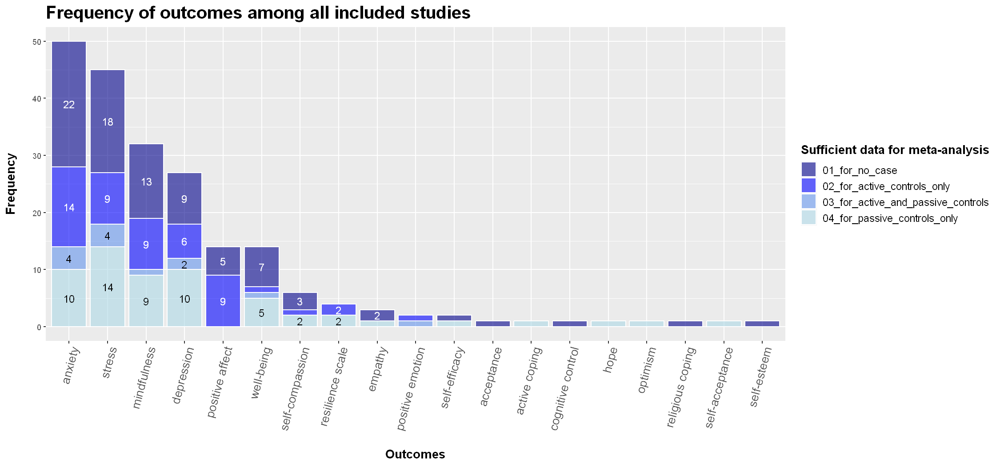

In [194]:
# set plot size
options(repr.plot.width = 15, repr.plot.height = 7, repr.plot.res = 150)

row.no <- nrow(outcomes.no.ordered.freq.plot.df)
ggplot(outcomes.no.ordered.freq.plot.df, aes(x = reorder(Outcome, -Frequency), y = Frequency, fill = `Sufficient data for meta-analysis`)) +
  geom_bar(stat="identity", alpha = 0.6, colour = "white") +
  geom_text(
    aes(label = outcome.freq.labels),
    position = position_stack(vjust=0.5),
    color = c(rep("white", length(outcome.freq.labels) / 2), rep("black", length(outcome.freq.labels) / 2))
  ) + 
  theme(
    title = element_text(size = 16, face = "bold"),
    legend.title = element_text(size = 13, face = "bold"),
    legend.text = element_text(size = 11),
    axis.title = element_text(size = 13, face = "bold"),
    axis.text.x = element_text(angle=75, vjust=1, hjust=1, size = 13)
  ) +
  labs(
    title = "Frequency of outcomes among all included studies",
    x = "\nOutcomes",
    y = "Frequency\n"
  ) +
  scale_fill_manual(values=c("darkblue", "blue","cornflowerblue", "lightblue"))

###### Participants per outcome (only passive controls)

In [195]:
# participants per outcomes (with and without outliers)
part.p.group.p.outcome.df <- data.frame(
  Experimental.group = rep(NA, length(present.outcomes)),
  Experimental.group.no.outl. = rep(NA, length(present.outcomes)),
  Control.group = rep(NA, length(present.outcomes)),
  Control.group.no.outl. = rep(NA, length(present.outcomes)),
  Total = rep(NA, length(present.outcomes)),
  Total.no.outl. = rep(NA, length(present.outcomes)),
  row.names = present.outcomes.sorted
)

for (outcome in present.outcomes.sorted){
  # get data without outliers
  outliers <- outlier.list[[outcome]]
  results.meta.wo.o <-  print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta", filter.forest..funnel.vec = if(length(outliers) != 0){-outliers}else{FALSE}
  )
  n.e.wo.o <- if(results.meta.wo.o$k == 0){0}else{results.meta.wo.o$n.e.pooled}
  n.c.wo.o <- if(results.meta.wo.o$k == 0){0}else{results.meta.wo.o$n.c.pooled}
  part.p.group.p.outcome.df[outcome, "Experimental.group.no.outl."] <- n.e.wo.o
  part.p.group.p.outcome.df[outcome, "Control.group.no.outl."] <- n.c.wo.o
  part.p.group.p.outcome.df[outcome, "Total.no.outl."] <- n.e.wo.o + n.c.wo.o
  
  # get data with outliers included
  results.meta.w.o <-  print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )
  n.e.w.o <- if(results.meta.w.o$k == 0){0}else{results.meta.w.o$n.e.pooled}
  n.c.w.o <- if(results.meta.w.o$k == 0){0}else{results.meta.w.o$n.c.pooled}
  part.p.group.p.outcome.df[outcome, "Experimental.group"] <- n.e.w.o
  part.p.group.p.outcome.df[outcome, "Control.group"] <- n.c.w.o
  part.p.group.p.outcome.df[outcome, "Total"] <- n.c.w.o + n.e.w.o
}

# add row with sums
part.p.group.p.outcome.df <- rbind(
  part.p.group.p.outcome.df,
  data.frame(
    part.p.group.p.outcome.df %>%
      summarise(across(everything(), ~ sum(., na.rm = TRUE))),
    row.names = "Sum"
  )
)
part.p.group.p.outcome.df


# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Active coping ----------------------------------

# Active coping ----------------------------------

# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 


# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 



,Experimental.group,Experimental.group.no.outl.,Control.group,⋯,Total,Total.no.outl.
,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>
Resilience Scale,58,58,56,⋯,114,114
Anxiety,661,637,657,⋯,1318,1262
Depression,536,506,526,⋯,1062,1002
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Self-esteem,0,0,0,⋯,0,0
Sum,3160,2993,3187,⋯,6347,6023


In [196]:
part.p.group.p.outcome.df$Outcomes <- rownames(part.p.group.p.outcome.df)
part.p.group.p.outcome.df <- part.p.group.p.outcome.df %>%
  relocate(Outcomes)
part.p.group.p.outcome.df

,Outcomes,Experimental.group,Experimental.group.no.outl.,⋯,Total,Total.no.outl.
,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>
Resilience Scale,Resilience Scale,58,58,⋯,114,114
Anxiety,Anxiety,661,637,⋯,1318,1262
Depression,Depression,536,506,⋯,1062,1002
⋮,⋮,⋮,⋮,⋱,⋮,⋮
Self-esteem,Self-esteem,0,0,⋯,0,0
Sum,Sum,3160,2993,⋯,6347,6023


### Number of studies delivering sufficient data for meta-analyses

In [197]:
# all studies
study.no; study.names

[1] 88

[1] "Alhawatmeh 2022"          "Archary 2021"            
 [3] "Aspy 2017"                "Barbera 2025"            
 [5] "Barry 2019"               "Bonamo 2015"             
 [7] "Bultas 2021"              "Chen 2013"               
 [9] "Chow 2017"                "Clinton 2018"            
[11] "Dambrun 2023"             "Dawson 2014"             
[13] "Devillers-Réolon 2022"    "Dillbeck 1977"           
[15] "Dorais 2021"              "Fish 2019"               
[17] "Flett 2019b"              "Flett 2019a"             
[19] "Forsyth 2017"             "Gallagher 2022"          
[21] "Grogan 2025"              "Gupta 2020"              
[23] "Gutierrez 2024"           "Heath 2022"              
[25] "Heinrich 2023"            "Hirshberg 2018"          
[27] "Holden 2022"              "Holden 2023"             
[29] "Holland 2017"             "Huberty 2019"            
[31] "Ilies 2019"               "Janowiak 1994"           
[33] "Johnson-Waddell 2018"     "Karing 2024"             
[35] "Kim 2021"                 "Kinney 2022"             
[37] "Kirby 2021"               "Klempel 2019"            
[39] "Klibert 2022"             "Komariah 2022"           
[41] "Lancaster 2016"           "Lee 2018"                
[43] "Liu 2022"                 "Mantzios 2021"           
[45] "Messer 2016"              "Miller 2021"             
[47] "Moreno-Gómez 2023"        "Nath 2023"               
[49] "Nidich 2009"              "Nolan 2020"              
[51] "Oman 2007"                "OrtizCastro 2025"        
[53] "Ovadia-Blechman 2022"     "Paholpak 2012"           
[55] "Philips 2019"             "Pilcher 2025b"           
[57] "Pilcher 2025a"            "Plummer 2018"            
[59] "Pogrebtsova 2022"         "Ramsburg 2014"           
[61] "Ratanasiripong 2015"      "Rausch 2006"             
[63] "Sakakibara 1994"          "Schulte-Frankenfeld 2021"
[65] "Shenesey 2014"            "Shinde 2021"             
[67] "Siembor 2018"             "Silvestre-López 2021"    
[69] "Slater 2015"              "Sloan 2016"              
[71] "Smith 2021"               "Spruin 2021"             
[73] "Stefanelli 2025"          "Strait 2020"             
[75] "Sunita 2022"              "Tanner 2009"             
[77] "Tloczynski 1994"          "Toole 2016"              
[79] "Tsai 2017"                "Vasiliauskas 2013"       
[81] "Waechter 2021"            "Wang 2021"               
[83] "Wang 2023"                "Warnecke 2011"           
[85] "Weytens 2014"             "Xu 2025"                 
[87] "Zeidan 2010"              "deGrace 1976"

In [198]:
# see calculation at ###### Outcome numbers
# studies with sufficient data with passive controls only
studies.suff.data.pas.num; unique(studies.suff.data.pas.vec)

# studies with sufficient data with active controls only
studies.suff.data.act.num; unique(studies.suff.data.act.vec)

# studies with sufficient data with active and passive controls
studies.suff.data.mix.num; unique(studies.suff.data.mix.vec)

# Number of studies with sufficient data for either active or passive controls
unique(c(studies.suff.data.pas.vec, studies.suff.data.act.vec)) %>% length();
unique(c(studies.suff.data.pas.vec, studies.suff.data.act.vec))

[1] 22

[1] "Waechter 2021"            "Smith 2021"              
 [3] "Chen 2013"                "Ratanasiripong 2015"     
 [5] "Komariah 2022"            "Lee 2018"                
 [7] "Barry 2019"               "Grogan 2025"             
 [9] "Wang 2021"                "OrtizCastro 2025"        
[11] "Warnecke 2011"            "Nolan 2020"              
[13] "Devillers-Réolon 2022"    "Tloczynski 1994"         
[15] "Messer 2016"              "Sloan 2016"              
[17] "Schulte-Frankenfeld 2021" "Huberty 2019"            
[19] "Weytens 2014"             "Siembor 2018"            
[21] "Dorais 2021"              "Bultas 2021"             
[23] "Johnson-Waddell 2018"     "Tanner 2009"             
[25] "Bonamo 2015"              "deGrace 1976"            
[27] "Toole 2016"               "Vasiliauskas 2013"

[1] 24

[1] "Spruin 2021"          "Zeidan 2010"          "Holden 2023"         
 [4] "Holden 2022"          "Heinrich 2023"        "Wang 2021"           
 [7] "Waechter 2021"        "Silvestre-López 2021" "Heath 2022"          
[10] "Flett 2019b"          "Flett 2019a"          "Karing 2024"         
[13] "Kim 2021"             "Shenesey 2014"        "Lancaster 2016"      
[16] "Ratanasiripong 2015"  "Dillbeck 1977"        "Tloczynski 1994"     
[19] "Archary 2021"         "Messer 2016"          "Weytens 2014"        
[22] "Wang 2023"            "Gallagher 2022"       "Liu 2022"            
[25] "Slater 2015"          "Klempel 2019"         "Klibert 2022"        
[28] "Ramsburg 2014"        "Tsai 2017"            "Aspy 2017"

[1] 6

[1] "Waechter 2021"       "Ratanasiripong 2015" "Wang 2021"          
[4] "Tloczynski 1994"     "Messer 2016"         "Weytens 2014"

[1] 52

[1] "Waechter 2021"            "Smith 2021"              
 [3] "Chen 2013"                "Ratanasiripong 2015"     
 [5] "Komariah 2022"            "Lee 2018"                
 [7] "Barry 2019"               "Grogan 2025"             
 [9] "Wang 2021"                "OrtizCastro 2025"        
[11] "Warnecke 2011"            "Nolan 2020"              
[13] "Devillers-Réolon 2022"    "Tloczynski 1994"         
[15] "Messer 2016"              "Sloan 2016"              
[17] "Schulte-Frankenfeld 2021" "Huberty 2019"            
[19] "Weytens 2014"             "Siembor 2018"            
[21] "Dorais 2021"              "Bultas 2021"             
[23] "Johnson-Waddell 2018"     "Tanner 2009"             
[25] "Bonamo 2015"              "deGrace 1976"            
[27] "Toole 2016"               "Vasiliauskas 2013"       
[29] "Spruin 2021"              "Zeidan 2010"             
[31] "Holden 2023"              "Holden 2022"             
[33] "Heinrich 2023"            "Silvestre-López 2021"    
[35] "Heath 2022"               "Flett 2019b"             
[37] "Flett 2019a"              "Karing 2024"             
[39] "Kim 2021"                 "Shenesey 2014"           
[41] "Lancaster 2016"           "Dillbeck 1977"           
[43] "Archary 2021"             "Wang 2023"               
[45] "Gallagher 2022"           "Liu 2022"                
[47] "Slater 2015"              "Klempel 2019"            
[49] "Klibert 2022"             "Ramsburg 2014"           
[51] "Tsai 2017"                "Aspy 2017"

# Sensitivity Analysis

In [199]:
# install.packages("gt")  # <-- manipulating table apperance
# install phantomjs <-- for saving tables as pictures
# install.packages("webshot2")
# webshot::install_phantomjs()
# install.packages("rmarkdown")  # <-- for saving table as docx
library(webshot2)
library(gt)
library(rmarkdown)

Warning message:
"package 'webshot2' was built under R version 4.3.1"


Warning message:
"package 'gt' was built under R version 4.3.2"
Warning message:
"package 'rmarkdown' was built under R version 4.3.2"


## Get all present outcomes names with sufficient data and passive controls and plots for outcomes in loop

In [200]:
#
present.outcomes.passive <- c()

overall.res.metafor.passive <- get.overall.res.metafor()
study.names.suff.data.passive <- unique(overall.res.metafor.passive$data$study.id)

outcome.names.df.passive <- outcome.names.df[study.names.suff.data.passive,]

for (row in 1:nrow(outcome.names.df.passive)){
  for (col in 1:ncol(outcome.names.df.passive)){
    if (!(
      is.na(outcome.names.df.passive[row, col]) |
      outcome.names.df.passive[row, col] == "NA"
    )){
      present.outcomes.passive <- append(present.outcomes.passive, outcome.names.df.passive[row, col])
    }
  }
}

present.outcomes.passive <- present.outcomes.passive[-c(which(present.outcomes.passive == "Other: "))]  # delete "Other: "
outcomes.no.df.passive <- data.frame(table(present.outcomes.passive))

present.outcomes.passive <- unique(present.outcomes.passive)
outcomes.no.df.passive

outcomes.no.10.plus.passive <- as.vector(outcomes.no.df.passive[
  outcomes.no.df.passive$Freq >= 10, "present.outcomes.passive"
])
outcomes.no.10.plus.passive

no studies included for outcome: Acceptance 

no studies included for outcome: Cognitive control 

no studies included for outcome: Positive affect 

no studies included for outcome: Religious coping 

no studies included for outcome: Self-esteem 



Freq
<int>


NULL

## Get results of network meta-analysis

In [201]:
# network meta-analysis results
message("Calculating network meta-analysis results for all outcomes...")
net.res.all <- net.meta.analyze(
  present.outcomes, preferred.scale = F, net.df = F, net.res = F,
  details.chkmultiarm = T, tol.multiarm = 1,
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  return.data = "net.res", reference.group = "passive control", random = T, silent = T
)

# Smaller network models per outcome domain
## Direct Resilience
message("... For direct resilience...")
resilience.scale.outcomes <- c(
  "Resilience Scale"
)
net.res.resilience.scale <- net.meta.analyze(
  resilience.scale.outcomes, preferred.scale = F, net.df = F, net.res = F,
  details.chkmultiarm = T, tol.multiarm = 1,
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  return.data = "net.res", reference.group = "passive control", random = T, silent = T
)

## Mental-health related outcomes
message("... For mental-health related outcomes...")
mental.health.outcomes <- c(
  "Depression", "Anxiety", "Stress", "Well-being"
)
net.res.mental.health <- net.meta.analyze(
  mental.health.outcomes, preferred.scale = F, net.df = F, net.res = F,
  details.chkmultiarm = T, tol.multiarm = 1,
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  return.data = "net.res", reference.group = "passive control", random = T, silent = T
)

## Secondary Factors
message("... For secondary outcomes...")
net.res.secondary.outcomes <- net.meta.analyze(
  present.outcomes.secondary, preferred.scale = F, net.df = F, net.res = F,
  details.chkmultiarm = T, tol.multiarm = 1,
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  return.data = "net.res", reference.group = "passive control", random = T, silent = T
)

# Define list containing all network meta-analysis results
net.res.list <- list(
  net.res.all = list(
    res.object = net.res.all,
    included.outcomes = present.outcomes
  ),
  net.res.resilience.scale = list(
    res.object = net.res.resilience.scale,
    included.outcomes = resilience.scale.outcomes
  ),
  net.res.mental.health = list(
    res.object = net.res.mental.health,
    included.outcomes = mental.health.outcomes
  ),
  net.res.secondary.outcomes = list(
    res.object = net.res.secondary.outcomes,
    included.outcomes = present.outcomes.secondary
  )
)

# studies delivering sufficient data for meta-analysis
study.names.suff.data <- sort(unique(gsub("\\ #.*","", net.res.all$studlab)))

# inconsistent multi-arm studies with levels of tolerance .001 and .01
inc.mult.arm.stud.001 <- c("Flett 2019a", "Messer 2016", "Spruin 2021", "Tloczynski 1994", "Waechter 2021", "Wang 2021", "Weytens 2014")
inc.mult.arm.stud.01 <- c("Messer 2016", "Spruin 2021", "Waechter 2021")

# Investigate if all outcomes are spelled correctly
outcomes.spelled.correctly.per.domain <- sapply(
  net.res.list,
  function(domain) domain$included.outcomes %in% present.outcomes
)
outcomes.spelled.correctly.per.domain.all <- sapply(
  net.res.list,
  function(domain) all(domain$included.outcomes %in% present.outcomes)
)
outcomes.spelled.correctly.all <- sapply(
  net.res.list,
  function(domain) all(domain$included.outcomes %in% present.outcomes)
) %>% all()

if (!outcomes.spelled.correctly.all) {
  misspelled_outcomes <- lapply(names(net.res.list), function(name) {
    domain <- net.res.list[[name]]
    incorrect <- domain$included.outcomes[!domain$included.outcomes %in% present.outcomes]
    if (length(incorrect) > 0) {
      paste0("  - ", name, ": ", paste(incorrect, collapse = ", "))
    }
  })
  misspelled_outcomes <- unlist(misspelled_outcomes[!sapply(misspelled_outcomes, is.null)])
  
  stop("Not all outcomes in net.res.list are spelled correctly. The following outcomes are misspelled:\n",
       paste(misspelled_outcomes, collapse = "\n"))
}

Calculating network meta-analysis results for all outcomes...



... For direct resilience...

... For mental-health related outcomes...

... For secondary outcomes...



In [202]:
# Missing outcomes
setdiff(
  present.outcomes,
  (
    sapply(
      net.res.list[-1],  # exclude overall network
      function(domain) domain$included.outcomes
    ) %>%
    unlist(use.names = F) %>%
    unique()
  )
)

character(0)

In [203]:
# real number of studies included into the network meta-analysis model
length(study.names.suff.data)

# number of participants included in theses studies
sum(no.participants.df["Sum", study.names.suff.data], na.rm = T)

[1] 52

[1] 5756

## Load Utility Functions for Sensitivity Analysis

In [204]:
source("utils/sensitivity_analysis/get.sens.anal.vec.R")
source("utils/sensitivity_analysis/get.sens.anal.df.R")

## Get all sensitivity data frames

In [ ]:
# # for all outcomes / for the comparison of exclusive meditation vs. passive control; Google Chrome has to be installed to get png images
# saving.path <- r"(C:\Users\anonymous\Documents\GitHub\MA_Meta_Analyses\Sensitivity Analysis tables\)"
# for (outcome in present.outcomes.sorted){
#   for (model in c("rand.fix", "mixed", "subgroup")){
#     if (model == "rand.fix"){
#       get.sens.anal.df(outcome, model, c(), "png", saving.path)
#     } else if (model == "mixed" & outcome %in% c("Anxiety", "Depression", "Stress", "Mindfulness")){
#       for (moderator in c("sessions.duration", "sessions.frequency", "programs.duration", "follow.up.period", "delivery.mode", "meditation.type")){
#         if (
#           (outcome == "Anxiety" & moderator == "follow.up.period") |  # moderator follow.up.period has not enough data for anxiety
#           (outcome == "Mindfulness" & moderator != "follow.up.period")  # only moderator follow.up.period has enough data for mindfulness
#         ){next}
#         get.sens.anal.df(outcome, model, c(moderator), "png", saving.path)
#       }
#     } else if (model == "subgroup" & outcome %in% c("Anxiety", "Stress", "Mindfulness", "Depression")){
#       for (subgroup in c("delivery.mode", "meditation.type")){
#         get.sens.anal.df(outcome, model, c(), "png", saving.path, subgroup)
#       }
#     } else if (model == "mixed" & outcome != "Stress"){
#       # no regressions for these outcomes
#     } else if (model == "subgroup" & outcome != "Stress"){
#       # no subgroup analysis for these outcomes
#     } else {
#       cat("unmentioned case:", outcome, model, "\n")
#     }
#   }
# }

# # for network meta-analysis of all outcomes in one model
# net.sens.anal.df <- get.sens.anal.df(present.outcomes, "net", save.as = "html", saving.path = saving.path)

: 

In [ ]:
# for network meta-analysis of all outcomes in one model
net.sens.anal.df <- get.sens.anal.df(present.outcomes, "net", save.as = "html", saving.path = r"(C:\Users\anonymous\Documents\GitHub\MA_Meta_Analyses\Sensitivity Analysis tables\)")

## Summary table for different subgroups

In [ ]:
# define rownames and rownames NA vector for sub_summary_df
rnames <- c(	
  "Overall",
  "synchronous guiding",
  "asynchronous guiding",
  "constructive family",
  "attentional family",
  "hybrid form"
)

NAs = rep(NA, length(rnames))

i <- 1
for (outcome in c("Anxiety", "Depression", "Stress", "Mindfulness")){

  # create empty df
  sub_summary_df <- data.frame(
    `Hedge’s g` = NAs,
    `95%CI` = NAs,
    P_value = NAs,
    Int_n = NAs,
    Con_n = NAs,
    Total_n = NAs,
    Q = NAs,
    I2 = NAs,
    K = NAs,
    row.names = rnames
  )

  # calculate results
  res <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )

  res_fam <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = T, print.forest.sub.single = "meditation.type", print.meta.results = F,
    return.data = "results.meta"
  )

  res_del <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = T, print.forest.sub.single = "delivery.mode", print.meta.results = F,
    return.data = "results.meta"
  )

  # insert values into sub_summary_df
  for (row_i in seq_row(sub_summary_df)){
    group <- rownames(sub_summary_df)[row_i]

    if (group == "Overall"){
      if (!is.null(res)){
        row_overall <- c(
          res$TE.random, paste(round(res$lower.random, 2), "-", round(res$upper.random, 2)), res$pval.random,
          sum(res$n.e), sum(res$n.c), sum(res$n.e) + sum(res$n.c), res$Q, res$I2 * 100, res$k
        )
        sub_summary_df[row_i,] <- row_overall
      }
      

    } else if (group %in% c("synchronous guiding", "asynchronous guiding")){
      if (!is.null(res_del)){
        row_group <- c(
          res_del$TE.random.w[group], paste(round(res_del$lower.random.w[group], 2), "-", round(res_del$upper.random.w[group], 2)), res_del$pval.random.w[group],
          sum(res_del$n.e.w[group]), sum(res_del$n.c.w[group]), sum(res_del$n.e.w[group]) + sum(res_del$n.c.w[group]),
          res_del$Q.w[group], res_del$I2.w[group] * 100, res_del$k.w[group]
        )
        sub_summary_df[row_i,] <- row_group
      }
      

    } else if (group %in% c("hybrid form", "attentional family", "deconstructive family", "constructive family")){
      if (!is.null(res_fam)){
        row_group <- c(
          res_fam$TE.random.w[group], paste(round(res_fam$lower.random.w[group], 2), "-", round(res_fam$upper.random.w[group], 2)), res_fam$pval.random.w[group],
          sum(res_fam$n.e.w[group]), sum(res_fam$n.c.w[group]), sum(res_fam$n.e.w[group]) + sum(res_fam$n.c.w[group]),
          res_fam$Q.w[group], res_fam$I2.w[group] * 100, res_fam$k.w[group]
        )
        sub_summary_df[row_i,] <- row_group
      }
      
    }
  }

  rownames(sub_summary_df) <- paste(outcome, rownames(sub_summary_df))

  if (i == 1){
    total_sub_summary_df <- sub_summary_df
  } else {
    total_sub_summary_df <- rbind(total_sub_summary_df, sub_summary_df)
  }
  i <- i + 1
}
total_sub_summary_df <- total_sub_summary_df |>
  mutate(
    across(everything(), ~ round(as.numeric(.), 2)),
    P_value = round(as.numeric(P_value), 3),
    X95.CI = total_sub_summary_df$X95.CI
  )

total_sub_summary_df

## Robustness Tables

### Random and fixed effects models

In [ ]:
# get df of all sensitivity analysis
i <- 1
for (outcome in present.outcomes.sorted){
  res.meta <- print.meta.results(
    outcome, preferred.scale = ifelse(outcome == "Stress", "DASS", F),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta" # ,
    # filter.forest..funnel.vec = - outlier.list[["Stress"]]
  )
  if (res.meta$k >= 1){
    if (i == 1)
      sens.anal.df.all <- get.sens.anal.df(outcome, "rand.fix") |> mutate(outcome = outcome)
    else {
      sens.anal.df <- get.sens.anal.df(outcome, "rand.fix") |> mutate(outcome = outcome)
      sens.anal.df.all <- rbind(sens.anal.df.all, sens.anal.df)
    }
    i <- i + 1
  }
}
sens.anal.df.all

In [ ]:
# generate df that shows if primary analyses are robust against analyzerd choices
sens.summary.df <- data.frame(
  c(unique(sens.anal.df.all$outcome)),
  c(NA),
  c(NA),
  c(NA),
  c(NA)
)
colnames(sens.summary.df) <- c(
  "Outcome", "SMD diff. from 0 in primary analysis", "SMD robust in sensitivity analysis",
  "Q-statistic suggest heterogeneity in primary analysis", "Q-statistic robust in sensitivity analysis"
)

i <- 1
yes <- "Y"
no <- "N"
for (outcome in unique(sens.anal.df.all$outcome)){
  sens.anal.df <- sens.anal.df.all[sens.anal.df.all$outcome == outcome,]
  
  # check significance of SMD in prim. analysis
  if (sens.anal.df[1, "p-value (testing SMD differs from zero)"] <= 0.05){
    sens.summary.df[i, "SMD diff. from 0 in primary analysis"] <- yes
    sig <- T
  } else {
    sens.summary.df[i, "SMD diff. from 0 in primary analysis"] <- no
    sig <- F
  }
  
  # check significances of SMD in sensitivity analysis and rate robustnes
  if (length(unique(sens.anal.df[-1, "p-value (testing SMD differs from zero)"] <= 0.05)) > 1){
    sens.summary.df[i, "SMD robust in sensitivity analysis"] <- no
  } else if (unique(sens.anal.df[-1, "p-value (testing SMD differs from zero)"] <= 0.05) == sig){
    sens.summary.df[i, "SMD robust in sensitivity analysis"] <- yes
  } else if (unique(sens.anal.df[-1, "p-value (testing SMD differs from zero)"] <= 0.05) != sig){
    sens.summary.df[i, "SMD robust in sensitivity analysis"] <- no
  } else {
    cat("not mentioned case in", outcome, "\n")
  }
  
  # check significance of Q-stats in prim. analysis
  if (sens.anal.df[1, "Number of included studies"] <= 1){
    sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- "NA"
    sens.summary.df[i, "Q-statistic robust in sensitivity analysis"] <- "NA"
  } else {
    if (sens.anal.df[1, "p-value (testing between-study heterogeneity)"] <= 0.05){
      sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- yes
      sig <- T
    } else {
      sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- no
      sig <- F
    }

    # check significances of Q-stats in sensitivity analysis and rate robustness
    uni.q.s.05 <- unique(sens.anal.df[-1, "p-value (testing between-study heterogeneity)"] <= 0.05)
    uni.q.s.05 <- uni.q.s.05[which(!is.na(uni.q.s.05))]
  
    if (length(uni.q.s.05) > 1){
      sens.summary.df[i, "Q-statistic robust in sensitivity analysis"] <- no
    } else if (uni.q.s.05 == sig){
      sens.summary.df[i, "Q-statistic robust in sensitivity analysis"] <- yes
    } else if (uni.q.s.05 != sig){
      sens.summary.df[i, "Q-statistic robust in sensitivity analysis"] <- no
    } else {
      cat("not mentioned case in", outcome, "\n")
    }
  }
  i <- i + 1
}
sens.summary.df

### Mixed effects models

In [ ]:
# get df of all sensitivity analysis
i <- 1
for (outcome in c("Stress", "Anxiety")){
  for (moderator in c("sessions.duration", "sessions.frequency", "programs.duration", "follow.up.period")){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    if (i == 1)
      sens.anal.df.all <- get.sens.anal.df(outcome, "mixed", moderator) |> mutate(outcome = outcome) |> mutate(moderator = moderator)
    else {
      sens.anal.df <- get.sens.anal.df(outcome, "mixed", moderator) |> mutate(outcome = outcome) |> mutate(moderator = moderator)
      sens.anal.df.all <- rbind(sens.anal.df.all, sens.anal.df)
    }
    i <- i + 1
  }
}
sens.anal.df.all

In [ ]:
# generate df that shows if primary analyses are robust against analyzerd choices
sens.summary.df <- data.frame(
  c(NA), c(NA), c(NA),
  c(NA), c(NA),
  c(NA), c(NA),
  c(NA), c(NA)
)
colnames(sens.summary.df) <- c(
  "Outcome", "Moderator", "lowest number of included studies",
  "Test of mod. sig. in primary analysis", "Test of mod. robust in sensitivity analysis",
  "Sign of mod. CI in primary analysis", "Sign of mod. CI robust in sensitivity analysis",
  "Q-statistic suggest heterogeneity in primary analysis", "Q-statistic for het. robust in sensitivity analysis"
)

i <- 1
yes <- "Y"
no <- "N"
minus <- "-"
plus <- "+"
plus.minus <- "+/-"

for (outcome in unique(sens.anal.df.all$outcome)){
  for (moderator in unique(sens.anal.df.all$moderator)){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    
    sens.summary.df[i, 1] <- outcome
    sens.summary.df[i, 2] <- moderator
    
    sens.anal.df <- sens.anal.df.all[
      sens.anal.df.all$outcome == outcome & sens.anal.df.all$moderator == moderator,
    ]
    
    sens.summary.df[i, 3] <- min(sens.anal.df$`Number of included studies`)
    
    # check significance of Test of mod. in prim. analysis
    if (sens.anal.df[1, "p-value for omnibus-test of moderators"] <= 0.05){
      sens.summary.df[i, "Test of mod. sig. in primary analysis"] <- yes
      sig <- T
    } else {
      sens.summary.df[i, "Test of mod. sig. in primary analysis"] <- no
      sig <- F
    }

    # check significances of Test of mod. in sensitivity analysis and rate robustnes
    if (length(unique(sens.anal.df[-1, "p-value for omnibus-test of moderators"] <= 0.05)) > 1){
      sens.summary.df[i, "Test of mod. robust in sensitivity analysis"] <- no
    } else if (unique(sens.anal.df[-1, "p-value for omnibus-test of moderators"] <= 0.05) == sig){
      sens.summary.df[i, "Test of mod. robust in sensitivity analysis"] <- yes
    } else if (unique(sens.anal.df[-1, "p-value for omnibus-test of moderators"] <= 0.05) != sig){
      sens.summary.df[i, "Test of mod. robust in sensitivity analysis"] <- no
    } else {
      cat("not mentioned case in", outcome, moderator, "\n")
    }

    # check significance of Q-stat in prim. analysis
    if (sens.anal.df[1, "Number of included studies"] <= 1){
      sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- "NA"
      sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- "NA"
    } else {
      if (sens.anal.df[1, "p-value (testing residual heterogeneity)"] <= 0.05){
        sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- yes
        sig <- T
      } else {
        sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- no
        sig <- F
      }

      # check significances of Q-stat in sensitivity analysis and rate robustness
      uni.q.s.05 <- unique(sens.anal.df[-1, "p-value (testing residual heterogeneity)"] <= 0.05)
      uni.q.s.05 <- uni.q.s.05[which(!is.na(uni.q.s.05))]

      if (length(uni.q.s.05) > 1){
        sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- no
      } else if (uni.q.s.05 == sig){
        sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- yes
      } else if (uni.q.s.05 != sig){
        sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- no
      } else {
        cat("not mentioned case in", outcome, moderator, "\n")
      }
    }
    
    # check for sign within CI of moderator
    mod.CI.low <- sens.anal.df[1, 'Moderator\'s coefficient CI lower threshold']
    mod.CI.up <- sens.anal.df[1, 'Moderator\'s coefficient CI upper threshold']
    if (mod.CI.low < 0 & mod.CI.up < 0){
      sens.summary.df[i, "Sign of mod. CI in primary analysis"] <- minus
      sig <- minus
    } else if (mod.CI.low > 0 & mod.CI.up > 0){
      sens.summary.df[i, "Sign of mod. CI in primary analysis"] <- plus
      sig <- plus
    } else {
      sens.summary.df[i, "Sign of mod. CI in primary analysis"] <- plus.minus
      sig <- plus.minus
    }
    
    sens.anal.df.no.sq <- sens.anal.df[substr(sens.anal.df$`Decision Codes`, nchar(sens.anal.df$`Decision Codes`) - 1, nchar(sens.anal.df$`Decision Codes`)) != "0",]
      # cut squared models as meaning of sign is other than in linear model
    uni.m.sig <- unique(sens.anal.df.no.sq[-1, c('Moderator\'s coefficient CI lower threshold', 'Moderator\'s coefficient CI upper threshold')] < 0)
    uni.m.sig <- uni.m.sig[which(!is.na(uni.m.sig))]

    if (length(uni.m.sig) > 1 & sig != plus.minus){
      sens.summary.df[i, "Sign of mod. CI robust in sensitivity analysis"] <- no
    } else if (length(uni.m.sig) > 1 & sig == plus.minus){
      sens.summary.df[i, "Sign of mod. CI robust in sensitivity analysis"] <- yes
    } else if (uni.m.sig == sig){
      sens.summary.df[i, "Sign of mod. CI robust in sensitivity analysis"] <- yes
    } else if (uni.m.sig != sig){
      sens.summary.df[i, "Sign of mod. CI robust in sensitivity analysis"] <- no
    } else {
      cat("not mentioned case in", moderator, outcome, "\n")
    }
    
    i <- i + 1
  }
}
rownames(sens.summary.df) <- NULL
sens.summary.df  # check sign robustness

### Tests of subgroup differences

In [ ]:
# get df of all sensitivity analysis
i <- 1
sens.anal.df.list <- list()
for (outcome in outcomes.no.10.plus.passive){
  for (moderator in c("delivery.mode", "meditation.type")){
    for (model in c("mixed", "subgroup")){
      sens.anal.df.list[[i]] <- get.sens.anal.df(outcome, model, moderator, subgroup = moderator)
      names(sens.anal.df.list)[i] <- paste(outcome, moderator, model)
      i <- i + 1
    }
  }
}
sens.anal.df.list

In [ ]:
# generate df that shows if primary analyses are robust against analyzerd choices (works only for the mixed-effects and subgroup differences models)
sens.summary.df <- data.frame(
  c(NA), c(NA), c(NA),
  c(NA), c(NA),
  c(NA), c(NA)
)
colnames(sens.summary.df) <- c(
  "Outcome", "Moderator", "Lowest number of included studies",
  "Test of sub. diff. in primary analysis", "Test of mod./test of sub. diff. robust in sensitivity analysis",
  "Q-statistic suggest heterogeneity in primary analysis", "Q-statistic for het. robust in sensitivity analysis"
)

i <- 1
yes <- "Y"
no <- "N"

# get present outcomes, mdoerators, and models by naming of sens.anal.df.list (these thre dimensions has to be divided by " " with in the names of the list)
names.df <- data.frame(
  str_split(names(sens.anal.df.list), " ")  # split names of sens.anal.df.list by ""
)

outcomes <- unique(unlist(names.df[1,]))  # present outcomes are in first row...
moderators <- unique(unlist(names.df[2,]))
models <- unique(unlist(names.df[3,]))


for (outcome in outcomes){
  for (moderator in moderators){
    
    
    sens.summary.df[i, 1] <- outcome
    sens.summary.df[i, 2] <- moderator
    
    df.l.names <- names(sens.anal.df.list)
    
    # data frame for subgroup differences model (which was used in primary analysis)
    sens.anal.df.sub <- sens.anal.df.list[[
      which(grepl(outcome, df.l.names) & grepl(moderator, df.l.names) & grepl("subgroup", df.l.names))
    ]]
    
    # data frame for mixed-effects model 
    sens.anal.df.mix <- sens.anal.df.list[[
      which(grepl(outcome, df.l.names) & grepl(moderator, df.l.names) & grepl("mixed", df.l.names))
    ]]

    sens.summary.df[i, 3] <- min(c(
      unlist(sens.anal.df.sub$`Number of included studies`),
      unlist(sens.anal.df.mix$`Number of included studies`)
    ))

    # check significance of Test of mod. in prim. analysis
    if (sens.anal.df.sub[1, "p-value (between group)"] <= 0.05){
      sens.summary.df[i, "Test of sub. diff. in primary analysis"] <- yes
      sig <- T
    } else {
      sens.summary.df[i, "Test of sub. diff. in primary analysis"] <- no
      sig <- F
    }
    
    no.flag <- F
    for (model in models){
      if (!no.flag){
        if (model == "subgroup"){
          sens.anal.df <- sens.anal.df.sub
          p.diff.name <- "p-value (between group)"
        } else if (model == "mixed") {
          sens.anal.df <- sens.anal.df.mix
          p.diff.name <- "p-value for omnibus-test of moderators"
        } else {
          print("ERROR #1")
        }
        # check significances of Test of mod. or test of sub. diff. in sensitivity analysis and rate robustnes
        if (length(unique(sens.anal.df[-1, p.diff.name] <= 0.05)) > 1){
          sens.summary.df[i, "Test of mod./test of sub. diff. robust in sensitivity analysis"] <- no
          no.flag <- T
        } else if (unique(sens.anal.df[-1, p.diff.name] <= 0.05) == sig){
          sens.summary.df[i, "Test of mod./test of sub. diff. robust in sensitivity analysis"] <- yes
        } else if (unique(sens.anal.df[-1, p.diff.name] <= 0.05) != sig){
          sens.summary.df[i, "Test of mod./test of sub. diff. robust in sensitivity analysis"] <- no
          no.flag <- T
        } else {
          cat("not mentioned case in", outcome, moderator, "\n")
        }
      }
    }

    # check significance of Q-stat in prim. analysis
    if (sens.anal.df.sub[1, "Number of included studies"] <= 1){
      sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- "NA"
      sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- "NA"
    } else {

      # columns in which the respective p-values are present
      col.i.Q.stat <- which(
        grepl(
          gsub("([()])","\\\\\\1", "p-value (testing between-study heterogeneity)"),  # gsub("([()])","\\\\\\1", ) makes parenthesis searchable
          colnames(sens.anal.df.sub)
        )
      )

      # if one of the between study p-values is below or equal to 0.05
      if (T %in% (unlist(sens.anal.df.sub[1, col.i.Q.stat]) <= 0.05)){
        sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- yes
        sig <- T
      } else {
        sens.summary.df[i, "Q-statistic suggest heterogeneity in primary analysis"] <- no
        sig <- F
      }

      # check significances of Q-stat in sensitivity analysis and rate robustness
      no.flag <- F
      for (model in models){
        if (!no.flag){
          if (model == "subgroup"){
            uni.q.s.05 <- unique(unlist(sens.anal.df.sub[-1, col.i.Q.stat]) <= 0.05)
          } else {
            uni.q.s.05 <- unique(unlist(sens.anal.df.mix[-1, "p-value (testing residual heterogeneity)"]) <= 0.05)
          }

          uni.q.s.05 <- uni.q.s.05[which(!is.na(uni.q.s.05))]

          if (length(uni.q.s.05) > 1){
            sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- no
            no.flag <- T
          } else if (uni.q.s.05 == sig){
            sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- yes
          } else if (uni.q.s.05 != sig){
            sens.summary.df[i, "Q-statistic for het. robust in sensitivity analysis"] <- no
            no.flag <- T
          } else {
            cat("not mentioned case in", outcome, moderator, "\n")
          }
        }
      }
    }

    i <- i + 1
  }
}
rownames(sens.summary.df) <- NULL
sens.summary.df

## Investigation of outlier/influential case characteristics compared to rest of included studies of the respective outcomes (random-effects models)

### Devillers-Réolon 2022

In [ ]:
study.names.stress.anx.depr <- sort(unique(c(
  print.meta.results(
    "Stress", preferred.scale = "DASS",
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )$studlab,
  print.meta.results(
    "Anxiety", preferred.scale = get.1st.preferred.scale("Anxiety"),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )$studlab,
  print.meta.results(
    "Depression", preferred.scale = get.1st.preferred.scale("Depression"),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )$studlab
)))
study.names.stress.anx.depr

In [ ]:
get.part.desc.by.stud(study.names.stress.anx.depr)
get.int.char.by.stud(study.names.stress.anx.depr)

In [ ]:
get.part.desc.by.stud("Devillers-Réolon 2022")
get.int.char.by.stud("Devillers-Réolon 2022")

### Bonamo 2015

In [ ]:
study.names.mindf <- sort(unique(
  print.meta.results(
    "Mindfulness",
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
  )$studlab
))
study.names.mindf

In [ ]:
get.part.desc.by.stud(study.names.mindf)
get.int.char.by.stud(study.names.mindf)

In [ ]:
get.part.desc.by.stud("Bonamo 2015")
get.int.char.by.stud("Bonamo 2015")

In [ ]:
print.meta.results(
  "Mindfulness",
  basic = F, moderator.vec = c("female.percent"), print.regplot = T, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
  regression.label = T, return.data = "regression.results.linear"
)

In [ ]:
print.meta.results(
  "Mindfulness",
  basic = F, moderator.vec = c("female.percent"), print.regplot = T, print.baujat.regression = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
  regression.label = T, return.data = "regression.results.linear",
  filter.regression.linear.list = list(-c(9, 10))
)

## Overall results

In [ ]:
res.overall <- get.overall.res.metafor()

In [ ]:
res.overall

In [ ]:
# Get influence plot for overall results
options(repr.plot.width = 20, repr.plot.height = 7, repr.plot.res = 150)
plot.influnece(res.overall)

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 7, repr.plot.res = 150)
plot.influnece(res.overall, cluster = "study.id")

In [ ]:
plot.influnece(res.overall, cluster = "outcome")

In [ ]:
# overall results with and without outliers/influential cases
res.overall.n.o. <- get.overall.res.metafor(-outlier.list$overall)


In [ ]:
forest(res.overall.n.o.)

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 7, repr.plot.res = 150)
forest(res.overall)

In [ ]:
# use trim and fill metheod to insert potential missing studies due to publication bias
options(repr.plot.width = 15, repr.plot.height = 7, repr.plot.res = 150)
study.labels <- res.overall$data$id
study.labels[-outlier.list$overall] <- ""
funnel(  # with paramter slab adjusted
  res.overall, legend = T,  yaxis="seinv", label = T, slab = study.labels,
  level=c(90, 95, 99), shade=c("white", "gray55", "gray75"),
  refline=0, lty = 0, refline2 = res.overall$b[1,1], lty2 = 3
    # results.meta$TE.random = overall effect size of the random effects model
)

In [ ]:
# funnel plot asymmetry
# regtest() is not available for multivariate models in metafor
ranktest(res.overall)

In [ ]:
forest(get.overall.res.metafor(outlier.list$overall))

In [ ]:
res.overall; res.overall.n.o.

## [All Outcomes] Overall network meta-analysis

In [ ]:
# install.packages("igraph")
library(igraph)

### Investigating different levels of tolerance for consistency of treatment estimates in multi-arm studies

In [ ]:
# net.res.all.no.inc <- net.meta.analyze(
#   present.outcomes, preferred.scale = F, net.df = F, net.res = F, filter.forest..funnel.vec = c(
#     "Flett 2019a", "Messer 2016", "Spruin 2021", "Tloczynski 1994", "Waechter 2021", "Wang 2021", "Weytens 2014"  # studies with multi-arm inconsistancy
#   ),
#   details.chkmultiarm = T, tol.multiarm = 0.001,
#   plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
#   return.data = "net.res", reference.group = "passive control", random = T, silent = T
# )

In [ ]:
# net.res.all.no.inc.01 <- net.meta.analyze(
#   present.outcomes, preferred.scale = F, net.df = F, net.res = F, filter.forest..funnel.vec = c(
#     "Messer 2016", "Spruin 2021", "Waechter 2021"  # studies with multi-arm inconsistancy
#   ),
#   details.chkmultiarm = T, tol.multiarm = 0.01,
#   plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
#   return.data = "net.res", reference.group = "passive control", random = T, silent = T
# )

In [ ]:
# netgraph(net.res.all); forest(net.res.all); net.res.all

In [ ]:
# netgraph(net.res.all.no.inc.01); forest(net.res.all.no.inc.01, order = "fit"); net.res.all.no.inc.01

In [ ]:
# netgraph(net.res.all.no.inc); forest(net.res.all.no.inc, order = "fit"); net.res.all.no.inc

In [ ]:
# results:
# relaxing tolerance for consistency of treatment estimates in multi-arm studies to .01 let to ...
# ... non sig. inconsistancy compared to relxing it totally (to 10)
# ... no loss of precision (range of CI) in rest vs. pas cont and cog. cont vs. pas cont
#
# conclusion:
# setting this tolerance to .01 seems to be a good trade of betwen keeping data and inconsistancy

### Investigating inconsistancy

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 200)
netheat(net.res.all, nchar.trts = 3)

In [ ]:
# --> comparison passive control vs. stressmanagement causes inconsistancy

In [351]:
net.res.all.split <- netsplit(net.res.all)
net.res.all.split

Separate indirect from direct evidence (SIDE) using back-calculation method

Random effects model: 

                                          comparison  k prop     nma  direct  indir.    Diff     z p-value
                   biofeedback vs. cognitive control  0    0  0.4730       .  0.4730       .     .       .
                         biofeedback vs. dog therapy  0    0 -0.3497       . -0.3497       .     .       .
              biofeedback vs. meditation (exclusive)  2 0.61  0.2089  0.1330  0.3257 -0.1927 -0.47  0.6369
            biofeedback vs. meditation with movement  0    0  0.3575       .  0.3575       .     .       .
                     biofeedback vs. passive control  2 0.61  0.5463  0.4971  0.6227 -0.1256 -0.31  0.7587
                                 biofeedback vs. PMR  0    0  0.2063       .  0.2063       .     .       .
                                biofeedback vs. rest  0    0  0.1469       .  0.1469       .     .       .
                   biofeedback vs. stress m

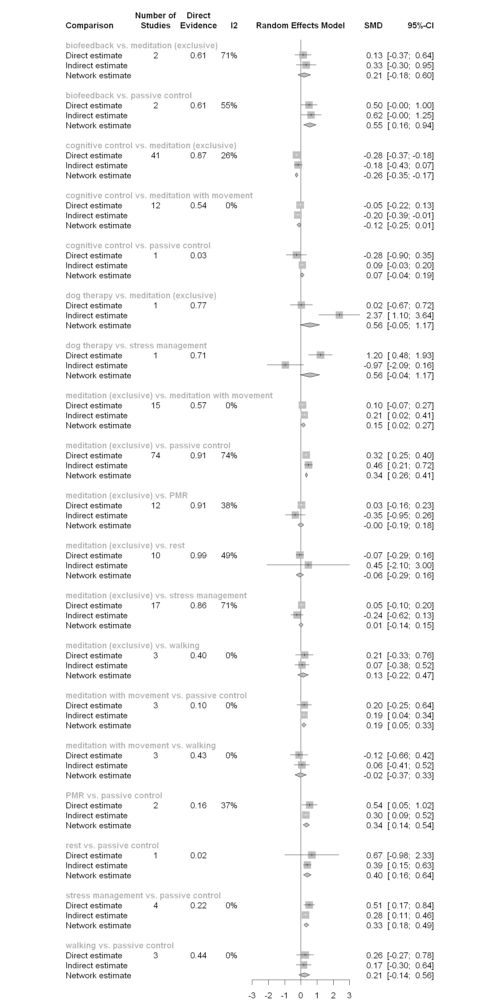

In [352]:
options(repr.plot.width = 10, repr.plot.height = 20, repr.plot.res = 150)
plot(net.res.all.split)

In [ ]:
direct.evidence.plot(net.res.all, random = T)

In [ ]:
options(repr.plot.width = 27, repr.plot.height = 9, repr.plot.res = 150)
plot(direct.evidence.plot(net.res.all, random = T, subplot.ratio=c(5, 1.3, 1.3)))

In [ ]:
# comparisons with heterogneity
# - biofeedback vs. meditation (exclusive)
# - biofeedback vs. passive control
# - meditation (exclusive) vs. passive control
# - meditation (exclusive) vs. rest
# - meditation (exclusive) vs. rest

# inconsistancy
# dog therapy

### Funnel Plot

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 150)
funnel(
  net.res.all, order = "passive control", # method.bias = "Egger",
  legend = T,  yaxis="invse", col = c(
    "blue", "red", "purple", "forestgreen", "aquamarine", 
    "gold4", "black", "brown"
#     "orange", "pink", 
#     "khaki", "plum", , "sandybrown", 
#     "coral", "gold4"
  )
)
#legend("topright", legend = levels(as.factor(net.res.all$comparison)), cex = 0.6)

### Reporting (League Table and nettable)

In [484]:
# table of p-values comparing all treatments
round(net.res.all$pval.random, 2)

,biofeedback,cognitive control,dog therapy,⋯,stress management,walking
biofeedback,NaN,0.02,0.34,⋯,0.31,0.20
cognitive control,0.02,NaN,0.01,⋯,0.00,0.45
dog therapy,0.34,0.01,NaN,⋯,0.07,0.05
⋮,⋮,⋮,⋮,⋱,⋮,⋮
stress management,0.31,0.00,0.07,⋯,NaN,0.52
walking,0.20,0.45,0.05,⋯,0.52,NaN


In [485]:
# league table
league.tab <- netleague(net.res.all)
league.tab$random

V1,V2,V3,⋯,V9,V10
<chr>,<chr>,<chr>,⋯,<chr>,<chr>
biofeedback,.,.,⋯,.,.
0.4730 [ 0.0719; 0.8741],cognitive control,.,⋯,.,.
-0.3497 [-1.0724; 0.3730],-0.8227 [-1.4374; -0.2080],dog therapy,⋯,1.2006 [ 0.4754; 1.9258],.
⋮,⋮,⋮,⋱,⋮,⋮
0.2150 [-0.1997; 0.6298],-0.2580 [-0.4255; -0.0905],0.5647 [-0.0448; 1.1742],⋯,stress management,.
0.3369 [-0.1833; 0.8570],-0.1362 [-0.4904; 0.2181],0.6866 [-0.0129; 1.3860],⋯,0.1218 [-0.2511; 0.4948],walking


In [ ]:
# netimpact.res <- netimpact(net.res.all)

In [486]:
# reporting
nettable(net.res.all)

Network table (random) effects model):

                    Arm 1                    Arm 2  k    I2            Direct estimate          Indirect estimate      Network meta-analysis Incoherence
              biofeedback        cognitive control  0     .                          .  0.4730 [ 0.0719;  0.8741]  0.4730 [ 0.0719;  0.8741]           .
              biofeedback              dog therapy  0     .                          . -0.3497 [-1.0724;  0.3730] -0.3497 [-1.0724;  0.3730]           .
              biofeedback   meditation (exclusive)  2 70.7%  0.1330 [-0.3695;  0.6355]  0.3257 [-0.2972;  0.9486]  0.2089 [-0.1822;  0.6000]      0.6369
              biofeedback meditation with movement  0     .                          .  0.3575 [-0.0527;  0.7677]  0.3575 [-0.0527;  0.7677]           .
              biofeedback          passive control  2 54.6%  0.4971 [-0.0042;  0.9985]  0.6227 [-0.0023;  1.2478]  0.5463 [ 0.1552;  0.9374]      0.7587
              biofeedback                 

In [487]:
# get table of SMDs
net.smd.df <- data.frame(matrix(".", nrow = net.res.all$n, ncol = net.res.all$n))

for(i in 1:nrow(net.smd.df)){
  for(j in 1:ncol(net.smd.df)){
    if (i < j){
      next
    }
    # Concatenate the contents and assign to the new data frame
    net.smd.df[i,j] <- paste(
      as.character(round(net.res.all$TE.random[i,j], 2)), " [",
      as.character(round(net.res.all$lower.random[i,j], 2)), ", ",
      as.character(round(net.res.all$upper.random[i,j], 2)), "]",
      sep = ""
    )
  }
}
rownames(net.smd.df) <- net.res.all$trts
colnames(net.smd.df) <- net.res.all$trts
net.smd.df

,biofeedback,cognitive control,dog therapy,⋯,stress management,walking
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
biofeedback,"0 [0, 0]",.,.,⋯,.,.
cognitive control,"-0.47 [-0.87, -0.07]","0 [0, 0]",.,⋯,.,.
dog therapy,"0.35 [-0.37, 1.07]","0.82 [0.21, 1.44]","0 [0, 0]",⋯,.,.
⋮,⋮,⋮,⋮,⋱,⋮,⋮
stress management,"-0.22 [-0.63, 0.2]","0.26 [0.09, 0.43]","-0.56 [-1.17, 0.04]",⋯,"0 [0, 0]",.
walking,"-0.34 [-0.86, 0.18]","0.14 [-0.22, 0.49]","-0.69 [-1.39, 0.01]",⋯,"-0.12 [-0.49, 0.25]","0 [0, 0]"


### Cutting out Studies due to results of netheat and netsplit

#### Inconsistancy

In [ ]:
net.res.n.dt.pc <- net.meta.analyze(
  present.outcomes, preferred.scale = F, net.df = F, net.res = F, comparisons.skip.list = list(
    list(cont.active.dog, cont.active.dog)
  ),
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = T,
  reference.group = "passive control", random = T, return.data = "net.res"
)

In [ ]:
net.res.n.dt.pc

In [ ]:
# inconsistancy was due to dog therapy (Spruin 2021 = only study)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 20, repr.plot.res = 150)
plot(netsplit(net.res.all))

#### Heterogeneity

In [ ]:
# comparisons with heterogneity
# - biofeedback vs. meditation (exclusive)
# - biofeedback vs. passive control
# - meditation (exclusive) vs. passive control
# - meditation (exclusive) vs. rest

##### Biofeedback

In [ ]:
overall.res.m.vs.b <- get.overall.res.metafor(comparison.list = list(meditation.type.all, cont.active.bio.feedback))
overall.res.m.vs.b$data  # Ratanasiripong 2015 only study using biofeedback

##### Meditation (exclusive) vs. passive control

In [ ]:
unique(res.overall$data[outlier.list$overall,"study.id"])

##### Meditation (exclusive) vs. rest

In [ ]:
overall.res.m.vs.r <- get.overall.res.metafor(comparison.list = list(meditation.type.all, cont.active.rest))
overall.res.m.vs.r$data

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 150)
forest(overall.res.m.vs.r)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 150)
plot.influnece(overall.res.m.vs.r, cluster = "study.id")

In [ ]:
# use trim and fill metheod to insert potential missing studies due to publication bias
options(repr.plot.width = 15, repr.plot.height = 7, repr.plot.res = 150)
study.labels <- overall.res.m.vs.r$data$id
funnel(  # with paramter slab adjusted
  overall.res.m.vs.r, legend = T,  yaxis="seinv", label = T, slab = study.labels,
  level=c(90, 95, 99), shade=c("white", "gray55", "gray75"),
  refline=0, lty = 0, refline2 = overall.res.m.vs.r$b[1,1], lty2 = 3
    # results.meta$TE.random = overall effect size of the random effects model
)

In [ ]:
overall.res.m.vs.r$data[3,]

In [ ]:
overall.res.m.vs.r.n.o <- get.overall.res.metafor(comparison.list = list(meditation.type.all, cont.active.rest), filter.forest..funnel.vec = c("Silvestre-López 2021", "Ramsburg 2014"))
overall.res.m.vs.r.n.o; overall.res.m.vs.r
# cuting out 4 of 10 studies to reduce heterogeneity
# --> heterogneity can not be aussumed to relay on small porportion of dataset 
# maybe to less outcomes included to map resilience

##### Meditation (exclusive) vs. stress management

In [ ]:
overall.res.m.vs.str <- get.overall.res.metafor(comparison.list = list(meditation.type.all, cont.active.stress.man))
overall.res.m.vs.str

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)
forest(overall.res.m.vs.str)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 150)
plot.influnece(overall.res.m.vs.str, cluster = "study.id")

In [ ]:
# use trim and fill metheod to insert potential missing studies due to publication bias
options(repr.plot.width = 15, repr.plot.height = 7, repr.plot.res = 150)
study.labels <- overall.res.m.vs.str$data$id
funnel(  # with paramter slab adjusted
  overall.res.m.vs.str, legend = T,  yaxis="seinv", label = T, slab = study.labels,
  level=c(90, 95, 99), shade=c("white", "gray55", "gray75"),
  refline=0, lty = 0, refline2 = overall.res.m.vs.r$b[1,1], lty2 = 3
    # results.meta$TE.random = overall effect size of the random effects model
)

In [ ]:
overall.res.m.vs.str$data[c(1, 17),]

In [ ]:
overall.res.m.vs.str$data[overall.res.m.vs.str$data$study.id == "Weytens 2014",]

In [ ]:
overall.res.m.vs.str.n.o <- get.overall.res.metafor(
  comparison.list = list(meditation.type.all, cont.active.stress.man), filter.forest..funnel.vec = c('Klibert 2022', 'Spruin 2021')
)
overall.res.m.vs.str.n.o; overall.res.m.vs.str
# results are highly influenced by Weytens 2014 and Kim 2021 but cutting both out would lead to a too high data loss

### Both

In [ ]:
net.res.n.o <- net.meta.analyze(
  present.outcomes, preferred.scale = F, net.df = F, net.res = F,
  
  filter.forest..funnel.vec = c(
    "Spruin 2021",  # causing inconsistancy in comparisons with dog therapy
    "Ratanasiripong 2015", # causing heterogeneity in comparisons with biofeedback
    'Bultas 2021', 'Devillers-Réolon 2022', 'Huberty 2019', 'Messer 2016', 'Bonamo 2015',  # causing heterogeneity or have high influence in meditation (exclusive) vs. passive control
    "Silvestre-López 2021", "Ramsburg 2014",  # causing heterogeneity or have high influence  in meditation (exclusive) vs. rest
    'Klibert 2022', 'Spruin 2021'  # causing heterogeneity in meditation (exclusive) vs. stress management
  ),
  
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F, silent = T,
  reference.group = "passive control", random = T, return.data = "net.res"
)
net.res.n.o

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)
netheat(net.res.n.o, nchar.trts = 3)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 15, repr.plot.res = 200)
plot(netsplit(net.res.n.o))

### Comparing network meta-analysis results with and without studies causing inconsistancy, heterogeneity, or have high influence on specific comparison results 

In [ ]:
net.res.n.o; net.res.all

In [ ]:
# plot forest plots
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)

# passive control
forest(
  net.res.all, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)
forest(
  net.res.n.o, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)

# cognitive contorl
forest(
  reference.group = "cognitive control",
  net.res.all, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)
forest(
  reference.group = "cognitive control",
  net.res.n.o, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)

# rest
forest(
  reference.group = "rest",
  net.res.all, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)
forest(
  reference.group = "rest",
  net.res.n.o, sortvar = TE,
  label.left = "may reduce resilience  ", label.right = "  may improve resilience",
  layout = "meta"
)

In [ ]:
# net.res.all$TE.nma.random
net.res.all$TE.random[-c(1, 3, 4),"meditation (exclusive)"]

In [ ]:
# comparing differences between interventions without specical cases
# data.frame(meditation = net.res.n.o$pval.random[, "meditation (exclusive)"])
cat("with special cases included")
data.frame(
  dif.to.pas.con.sig = net.res.all$pval.random[-c(1, 3, 4), "passive control"],
  dif.to.med.sig = net.res.all$pval.random[-c(1, 3, 4), "meditation (exclusive)"], # rows that do not occur in df below cut
  SMD.dif.to.med = round(net.res.all$TE.random[-c(1, 3, 4),"meditation (exclusive)"], 2)
)
data.frame(
  dif.to.pas.con.sig = net.res.all$pval.random[-c(1, 3, 4), "passive control"] <.05,
  dif.to.med.sig = net.res.all$pval.random[-c(1, 3, 4), "meditation (exclusive)"] <.05, # rows that do not occur in df below cut
  SMD.dif.to.med = round(net.res.all$TE.random[-c(1, 3, 4),"meditation (exclusive)"], 2)
)
cat("without special cases")
data.frame(
  dif.to.pas.con.sig = net.res.n.o$pval.random[- 2, "passive control"] <.05,  # is difference of these group to passive control significant?
  dif.to.med.sig = net.res.n.o$pval.random[- 2, "meditation (exclusive)"] <.05,  # row meditation (exclusive) cut
  SMD.dif.to.med = round(net.res.n.o$TE.random[-2,"meditation (exclusive)"], 2)
)

### Investigate duplication of study labels due to multiple outcomes or interventions clustered together

#### comparison to passive controls

In [279]:
# find out present outcomes per treatment compared with passive control
outcomes.per.trt.df <- data.frame(matrix(NA, nrow = 2, ncol = net.res.all$n))  # NA data.frame for outcomes per treatment and respective number
rownames(outcomes.per.trt.df) <- list("included outcomes", "number of outcomes")
colnames(outcomes.per.trt.df) <- net.res.all$trts

for (trt in net.res.all$trts){
  outcomes.per.trt.vec <- sort(unique(
    (net.res.all$data |> filter(
      (treat1 == trt | treat2 == trt) &
      (treat1 == "passive control" | treat2 == "passive control")
    ))$outcome
  ))
  
  outcomes.per.trt.df[1, trt] <- paste(outcomes.per.trt.vec, collapse = ", ")
  outcomes.per.trt.df[2, trt] <- length(outcomes.per.trt.vec)
}
outcomes.per.trt.df

,biofeedback,cognitive control,dog therapy,⋯,stress management,walking
,<chr>,<chr>,<chr>,⋯,<chr>,<chr>
included outcomes,"Anxiety, Stress",Anxiety,,⋯,"Depression, Positive emotion, Stress, Well-being","Anxiety, Depression, Stress"
number of outcomes,2,1,0,⋯,4,3


In [280]:
# get inflated study number and proportion of direct evidence
data.frame(
  comparison = net.res.all.split$comparison,
  k = net.res.all.split$k,
  prop = net.res.all.split$prop.random
) |> filter(
  grepl("exclusive", comparison) &
  grepl("passive", comparison) &
  k > 0
)

ERROR: Error in eval(expr, envir, enclos): object 'net.res.all.split' not found


In [ ]:
# get number of study labels of studies comparing meditation to passive controls
studlabs.med.vs.pas <- sort(unique(
  gsub(
    "\\ #.*","",  # searchs for " #" and deletes it and everything after it in the following strings of study labels comparing meditation to passive controls to which " #..." was added before
    (net.res.all$data |> filter(
      ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
      ("passive control" == treat1 | "passive control" == treat2)
    ))$studlab
  )
))
studlabs.med.vs.pas
length(studlabs.med.vs.pas)

In [ ]:
# get number of outcomes of studies comparing meditation to passive controls
outcomes.med.vs.pas <- sort(unique(
  (net.res.all$data |> filter(
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("passive control" == treat1 | "passive control" == treat2)
  ))$outcome
))
outcomes.med.vs.pas
length(outcomes.med.vs.pas)

In [ ]:
# get number of split multi-arm studies comparing meditation to passive controls
## get df of studies at which study labels were duplicated
studlabs.med.vs.pas.df <- net.res.all$data |>
  filter(
    # filter for meditation and passive control
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("passive control" == treat1 | "passive control" == treat2) &
    
    # filter for # indicating duplication
    grepl("#", studlab)
  ) |>

  # cut " #" and everything after it in studlab
  mutate(studlab = gsub("\\ #.*","", studlab)) |>
  arrange(.studlab)

## filter out studies that were duplicated due to two interventions clustered to one
studlabs.med.vs.pas.no.muli.arm.df <-  studlabs.med.vs.pas.df |>
  distinct(studlab, outcome, .keep_all = T)

## get study label of these studies filtered out in the last step
studlabs.med.vs.pas.muli.arm <- unique(studlabs.med.vs.pas.df$studlab[
  !studlabs.med.vs.pas.df$.studlab %in% studlabs.med.vs.pas.no.muli.arm.df$.studlab
])
studlabs.med.vs.pas.muli.arm
length(studlabs.med.vs.pas.muli.arm)

In [ ]:
# get inflated study number and proportion of direct evidence for comparisons against passive controls
data.frame(
  comparison = net.res.all.split$comparison,
  k = net.res.all.split$k,
  prop = net.res.all.split$prop.random
) |> filter(
  grepl("passive", comparison) &
  k > 0
)

#### cognitve controls

In [ ]:
# get inflated study number and proportion of direct evidence for comparisons against cognitve controls
data.frame(
  comparison = net.res.all.split$comparison,
  k = net.res.all.split$k,
  prop = net.res.all.split$prop.random
) |> filter(
  grepl("cognitive", comparison) &
  k > 0
)

In [ ]:
# get number of study labels of studies comparing meditation to cognitive controls
studlabs.med.vs.pas <- sort(unique(
  gsub(
    "\\ #.*","",  # searchs for " #" and deletes it and everything after it in the following strings of study labels comparing meditation to cognitive controls to which " #..." was added before
    (net.res.all$data |> filter(
      ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
      ("cognitive control" == treat1 | "cognitive control" == treat2)
    ))$studlab
  )
))
studlabs.med.vs.pas
length(studlabs.med.vs.pas)

In [ ]:
# get number of outcomes of studies comparing meditation to cognitive controls
outcomes.med.vs.pas <- sort(unique(
  (net.res.all$data |> filter(
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("cognitive control" == treat1 | "cognitive control" == treat2)
  ))$outcome
))
outcomes.med.vs.pas
length(outcomes.med.vs.pas)

In [ ]:
# get number of split multi-arm studies comparing meditation to cognitive controls
## get df of studies at which study labels were duplicated
studlabs.med.vs.cog.df <- net.res.all$data |>
  filter(
    # filter for meditation and cognitive control
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("cognitive control" == treat1 | "cognitive control" == treat2) &
    
    # filter for # indicating duplication
    grepl("#", studlab)
  ) |>

  # cut " #" and everything after it in studlab
  mutate(studlab = gsub("\\ #.*","", studlab)) |>
  arrange(.studlab)

## filter out studies that were duplicated due to two interventions clustered to one
studlabs.med.vs.cog.no.muli.arm.df <-  studlabs.med.vs.cog.df |>
  distinct(studlab, outcome, .keep_all = T)

## get study label of these studies filtered out in the last step
studlabs.med.vs.cog.muli.arm <- unique(studlabs.med.vs.cog.df$studlab[
  !studlabs.med.vs.cog.df$.studlab %in% studlabs.med.vs.cog.no.muli.arm.df$.studlab
])
studlabs.med.vs.cog.muli.arm
length(studlabs.med.vs.cog.muli.arm)

#### rest

In [ ]:
# get inflated study number and proportion of direct evidence for comparisons against rest
data.frame(
  comparison = net.res.all.split$comparison,
  k = net.res.all.split$k,
  prop = net.res.all.split$prop.random
) |> filter(
  grepl("rest", comparison) &
  k > 0
)

In [ ]:
# get number of study labels of studies comparing meditation to rest
studlabs.med.vs.rest <- sort(unique(
  gsub(
    "\\ #.*","",  # searchs for " #" and deletes it and everything after it in the following strings of study labels comparing meditation to rest to which " #..." was added before
    (net.res.all$data |> filter(
      ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
      ("rest" == treat1 | "rest" == treat2)
    ))$studlab
  )
))
studlabs.med.vs.rest
length(studlabs.med.vs.rest)

In [ ]:
# get number of outcomes of studies comparing meditation to rest
outcomes.med.vs.rest <- sort(unique(
  (net.res.all$data |> filter(
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("rest" == treat1 | "rest" == treat2)
  ))$outcome
))
outcomes.med.vs.rest
length(outcomes.med.vs.rest)

In [ ]:
# get number of split multi-arm studies comparing meditation to rests
## get df of studies at which study labels were duplicated
studlabs.med.vs.rest.df <- net.res.all$data |>
  filter(
    # filter for meditation and rest
    ("meditation (exclusive)" == treat1 | "meditation (exclusive)" == treat2) &
    ("rest" == treat1 | "rest" == treat2) &
    
    # filter for # indicating duplication
    grepl("#", studlab)
  ) |>

  # cut " #" and everything after it in studlab
  mutate(studlab = gsub("\\ #.*","", studlab)) |>
  arrange(.studlab)

## filter out studies that were duplicated due to two interventions clustered to one
studlabs.med.vs.rest.no.muli.arm.df <-  studlabs.med.vs.rest.df |>
  distinct(studlab, outcome, .keep_all = T)

## get study label of these studies filtered out in the last step
studlabs.med.vs.rest.muli.arm <- unique(studlabs.med.vs.rest.df$studlab[
  !studlabs.med.vs.rest.df$.studlab %in% studlabs.med.vs.rest.no.muli.arm.df$.studlab
])
studlabs.med.vs.rest.muli.arm
length(studlabs.med.vs.rest.muli.arm)

#### Get overall number of split multi-arm treatments

In [307]:
## get df of studies at which study labels were duplicated
studlabs.net.df <- net.res.all$data |>
  filter(grepl("#", studlab)) |>  # filter for # indicating duplication
  mutate(studlab = gsub("\\ #.*","", studlab)) |>
  arrange(.studlab)

## filter out studies that were duplicated due to two interventions clustered to one
studlabs.net.no.muli.arm.df <-  studlabs.net.df |>
  distinct(studlab, outcome, .keep_all = T)

## get study label of these studies filtered out in the last step
studlabs.net.muli.arm <- unique(studlabs.net.df$studlab[
  !studlabs.net.df$.studlab %in% studlabs.net.no.muli.arm.df$.studlab
])
studlabs.net.muli.arm
length(studlabs.net.muli.arm)

[1] "Archary 2021"         "Flett 2019a"          "Flett 2019b"         
 [4] "Heath 2022"           "Karing 2024"          "Klibert 2022"        
 [7] "Lee 2018"             "Messer 2016"          "Ratanasiripong 2015" 
[10] "Silvestre-López 2021" "Slater 2015"          "Waechter 2021"       
[13] "Wang 2023"            "Weytens 2014"

[1] 14

## [Resilience Scales] Overall network meta-analysis

### Investigating inconsistancy

### Investigate duplication of study labels due to multiple outcomes, interventions, or time points with the same treatment comparison

In [237]:
net.meta.analyze(
  "Resilience Scale", preferred.scale = F, net.df = F, net.res = F,
  # filter.forest..funnel.vec = c(
  #   "Messer 2016", "Spruin 2021", "Waechter 2021"  # studies with multi-arm inconsistancy
  # ),
  details.chkmultiarm = T, tol.multiarm = 0.01,
  plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  return.data = "net.res", reference.group = "passive control", random = T, silent = T
)

Number of studies: k = 5
Number of pairwise comparisons: m = 7
Number of treatments: n = 4
Number of designs: d = 3

Random effects model

Treatment estimate (sm = 'SMD', comparison: other treatments vs 'passive control'):
                             SMD            95%-CI     z p-value
cognitive control        -0.2443 [-0.8667; 0.3781] -0.77  0.4417
meditation (exclusive)   -0.1077 [-0.6265; 0.4112] -0.41  0.6843
meditation with movement -0.1219 [-0.8695; 0.6257] -0.32  0.7493
passive control                .                 .     .       .

Quantifying heterogeneity / inconsistency:
tau^2 = 0.0599; tau = 0.2447; I^2 = 59.2% [0.0%; 86.4%]

Tests of heterogeneity (within designs) and inconsistency (between designs):
                   Q d.f. p-value
Total           7.36    3  0.0614
Within designs  7.17    2  0.0277
Between designs 0.18    1  0.6677

In [231]:
# Get multi-arm split studies and their number
multi_arm_split_studies <- net.res.resilience.scale$studlab %>%
  grep("#", ., value = TRUE) %>%
  str_remove_all(" #.*") %>%
  unique()

multi_arm_split_studies
length(multi_arm_split_studies)

[1] "Flett 2019b"

[1] 1

In [ ]:
results.descriptive.array %>% dimnames()

[[1]]
[1] "Intervention.1" "Intervention.2" "Intervention.3" "Control"       
[5] "Intervention.5" "Intervention.6"

[[2]]
[1] "Mean" "SD"   "n"   

[[3]]
[1] "T0" "T1" "T2" "T3"

[[4]]
[1] "Outcome.1" "Outcome.2" "Outcome.3" "Outcome.4" "Outcome.5" "Outcome.6"
[7] "Outcome.7"

[[5]]
[1] "Scale.1" "Scale.2"

[[6]]
 [1] "Alhawatmeh 2022"          "Archary 2021"            
 [3] "Aspy 2017"                "Barbera 2025"            
 [5] "Barry 2019"               "Bonamo 2015"             
 [7] "Bultas 2021"              "Chen 2013"               
 [9] "Chow 2017"                "Clinton 2018"            
[11] "Dambrun 2023"             "Dawson 2014"             
[13] "Devillers-Réolon 2022"    "Dillbeck 1977"           
[15] "Dorais 2021"              "Fish 2019"               
[17] "Flett 2019b"              "Flett 2019a"             
[19] "Forsyth 2017"             "Gallagher 2022"          
[21] "Grogan 2025"              "Gupta 2020"              
[23] "Gutierrez 2024"           "Heath 2022"              
[25] "Heinrich 2023"            "Hirshberg 2018"          
[27] "Holden 2022"              "Holden 2023"             
[29] "Holland 2017"             "Huberty 2019"            
[31] "Ilies 2019"               "Janowiak 1994"           
[33] "Johnson-Waddell 2018"     "Karing 2024"             
[35] "Kim 2021"                 "Kinney 2022"             
[37] "Kirby 2021"               "Klempel 2019"            
[39] "Klibert 2022"             "Komariah 2022"           
[41] "Lancaster 2016"           "Lee 2018"                
[43] "Liu 2022"                 "Mantzios 2021"           
[45] "Messer 2016"              "Miller 2021"             
[47] "Moreno-Gómez 2023"        "Nath 2023"               
[49] "Nidich 2009"              "Nolan 2020"              
[51] "Oman 2007"                "OrtizCastro 2025"        
[53] "Ovadia-Blechman 2022"     "Paholpak 2012"           
[55] "Philips 2019"             "Pilcher 2025b"           
[57] "Pilcher 2025a"            "Plummer 2018"            
[59] "Pogrebtsova 2022"         "Ramsburg 2014"           
[61] "Ratanasiripong 2015"      "Rausch 2006"             
[63] "Sakakibara 1994"          "Schulte-Frankenfeld 2021"
[65] "Shenesey 2014"            "Shinde 2021"             
[67] "Siembor 2018"             "Silvestre-López 2021"    
[69] "Slater 2015"              "Sloan 2016"              
[71] "Smith 2021"               "Spruin 2021"             
[73] "Stefanelli 2025"          "Strait 2020"             
[75] "Sunita 2022"              "Tanner 2009"             
[77] "Tloczynski 1994"          "Toole 2016"              
[79] "Tsai 2017"                "Vasiliauskas 2013"       
[81] "Waechter 2021"            "Wang 2021"               
[83] "Wang 2023"                "Warnecke 2011"           
[85] "Weytens 2014"             "Xu 2025"                 
[87] "Zeidan 2010"              "deGrace 1976"

In [313]:
options(repr.matrix.max.rows=20, repr.matrix.max.cols=20)
net.res.resilience.scale$data %>% filter(grepl("Flett 2019b", .studlab))

.studlab,studlab,outcome,TE,seTE,treat1,treat2,.treat1,.treat2,.TE,.seTE,.design,.narms
<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
Flett 2019b,Flett 2019b,Resilience Scale,0.0000000,0.1919615,meditation (exclusive),cognitive control,cognitive control,meditation (exclusive),0.0000000,0.1919615,cognitive control vs. meditation (exclusive),2
Flett 2019b #1#,Flett 2019b #1#,Resilience Scale,0.3269504,0.1818631,meditation (exclusive),cognitive control,cognitive control,meditation (exclusive),-0.3269504,0.1818631,cognitive control vs. meditation (exclusive),2


In [319]:
outcome.names.df %>% filter(row.names(.) == "Flett 2019b")

,Name.of.Outcome.1,Name.of.Outcome.2,Name.of.Outcome.3,Name.of.Outcome.4,Name.of.Outcome.5,Name.of.Outcome.6,Name.of.Outcome.7
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Flett 2019b,Depression,Anxiety,Stress,Resilience Scale,Mindfulness,NA,NA


In [ ]:
m.data.df.list

In [880]:
options(repr.matrix.max.rows=10, repr.matrix.max.cols=10)
intervention.comparisons.df.list[["Flett 2019b"]]

,Name,Short.Description,Delivery.Mode,Meditation.App,Sessions.Duration.in.minutes,⋯,period.t1.t3,Meditation.Type,female.percent,male.percent,diverse.percent
,<chr>,<chr>,<chr>,<chr>,<dbl>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
Intervention.1,Headspace,"app-based; first ten sessions, afterwards ""other intervention content""",asynchronous guiding,Headspace,-999,⋯,NA,attentional family,79.89,20.11,0
Intervention.2,10 Minute Mind,email-based mindfulness program,asynchronous guiding,NA,-999,⋯,NA,attentional family,79.89,20.11,0
Intervention.3,Evernote,app-based attention control program,asynchronous guiding,Evernote,-999,⋯,NA,congnitive control,79.89,20.11,0
Control,NA,NA,NA,NA,NA,⋯,NA,NA,79.89,20.11,0
Intervention.5,NA,NA,NA,NA,NA,⋯,NA,NA,79.89,20.11,0
Intervention.6,NA,NA,NA,NA,NA,⋯,NA,NA,79.89,20.11,0


In [ ]:
# Conclusion: Both Headspace and 10 Minute Mind are classified as "meditation (exclusive)" in the intervention.comparisons.df.list and Evernote as "cognitive control".
# Therefore, we have the treatment comparison "meditation (exclusive)" vs "cognitive control" twice --> correct multi-arm splitting.

In [320]:
print.array.not.na(results.descriptive.array[,,,"Outcome.4","Scale.1","Flett 2019b"])

[1] "T0"
               Mean   SD    n
Intervention.1 3.51 0.66 -999
Intervention.2 3.31 0.78 -999
Intervention.3 3.37 0.73 -999
Control          NA   NA   NA
Intervention.5   NA   NA   NA
Intervention.6   NA   NA   NA

[1] "T1"
               Mean   SD  n
Intervention.1 3.63 0.64 65
Intervention.2 3.40 0.73 51
Intervention.3 3.40 0.76 58
Control          NA   NA NA
Intervention.5   NA   NA NA
Intervention.6   NA   NA NA

[1] "T2"
               Mean   SD    n
Intervention.1 3.62 0.73 -999
Intervention.2 3.47 0.74 -999
Intervention.3 3.49 0.80 -999
Control          NA   NA   NA
Intervention.5   NA   NA   NA
Intervention.6   NA   NA   NA

[1] "T3"
               Mean SD    n
Intervention.1   NA NA -999
Intervention.2   NA NA -999
Intervention.3   NA NA -999
Control          NA NA   NA
Intervention.5   NA NA   NA
Intervention.6   NA NA   NA



## [Mental health-related outcomes] Overall network meta-analysis

### Investigating inconsistancy

In [304]:
# Get multi-arm split studies and their number
multi_arm_split_studies <- net.res.mental.health$studlab %>%
  grep("#", ., value = TRUE) %>%
  str_remove_all(" #.*") %>%
  unique()

multi_arm_split_studies
length(multi_arm_split_studies)

[1] "Flett 2019b"              "Karing 2024"             
 [3] "Waechter 2021"            "Smith 2021"              
 [5] "Chen 2013"                "Komariah 2022"           
 [7] "Lee 2018"                 "Barry 2019"              
 [9] "Grogan 2025"              "OrtizCastro 2025"        
[11] "Warnecke 2011"            "Nolan 2020"              
[13] "Devillers-Réolon 2022"    "Silvestre-López 2021"    
[15] "Holden 2023"              "Holden 2022"             
[17] "Zeidan 2010"              "Flett 2019a"             
[19] "Heath 2022"               "Shenesey 2014"           
[21] "Kim 2021"                 "Weytens 2014"            
[23] "Ratanasiripong 2015"      "Archary 2021"            
[25] "Heinrich 2023"            "Wang 2023"               
[27] "Schulte-Frankenfeld 2021"

[1] 27

### Included outcomes and SMDs of specific comparisons

In [498]:
options(repr.matrix.max.rows=20, repr.matrix.max.cols=15)
# get table of SMDs
net.smd.df <- data.frame(matrix(".", nrow = net.res.mental.health$n, ncol = net.res.mental.health$n))

for(i in 1:nrow(net.smd.df)){
  for(j in 1:ncol(net.smd.df)){
    if (i < j){
      next
    }
    # Concatenate the contents and assign to the new data frame
    net.smd.df[i,j] <- paste(
      as.character(round(net.res.mental.health$TE.random[i,j], 2)), " [",
      as.character(round(net.res.mental.health$lower.random[i,j], 2)), ", ",
      as.character(round(net.res.mental.health$upper.random[i,j], 2)), "]",
      sep = ""
    )
  }
}
rownames(net.smd.df) <- net.res.mental.health$trts
colnames(net.smd.df) <- net.res.mental.health$trts
net.smd.df

,biofeedback,cognitive control,dog therapy,meditation (exclusive),meditation with movement,passive control,PMR,rest,stress management,walking
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
biofeedback,"0 [0, 0]",.,.,.,.,.,.,.,.,.
cognitive control,"-0.39 [-0.75, -0.04]","0 [0, 0]",.,.,.,.,.,.,.,.
dog therapy,"0.4 [-0.23, 1.03]","0.79 [0.25, 1.33]","0 [0, 0]",.,.,.,.,.,.,.
meditation (exclusive),"-0.11 [-0.46, 0.23]","0.28 [0.19, 0.37]","-0.51 [-1.04, 0.02]","0 [0, 0]",.,.,.,.,.,.
meditation with movement,"-0.27 [-0.63, 0.09]","0.12 [0, 0.24]","-0.67 [-1.21, -0.13]","-0.16 [-0.27, -0.04]","0 [0, 0]",.,.,.,.,.
passive control,"-0.39 [-0.73, -0.05]","0.01 [-0.11, 0.12]","-0.79 [-1.32, -0.25]","-0.27 [-0.35, -0.2]","-0.12 [-0.25, 0.02]","0 [0, 0]",.,.,.,.
PMR,"0.09 [-0.34, 0.51]","0.48 [0.21, 0.75]","-0.31 [-0.9, 0.28]","0.2 [-0.05, 0.46]","0.36 [0.08, 0.64]","0.48 [0.21, 0.74]","0 [0, 0]",.,.,.
rest,"-0.08 [-0.49, 0.33]","0.31 [0.07, 0.55]","-0.48 [-1.05, 0.1]","0.03 [-0.19, 0.26]","0.19 [-0.06, 0.44]","0.31 [0.07, 0.54]","-0.17 [-0.51, 0.17]","0 [0, 0]",.,.
stress management,"-0.19 [-0.56, 0.18]","0.2 [0.02, 0.38]","-0.59 [-1.12, -0.06]","-0.08 [-0.23, 0.07]","0.08 [-0.11, 0.27]","0.19 [0.03, 0.36]","-0.28 [-0.58, 0.01]","-0.11 [-0.38, 0.16]","0 [0, 0]",.


In [509]:
options(repr.matrix.max.rows=30, repr.matrix.max.cols=15)
net.res.mental.health$data %>%
  group_by(.design) %>%
  summarise(outcomes_included = n_distinct(outcome)) %>%
  arrange(desc(outcomes_included)) %>%
  left_join(
    net.res.mental.health$data %>%
      group_by(.design) %>%
      summarise(studies = n_distinct(studlab)) %>%
      arrange(desc(studies))
  )

Joining with `by = join_by(.design)`


.design,outcomes_included,studies
<chr>,<int>,<int>
cognitive control vs. meditation (exclusive),4,23
cognitive control vs. meditation with movement,4,8
meditation (exclusive) vs. meditation with movement,4,10
meditation (exclusive) vs. passive control,4,45
meditation (exclusive) vs. stress management,4,7
meditation (exclusive) vs. rest,2,6
meditation (exclusive) vs. walking,2,2
meditation with movement vs. passive control,2,2
meditation with movement vs. walking,2,2


### Reporting (League Table and nettable)

In [252]:
# table of p-values comparing all treatments
round(net.res.mental.health$pval.random, 2)

,biofeedback,cognitive control,dog therapy,meditation (exclusive),meditation with movement,passive control,PMR,rest,stress management,walking
biofeedback,NaN,0.03,0.21,0.51,0.14,0.03,0.68,0.70,0.31,0.40
cognitive control,0.03,NaN,0.00,0.00,0.05,0.93,0.00,0.01,0.03,0.26
dog therapy,0.21,0.00,NaN,0.06,0.02,0.00,0.30,0.10,0.03,0.06
meditation (exclusive),0.51,0.00,0.06,NaN,0.01,0.00,0.12,0.76,0.31,0.60
meditation with movement,0.14,0.05,0.02,0.01,NaN,0.09,0.01,0.14,0.43,0.68
passive control,0.03,0.93,0.00,0.00,0.09,NaN,0.00,0.01,0.02,0.26
PMR,0.68,0.00,0.30,0.12,0.01,0.00,NaN,0.33,0.06,0.17
rest,0.70,0.01,0.10,0.76,0.14,0.01,0.33,NaN,0.41,0.54
stress management,0.31,0.03,0.03,0.31,0.43,0.02,0.06,0.41,NaN,0.96
walking,0.40,0.26,0.06,0.60,0.68,0.26,0.17,0.54,0.96,NaN


In [251]:
# league table
league.tab <- netleague(net.res.mental.health)
league.tab$random


V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
biofeedback,.,.,0.1322 [-0.3062; 0.5707],.,0.4955 [ 0.0584; 0.9326],.,.,.,.
0.3921 [ 0.0392; 0.7451],cognitive control,.,-0.3016 [-0.4002; -0.2029],-0.0454 [-0.2068; 0.1159],-0.2756 [-0.7991; 0.2480],.,.,.,.
-0.3983 [-1.0273; 0.2307],-0.7904 [-1.3268; -0.2541],dog therapy,0.0234 [-0.5755; 0.6223],.,.,.,.,1.2006 [ 0.5639; 1.8373],.
0.1138 [-0.2277; 0.4553],-0.2783 [-0.3690; -0.1877],0.5121 [-0.0166; 1.0408],meditation (exclusive),0.0863 [-0.0652; 0.2378],0.2564 [ 0.1758; 0.3370],-0.1430 [-0.4035; 0.1176],-0.0370 [-0.2607; 0.1867],0.1577 [-0.0079; 0.3234],0.2145 [-0.2929; 0.7219]
0.2689 [-0.0910; 0.6289],-0.1232 [-0.2443; -0.0021],0.6672 [ 0.1260; 1.2085],0.1551 [ 0.0388; 0.2715],meditation with movement,0.1967 [-0.2005; 0.5939],.,.,.,-0.1202 [-0.6191; 0.3787]
0.3868 [ 0.0454; 0.7282],-0.0053 [-0.1220; 0.1114],0.7851 [ 0.2518; 1.3184],0.2730 [ 0.1961; 0.3499],0.1179 [-0.0174; 0.2531],passive control,-0.7585 [-1.3543; -0.1626],-0.6720 [-2.2899; 0.9460],-0.4824 [-0.8087; -0.1561],-0.2579 [-0.7408; 0.2251]
-0.0885 [-0.5126; 0.3355],-0.4807 [-0.7491; -0.2122],0.3098 [-0.2762; 0.8957],-0.2023 [-0.4551; 0.0505],-0.3575 [-0.6355; -0.0794],-0.4753 [-0.7370; -0.2137],PMR,.,.,.
0.0797 [-0.3279; 0.4873],-0.3124 [-0.5529; -0.0719],0.4780 [-0.0957; 1.0517],-0.0341 [-0.2569; 0.1887],-0.1892 [-0.4405; 0.0621],-0.3071 [-0.5424; -0.0717],0.1682 [-0.1687; 0.5052],rest,.,.
0.1923 [-0.1798; 0.5645],-0.1998 [-0.3764; -0.0233],0.5906 [ 0.0595; 1.1217],0.0785 [-0.0733; 0.2303],-0.0766 [-0.2673; 0.1141],-0.1945 [-0.3579; -0.0311],0.2808 [-0.0136; 0.5753],0.1126 [-0.1569; 0.3821],stress management,.


In [248]:
options(repr.matrix.max.rows=10, repr.matrix.max.cols=10)
# get table of SMDs
net.smd.df <- data.frame(matrix(".", nrow = net.res.mental.health$n, ncol = net.res.mental.health$n))

for(i in 1:nrow(net.smd.df)){
  for(j in 1:ncol(net.smd.df)){
    if (i < j){
      next
    }
    # Concatenate the contents and assign to the new data frame
    net.smd.df[i,j] <- paste(
      as.character(round(net.res.mental.health$TE.random[i,j], 2)), " [",
      as.character(round(net.res.mental.health$lower.random[i,j], 2)), ", ",
      as.character(round(net.res.mental.health$upper.random[i,j], 2)), "]",
      sep = ""
    )
  }
}
rownames(net.smd.df) <- net.res.mental.health$trts
colnames(net.smd.df) <- net.res.mental.health$trts
net.smd.df

,biofeedback,cognitive control,dog therapy,meditation (exclusive),meditation with movement,passive control,PMR,rest,stress management,walking
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
biofeedback,"0 [0, 0]",.,.,.,.,.,.,.,.,.
cognitive control,"-0.39 [-0.75, -0.04]","0 [0, 0]",.,.,.,.,.,.,.,.
dog therapy,"0.4 [-0.23, 1.03]","0.79 [0.25, 1.33]","0 [0, 0]",.,.,.,.,.,.,.
meditation (exclusive),"-0.11 [-0.46, 0.23]","0.28 [0.19, 0.37]","-0.51 [-1.04, 0.02]","0 [0, 0]",.,.,.,.,.,.
meditation with movement,"-0.27 [-0.63, 0.09]","0.12 [0, 0.24]","-0.67 [-1.21, -0.13]","-0.16 [-0.27, -0.04]","0 [0, 0]",.,.,.,.,.
passive control,"-0.39 [-0.73, -0.05]","0.01 [-0.11, 0.12]","-0.79 [-1.32, -0.25]","-0.27 [-0.35, -0.2]","-0.12 [-0.25, 0.02]","0 [0, 0]",.,.,.,.
PMR,"0.09 [-0.34, 0.51]","0.48 [0.21, 0.75]","-0.31 [-0.9, 0.28]","0.2 [-0.05, 0.46]","0.36 [0.08, 0.64]","0.48 [0.21, 0.74]","0 [0, 0]",.,.,.
rest,"-0.08 [-0.49, 0.33]","0.31 [0.07, 0.55]","-0.48 [-1.05, 0.1]","0.03 [-0.19, 0.26]","0.19 [-0.06, 0.44]","0.31 [0.07, 0.54]","-0.17 [-0.51, 0.17]","0 [0, 0]",.,.
stress management,"-0.19 [-0.56, 0.18]","0.2 [0.02, 0.38]","-0.59 [-1.12, -0.06]","-0.08 [-0.23, 0.07]","0.08 [-0.11, 0.27]","0.19 [0.03, 0.36]","-0.28 [-0.58, 0.01]","-0.11 [-0.38, 0.16]","0 [0, 0]",.


# Create Shiny Dashboard (of inference statistics)

In [205]:
# install.packages("shinydashboard")
library(shinydashboard)
library(shiny)
conflicts_prefer(shinydashboard::box)

[conflicted] Will prefer shinydashboard::box over any other package.


## Calculate data frame lists and results for meta-analyses once for speeding up the repitative loading of the dashboard

In [206]:
meta.df.lists <- list()
meta.df.lists.w.o.mean.r <- list()
net.ress <- list()

i <- 1
for (outcome in present.outcomes.sorted){
  # with mean ranges
  meta.df.list.temp <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "meta.df.list"
  )
  
  meta.df.lists[[i]] <- meta.df.list.temp
  
  # without mean ranges
  meta.df.list.w.o.mean.r.temp <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "meta.df.list", without.mean.r = T
  )
  
  meta.df.lists.w.o.mean.r[[i]] <- meta.df.list.w.o.mean.r.temp
  
  # for network meta-analyses of single outcomes
  net.ress[[i]] <- net.meta.analyze(
    outcome, preferred.scale = get.1st.preferred.scale(outcome), net.df = F, net.res = F,
    plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
    return.data = "net.res", reference.group = "passive control", random = T, silent = T
  )
  
  i <- i + 1
}

names(meta.df.lists) <- present.outcomes.sorted
names(meta.df.lists.w.o.mean.r) <- present.outcomes.sorted
names(net.ress) <- present.outcomes.sorted

# # for network meta-analyses of all outcomes included in one model
# net.res.all <- net.meta.analyze(
#   present.outcomes, preferred.scale = F, net.df = F, net.res = F,
#   plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
#   return.data = "net.res", reference.group = "passive control", random = T, silent = T
# )


# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 

[1] "error in net.meta.analyze(): calculation of net.res not possible as nrow(net.df) is not above 1 --> only 1 or 0 treatment comparisons are present"

# Active coping ----------------------------------

# Active coping ----------------------------------
[1] "error in net.meta.analyze(): calculation of net.res not possi

## Set parameters

In [207]:
# graphical parameters stress (because shiny fails to recognize the size of subgroub forest plots)
forest.plot.box.height.Stress <- "height: 65vh;"
  # for 16:9 (1920 x 1080) screen = "height: 65vh;"
  # for 3:2 (2256 x 1504) screen = "height: 99vh;"

# Tab names per outcome page
forest.tab.name <- "Forest & Funnel Plot (with outliers)"
forest.no.outliers.tab.name <- "Forest & Funnel Plot (comparision with/without outliers)"
regression.single.with.outliers.tab.name <- "Linear Regressions (with outliers)"
regression.single.comp.tab.name <- "Linear Regressions (comparison with/without outliers; with mean ranges)"
regression.single.comp.tab.name.no.mean.r <- "Linear Regressions (comparison with/without outliers; without mean ranges)"
net.meta.tab.name <- "Network Meta-Analysis"
# regression.multiple.tab.name <- "Multiple Regressions"
# regression.multiple.no.outliers.tab.name <- "M. Regressions (w.o.)"

# set colors
sig.0.05.color <- "red"
sig.0.1.color <- "yellow"

## Load Utiltiy Functions for the Shiny Dashboard

In [208]:
source("utils/shiny_dashboard/sub_functions_ui.R")
source("utils/shiny_dashboard/main_functions_ui.R")
source("utils/shiny_dashboard/server_outcomes.R")
source("utils/shiny_dashboard/server_summary.R")

## Save all Gosh Plots as .png (making dashboard faster)

In [ ]:
# plot.group.list <- list(
#   main.effects = outlier.list,
#   regressions.single = list(
#     list(
#       # only outcomes for that a regression gets calculated
#       # per outcome...
#       programs.duration = c(),
#       sessions.duration = c(),
#       programs.frequency = c(),
#       follow.up.period = c()
#     )
#   )
# )

# preferred.scale <- "PSS"
# frame.size <- 11
# resolution.png <- 600

# for (outcome in present.outcomes){  # index over present.outcomes all outcomes
#   results.metafor <- print.meta.results(
#     outcome, preferred.scale = if(outcome == "Stress"){preferred.scale}else{FALSE}, return.data = "results.metafor",
#     print.forest = F, print.funnel = F, print.meta.results = F, split.subgroups = F, print.influence = F, regression = F, print.baujat = F
#   )
  
#   if (is.null(results.metafor)) {
#     next  # skip to the next iteration if results.metafor is NULL as there are no studies for this outcome
#   }

#   for (plot.group.name in names(plot.group.list)){ # index over names(plot.group.list) instead of "main.effects" to get also the regression gosh plots
#     i <- 1
#     for (outlier in plot.group.list[[plot.group.name]][[outcome]]){  # index over plot.group.name insead of "main.effects" to get also the regression gosh plots
#       png(
#         file.path(
#           "Gosh Plots",
#           paste0(
#             "Gosh.Plot.",
#             outcome,
#             if(outcome == "Stress"){paste0(".", preferred.scale)}else{""},
#             ".outlier.", i, ".png"
#           )
#         ),
#         width=frame.size, height=frame.size, units="in", res=resolution.png
#       )
#       par(mar=c(frame.size,frame.size,1,1))
#       sav <- gosh(results.metafor)
#       plot(sav, out = outlier)
#       dev.off()
#       i <- i + 1
#     }
#   }
# }

: 

## Dashboard

In [ ]:
# without separation of trait/state
ui <- dashboardPage(
  dashboardHeader(title = "Meta-Analysis"),
  dashboardSidebar(
    sidebarMenu(
      menuItem("Summary", tabName = "Summary_page", icon = icon("flash", lib = 'glyphicon')),
      menuItem("Summary_Resilience_Scale", tabName = "Summary_Resilience_Scale_page", icon = icon("flash", lib = 'glyphicon')),
      menuItem("Summary_Mental_Health", tabName = "Summary_Mental_Health_page", icon = icon("flash", lib = 'glyphicon')),
      menuItem("Summary_Secondary_Outcomes", tabName = "Summary_Secondary_Outcomes_page", icon = icon("flash", lib = 'glyphicon')),
      menuItem("Resilience_Scale", tabName = "Resilience_Scale_page", icon = icon("line-chart")),
      menuItem("Anxiety", tabName = "Anxiety_page", icon = icon("line-chart")),
      menuItem("Depression", tabName = "Depression_page", icon = icon("line-chart")),
      menuItem("Stress", tabName = "Stress_page", icon = icon("line-chart")),
      menuItem("Well-being", tabName = "Well-being_page", icon = icon("line-chart")),
      menuItem("Acceptance", tabName = "Acceptance_page", icon = icon("line-chart")),
      menuItem("Active_coping", tabName = "Active_coping_page", icon = icon("line-chart")),
      menuItem("Cognitive_control", tabName = "Cognitive_control_page", icon = icon("line-chart")),
      menuItem("Empathy", tabName = "Empathy_page", icon = icon("line-chart")),
      menuItem("Hope", tabName = "Hope_page", icon = icon("line-chart")),
      menuItem("Mindfulness", tabName = "Mindfulness_page", icon = icon("line-chart")),
      menuItem("Optimism", tabName = "Optimism_page", icon = icon("line-chart")),
      menuItem("Positive_affect", tabName = "Positive_affect", icon = icon("line-chart")),
      menuItem("Positive_emotion", tabName = "Positive_emotion_page", icon = icon("line-chart")),
      menuItem("Religious_coping", tabName = "Religious_coping_page", icon = icon("line-chart")),
      menuItem("Self-acceptance", tabName = "Self-acceptance_page", icon = icon("line-chart")),
      menuItem("Self-compassion", tabName = "Self-compassion_page", icon = icon("line-chart")),
      menuItem("Self-efficacy", tabName = "Self-efficacy_page", icon = icon("line-chart")),
      menuItem("Self-esteem", tabName = "Self-esteem_page", icon = icon("line-chart"))
    ),
    sidebarMenuOutput("menu")
  ),
  dashboardBody(tabItems(
    
  # Summary Pages
    set.summary.page(
      net.res.object = net.res.list$net.res.all$res.object,
      domain_name = "all",
      tabName = "Summary_page"
    ),
    set.summary.page(
      net.res.object = net.res.list$net.res.resilience.scale$res.object,
      domain_name = "resilience.scale",
      tabName = "Summary_Resilience_Scale_page"
    ),
    set.summary.page(
      net.res.object = net.res.list$net.res.mental.health$res.object,
      domain_name = "mental.health",
      tabName = "Summary_Mental_Health_page"
    ),
    set.summary.page(
      net.res.object = net.res.list$net.res.secondary.outcomes$res.object,
      domain_name = "secondary.outcomes",
      tabName = "Summary_Secondary_Outcomes_page"
    ),
  # Outcomes' pages

    set.outcome.page("Resilience Scale"),
    set.outcome.page("Anxiety"),
    set.outcome.page("Depression"),
    set.outcome.page("Stress", preferred.scale = "DASS"),
    set.outcome.page("Well-being"),
    set.outcome.page("Acceptance"),
    set.outcome.page("Active coping"),
    set.outcome.page("Cognitive control"),
    set.outcome.page("Empathy"),
    set.outcome.page("Hope"),
    set.outcome.page("Mindfulness"),
    set.outcome.page("Optimism"),
    set.outcome.page("Positive affect"),
    set.outcome.page("Positive emotion"),
    set.outcome.page("Religious coping"),
    set.outcome.page("Self-acceptance"),
    set.outcome.page("Self-compassion"),
    set.outcome.page("Self-efficacy"),
    set.outcome.page("Self-esteem")
  ))
)


# Server -------------------------------------------------------
server <- function(input, output, session) {
  
  # end session by closing the window / tab
  session$onSessionEnded(function() {
    stopApp()
  })

  # outputs for summary sections per domain
  output <- return.summary.output(
    output,
    net.res.object = net.res.list$net.res.all$res.object,
    domain_name = "all",
    outcome_vec = net.res.list$net.res.all$included.outcomes
  )
  output <- return.summary.output(
    output,
    net.res.object = net.res.list$net.res.resilience.scale$res.object,
    domain_name = "resilience.scale",
    outcome_vec = net.res.list$net.res.resilience.scale$included.outcomes
  )
  output <- return.summary.output(
    output,
    net.res.object = net.res.list$net.res.mental.health$res.object,
    domain_name = "mental.health",
    outcome_vec = net.res.list$net.res.mental.health$included.outcomes
  )
  output <- return.summary.output(
    output,
    net.res.object = net.res.list$net.res.secondary.outcomes$res.object,
    domain_name = "secondary.outcomes",
    outcome_vec = net.res.list$net.res.secondary.outcomes$included.outcomes
  )
  
  # output$net.p.df.all <- renderTable(data.frame(net.res.all$pval.random), digits = 4)
  
  # outputs for outcomes
  output <- return.outcome.output(output, "Resilience Scale")
  output <- return.outcome.output(output, "Anxiety")  # "Only equal moderator values present for regression of outcome:\"Anxiety\" and moderator: \"follow.up.period\""
  output <- return.outcome.output(output, "Depression")
  output <- return.outcome.output(output, "Stress", preferred.scale = "DASS")
  output <- return.outcome.output(output, "Well-being")
  output <- return.outcome.output(output, "Acceptance")
  output <- return.outcome.output(output, "Active coping")
  output <- return.outcome.output(output, "Cognitive control")
  output <- return.outcome.output(output, "Empathy")
  output <- return.outcome.output(output, "Hope")
  output <- return.outcome.output(output, "Mindfulness")
  output <- return.outcome.output(output, "Optimism")
  output <- return.outcome.output(output, "Positive affect", preferred.scale = "IPANAT")
  output <- return.outcome.output(output, "Positive emotion")
  output <- return.outcome.output(output, "Religious coping")
  output <- return.outcome.output(output, "Self-acceptance")
  output <- return.outcome.output(output, "Self-compassion", preferred.scale = "SCS")
  output <- return.outcome.output(output, "Self-efficacy")
  output <- return.outcome.output(output, "Self-esteem")
}

shinyApp(ui, server)


# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------

# Resilience Scale ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety -----------------------

Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety -----------------------

Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety -----------------------

Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------

# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Anxiety ----------------------------------


Warning message:
"Redundant predictors dropped from the model."
Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ------

Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ------

Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ------

Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------

# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Depression ----------------------------------


Warning message:
"Redundant predictors dropped from the model."
Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress 

Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress ----------------------------------

# Stress 

Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Stress ----------------------------------


Warning message:
"Redundant predictors dropped from the model."
Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ----------------------------------

# Well-being ------

Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 


# Acceptance ----------------------------------
no studies included for outcome: Acceptance 



Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Active coping ----------------------------------

# Active coping ----------------------------------

# Active coping ----------------------------------

# Active coping ----------------------------------

# Active coping ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 


# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 


# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 


# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 


# Cognitive control ----------------------------------
no studies included for outcome: Cognitive control 



Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Empathy ----------------------------------

# Empathy ----------------------------------

# Empathy ----------------------------------

# Empathy ----------------------------------

# Empathy ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Hope ----------------------------------

# Hope ----------------------------------

# Hope ----------------------------------

# Hope ----------------------------------

# Hope ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------

# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."



# Mindfulness ----------------------------------


Warning message:
"Redundant predictors dropped from the model."
Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Optimism ----------------------------------

# Optimism ----------------------------------

# Optimism ----------------------------------

# Optimism ----------------------------------

# Optimism ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Positive affect ----------------------------------
no studies included for outcome: Positive affect 


# Positive affect ----------------------------------
no studies included for outcome: Positive affect 


# Positive affect ----------------------------------
no studies included for outcome: Positive affect 


# Positive affect ----------------------------------
no studies included for outcome: Positive affect 


# Positive affect ----------------------------------
no studies included for outcome: Positive affect 



Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Positive emotion ----------------------------------

# Positive emotion ----------------------------------

# Positive emotion ----------------------------------

# Positive emotion ----------------------------------

# Positive emotion ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Religious coping ----------------------------------
no studies included for outcome: Religious coping 


# Religious coping ----------------------------------
no studies included for outcome: Religious coping 


# Religious coping ----------------------------------
no studies included for outcome: Religious coping 


# Religious coping ----------------------------------
no studies included for outcome: Religious coping 


# Religious coping ----------------------------------
no studies included for outcome: Religious coping 



Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Self-acceptance ----------------------------------

# Self-acceptance ----------------------------------

# Self-acceptance ----------------------------------

# Self-acceptance ----------------------------------

# Self-acceptance ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Self-compassion ----------------------------------

# Self-compassion ----------------------------------

# Self-compassion ----------------------------------

# Self-compassion ----------------------------------

# Self-compassion ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Self-efficacy ----------------------------------

# Self-efficacy ----------------------------------

# Self-efficacy ----------------------------------

# Self-efficacy ----------------------------------

# Self-efficacy ----------------------------------


Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."



# Self-esteem ----------------------------------
no studies included for outcome: Self-esteem 


# Self-esteem ----------------------------------
no studies included for outcome: Self-esteem 


# Self-esteem ----------------------------------
no studies included for outcome: Self-esteem 


# Self-esteem ----------------------------------
no studies included for outcome: Self-esteem 


# Self-esteem ----------------------------------
no studies included for outcome: Self-esteem 



Warning message:
"Navigation containers expect a collection of `bslib::nav_panel()`/`shiny::tabPanel()`s and/or `bslib::nav_menu()`/`shiny::navbarMenu()`s. Consider using `header` or `footer` if you wish to place content above (or below) every panel's contents."

Listening on http://127.0.0.1:5099



no studies included for outcome: Positive affect 

no studies included for outcome: Cognitive control 

no studies included for outcome: Religious coping 

no studies included for outcome: Acceptance 

no studies included for outcome: Self-esteem 



TableGrob (2 x 2) "arrange": 3 grobs
  z     cells    name                 grob
1 1 (2-2,1-1) arrange       gtable[layout]
2 2 (2-2,2-2) arrange       gtable[layout]
3 3 (1-1,1-2) arrange text[GRID.text.2406]

--- Plotting summary forest for net.res.all -------------------------------------



no studies included for outcome: Positive affect 

no studies included for outcome: Cognitive control 

no studies included for outcome: Religious coping 

no studies included for outcome: Acceptance 

no studies included for outcome: Self-esteem 



--- Plotting summary forest for net.res.resilience.scale -------------------------------------



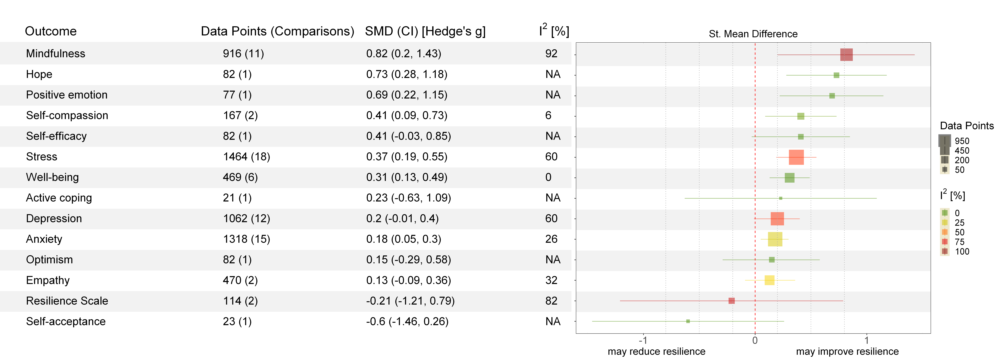

--- Plotting summary forest for net.res.mental.health -------------------------------------



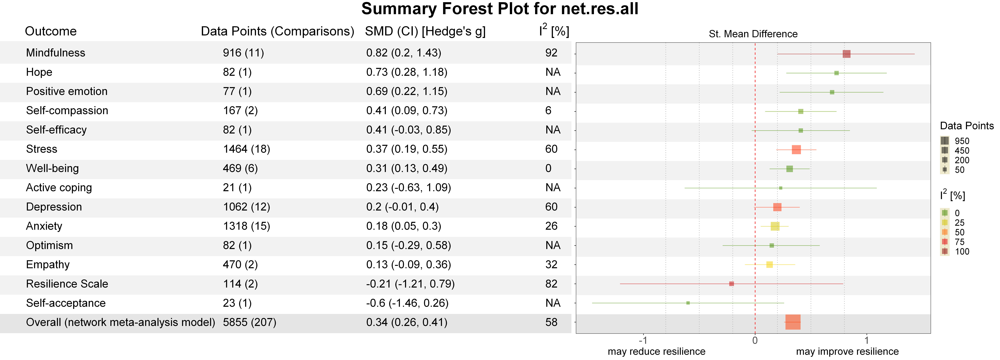

--- Plotting summary forest for net.res.secondary.outcomes -------------------------------------



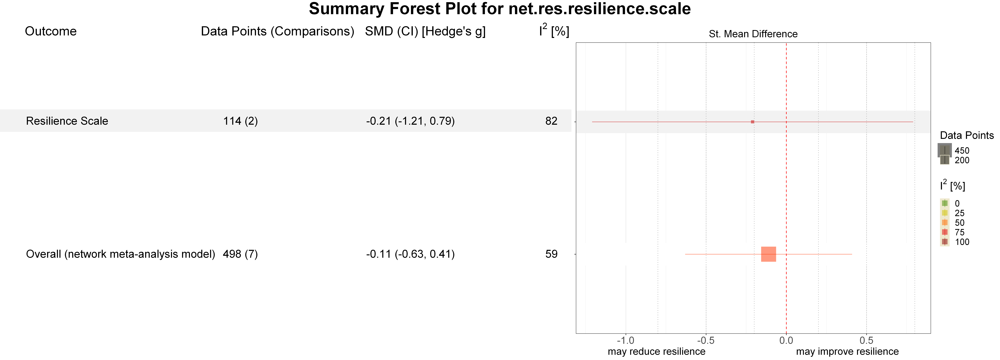

no studies included for outcome: Positive affect 

no studies included for outcome: Cognitive control 

no studies included for outcome: Religious coping 

no studies included for outcome: Acceptance 

no studies included for outcome: Self-esteem 



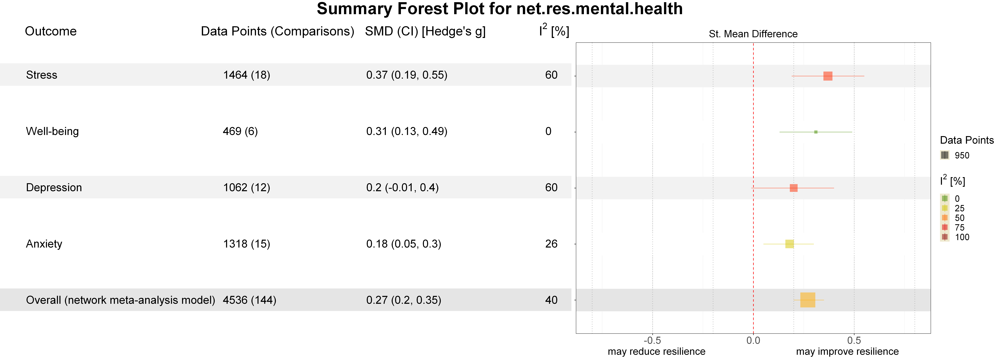

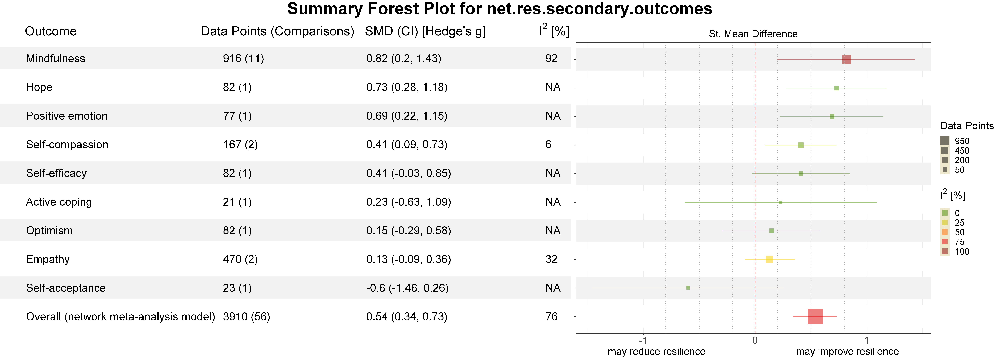

In [482]:
# Plot summary forest plots for once without overall estimate and once for all domains with overall estimate
options(repr.plot.width = 25, repr.plot.height = 9, repr.plot.res = 350)

plot.summary.forest(
  overall.measure = "none", outcome_vec = present.outcomes,
  title = ""
)

for (net.res.name in names(net.res.list)) {
  net.res.object <- net.res.list[[net.res.name]]$res.object
  if (is.null(net.res.object) || class(net.res.object) != "netmeta") {
    message(paste0("Skipping ", net.res.name, " as net.res.object is NULL or not of class 'netmeta' (is likely to have no results)."))
    next  # skip to the next iteration if net.res.object is NULL
  }
  message(paste0("--- Plotting summary forest for ", net.res.name), " -------------------------------------")
  plot.summary.forest(
    net.res.object, outcome_vec = net.res.list[[net.res.name]]$included.outcomes,
    title = paste("Summary Forest Plot for", net.res.name)
  )
}

# Risk of Bias Assessment

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 20, repr.plot.res = 150)

In [ ]:
# devtools::install_github("mcguinlu/robvis")  # install robvis from github so it includes the rob_forest function
library("robvis")

In [ ]:
outcome.names.df

In [ ]:
rob.df

In [ ]:
rob_traffic_light(
  data = rob.df,
  tool = "ROB2",
  psize = 5
)

In [ ]:
# print numbers and study labels
i <- 1
for (label in rownames(rob.df)){
  cat(i, " = ", label, ", ", sep = "")
  i <- i + 1
}

In [ ]:
# outcomes with high RoB
outcomes.high.rob <- as.character(unique(unlist(outcome.names.df[studies.high.rob,])))  # get unique values from df
outcomes.high.rob <- outcomes.high.rob[!(outcomes.high.rob == "Other: " | is.na.or.nm(outcomes.high.rob))]  # filter out "NA", "Other: "
outcomes.high.rob

In [ ]:
# get study labels per outcome in which high rob studies could be present within the analyses
studs.p.high.rob.outc.list <- list()

i <- 1
for (outcome in outcomes.high.rob){
  studs.h.r <- print.meta.results(
    outcome, preferred.scale = if (outcome == "Stress"){
      "DASS"
    } else if (outcome == "Positive affect"){
      "IPANAT"
    } else if (outcome == "Self-compassion"){
      "SCS"
    } else {F},
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, subgroup.method = "fixed", print.meta.results = F,
    return.data = "results.meta"
  )$studlab
  
  studs.p.high.rob.outc.list[[i]] <- studs.h.r
  i <- i + 1
}
names(studs.p.high.rob.outc.list) <- outcomes.high.rob
studs.p.high.rob.outc.list

In [ ]:
# check if high rob studies are included in calculations
for(outcome in outcomes.high.rob){
  for (study in studies.high.rob){
    if (study %in% studs.p.high.rob.outc.list[[outcome]]){
      cat(outcome, study, "\n")
    }
  }
}
# --> only Mindfulness could be influence by a high rob study (Johnson-Waddell 2018)

In [ ]:
studies.high.rob

In [ ]:
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
rob_summary(
  data = rob.df,
  tool = "ROB2",
  overall = T,
  weighted = F
)

# Generate List of all used Packages and versions

In [ ]:
session <-sessionInfo()

In [ ]:
session

In [ ]:
session$R.version$version.string

In [ ]:
packages.loaded <- names(session$otherPkgs)
versions <- c()
i <- 1
for (pkg in packages.loaded){
  versions[i] <- session$otherPkgs[[pkg]]$Version
  i <- i + 1
}
version.df <- data.frame(
  Package = c(packages.loaded),
  Version = c(versions)
) |> arrange(Package)

write.csv(t(version.df), "lib.versions.csv")
version.df

# Meta-Analysis Plots

In [ ]:
# set plot size
# options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 400)

# unversal functions
# forest etc.
# print.meta.results(
#   "Stress", preferred.scale = "DASS",
#   regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
#   split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
#   return.data = "results.meta" # ,
#   # filter.forest..funnel.vec = - outlier.list[["Stress"]]
# )

# regression etc.
# print.meta.results(
#   "Stress", preferred.scale = "DASS",
#   basic = F, moderator.vec = c("programs.duration"), print.regplot = F, print.baujat.regression = F, print.influence = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
#   regression.label = T, return.data = "regression.results.linear"  # ,
#   # filter.regression.linear.list = if(length(outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]]) == 0){FALSE}else{list(-outlier.list[[paste("programs.duration", ".lin", sep = "")]][["Stress"]])}
# )

# net.meta.analyze(
#   c("Stress"), preferred.scale = "DASS", net.df = F, net.res = F, comparisons.skip.list = F,
#   plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = T,
#   reference.group = "passive control", random = T, return.data = F
# )

In [ ]:
# forest plots
options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 400)
for (outcome in present.outcomes.sorted){
  print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = ifelse(outcome %in% outcomes.no.10.plus.passive, F, T), print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = ifelse(outcome %in% outcomes.no.10.plus.passive, T, F), print.forest.sub.single = F, print.meta.results = F,
    # return.data = "results.meta" # ,
    # filter.forest..funnel.vec = - outlier.list[["Stress"]]
  )
}

In [ ]:
# netgraph
net.meta.analyze(
  present.outcomes, net.df = F, net.res = net.res.all, comparisons.skip.list = F,
  plot.netgraph = T, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
  reference.group = "passive control", random = T, return.data = F
)

## Save plots as png

In [ ]:
# set plot size
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 400)

### Network forest plots per outcome

In [ ]:
# save all funnel plots
i <- 1
j <- 0
for (outcome in present.outcomes.sorted){
  cat("\n", outcome, j, "\n")
  net.res.outcome <- net.meta.analyze(
    outcome, net.df = F, net.res = F, comparisons.skip.list = F,
    plot.netgraph = F, plot.forest = F, plot.direct.evidence = F, plot.netheat = F,
    reference.group = "passive control", random = T, return.data = "net.res", silent = T
  )
  
  if (!is.logical(net.res.outcome)){
    png(paste("Network Forest Plots/", i, ".", outcome, ".net.forest.png", sep = ""))

    net.meta.analyze(
      outcome, net.df = F, net.res = net.res.outcome, comparisons.skip.list = F,
      plot.netgraph = F, plot.forest = T, plot.direct.evidence = F, plot.netheat = F,
      reference.group = "passive control", random = T, return.data = F, silent = T
    )
    dev.off()
    i <- i + 1
  }
  j <- j + 1
}

### Funnel plots

In [ ]:
# save all funnel plots
i <- 1
for (outcome in present.outcomes.sorted){
  
  meta.df.list <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = T, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "meta.df.list"
  )
  
  if (nrow(meta.df.list[[1]]) >= 3){
    png(paste("Funnel Plots/", i, ".", outcome, ".funnel.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome), , meta.df.list = meta.df.list,
      regression = F, print.forest = F, print.funnel = T, print.influence = F, print.baujat = F,
      split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    )
    dev.off()
    i <- i + 1
  }
}

### Baujat plots

In [ ]:
# save all Baujat Plots plots (random-effects models)
i <- 1
for (outcome in present.outcomes.sorted){
  
  meta.df.list <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "meta.df.list"
  )
  
  if (nrow(meta.df.list[[1]]) >= 3){
    png(paste("Baujat Plots/", i, ".", outcome, ".baujat.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome), meta.df.list = meta.df.list,
      regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = T,
      split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    )
    dev.off()
    i <- i + 1
  }
}

In [ ]:
# save all Baujat Plots plots (linear mixed-effects meta-regression)
for (outcome in outcomes.no.10.plus.passive){
  for (moderator in c('programs.duration', 'sessions.duration', 'sessions.frequency', 'follow.up.period', "delivery.mode", "meditation.type")){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    png(paste("Baujat Plots/", outcome, ".", moderator, ".baujat.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = T, print.influence = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
      regression.label = T
    )
    dev.off()
  }
}

In [ ]:
# save all Baujat Plots plots (quadratic/squared mixed-effects meta-regression)
for (outcome in c("Anxiety", "Stress")){
  for (moderator in c('programs.duration', 'sessions.duration', 'sessions.frequency', 'follow.up.period')){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    png(paste("Baujat Plots/", outcome, ".", moderator, ".baujat.squared.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = T, print.influence = F, print.regression.results = F, regression.degree.1 = F, regression.degree.2 = T,
      regression.label = T
    )
    dev.off()
  }
}

### Influence plots

In [ ]:
# save all Influence Plots plots
i <- 1
for (outcome in present.outcomes.sorted){
  
  meta.df.list <- print.meta.results(
    outcome, preferred.scale = get.1st.preferred.scale(outcome),
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F,
    split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "meta.df.list"
  )
  
  if (nrow(meta.df.list[[1]]) >= 3){
    png(paste("Influence Plots/", i, ".", outcome, ".influence.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome), meta.df.list = meta.df.list,
      regression = F, print.forest = F, print.funnel = F, print.influence = T, print.baujat = F,
      split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    )
    dev.off()
    i <- i + 1
  }
}

In [ ]:
# save all Baujat Plots plots (linear mixed-effects meta-regression)
for (outcome in outcomes.no.10.plus.passive){
  for (moderator in c('programs.duration', 'sessions.duration', 'sessions.frequency', 'follow.up.period', "delivery.mode", "meditation.type")){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    png(paste("Influence Plots/", outcome, ".", moderator, ".influence.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = F, print.influence = T, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
      regression.label = T
    )
    dev.off()
  }
}

In [ ]:
# save all Baujat Plots plots (quadratic/squared mixed-effects meta-regression)
for (outcome in outcomes.no.10.plus.passive){
  for (moderator in c('programs.duration', 'sessions.duration', 'sessions.frequency', 'follow.up.period')){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    png(paste("Influence Plots/", outcome, ".", moderator, ".influence.squared.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = F, print.influence = T, print.regression.results = F, regression.degree.1 = F, regression.degree.2 = T,
      regression.label = T
    )
    dev.off()
  }
}

### QQ plots

## Plots per single outcomes

In [ ]:
for (outcome in c("Anxiety", "Stress")){
  for (moderator in c('programs.duration', 'sessions.duration', 'sessions.frequency', 'follow.up.period')){
    if (outcome == "Anxiety" & moderator == "follow.up.period"){
      next
    }
    png(paste("QQ Plots/", outcome, ".", moderator, ".QQ.plot.png", sep = ""), width = 1000)

    print.meta.results(
      outcome, preferred.scale = get.1st.preferred.scale(outcome),
      basic = F, moderator.vec = c(moderator), print.regplot = F, print.baujat.regression = F, print.influence = F, print.regression.results = F, regression.degree.1 = T, regression.degree.2 = F,
      regression.label = T, print.qq.norm = T
    )
    dev.off()
  }
}

### Resilience Scale

In [ ]:
print.meta.results("Resilience Scale")

### Mental Health-related Outcomes

#### Anxiety

In [ ]:
print.meta.results("Anxiety")

In [ ]:
results.metafor.anxiety.t <- print.meta.results("Anxiety", return.data = "results.metafor", regression = T, regression.multiple = F)

In [ ]:
print.meta.results("Anxiety", filter.forest..funnel.vec = -c(6), regression = F, split.subgroups = F, print.influence = F)

In [ ]:
for (outlier in c(6)){
  sav <- gosh(results.metafor.anxiety.t)
  plot(sav, out = outlier)
}

#### Depression

In [ ]:
results.metafor.depression.t <- print.meta.results("Depression", return.data = "results.metafor")

In [ ]:
print.meta.results("Depression", filter.forest..funnel.vec = -c(1, 2, 7), regression = F, split.subgroups = F, print.influence = F)

In [ ]:
for (outlier in c(1, 2, 7)){
  sav <- gosh(results.metafor.depression.t)
  plot(sav, out = outlier)
}

#### Stress

##### DASS as preferred scale

In [ ]:
results.metafor.stress.dass <- print.meta.results("Stress", preferred.scale = "DASS", return.data = "results.metafor")

In [ ]:
results.meta.stress.dass <- print.meta.results(
    "Stress", preferred.scale = "DASS",
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.meta"
)
results.meta.stress.dass$k
results.meta.stress.dass$n.e.pooled
results.meta.stress.dass$n.c.pooled
results.meta.stress.dass$n.e.pooled + results.meta.stress.dass$n.c.pooled

###### Sensitivity Analysis

In [ ]:
# exclude high RoB studies
print.meta.results("Stress", preferred.scale = "DASS", exclude.high.rob.vec = studies.high.rob)  # is same for PSS

In [ ]:
# without outliers of Stress (DASS) + gosh plots (for regression)
print.meta.results(
  "Stress", preferred.scale = "DASS", basic = T, filter.forest..funnel.vec = -c(1, 12, 14),
  filter.regression.linear.list = list(-c(10), -c(11), -c(1), -c(1, 12, 14), "", ""),
  filter.regression.poly.list = list(-c(1, 10), -c(11), -c(1), -c(1, 12, 14), "", ""),
  regression = T, split.subgroups = T, print.influence = F, print.baujat.regression = F, print.gosh.regression = F
)

# order of regression filter
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

In [ ]:
# without outliers of Stress (DASS) + gosh plots (for regression)   ###### copy for flag.x.s.r = 1 #####
print.meta.results(
  "Stress", preferred.scale = "DASS", basic = F, filter.forest..funnel.vec = -c(1, 12, 14),
  filter.regression.linear.list = list(c(""), -c(10), -c(1), -c(1, 11, 13), "", ""),
  filter.regression.poly.list = list(c(""), -c(10), -c(1), -c(11, 13), "", ""),
  regression = T, split.subgroups = F, print.influence = F, print.baujat.regression = F, print.gosh.regression = T
)

# order of regression filter
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

In [ ]:
results.metafor.stress.dass <- print.meta.results(
    "Stress", preferred.scale = "DASS",
    regression = F, print.forest = F, print.funnel = F, print.influence = F, print.baujat = F, split.subgroups = F, print.forest.sub.single = F, print.meta.results = F,
    return.data = "results.metafor"
)

In [ ]:
# gosh analysis by dmetar
res.gosh <- gosh(results.metafor.stress.dass)
res.gosh.diag <- gosh.diagnostics(
  res.gosh,
  km.params = list(centers = 2),
  db.params = list(
    eps = 0.08,
    MinPts = 50)
)
res.gosh.diag

In [ ]:
plot(res.gosh)

In [ ]:
res.gosh.diag.default <- gosh.diagnostics(res.gosh)

In [ ]:
res.gosh.diag.default

In [ ]:
plot(res.gosh.diag.default)

In [ ]:
plot(res.gosh.diag)

In [ ]:
sav <- gosh(results.metafor.stress.dass)
plot(sav, out = 1)

In [ ]:
sav <- gosh(results.metafor.stress.dass)
plot(sav, out = 12)

In [ ]:
sav <- gosh(results.metafor.stress.dass)
plot(sav, out = 14)

In [ ]:
# # gosh plots for forest plots
# for (outlier in c(1, 12, 14)){
#   sav <- gosh(results.metafor.stress.dass)
#   plot(sav, out = outlier)
# }

In [ ]:
# gosh plots for regression (only for programs duration as one wasnt printed above)
print.meta.results(
  "Stress", preferred.scale = "DASS",
  filter.regression.linear.list = list("", "", -c(1), "", "", ""),
  filter.regression.poly.list = list("", "", -c(1), "", "", ""),
  basic = F, regression = T, print.baujat.regression = F,
  print.regplot = F, print.regression.results = F,
  print.gosh.regression = T
)

In [ ]:
# multiple regressions without interaction
options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)
print.meta.results(
  outcome = "Stress", preferred.scale = "DASS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  moderator.multiple.list = list(
    c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"), c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
  )
)
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

In [ ]:
# multiple regressions without interaction (without outliers)

options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)

print.meta.results(
  outcome = "Stress", preferred.scale = "DASS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  print.gosh.regression = F, print.baujat.regression = F,
  moderator.multiple.list = list(
                                                  c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"),                                               c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
    
  ),
  filter.multiple.regression.linear.list = list(
                -c(1),   -c(10, 7),
    -c(1),               -c(9),
    -c(10, 7), -c(9),
    -c(5)
  )
)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

In [ ]:
# multiple regressions without interaction (without outliers)  ##### copy for without mean ranges #####

options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)

print.meta.results(
  outcome = "Stress", preferred.scale = "DASS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  print.gosh.regression = T, print.baujat.regression = F,
  moderator.multiple.list = list(
                                                  c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"),                                               c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
    
  ),
  filter.multiple.regression.linear.list = list(
              -c(1, 7), "",
    -c(1, 7),            -c(1,7),
    "",       -c(1,7),
    ""
  )
)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

In [ ]:
# print gosh plot separately, as it came to an error within do.multiple.regression()
moderator.multiple.list = list(
                                                c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
  c("sessions.duration", "programs.duration"),                                               c("sessions.duration", "sessions.frequency"),
  c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration")
)

filter.multiple.regression.linear.list = list(
              -c(1),   -c(10, 7),
  -c(1),               -c(9),
  -c(10, 7), -c(9)
)

mod.comb.no <- 1
for (moderator.combination in moderator.multiple.list){
    
  regression.df <- meta.analyze(
    "Stress", meditation.type.all, m.data.list, preferred.scale = "DASS",
    split.subgroups = FALSE, return.data = "regression.all"
  )

  # cut out data after post-test (that have follow.up.period > 0) if follow.up.period is not in moderator.combination
  if (!"follow.up.period" %in% moderator.combination){
    regression.df <- regression.df[
      which(regression.df[,"follow.up.period"] == 0),
    ]
  }

  # eliminate NAs
  regression.df <- regression.df %>%
    filter(!(
      is.na(!!sym(moderator.combination[1])) |
      !!sym(moderator.combination[1]) %in% c("NA", nm.placeholder, as.character(nm.placeholder)) |
      is.na(!!sym(moderator.combination[2])) |
      !!sym(moderator.combination[2]) %in% c("NA", nm.placeholder, as.character(nm.placeholder))
  ))
  
  if (
    is.list(filter.multiple.regression.linear.list) &
    if(is.list(filter.multiple.regression.linear.list)){filter.multiple.regression.linear.list[[mod.comb.no]][1] != ""}else{FALSE}
  ){

    for (outlier in -filter.multiple.regression.linear.list[[mod.comb.no]]){

      results.regression.linear.unfiltered <- get.results.metafor(
        regression.df, moderator = moderator.combination
      )

      cat("\n Gosh plot for", paste(moderator.combination, sep = ", "), "(outlier number:", outlier, "linear)")
      sav <- gosh(results.regression.linear.unfiltered, subsets = 15000)
      plot(sav, out = outlier)
    }
  } else {
    cat("\nno Gosh plot printed for", moderator.combination, "(linear)\n")
  }
  mod.comb.no <- mod.comb.no+1
}

In [ ]:
# multiple regression with interaction (no outliers detected)

options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)

print.meta.results(
  outcome = "Stress", preferred.scale = "DASS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  non.interaction = F, interaction = T,
  moderator.multiple.list = list(
    c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"), c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
  )
)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

##### PSS as preferred scale

In [ ]:
results.metafor.stress.pss <- print.meta.results("Stress", preferred.scale = "PSS", return.data = "results.metafor")

In [ ]:
# without outliers of Stress (PSS) + gosh plots (for regression)
print.meta.results(
  "Stress", preferred.scale = "PSS", basic = F, filter.forest..funnel.vec = -c(1, 12, 14),
  filter.regression.linear.list = list(-c(1, 10), -c(11), -c(1), -c(1, 12, 14), "", ""),
  filter.regression.poly.list = list(-c(1, 10), -c(11), -c(1), -c(1, 12, 14), "", ""),
  regression = T, split.subgroups = F, print.influence = F, print.baujat.regression = F, print.gosh.regression = T
)

# order of regression filter
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

In [ ]:
# without outliers of Stress (PSS) + gosh plots (for regression)  ###### copy for flag.x.s.r = 1 #####
print.meta.results(
  "Stress", preferred.scale = "PSS", basic = F, filter.forest..funnel.vec = -c(1, 12, 14),
  filter.regression.linear.list = list("", -c(10), -c(1), -c(1, 11, 13), "", ""),
  filter.regression.poly.list = list("", -c(10), -c(1), -c(1, 11, 13), "", ""),
  regression = T, split.subgroups = F, print.influence = F, print.baujat.regression = F, print.gosh.regression = T
)

# order of regression filter
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

In [ ]:
for (outlier in c(1, 12, 14)){
  sav <- gosh(results.metafor.stress.pss)
  plot(sav, out = outlier)
}

In [ ]:
# multiple regressions without interaction
print.meta.results(
  outcome = "Stress", preferred.scale = "PSS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  moderator.multiple.list = list(
    c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"), c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
  )
)
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

In [ ]:
# multiple regressions without interaction (without outliers)

options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)

print.meta.results(
  outcome = "Stress", preferred.scale = "PSS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  print.gosh.regression = F, print.baujat.regression = F,
  moderator.multiple.list = list(
                                                  c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"),                                               c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
    
  ),
  filter.multiple.regression.linear.list = list(
                -c(1),   -c(10, 7),
    -c(1),               -c(9),
    -c(10, 7), -c(9),
    -c(5, 8)
  )
)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

In [ ]:
# print gosh plot separately, as it came to an error within do.multiple.regression()
moderator.multiple.list = list(
                                                c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
  c("sessions.duration", "programs.duration"),                                               c("sessions.duration", "sessions.frequency"),
  c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration")
)

filter.multiple.regression.linear.list = list(
              -c(1),   -c(10, 7),
  -c(1),               -c(9),
  -c(10, 7), -c(9)
)

mod.comb.no <- 1
for (moderator.combination in moderator.multiple.list){
    
  regression.df <- meta.analyze(
    "Stress", meditation.type.all, m.data.list, preferred.scale = "PSS",
    split.subgroups = FALSE, return.data = "regression.all"
  )

  # cut out data after post-test (that have follow.up.period > 0) if follow.up.period is not in moderator.combination
  if (!"follow.up.period" %in% moderator.combination){
    regression.df <- regression.df[
      which(regression.df[,"follow.up.period"] == 0),
    ]
  }

  # eliminate NAs
  regression.df <- regression.df %>%
    filter(!(
      is.na(!!sym(moderator.combination[1])) |
      !!sym(moderator.combination[1]) %in% c("NA", nm.placeholder, as.character(nm.placeholder)) |
      is.na(!!sym(moderator.combination[2])) |
      !!sym(moderator.combination[2]) %in% c("NA", nm.placeholder, as.character(nm.placeholder))
  ))
  
  if (
    is.list(filter.multiple.regression.linear.list) &
    if(is.list(filter.multiple.regression.linear.list)){filter.multiple.regression.linear.list[[mod.comb.no]][1] != ""}else{FALSE}
  ){

    for (outlier in -filter.multiple.regression.linear.list[[mod.comb.no]]){

      results.regression.linear.unfiltered <- get.results.metafor(
        regression.df, moderator = moderator.combination
      )

      cat("\n Gosh plot for", paste(moderator.combination, sep = ", "), "(outlier number:", outlier, "linear)")
      sav <- gosh(results.regression.linear.unfiltered, subsets = 15000)
      plot(sav, out = outlier)
    }
  } else {
    cat("\nno Gosh plot printed for", moderator.combination, "(linear)\n")
  }
  mod.comb.no <- mod.comb.no+1
}

In [ ]:
# multiple regression with interaction (no outliers detected)

options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 100)

print.meta.results(
  outcome = "Stress", preferred.scale = "PSS", basic = F, regression = F, regression.multiple = T, regression.multiple.degree.2 = F,
  non.interaction = F, interaction = T,
  moderator.multiple.list = list(
    c("programs.duration", "sessions.duration"), c("programs.duration", "sessions.frequency"),
    c("sessions.duration", "programs.duration"), c("sessions.duration", "sessions.frequency"),
    c("sessions.frequency", "programs.duration"), c("sessions.frequency", "sessions.duration"),
    c("sessions.frequency", "programs.duration", "sessions.duration")
  )
)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)
# "sessions.duration":1, "sessions.frequency":2, "programs.duration":3, "follow.up.period":4, "delivery.mode":5, "meditation.type":6

#### Well-Being

In [ ]:
results.metafor.well.being <- print.meta.results("Well-being or quality of life", return.data = "results.metafor")

In [ ]:
print.meta.results("Well-being or quality of life", filter.forest..funnel.vec = -c(1), regression = F, split.subgroups = F, print.influence = F)

In [ ]:
for (outlier in c(1)){
  sav <- gosh(results.metafor.well.being)
  plot(sav, out = outlier)
}

### Resilience Factors

In [ ]:
print.meta.results("Acceptance")

In [ ]:
print.meta.results("Active coping")

In [ ]:
print.meta.results("Empathy")

In [ ]:
print.meta.results("Hope")

In [ ]:
print.meta.results("Mindfulness (state)")

In [ ]:
results.metfor.mindfulness.t <- print.meta.results("Mindfulness", return.data = "results.metafor")

In [ ]:
results.metfor.mindfulness.t.ex.rob <- print.meta.results("Mindfulness", exclude.high.rob.vec = studies.high.rob, return.data = "results.metafor")  # exclude Johnson-Waddell 2018 (No. 3)

In [ ]:
# exclude outlier
print.meta.results("Mindfulness", filter.forest..funnel.vec = -c(9), regression = F, split.subgroups = F, print.influence = F)

In [ ]:
for (outlier in c(9)){
  sav <- gosh(results.metfor.mindfulness.t)
  plot(sav, out = outlier)
}

In [ ]:
# exclude both
print.meta.results("Mindfulness", filter.forest..funnel.vec = -c(3, 9))

In [ ]:
for (outlier in c(8)){
  sav <- gosh(results.metfor.mindfulness.t.ex.rob)
  plot(sav, out = outlier)
}

In [ ]:
print.meta.results("Optimism or positive attributional style")

In [ ]:
print.meta.results("Positive emotion")

In [ ]:
print.meta.results("Religiosity or spirituality or religious coping")

In [ ]:
print.meta.results("Self-acceptance")

In [ ]:
print.meta.results("Self-compassion")

In [ ]:
print.meta.results("Self-efficacy")

In [ ]:
print.meta.results("Self-esteem")

### All Outcomes (Summary)

In [ ]:
# set plot size
options(repr.plot.width = 25, repr.plot.height = 9, repr.plot.res = 120)

In [ ]:
plot.summary.forest(with.outliers = F)
plot.summary.forest(with.outliers = T)

# Get messages to request authors for data

In [ ]:
# install.packages("openxlsx")
library(openxlsx)

In [ ]:
one.D.info.df["Devillers-Réolon 2022", "Lead.Author.Email.Adress"] <- "rita.sleimen-malkoun@univ-amu.fr"
one.D.info.df["Devillers-Réolon 2022", "Name.of.this.Author"] <- "Rita Sleimen-Malkoun"
req.df <- one.D.info.df |>
  select(Covidence..:Further.Information.inserted.in.Extraction.Form.) |>
  filter(
    Requirement.of.Correspondence.for.further.Study.Information == "Yes" &
    Further.Information.requested. == "No" &
    !Lead.Author.Email.Adress %in% c("NA", "nm")
  )
req.df


In [ ]:
req.mes.draft <- "
Name.of.this.Author

Lead.Author.Email.Adress

Request for additional data - Study.ID - #Covidence..
_

Dear Name.of.this.Author.1,

Our team is conducting a meta-analysis on meditation and mindfulness training. Your study, 'Title' (Study.ID), meets our inclusion criteria. For our analyses, we would like to ask for additional data not included in your article:

What.further.Study.Information.is.needed.

Thank you in advance for sharing this data.

Best regards,
"

In [ ]:
replacments <- c("Name.of.this.Author.1", "Lead.Author.Email.Adress", "Study.ID", "Covidence..", "Name.of.this.Author", "Title", "What.further.Study.Information.is.needed.")
req.mess <- c()
for (i in 1:nrow(req.df)){
  req.mes.tmp <- req.mes.draft
  for (replacment in replacments){
    fill.str <- req.df[i, replacment]
    if (replacment == "Name.of.this.Author.1"){
      fill.str <- gsub( " .*$", "", req.df[i, "Name.of.this.Author"])
    }
    req.mes.tmp <- gsub(replacment, fill.str, req.mes.tmp)
    
  }
  req.mess[i] <- req.mes.tmp
}
names(req.mess) <- req.df[,"Study.ID"]
cat(req.mess, sep = "____________________________________________\n")

In [ ]:
# data.request.excel <- req.df |> select(Covidence..:What.further.Study.Information.is.needed.)
# write.xlsx(data.request.excel, "data.request.excel.xlsx")

# Save Environment

In [ ]:
# # --------------------------------------------------------------

# #  setup_source_renv.R

# #  Purpose: Capture the exact R version and the complete package

# #           snapshot of the current project using renv.

# # --------------------------------------------------------------

# # ---- 1. Install renv if it is not already available -----------------

# if (!requireNamespace("renv", quietly = TRUE)) {

#   install.packages("renv", repos = "https://cloud.r-project.org")

# }

# # ---- 2. Initialise renv in the current directory --------------------

# #    This creates a private library (renv/library/) and a lockfile

# #    (renv.lock) that records:

# #      • R version

# #      • Exact package versions (CRAN, Bioconductor, GitHub, etc.)

# #      • Source URLs / commit hashes

# #

# #    If a renv project already exists, init() will simply

# #    activate it without overwriting anything.

# renv::init(bare = FALSE) # bare = FALSE => keep existing packages

# # ---- 3. OPTIONAL: Clean the private library (remove unused pkgs) -----

# #    This step is useful if you have many packages installed globally

# #    but only a subset is required for the notebook.

# #    Comment out if you prefer to keep everything.

# # renv::clean()

# # ---- 4. Snapshot the current state -----------------------------------

# #    After init() you usually already have a lockfile, but calling

# #    snapshot() ensures it reflects the *exact* versions that are

# #    loaded in the session right now.

# renv::snapshot(force = TRUE)

# # ---- 5. Confirm that the lockfile was created -----------------------

# lockfile_path <- file.path(getwd(), "renv.lock")

# if (file.exists(lockfile_path)) {

#  cat("\n✅ renv.lock created successfully at:", lockfile_path, "\n")

# } else {

#  stop("\n❌ Failed to create renv.lock – check the console for errors.")

# }

# # ---- 6. (Optional) Export the private library as a tarball ------------

# #    This lets you avoid downloading packages again on the target

# #    machine, which can be handy on machines without internet access.

# #    The archive will be named `renv_library.tar.gz`.

# #

# #    Uncomment the lines below if you want to ship the binary cache.

# #

# tar(

#  tarfile = "renv_library.tar.gz",

#  files = "renv/library",

#  compression = "gzip",

#  tar = "internal"

# )

# # cat("\n📦 Library archived as renv_library.tar.gz (optional).\n")

Warning message in tar(tarfile = "renv_library.tar.gz", files = "renv/library", :
"storing paths of more than 100 bytes is not portable:
  'renv/library/R-4.3/x86_64-w64-mingw32/AsioHeaders/include/asio/detail/base_from_cancellation_state.hpp'"
Warning message in tar(tarfile = "renv_library.tar.gz", files = "renv/library", :
"storing paths of more than 100 bytes is not portable:
  'renv/library/R-4.3/x86_64-w64-mingw32/AsioHeaders/include/asio/detail/conditionally_enabled_event.hpp'"
Warning message in tar(tarfile = "renv_library.tar.gz", files = "renv/library", :
"storing paths of more than 100 bytes is not portable:
  'renv/library/R-4.3/x86_64-w64-mingw32/AsioHeaders/include/asio/detail/conditionally_enabled_mutex.hpp'"
Warning message in tar(tarfile = "renv_library.tar.gz", files = "renv/library", :
"storing paths of more than 100 bytes is not portable:
  'renv/library/R-4.3/x86_64-w64-mingw32/AsioHeaders/include/asio/detail/impl/buffer_sequence_adapter.ipp'"
Warning message in tar


📦 Library archived as renv_library.tar.gz (optional).


In [ ]:
# Show current R version
R.Version()$version.string

[1] "R version 4.3.0 (2023-04-21 ucrt)"